In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.allow_growth=True
config.gpu_options.per_process_gpu_memory_fraction = 0.2
set_session(tf.Session(config=config))

/opt/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
import keras
from keras import regularizers
from keras import backend as K
from keras.layers import Input, LSTM, CuDNNLSTM, Dense, Dropout, Flatten, Convolution1D, MaxPooling1D, Activation, BatchNormalization,\
Lambda, Concatenate, Add, Conv2D, Conv1D, AveragePooling1D, Reshape, Multiply
from keras.optimizers import Adam
from keras.models import load_model
from keras.callbacks import EarlyStopping
from keras.layers.advanced_activations import PReLU
from keras.models import Model
from keras.layers import Embedding
from keras.utils import plot_model
from keras.metrics import categorical_accuracy
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from itertools import combinations
from itertools import permutations
from collections import Counter
import collections
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
import datetime
import warnings
import pickle
import tracemalloc
warnings.filterwarnings("ignore")

In [3]:
"""
參數初始化
"""
"""""""""
Pre-process
"""""""""
day = 180
shift_length = 150   # 每一次shift多少時間的資料
v_length = 300    # 每一個V的時間長度
input_length = v_length + shift_length    # 每一個VQA所涵蓋的時間長度
period = [6,7,8,9,10,11]
# 控制embedding或onehot
question = "embedd"
# 用另一種embedding方式
split_comques = 1
# 30間公司全下
djia30 = os.listdir('djia30')
tmp = [d.split('.')[0] for d in djia30]
symbolsort = sorted(tmp)
# 把合併的公司拿掉
for i in ['DD','DWDP']:
    symbolsort.remove(i)
temp_c = symbolsort
question_type = ['Pairwise Price Change', 'Strength', 'Volatility']
qtype = question_type
answer_type = ['NoChange','BothRise','BothFall','Reverse','Same','Strong','Weak','Same','Big','Small']
show_shape = 0
# 是否對QA pair做resampling
balance_class = 1

"""""""""
Train and Validation
"""""""""
# 控制要不要存檔，1 : Yes, 0 : No
save = 0
# qa_save那個function要不要用
generateAndsave = 0
epochs = 100
batch_size = 64
# Earlystopping參數
patience = 20

"""""""""
Relation Network parameter
"""""""""
# question部分要不要加lstm
use_LSTM = 0
# relation接法，原版本是0、新版本(compute_relations，目前只有Conv2D版本)是1，(不要更動)
relation_mode = 0
# 是否加座標軸 (預設為1，不要更動)
add_coor = 1
# 決定training data, validation data的比例
n_split = 0.05
lstm_unit = 4
# MLP的unit數
MLP_unit = 64
# 針對Conv2D的處理，使final feature map不會太大
cnn_last_unit = 32
out_dim = len(answer_type)
metricsmode = "acc"
# RN的版本是論文版本(0)還是後來調整過的版本(1)
predictmode = 0

"""""""""""""""
Benchmark model
"""""""""""""""
# 是否加question當作condition
condition = 0
# benchmark的V是否只吃兩間公司的資料
bmV_only_twocom = 0

"""""""""""""""
Testing
"""""""""""""""
day_test = 30
period_test = [12]

In [4]:
def time_table(data):
    """
    # 建一個以時間為index的開高低收價量的表
    ---
    Input : Trade data
    Output : 交易日的開高低收價量表
    """
    table = pd.DataFrame(columns = ['SIZE','PRICE'])
    table.SIZE = data['SIZE']
    table.PRICE = data['PRICE']
    table = table.set_index(data.TIME)
    
    cols = ['size','open', 'high', 'low', 'close']
    adjTable = pd.DataFrame(columns = cols)
    
    #把millisecond統合起來變成second data，開高低收
    price = table.PRICE.resample('1S',how = 'ohlc')
    presize = table.groupby(pd.TimeGrouper('1S')).aggregate(np.sum)
    
    #美股開收盤是9:30-16:00，不用考慮日光節約時間(因為wrds有先處理完了)
    start = datetime.time(9,30,0)
    end = datetime.time(15,59,59)
    price = price.between_time(start, end)
    presize = presize.between_time(start, end)
    
    #對有空值的秒數進行處理
    mask_fill = pd.isnull(price.close)    #先存下close有nan的boolean
    price = price.fillna(method = 'ffill')
    
    #把有nan的項全部改成 == 前一筆close price
    price.loc[mask_fill, 'open'] = price.close
    price.loc[mask_fill, 'high'] = price.close
    price.loc[mask_fill, 'low'] = price.close
    
    #合成新表
    adjTable = price
    adjTable.insert(0, 'size', presize.SIZE)
    adjTable = adjTable[adjTable.index.dayofweek < 5]
    
    return adjTable

In [5]:
def cal_return(data, period, return_date = 0):
    """
    # 計算Return (透過每秒收盤價)
    ---
    Inputs : 
    1.data - 開高低收價量資料
    2.period - 待處理月份 (Ex. [1,2,3,4,5,6])
    3.return_date - 是否回傳所有交易日日期
    Outputs : 
    1. all_price_data, all_return_data - 收盤price data與收盤return data
    2. date - 所有交易日日期
    
    註：
    1.有處理跨日的問題
    2.有兩種return算法：
    一般的相減return與log return
    這裡用前者且沒有除以上一秒價格(因為秒資料變化小再除會讓值域太小)，都可以用來做正規化
    """
    date = []
    current_year_str = str(data.index[0].year) # 要處理的所有月份
    for month in period:
        month_data = data[current_year_str + '/' + str(month)] # 抓出特定月份的資料
        stop_date = month_data.index[-1].date() + pd.to_timedelta(1, 'D') # 跑到該月最後一天有資料的日子
        current_date = month_data.index[0].date() # 目前在處理的日期
        while(current_date != stop_date):
            current_price = month_data[str(current_date)] # 目前日期的資料都抓出來
            if (len(current_price) == 0) or (len(current_price[current_price['size']!=0]) == 0): # 數到周休(空資料)或休市日(有資料但size都是0)
                current_date += pd.to_timedelta(1, 'D')
                continue
                
            # 回傳時間戳記
            if return_date == 1:
                date.append(current_date)
            
            close_price = np.array(current_price['close'])
            current_price = np.insert(close_price,0,0) #前補0
            after_price = np.append(close_price, 0) #後補0
            """subtract return"""
            subReturn = after_price - current_price    # 後一秒(after_price) - 前一秒(current_price)
            subReturn = np.delete(subReturn, [0, len(subReturn)-1])   # 去除最頭最尾
            """log return"""
            logReturn = np.log(after_price / current_price)    # 後一秒(after_price) / 前一秒(current_price)取log
#            logReturn = np.log(after_price) - np.log(current_price)
            logReturn = np.delete(logReturn, [0, len(logReturn)-1])   # 去除最頭最尾
            
            if month == period[0] and current_date == month_data.index[0].date():
                all_return_data = np.array([subReturn])
                all_price_data = np.array([close_price])
            else:
                all_return_data = np.vstack((all_return_data, [subReturn]))
                all_price_data = np.vstack((all_price_data, [close_price]))
            current_date += pd.to_timedelta(1, 'D')
        
    if return_date == 0:    
        return all_price_data, all_return_data # 回傳二維陣列，天數*每日的return
    else:
        return all_price_data, all_return_data, date

In [6]:
"""""""""
draw picture
"""""""""

def draw_losses(history, network = 'CNN', split_question = 0):
    # show loss
    plt.title('Loss - ' + network)
    if isinstance(history,dict):
        if isinstance(history['loss'],list):
            plt.plot(history['loss'], label='train')
            plt.plot(history['val_loss'], label='val') 
            plt.plot(history['test_loss'], label='test')
                
        else:
            plt.plot(history['loss'], label='train')
            plt.plot(history['val_loss'], label='val')
            plt.plot(history['test_loss'], label='test')
    else:
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='val')
        plt.plot(history.history['test_loss'], label='test')
    plt.legend()
    plt.show()
    
def draw_acc(history, data = 0, network = 'CNN', split_question = 0):
    # show acc
    plt.title('Accuracy - ' + network)
    if isinstance(history,dict):
        if isinstance(history['acc'],list):
            plt.plot(history['acc'], label='train')
            plt.plot(history['val_acc'], label='val')
            plt.plot(history['test_acc'], label='test')
        else:
            plt.plot(history['acc'], label='train')
            plt.plot(history['val_acc'], label='val')
            plt.plot(history['test_acc'], label='test')
    else:
        plt.plot(history.history['acc'], label='train')
        plt.plot(history.history['val_acc'], label='val')
        plt.plot(history.history['test_acc'], label='test')
    if (data != 0):
        plt.plot(data[:len(acc)], label='allguest-0')
    plt.legend()
    plt.ylim(0, 1)
    plt.show()
    
def draw_splitQuestion_loss(history, network = 'CNN', split_question = 1, datasetType = "Train"):
    # show loss for each question
    plt.title('%s Loss - ' % datasetType + network)
    if datasetType == "Train":
        plt.plot(history['loss'], label = datasetType + "Total loss")
        plt.plot(history['loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['loss_q3'], label = datasetType + "Q3 loss")
    elif datasetType == "Validation":
        plt.plot(history['val_loss'], label = datasetType + "Total loss")
        plt.plot(history['val_loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['val_loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['val_loss_q3'], label = datasetType + "Q3 loss")
    else:
        plt.plot(history['test_loss'], label = datasetType + "Total loss")
        plt.plot(history['test_loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['test_loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['test_loss_q3'], label = datasetType + "Q3 loss")
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()

def draw_splitQuestion_acc(history, data = 0, network = 'CNN', split_question = 0, datasetType = "Train"):
    # show acc
    plt.title('%s Accuracy - ' % datasetType + network)
    if datasetType == "Train":
        plt.plot(history['acc'], label = datasetType + "Total acc")
        plt.plot(history['acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['acc_q3'], label = datasetType + "Q3 acc")
    elif datasetType == "Validation":
        plt.plot(history['val_acc'], label = datasetType + "Total acc")
        plt.plot(history['val_acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['val_acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['val_acc_q3'], label = datasetType + "Q3 acc")
    else:
        plt.plot(history['test_acc'], label = datasetType + "Total acc")
        plt.plot(history['test_acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['test_acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['test_acc_q3'], label = datasetType + "Q3 acc")
    if (data != 0):
        plt.plot(data[:len(acc)], label='allguest-0')
    plt.xlabel('Epoch')
    plt.legend()
    plt.ylim(0, 1)
    plt.show()
    
def draw_predict(pre, y, title = 'Train', way = 'Regression', figsize = None):
    plt.figure(figsize = figsize)
    plt.plot(y,label = "real")
    plt.plot(pre,label = "predict")
    plt.title('Correlation Prediction for ' + title + ', ' + way)
    plt.xlabel('Seconds')
    plt.ylabel('Cross Correlation')
    plt.legend()
    plt.show()

def draw_price(price, figsize = None):
    plt.figure(figsize = figsize)
    for key, value in price.items() :
        plt.plot(price, label = key)
    plt.xlabel('Seconds')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

In [7]:
"""
 V
"""
# 用來顯示VQA的V
def visual_show(return_data, day = 0, time = 0, mode = 0):
    if return_data.shape[0] > return_data.shape[1]:
        return_data = return_data.transpose(1,0)
    plt.figure(figsize = (15,10))
    plt.suptitle('Visual for ' + str(len(return_data)) + ' companys', fontsize="x-large")
    number = len(return_data)
    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i) for i in np.linspace(0, 1, number)]
    count = 1
    
    # mode == 0: 公司分開畫
    if mode == 0:
        # 根據輸入資料的資料型態做不同的設定
        if isinstance(return_data,dict):
            for key in return_data.keys():
                plt.subplot(5, 1, count)
                plt.plot(return_data[key][1][day,time:time+300-1], color = colors[count-1], label = key)
                plt.legend(loc = 1)
                count += 1
        else:
            for key in temp_c:
                plt.subplot(5, 1, count)
                plt.plot(return_data[count-1,:], color = colors[count-1], label = key)
                plt.legend(loc = 1)
                count += 1
    # mode == 1: 合起來畫
    else:
        # 根據輸入資料的資料型態做不同的設定
        if isinstance(return_data,dict):
            for key in return_data.keys():
                plt.plot(return_data[key][1][day,time:time+300-1], color = colors[count-1], label = key)
                count += 1
        else:
            for key in temp_c:
                plt.plot(return_data[count-1,:], color = colors[count-1], label = key)
                count += 1
        plt.legend(loc = 1)
        
    plt.show()
#visual_show(price_and_return, day = 0, time = 300)

In [8]:
"""""""""
str, onehotcode, company code轉換function
"""""""""
def companycode2str(code):
    return label_company[code]
#com1 = companycode2str(0)

def str2companycode(company):
    return {v: k for k, v in label_company.items()}[company]
#com1_code = str2companycode('AAPL')

def one_hot_company(label_company):
    d = {}
    temp = np.eye((len(label_company)), dtype = int)
    for i in range(len(label_company)):
        d[i] = temp[i]
    return d

# 根據公司數來建立一個與公司名字相對應的label
label_company = {}    # example : 0 - AAPL
for i in range(len(temp_c)):
    label_company[i] = temp_c[i]

# 每一間公司轉one-hot的結果
onehotCompany = one_hot_company(label_company)

In [9]:
"""
產生QA pairs的functions
"""

def set_question(com1, com2, condition):
    """
    # 設定問題
    問漲跌、問強弱勢、問波動率
    ---
    Inputs : 公司1, 2以及question type
    Output : multi-hot vector (三個one-hot vector接起來的)
    """
    def set_question_type():
        if question == "embedd":
            d = {v: k for k, v in word_bag.items() if v in question_type}
        else:
            tmp = np.eye((len(question_type)))
            d = {}
            for i in range(len(question_type)):
                d[i] = tmp[i]
        return d
    # 拼接問題
    if question == "embedd":
        return np.concatenate(([str2companycode(com1)], [str2companycode(com2)], [condition]))
    else:   # 若是one-hot
        return np.concatenate((onehotCompany[str2companycode(com1)], onehotCompany[str2companycode(com2)], set_question_type()[condition]))

def set_question_pair(data, all_com_pair):
    """
    # 設定問題
    問漲跌、問強弱勢、問波動率
    ---
    Inputs : 公司1, 2以及question type
    Output : 所有的問題排列組合
    """
    q_pair = {}
    for i in range(len(question_type)):
        tmp_q = []
        
        # 這裡的count用來表示各問題的index
        if question == "embedd":
            if split_comques == 0:
                count = i + len(label_company)
            else:
                count = i
        else:
            count = i
        
        # 塞question pairs
        for j in range(len(all_com_pair)):
            tmp_q.append(set_question(all_com_pair[j][0], all_com_pair[j][1], count))
        q_pair[i] = tmp_q
        
    return q_pair

def set_answer_pair(data, trend_data, all_com_pair):
    """
    # 設定答案
    計算漲跌幅、標準差去作答案
    ---
    Inputs : answer data或者answer的trend data
    Output : 所有問題的對應答案
    """
    a_pair = {}
    
    """
    # 舊寫法，比較return的結果
    # 把data加總判斷是漲是跌
    if(data.shape[0] > data.shape[1]):
        v_trend = np.sum(data, axis = 0)
    else:
        v_trend = np.sum(data, axis = 1)
    """
        
    # 新寫法，直接把answer判定依據的第一秒與最後一秒價格取出並分別計算漲跌、漲跌幅、標準差
    #print(trend_data.shape)
    # 計算漲跌幅
    if(trend_data.shape[0] > trend_data.shape[1]):
        trend_data_t = trend_data.transpose(1,0)
        v_trend = (trend_data_t[1] - trend_data_t[0]) / trend_data_t[0]
    else:
        v_trend = (trend_data[1] - trend_data[0]) / trend_data[0]
    
    #print(data.shape)
    # 計算標準差
    if(data.shape[0] > data.shape[1]):
        data_t = data.transpose(1,0)
        v_std = np.std(data_t, axis = 1)
    else:
        v_std = np.std(data, axis = 1)
    
    # 答案格式為：[不變, 同漲, 同跌, 反向, 相同, 強勢, 弱勢, 相同, 大, 小]
    for i in range(len(question_type)):
        tmp_a = []
        
        # 塞answer pairs
        if(i == 0): # 第一種問題 (問漲跌)
            for j in range(len(all_com_pair)):
                # 同漲
                if(v_trend[str2companycode(all_com_pair[j][0])] > 0 and v_trend[str2companycode(all_com_pair[j][1])] > 0):
                    tmp_a.append(np.array([0,1,0,0,0,0,0,0,0,0]))
                # 同跌
                elif(v_trend[str2companycode(all_com_pair[j][0])] < 0 and v_trend[str2companycode(all_com_pair[j][1])] < 0):
                    tmp_a.append(np.array([0,0,1,0,0,0,0,0,0,0]))
                # 反向
                elif((v_trend[str2companycode(all_com_pair[j][0])] > 0 and v_trend[str2companycode(all_com_pair[j][1])] < 0) or\
                (v_trend[str2companycode(all_com_pair[j][0])] < 0 and v_trend[str2companycode(all_com_pair[j][1])] > 0)):
                    tmp_a.append(np.array([0,0,0,1,0,0,0,0,0,0]))
                # 不變
                else:
                    tmp_a.append(np.array([1,0,0,0,0,0,0,0,0,0]))
                    
                    
        elif(i == 1): # 第二種問題 (問強弱勢)
            for j in range(len(all_com_pair)):
                query_c = v_trend[str2companycode(all_com_pair[j][0])]
                another_c = v_trend[str2companycode(all_com_pair[j][1])]
                # Query主體比另一間強勢
                if(query_c > another_c):
                    tmp_a.append(np.array([0,0,0,0,0,1,0,0,0,0]))
                # Query主體比另一間弱勢    
                elif (query_c < another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,1,0,0,0]))
                # 兩者相同
                else:
                    tmp_a.append(np.array([0,0,0,0,1,0,0,0,0,0]))
                    
                    
        elif(i == 2): # 第三種問題 (問波動率)
            for j in range(len(all_com_pair)):
                query_c = v_std[str2companycode(all_com_pair[j][0])]
                another_c = v_std[str2companycode(all_com_pair[j][1])]
                # Query主體比另一間波動率大
                if (query_c > another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,0,0,1,0]))
                # Query主體比另一間波動率小
                elif (query_c < another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,0,0,0,1]))
                # 兩者相同
                else:
                    tmp_a.append(np.array([0,0,0,0,0,0,0,1,0,0]))

        a_pair[i] = tmp_a
        
    return a_pair

def set_question_and_answer_pair(train_data, answer_data, answer_trend_data, all_com_pair):
    """
    # Generate VQA pair (Huge memory)
    """
    vqa_pair = []
    
    for i in range(train_data.shape[0]):
        vqa_pair.append((train_data[i],set_question_pair(train_data[i], all_com_pair),set_answer_pair(answer_data[i], answer_trend_data[i], all_com_pair), answer_data[i], answer_trend_data[i]))
    
    return vqa_pair

def set_vqa_efficient(input_data, answer_data, answer_trend_data, all_com_pair, q_ind, index):
    """
    # 大幅減少memory使用量的VQA pair產生function
    ---
    Resampling會用到
    """
    a_pair = set_answer_pair(answer_data, answer_trend_data, all_com_pair)
    a_ind = []
    for i in range(len(a_pair)):
        for value in a_pair[i]:
            a_ind.append(value)
    a_ind = np.vstack(a_ind)
    a_ind = np.vstack(a_ind)
    
    return (input_data, q_ind[index], a_ind[index], answer_data, answer_trend_data)

# Model Architecture

In [10]:
def bn_layer(x, time_length):
    '''
    Convolutional layers with batch normalization and RELU activation
    '''
    def f(inputs):
        if model_byconv2d == 0:
            m = Conv1D(x, kernel_size = time_length, padding='valid')(inputs)
        else:
            m = Conv2D(x, (1, time_length), padding='valid')(inputs)
        m = BatchNormalization()(m)       
        return Activation('relu')(m)    
    return f

def conv_net(inputs, cnn_last_unit):
    '''
    Batch normalization layer, RELU activation
    '''
    model = bn_layer(64, 60)(inputs)
    model = bn_layer(64, 60)(model)
    model = bn_layer(64, 60)(model)
    model = bn_layer(32, 60)(model)
    model = bn_layer(16, 30)(model)
    if model_byconv2d == 0:
        model = bn_layer(16, 6)(model)
    # 為了讓Conv2D出來的feature map維度不要太大所做的處理
    if model_byconv2d == 1:
        model = bn_layer(16, 15)(model)
    model = bn_layer(cnn_last_unit, 15)(model)
    if model_byconv2d == 1:
        model = bn_layer(cnn_last_unit, 5)(model)
    
    return model

def get_dense(n, MLP_unit):
    r = []
    for k in range(n):
        r.append(Dense(MLP_unit, activation='relu',name = "gtheta_" + str(k)))
    return r

def get_MLP(n, denses):
    def g(x):
        d = x
        for k in range(n):
            d = denses[k](d)
            #d = Dropout(0.5)(d)
            #d = Activation('relu')(d)
            #print(d.shape)
        return d
    return g

def dropout_dense(x,MLP_unit):
    y = Dense(MLP_unit)(x)
    y = Dropout(0.5)(y)
    y = Activation('relu')(y)
    return y

def compute_relations(objects, question):
        
    def get_top_dim_1(t):
        return t[:, 0, :, :]

    def get_all_but_top_dim_1(t):
        return t[:, 1:, :, :]

    def get_top_dim_2(t):
        return t[:, 0, :]

    def get_all_but_top_dim2(t):
        return t[:, 1:, :]
    
    
    def build_coor(i, j, cnn_last_unit, batch_size):
        # 要加座標系才有relation概念
        onehot_c = np.zeros(w)
        onehot_c[i] = 1
        coor = K.tile(K.expand_dims(K.cast(np.hstack([onehot_c, float(int(j / cnn_last_unit))]), 'float32'), axis = 0), (batch_size,1))
        return coor
    
    slice_top_dim_1 = Lambda(get_top_dim_1)
    slice_all_but_top_dim_1 = Lambda(get_all_but_top_dim_1)
    slice_top_dim_2 = Lambda(get_top_dim_2)
    slice_all_but_top_dim2 = Lambda(get_all_but_top_dim2)
    
    d = K.int_shape(objects)[2]
    features = []
    for i in range(d):
        features1 = slice_top_dim_1(objects)
        objects = slice_all_but_top_dim_1(objects)
        for j in range(d):
            features2 = slice_top_dim_2(features1)
            features1 = slice_all_but_top_dim2(features1)
            
            coor = build_coor(k1, k2, cnn_last_unit, b_size)
            
            if add_coor == 1:
                concat_feature_coor = Lambda(lambda o : K.concatenate([o, coor], axis = 1))
                feature2 = concat_feature_coor(feature2)
                
            features.append(features2)

    relations = []
    concat = Concatenate()
    for feature1 in features:
        for feature2 in features:
            if split_comques == 1:
                relations.append(concat([feature1, feature2, question[0], question[1]]))
            else:
                relations.append(concat([feature1, feature2, question]))

    return relations

def rn_model(lstm_unit, MLP_unit, cnn_last_unit, out_dim, mxlen = 32, question = "embedd"):
    
    # 不同的卷積方式有不同的shape
    if model_byconv2d == 0:
        input1 = Input((v_length-1,company_num))
    else:
        input1 = Input((company_num,v_length-1,1))
    cnn_features = conv_net(input1, cnn_last_unit)
    b_size = K.shape(input1)[0]
    
    if question == "embedd":
        if split_comques == 0:    # 一起embedding
            input2 = Input((mxlen,))
            embedding_encode = Embedding(len(word_bag)+1,5,input_length=3)(input2)
    #        lstm = LSTM(lstm_unit, implementation=2, return_sequences = False)
            if use_LSTM == 1:
                lstm = CuDNNLSTM(lstm_unit, return_sequences = False)
                embedding_encode = lstm(embedding_encode)
            embedding_encode = Flatten()(embedding_encode)

        else:    # 分開embedding
            input_com = Input((2,))
            input_ques = Input((1,))
            embedding_encode_c = Embedding(len(q_company),5,input_length=2)(input_com)
            embedding_encode_c = Flatten()(embedding_encode_c)
            embedding_encode_q = Embedding(len(q_qtype),4,input_length=1)(input_ques)
            embedding_encode_q = Flatten()(embedding_encode_q)
    else:
        input2 = Input((mxlen,))
        onehot_encode = input2
        
    print("[Relation Network tensor shape]")
    shapes = cnn_features.shape
    print("feature map shape: ", shapes)
    features = []
    
    if relation_mode == 0:
        if model_byconv2d == 0:
            # 1DCNN版本
            w = shapes[1]       
            for k1 in range(w):
                def get_feature(t):
                    # 取feature map (batch_size, time_length, filter_size)
                    return t[:, k1, :]
                def build_coor(i, cnn_last_unit, batch_size):
                    # 要加座標系才有relation概念
                    coor = K.tile(K.expand_dims([float(int(i / cnn_last_unit))], axis = 0), (batch_size,1))
                    return coor

                coor = build_coor(k1, cnn_last_unit, b_size)
                get_feature_layer = Lambda(get_feature)
                feature = get_feature_layer(cnn_features)
                if add_coor == 1:
                    concat_feature_coor = Lambda(lambda o : K.concatenate([o, coor], axis = 1))
                    feature = concat_feature_coor(feature)

                features.append(feature)
        else:
            # 2DCNN版本
            '''
            把一次取某一個時間點的feature map出來標記時間
            例如：feature map總大小是(batch_size, 29, 3, 32)
            那就是拉時間維度(row_cols，也就是3)的每一條feature當做object(29,32)，先flatten以後加上時間標記
            '''
            w, h = shapes[1], shapes[2]
            for k1 in range(h):
                def get_feature(t):
                    return t[:, :, k1, :]
                def build_coor(i, cnn_last_unit, batch_size):
                    # 要加座標系才有relation概念
                    onehot_c = np.zeros((w,int(h)))
                    onehot_c[:,k1] = 1
                    coor = K.tile(K.expand_dims(K.cast(onehot_c, 'float32'), axis = 0), (batch_size,1,1))
#                     coor = K.tile(K.expand_dims(K.cast([float(int(k1 / int(h)))], 'float32'), axis = 0), (batch_size,int(w),1))
                    return coor

                coor = build_coor(k1, cnn_last_unit, b_size)
                get_feature_layer = Lambda(get_feature)
                feature = get_feature_layer(cnn_features)
                print("feature shape : ", feature.shape)
                if add_coor == 1:
                    concat_feature_coor = Lambda(lambda o : K.concatenate([o, coor], axis = -1))
                    feature = concat_feature_coor(feature)
                print("feature shape after tagging: ", feature.shape)
                # 把每個時間點的feature vector flatten
                feature = Flatten()(feature)
                features.append(feature)
            
            '''
            3月前的版本，把每個時間點的每間公司都拿出來做標記
            這個做法要跑很久很久，就是之前為何要把feature map弄小一點的原因
            '''
            """
            w, h = shapes[1], shapes[2]
            for k1 in range(w):
                for k2 in range(h):
                    def get_feature(t):
                        return t[:, k1, k2, :]
                    def build_coor(i, j, cnn_last_unit, batch_size):
                        # 要加座標系才有relation概念
                        onehot_c = np.zeros(w)
                        onehot_c[i] = 1
                        coor = K.tile(K.expand_dims(K.cast(np.hstack([onehot_c, float(j / int(h))]), 'float32'), axis = 0), (batch_size,1))
                        return coor

                    coor = build_coor(k1, k2, cnn_last_unit, b_size)
                    get_feature_layer = Lambda(get_feature)
                    feature = get_feature_layer(cnn_features)
                    if add_coor == 1:
                        concat_feature_coor = Lambda(lambda o : K.concatenate([o, coor], axis = 1))
                        feature = concat_feature_coor(feature)

                    features.append(feature)

                    '''
                    get_feature_layer = Lambda(get_feature)
                    features.append(get_feature_layer(cnn_features))
                    '''
            """

        print("Object (extracted from feature map) with coordinate shape : ", features[0].shape)
        relations = []
        concat = Concatenate()
        for feature1 in features:
            for feature2 in features:
                if question == "embedd":
                    if split_comques == 0:
                        relations.append(concat([feature1,feature2,embedding_encode]))
                    else:
                        relations.append(concat([feature1,feature2,embedding_encode_c,embedding_encode_q]))
                else:
                    relations.append(concat([feature1,feature2,onehot_encode]))
        
        # Partial relations
        print("Each relation's shape : ", relations[0].shape)            
        print("Relations list length : ", len(relations))
        
    else:
        if question == "embedd":
            if split_comques == 0:
                relations = compute_relations(cnn_features, embedding_encode)
            else:
                relations = compute_relations(cnn_features, [embedding_encode_c,embedding_encode_q])
        else:
            relations = compute_relations(cnn_features, onehot_encode)
    
    # g的function操作 (Linear mapping)
    g_MLP = get_MLP(2, get_dense(2, MLP_unit))

    mid_relations = []
    for r in relations:
        mid_relations.append(g_MLP(r))
    print("Each middle relation shape : ", mid_relations[0].shape)
    print("Middle relation list total length : ", len(mid_relations))
    
    # Overall relation
    combined_relation = Add()(mid_relations)
    print("Whole relation shape : ", combined_relation.shape)
        
    # f_MLP
    rn = dropout_dense(combined_relation,MLP_unit)
    rn = dropout_dense(rn,MLP_unit)
    
    # multi output layer
    if predictmode == 0:
        pred_q1 = Dense(4, activation = 'softmax', name = "q1_out")(rn)
        pred_q2 = Dense(3, activation = 'softmax', name = "q2_out")(rn)
        pred_q3 = Dense(3, activation = 'softmax', name = "q3_out")(rn)
    else:
        pred_q1 = Dense(5, activation = 'softmax', name = "q1_out")(rn)
        pred_q2 = Dense(4, activation = 'softmax', name = "q2_out")(rn)
        pred_q3 = Dense(4, activation = 'softmax', name = "q3_out")(rn)
    
    if (question == "embedd" and split_comques != 1) or question != "embedd": 
        model = Model(inputs=[input1, input2], outputs = pred)
    else:
        model = Model(inputs=[input1, input_com, input_ques], outputs = [pred_q1, pred_q2, pred_q3])
    if model_byconv2d == 0:    
        optimizer = Adam(lr = 8e-5, decay = 1e-3)
    else:
        optimizer = Adam(lr = 8e-5, decay = 1e-3)
    
    # Multi-output classification
    losses = {
        "q1_out": "categorical_crossentropy",
        "q2_out": "categorical_crossentropy",
        "q3_out": "categorical_crossentropy"
    }
    if predictmode == 0:
        model.compile(optimizer=optimizer, loss=losses, metrics=['accuracy'])
    else:
        loss_weights = {'q1_out': 1.,
                        'q2_out': 1.,
                        'q3_out': 1.}
    
        model.compile(optimizer=optimizer, loss=losses, loss_weights = loss_weights, metrics=['accuracy'])
    
    return model

# Baseline model(DNN) use for pairs-trading

In [11]:
"""""""""""""""""""""""
Benchmark model(DNN)
"""""""""""""""""""""""
def benchmarkModel(MLP_unit, cnn_last_unit, out_dim, mxlen = 32, question = "embedd", condition = 1, mode = "thesis"):

    benchmark_input = Input((v_length-1,company_num))
    benchmark_question = Input((mxlen,))
    if mode == "base":
        benchmark_cnnOutput = conv_net(benchmark_input, cnn_last_unit)
        benchmark_conv = Flatten()(benchmark_cnnOutput)
        if condition == 1:
            benchmark_concat = Concatenate()([benchmark_conv, benchmark_question])
        else:
            benchmark_concat = benchmark_conv
    else:
        #benchmark_state = CuDNNLSTM(16, return_sequences=False)(benchmark_input)
        #benchmark_concat = Concatenate()([benchmark_state, benchmark_question])
        benchmark_concat = Flatten()(benchmark_input)
        benchmark_concat = Concatenate()([benchmark_concat, benchmark_question])
        benchmark_concat = dropout_dense(benchmark_concat, MLP_unit)
        mlp = dropout_dense(benchmark_concat, MLP_unit)
    
    mlp = dropout_dense(benchmark_concat, MLP_unit)
    mlp = dropout_dense(mlp, MLP_unit)
    
    if predictmode == 0:
        # multi output
        pred_q1 = Dense(4, activation = 'softmax', name = "q1_out")(mlp)
        pred_q2 = Dense(3, activation = 'softmax', name = "q2_out")(mlp)
        pred_q3 = Dense(3, activation = 'softmax', name = "q3_out")(mlp)
    else:
        pred_q1 = Dense(5, activation = 'softmax', name = "q1_out")(mlp)
        pred_q2 = Dense(4, activation = 'softmax', name = "q2_out")(mlp)
        pred_q3 = Dense(4, activation = 'softmax', name = "q3_out")(mlp)
    
    if condition == 1:
        benchmark_model = Model(inputs=[benchmark_input, benchmark_question], outputs = [pred_q1, pred_q2, pred_q3])
    else:
        benchmark_model = Model(inputs = benchmark_input, outputs = [pred_q1, pred_q2, pred_q3])
    
    optimizer = Adam(lr = 3e-3)
    
    losses = {
        "q1_out": "categorical_crossentropy",
        "q2_out": "categorical_crossentropy",
        "q3_out": "categorical_crossentropy"
    }
    if predictmode == 0:
        benchmark_model.compile(optimizer=optimizer, loss=losses, metrics=['accuracy'])
    else:
        loss_weights = {'q1_out': 1.,
                        'q2_out': 1.,
                        'q3_out': 1.}
    
        benchmark_model.compile(optimizer=optimizer, loss=losses, loss_weights = loss_weights, metrics=['accuracy'])
    
    return benchmark_model

In [12]:
def question2onehot(array):
    """
    # Question型態轉換
    Distributed Representation -> One-hot representation
    """
    c1 = [onehotCompany[k] for k in array[:,0]]
    c2 = [onehotCompany[l] for l in array[:,1]]
    q = [onehotQuestion[m] for m in array[:,2]]
    return np.concatenate((c1, c2, q), axis = 1)

# Validation and Testing

In [13]:
def modelEvaluate(model, v_val, q_val, a_val, split_comques = 1, bm = 0, condition = 1, mode = "Validation"):
    """
    # Evaluate function of our VQA model
    ---
    針對sample過後的testing data與其qa pair所做的評估function，
    因為在我的程式裡面Training階段的train, validation, testing data都是sample出來的
    
    特點：把model predict出來每個問題的結果個別做argmax，然後跟a_true的argmax做比對，
    也就是說這是算每個問題的真實準確率
    """
    print("[%s Result......]" % mode)
    # model predict
    if bm == 0:    # RN
        if question == "onehot":
            val_predict = model.predict([v_val, q_val])
        else:
            if split_comques == 0:
                (pred_a1, pred_a2, pred_a3) = model.predict([v_val, q_val])
            else:
                (pred_a1, pred_a2, pred_a3) = model.predict([v_val, q_val[:,:2], q_val[:,-1]])
    else:    # benchmark
        if condition == 1:
            if question == "onehot":
                (pred_a1, pred_a2, pred_a3) = model.predict([v_val, q_val])
            else:
                q_val_onehot = question2onehot(q_val)
                (pred_a1, pred_a2, pred_a3) = model.predict([v_val, q_val_onehot])
        else:
            (pred_a1, pred_a2, pred_a3) = model.predict(v_val)
            
    print("Shape of v : ", v_val.shape, "q : ", q_val.shape, "predict_result : ", pred_a1.shape, pred_a2.shape, pred_a3.shape)
    print(pred_a1.shape)
    pred_a1 = np.argmax(pred_a1, 1)
    pred_a2 = np.argmax(pred_a2, 1)
    pred_a3 = np.argmax(pred_a3, 1)
    a1_idx = np.where(np.argmax(a_val, 1) <= 3)[0]
    a2_idx = np.where((np.argmax(a_val, 1) > 3) & (np.argmax(a_val, 1) <= 6))[0]
    a3_idx = np.where(np.argmax(a_val, 1) > 6)[0]

    pred_a1_acc = np.sum((pred_a1[a1_idx] == np.argmax(a_val, 1)[a1_idx]).astype(int)) / a1_idx.shape[0]
    pred_a2_acc = np.sum(((pred_a2[a2_idx] + 4) == np.argmax(a_val, 1)[a2_idx]).astype(int)) / a2_idx.shape[0] 
    pred_a3_acc = np.sum(((pred_a3[a3_idx] + 7) == np.argmax(a_val, 1)[a3_idx]).astype(int)) / a3_idx.shape[0] 

    # 計算整體的ategorical_accuracy
    totalval_acc = np.mean([pred_a1_acc, pred_a2_acc, pred_a3_acc])
    print("%s data's total accuracy : %.4f | q1_acc : %.4f | q2_acc : %.4f | q3_acc : %.4f" % (mode, totalval_acc,pred_a1_acc,pred_a2_acc,pred_a3_acc))
    
    guess_q1 = Counter(np.argmax(a_val, 1)[a1_idx]).most_common()[0][1] / a1_idx.shape[0]
    guess_q2 = Counter(np.argmax(a_val, 1)[a2_idx]).most_common()[0][1] / a2_idx.shape[0]
    guess_q3 = Counter(np.argmax(a_val, 1)[a3_idx]).most_common()[0][1] / a3_idx.shape[0]
    
    # 每個問題猜最多類別機率
    print("Guess ratio - q1 : %s | q2 : %s | q3 : %s" % (guess_q1, guess_q2, guess_q3))
    
    return guess_q1, guess_q2, guess_q3

# 1D-Conv Based RN

In [14]:
#==============================================================================
# Training data preprocess
#==============================================================================
model_byconv2d = 0
djia30 = os.listdir('djia30')
data30 = {}
temp = [c for c in djia30 if any(tc in c for tc in temp_c)]
company_num = len(temp_c)

print("--------Training data preprocess--------")
print('Loading raw data...')
for file_name in temp:
    print("[" + file_name.split(".")[0] + "]")
    data30[file_name.split(".")[0]] = pd.read_pickle('/mnt/sdb/chia/djia30/' + file_name)

# 計算每秒的return及price
price_and_return = {}
for company in temp_c:   
    print('Calculate return and price of ' + company)
    # 計算價格、價差(跟spread好像是不同概念，這裡指的是後-前)
    price_data, return_data = cal_return(data30[company], period=period)
    # 算漲跌幅 (return，(後-前)/前)
    # 同義於 np.diff(price_data[0,:]) / price_data[0,:-1]
    change_data = return_data / price_data[:,:-1]
    price_data = np.float16(price_data)
    return_data = np.float16(return_data)
    change_data = np.float16(change_data)
    # 取需要的資料量
    price_and_return[company] = [price_data[:day], return_data[:day], change_data[:day]]

# 用來確認實際餵入的天數
day = price_and_return[company][0].shape[0]

# 放出data30的記憶體
del data30

'''
# 處理V(split frame)最重要的幾行code
'''
visual_data = {}    #(?*154,29,299)，也就是說共有?個交易日，29間公司每300秒的收益
for i in range(day):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data.shape[1]-input_length)/shift_length)+1
    
    tmp = np.zeros((c,company_num,input_length-1))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return[company][1][i,j*shift_length:(input_length+(j*shift_length))-1]
            count += 1
    visual_data[i] = tmp
print("[Split data finish !]")

# 把所有切好的data stack成training dataset
train_data = np.vstack(visual_data.values())    #(?,29,299)
# 第九間公司的某一筆資料出現nan先以補0處理
if period[0] == 1:
    train_data[np.argwhere(np.isnan(train_data))[0,0], np.argwhere(np.isnan(train_data))[0,1], np.argwhere(np.isnan(train_data))[0,2]] = 0
if model_byconv2d == 0:
    train_data = train_data.transpose(0,2,1)    #把後面兩個維度交換 (?,299,29)
    train_data, answer_data = train_data[:,:v_length-1,:], train_data[:,v_length:,:]
else:
    train_data, answer_data = train_data[:,:,:v_length-1], train_data[:,:,v_length:]
#visual_show(train_data[1], day = 0, time = 0)
print("[Training and answer data finish !]")

# trend data
trend_data = {}    #(?*154,29,2)，也就是說共有?個交易日，29間公司第一秒和最後一秒的價格
for i in range(day):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data.shape[1]-input_length)/shift_length)+1
    
    tmp = np.zeros((c,company_num,2))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = np.float16(price_and_return[company][0][i,[j*shift_length+v_length,(input_length+(j*shift_length))-1]])
            count += 1
    trend_data[i] = tmp

# 20個(78,29,第一秒和第60秒的價格共兩個值)
answer_trend_data = np.vstack(trend_data.values())    # (?,29,2)
answer_trend_data = answer_trend_data.transpose(0,2,1)    # 把後面兩個維度交換 (?,2,29)
print("[Target trend data finish !]")

# 根據公司數來建立一個與公司名字相對應的label
label_company = {}    #0:AAPL
for i in range(len(temp_c)):
    label_company[i] = temp_c[i]
    
# 每一間公司轉one-hot的結果
onehotCompany = one_hot_company(label_company)

# 建立embedding版本所需的dict
if split_comques == 0: #公司和問題一起建字典
    word_bag = label_company.copy()
    for i in range(len(question_type)):
        word_bag[i+len(label_company)] = question_type[i]
else: # 公司和問題分開建字典
    q_company = label_company.copy()
    q_qtype = {}
    for i in range(len(question_type)):
        q_qtype[i] = question_type[i]

    # 每一個問題轉one-hot的結果 (one_hot_company function就可以處理)
    onehotQuestion = one_hot_company(q_qtype)

# 窮舉所有公司pair(C29取2)    
all_com_pair = list(combinations(temp_c,2))
# 窮舉所有公司組合(P5取2，包含反向)
all_com_pair_P = list(permutations(temp_c,2))
print("Number of permutations : ", len(all_com_pair_P))


#==============================================================================
# Testing data preprocess
#==============================================================================
data30 = {}
print("--------Testing data preprocess--------")
print('Loading raw data...')
for file_name in temp:
    print("[" + file_name.split(".")[0] + "]")
    data30[file_name.split(".")[0]] = pd.read_pickle('/mnt/sdb/chia/djia30/' + file_name)

# 計算每秒的return及price
price_and_return_for_test = {}
for company in temp_c:   
    print('Calculate return and price of ' + company)
    # 計算價格、價差(跟spread好像是不同概念，這裡指的是後-前)
    price_data_for_test, return_data_for_test, date_test = cal_return(data30[company], period=period_test, return_date = 1)
    # 算漲跌幅 (return，(後-前)/前)
    # 同義於 np.diff(price_data[0,:]) / price_data[0,:-1]
    change_data_for_test = return_data_for_test / price_data_for_test[:,:-1]
    price_data_for_test = np.float16(price_data_for_test)
    return_data_for_test = np.float16(return_data_for_test)
    change_data_for_test = np.float16(change_data_for_test)
    # 取需要的資料量
    price_and_return_for_test[company] = [price_data_for_test[:day_test], return_data_for_test[:day_test], change_data_for_test[:day_test]]

# 用來確認實際餵入的天數
day_test = price_and_return_for_test[company][0].shape[0]

# 儲存日期資料
date_test_noyear = [str(date_test[i])[5:] for i in range(len(date_test))]

# 放出data30的記憶體
del data30

visual_data_for_test = {}
for i in range(day_test):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data_for_test.shape[1]-input_length)/shift_length)+1

    tmp = np.zeros((c,company_num,input_length-1))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return_for_test[company][1][i,j*shift_length:(input_length+(j*shift_length))-1]
            count += 1
    visual_data_for_test[i] = tmp
print("[Split data finish !]")

# 把所有切好的data stack成testing dataset
test_data = np.vstack(visual_data_for_test.values())    #(?,29,299)
test_data, test_answer_data = test_data[:,:,:v_length-1], test_data[:,:,v_length:]
if model_byconv2d == 0:
    test_data = test_data.transpose(0,2,1)    #把後面兩個維度交換 (?,299,29)
    test_data, test_answer_data = test_data[:,:v_length-1,:], test_data[:,v_length:,:]
else:
    test_data, test_answer_data = test_data[:,:,:v_length-1], test_data[:,:,v_length:]
#visual_show(test_data[1], day = 0, time = 0)
print("[Testing and answer data finish !]")

# trend data
trend_data_for_test = {}    #?個(154,29,2)，也就是說共有?個交易日，29間公司第一秒和最後一秒的價格
for i in range(day_test):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data_for_test.shape[1]-input_length)/shift_length)+1

    tmp = np.zeros((c,company_num,2))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return_for_test[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return_for_test[company][0][i,[j*shift_length+v_length,(input_length+(j*shift_length))-1]]
            count += 1
    trend_data_for_test[i] = tmp

# ?個(154,29,第一秒和第60秒的價格共兩個值)
answer_trend_data_for_test = np.vstack(trend_data_for_test.values())    # (?,29,2)
answer_trend_data_for_test = answer_trend_data_for_test.transpose(0,2,1)    # 把後面兩個維度交換 (?,2,29)
print("[Target trend data finish !]")


--------Training data preprocess--------
Loading raw data...
[CAT]
[WMT]
[MSFT]
[XOM]
[PG]
[JPM]
[GE]
[MCD]
[PFE]
[IBM]
[GS]
[INTC]
[V]
[DIS]
[VZ]
[MMM]
[UNH]
[BA]
[CSCO]
[TRV]
[CVX]
[HD]
[AAPL]
[JNJ]
[MRK]
[NKE]
[UTX]
[AXP]
[KO]
Calculate return and price of AAPL
Calculate return and price of AXP
Calculate return and price of BA
Calculate return and price of CAT
Calculate return and price of CSCO
Calculate return and price of CVX
Calculate return and price of DIS
Calculate return and price of GE
Calculate return and price of GS
Calculate return and price of HD
Calculate return and price of IBM
Calculate return and price of INTC
Calculate return and price of JNJ
Calculate return and price of JPM
Calculate return and price of KO
Calculate return and price of MCD
Calculate return and price of MMM
Calculate return and price of MRK
Calculate return and price of MSFT
Calculate return and price of NKE
Calculate return and price of PFE
Calculate return and price of PG
Calculate return and pri

In [15]:
train_data.shape

(19712, 299, 29)

# Split data, Create and save qa pair

In [16]:
"""
# 切好data、建立index對照、建立所有qa_pair
"""
# 先切好train, val data
training_data, val_data = train_data[:int(train_data.shape[0]*(1-n_split))], train_data[-int(train_data.shape[0]*n_split):]
answer_data_train, answer_data_val = answer_data[:int(train_data.shape[0]*(1-n_split))], answer_data[-int(train_data.shape[0]*n_split):]
answer_trend_data_train, answer_trend_data_val = answer_trend_data[:int(train_data.shape[0]*(1-n_split))], answer_trend_data[-int(train_data.shape[0]*n_split):]
# 先建好q_pair_index晚點可以拿來對
q_pair = set_question_pair(training_data, all_com_pair_P)
q_ind = []
for i in range(len(q_pair)):
    for value in q_pair[i]:
        q_ind.append(value)
q_ind = np.vstack(q_ind)

def qa_save(q_ind, answer_data, answer_trend_data, all_com_pair_P):
    """
    生成qa_pair
    """
    qa_whole = []
    for i in range(len(answer_data)):
        a_pair = set_answer_pair(answer_data[i], answer_trend_data[i], all_com_pair_P)
        a_ind = []
        for j in range(len(a_pair)):
            for value in a_pair[j]:
                a_ind.append(value)
        a_ind = np.vstack(a_ind)
        qa_whole.append(np.float16(np.concatenate([q_ind, a_ind], axis = 1)))
    qa_whole = np.vstack(qa_whole)
    
    return qa_whole

"""
# 產生所有可能排列組合的QA pair
---
第一次跑這份code要記得先設generateAndsave成1，之後改回0就不用再重跑下面這段
"""
if generateAndsave == 1:
    # generate and save
    qa_whole = qa_save(q_ind, answer_data_train, answer_trend_data_train, all_com_pair_P)
    qa_whole_val = qa_save(q_ind, answer_data_val, answer_trend_data_val, all_com_pair_P)
    qa_whole_test = qa_save(q_ind, test_answer_data, answer_trend_data_for_test, all_com_pair_P)

    print("[Data amount] training_data :" + str(training_data.shape[0]) + " | val_data :" + str(val_data.shape[0]) + " | test_data :" + str(test_data.shape[0]))
    print("QA_whole shape : ", qa_whole.shape, " | QA_whole memory : %s MB" % str(qa_whole.nbytes / (1024*1024)))
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_train.npy" % (company_num, period[0], period[-1], shift_length), qa_whole)
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_val.npy" % (company_num, period[0], period[-1], shift_length), qa_whole_val)
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length), qa_whole_test)
    # save
    print("[Train QA pair save completed!]")
    print("[Validation QA pair save completed!]")
    print("[Testing QA pair save completed!]")
else:
    qa_whole = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_train.npy" % (company_num, period[0], period[-1], shift_length))
    qa_whole_val = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_val.npy" % (company_num, period[0], period[-1], shift_length))
    qa_whole_test = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length))
    # load
    print("[Train QA pair load completed!]")
    print("[Validation QA pair load completed!]")
    print("[Testing QA pair load completed!]")

[Train QA pair load completed!]
[Validation QA pair load completed!]
[Testing QA pair load completed!]


In [17]:
print("Training QA_whole shape : ", qa_whole.shape, " | Training QA_whole memory : %s MB" % str(qa_whole.nbytes / (1024*1024)))
print("Validation QA_whole shape : ", qa_whole_val.shape, " | Validation QA_whole memory : %s MB" % str(qa_whole_val.nbytes / (1024*1024)))
print("Testing QA_whole shape : ", qa_whole_test.shape, " | Testing QA_whole memory : %s MB" % str(qa_whole_test.nbytes / (1024*1024)))
print("[Data amount] training_data :" + str(training_data.shape[0]) + "  val_data :" + str(val_data.shape[0]) + "  test_data :" + str(test_data.shape[0]))

Training QA_whole shape :  (45616536, 71)  | Training QA_whole memory : 6177.471267700195 MB
Validation QA_whole shape :  (2399460, 71)  | Validation QA_whole memory : 324.93907928466797 MB
Testing QA_whole shape :  (7502880, 71)  | Testing QA_whole memory : 1016.0531616210938 MB
[Data amount] training_data :18726  val_data :985  test_data :3080


# Class-Imbalanced Resample function

In [18]:
def sample_index(input_data, all_com_pair_P):
    """
    用來sample index
    """
    rand_ind = []
    for i in range(input_data.shape[0]):
        # 亂數產生屆於0-2435的值 (P29取2 * 3種question type = 2436)
        rand = np.random.randint(0, len(all_com_pair_P)*len(qtype))
        rand_ind.append(i*len(all_com_pair_P)*len(qtype) + rand)
    
    return np.array(rand_ind)

# 先sample才做vqa_pair後續處理，這樣可以避免mem爆掉
def vqa_pair_efficient(all_com_pair_P, is_train = 1):
    """
    生成train, val, test的vqa pair
    """
    # 切qa_pair裡的q, a用
    q_len = company_num * 2 + len(qtype)
    if is_train == 1:
        #sample_pool = len(all_com_pair_P) * len(qtype) * training_data.shape[0]
        # Training random sample : 從2436種命題隨機取一個 (random smaple)，總共取V_train總數次
        rand = sample_index(training_data, all_com_pair_P)
        # Validation random sample :從2436種命題隨機取一個 (random smaple)，總共取V_val總數次
        rand_val = sample_index(val_data, all_com_pair_P)
        
        vqa_pair, vqa_pair_val = [], []
        
        # create vqa pair for training
        # V
        vqa_pair.append(training_data)
        # Q
        vqa_pair.append(qa_whole[rand][:,:q_len])
        # A
        vqa_pair.append(qa_whole[rand][:,q_len:])
        # A_data
        vqa_pair.append(answer_data_train)
        # A_trend
        vqa_pair.append(answer_trend_data_train)
        
        # create vqa pair for validation
        # V
        vqa_pair_val.append(val_data)
        # Q
        vqa_pair_val.append(qa_whole_val[rand_val][:,:q_len])
        # A
        vqa_pair_val.append(qa_whole_val[rand_val][:,q_len:])
        # A_data
        vqa_pair_val.append(answer_data_val)
        # A_trend
        vqa_pair_val.append(answer_trend_data_val)
        
        return vqa_pair, vqa_pair_val
            
    else:        
        # Testing random sample :從2436種命題隨機取一個 (random smaple)，總共取V_test總數次
        rand_test = sample_index(test_data, all_com_pair_P)
        vqa_pair_for_test = []
        # create vqa pair for testing
        # V
        vqa_pair_for_test.append(test_data)
        # Q
        vqa_pair_for_test.append(qa_whole_test[rand_test][:,:q_len])
        # A
        vqa_pair_for_test.append(qa_whole_test[rand_test][:,q_len:])
        # A_data
        vqa_pair_for_test.append(test_answer_data)
        # A_trend
        vqa_pair_for_test.append(answer_trend_data_for_test)
        
        return vqa_pair_for_test
    
"""
Create VQA
"""

def generate_vqa(vqa_pair, label = "train"):
    # 處理訓練資料
    v = vqa_pair[0]
    q = vqa_pair[1]
    a = vqa_pair[2]
    if show_shape == 1:
        print("V_%s.shape : " % (label) , v.shape, " | Memory allocated : ", str(v.nbytes/(1024*1024)) + " MB" )
        print("Q_%s.shape : " % (label) , q.shape, " | Memory allocated : ", str(q.nbytes/(1024*1024)) + " MB" )
        print("A_%s.shape : " % (label) , a.shape, " | Memory allocated : ", str(a.nbytes/(1024*1024)) + " MB" )

    return v, q, a

from imblearn.under_sampling import RandomUnderSampler

def undersample(v, qa_whole, check = 0):
    """
    Function purpose : 對answer做down-sampling
    ---
    先看所有q1, q2, q3的正確answer比例，
    再用imblearn的resample的方法under sample
    """
    rand = random.randint(1, 10000)
    rs = RandomUnderSampler(random_state = rand)
    q_len = company_num * 2 + len(qtype)

    a_whole_max = np.argmax(qa_whole[:,q_len:], 1)
    qa_whole_idx = np.expand_dims(np.arange(qa_whole.shape[0]), -1)
    a_whole_max_with_idx = np.concatenate((qa_whole_idx, np.expand_dims(a_whole_max,-1)),1)
    a1_idx = np.where(a_whole_max_with_idx[:,1] <= 3)[0]
    a2_idx = np.where((a_whole_max_with_idx[:,1] > 3) & (a_whole_max_with_idx[:,1] <= 6))[0]
    a3_idx = np.where(a_whole_max_with_idx[:,1] > 6)[0]

    # qa_whole_idx拚在q_whole很重要，因為後續要比對是否每120個data內要至少有一個idx在裡面(每一個V都有qa)

    q1_whole, a1_whole = qa_whole_idx[a1_idx], a_whole_max[a1_idx]
    q2_whole, a2_whole = qa_whole_idx[a2_idx], a_whole_max[a2_idx]
    q3_whole, a3_whole = qa_whole_idx[a3_idx], a_whole_max[a3_idx]

    # under sampling (只有q1需要resample)
    q1_under, a1_under = rs.fit_sample(q1_whole, a1_whole)

    # 對上面的結果排序
    q1_under_sort, a1_under_sort = q1_under[np.argsort(q1_under[:,0])], a1_under[np.argsort(q1_under[:,0])]

    # 根據q1 under sampling出來的個數來挑選q2, q3所對應的qa pair
    # q2
    temp = np.random.randint(0, q2_whole.shape[0], q1_under.shape[0])
    q2_under_sort = q2_whole[temp]
    a2_under_sort = a2_whole[temp]
    q2_sort_idx = np.argsort(q2_under_sort[:,0])
    q2_under_sort = q2_under_sort[q2_sort_idx]
    a2_under_sort = a2_under_sort[q2_sort_idx]
    
    temp = np.random.randint(0, q3_whole.shape[0], q1_under.shape[0])
    q3_under_sort = q3_whole[temp]
    a3_under_sort = a3_whole[temp]
    q3_sort_idx = np.argsort(q3_under_sort[:,0])
    q3_under_sort = q3_under_sort[q3_sort_idx]
    a3_under_sort = a3_under_sort[q3_sort_idx]
    
    # 計算每個問題各自class的占比
    a1_under_sort_count = dict(Counter(a1_under_sort))
    a2_under_sort_count = dict(Counter(a2_under_sort))
    a3_under_sort_count = dict(Counter(a3_under_sort))
    
    # 最後先把上面q1, q2, q3拼起來
    qwhole_resample, awhole_resample = np.concatenate((q1_under_sort, q2_under_sort, q3_under_sort), 0), np.concatenate((a1_under_sort, a2_under_sort, a3_under_sort), 0)
    # 從裡面挑V個idx出來
    rand_idx = np.random.randint(0, qwhole_resample.shape[0], v.shape[0])
    # 做出randqa
    randq, randa = qwhole_resample[rand_idx], awhole_resample[rand_idx]
    
    # re-sampling出來的calss真實占比
    class_dis = dict(Counter(randa))
    print("Sampling class distribution of each question after resample : %s" % (dict(collections.OrderedDict(sorted(class_dis.items())))))
    
    # 最後檢查一下是否每個V所對應的排列組合都有被選到
    randq_arg = np.argsort(randq, axis = 0)
    randq_sort = randq[np.argsort(randq[:,0])]
    
    # 生成真實qa pair
    #randq, randa = qa_whole[randq_sort[:,0],:q_len], randa[randq_arg[:,0]]    # argmax形式不對
    randq, randa = qa_whole[randq_sort[:,0],:q_len], qa_whole[randq_sort[:,0],q_len:]
    
    # 檢查各問題亂猜的比例是不是接近1 / class總數
    c = [y for (x,y) in sorted(class_dis.items())]
    # question 1
    q1 = randq[np.where(randq[:,-3] == 1)[0]]
    a1_count = sum(c[:4]) / 4 / q1.shape[0]
    # question 2
    q2 = randq[np.where(randq[:,-2] == 1)[0]]
    a2_count = sum(c[4:7]) / 3 / q1.shape[0]
    # 應該是著重在前兩個才是亂猜機率 (這邊要拿掉，因為其實29間公司就會出現很多強弱勢相等的情況了)
    #a2_count = sum(c[4:6]) / 2 / q1.shape[0]
    # question 3
    q3 = randq[np.where(randq[:,-1] == 1)[0]]
    a3_count = sum(c[7:]) / 3 / q1.shape[0]
    a3_count = sum(c[7:9]) / 2 / q1.shape[0]
    print("Q1 amount : ", q1.shape[0], " | Q2 amount : ", q2.shape[0], " | Q3 amount : ", q3.shape[0])
    print("Total amount : ", randq.shape[0])
    print("Question guess ratio : Q1 - %.4f | Q2 - %.4f | Q3 - %.4f" % (a1_count, a2_count, a3_count))
    
    if check == 1:
        check_in = []
        check_notin = []
        for i in range(v.shape[0]):
            start_idx = i*len(all_com_pair_P)*len(qtype)
            end_idx = (i+1)*len(all_com_pair_P)*len(qtype)
            #print("[Image %s] | idx between[%s, %s]" % (str(i), start_idx, end_idx))
            loc = np.where(np.logical_and(randq_sort[:,0]>=start_idx, randq_sort[:,0]<end_idx))[0]
            if len(loc) == 0:
                check_notin.append(i)
                #print("No QA pair link to image %s" % i)
            else:
                check_in.append([i, loc])
         
        return randq, randa, check_notin, randq_sort[:,0]
    
    else:
        return randq, randa, randq_sort[:,0]

In [19]:
def sampler(q_ind, all_com_pair_P, is_train = 1, balance_class = 0, show_shape = 0):
    """
    # Resample and sample出VQA pair
    """
    # training and validation phase
    if is_train == 1:
        # 先sample vqa pair
        if balance_class == 0:
            vqa_pair, vqa_pair_val = vqa_pair_efficient(all_com_pair_P)
            v, q, a = generate_vqa(vqa_pair, "train")
            v_val, q_val, a_val = generate_vqa(vqa_pair_val, "val")
            #print("[Data amount] v_train :" + str(v.shape[0]) + "  v_val :" + str(v_val.shape[0]))
        
        # Resample過的VQA產生器
        else:
            vqa_pair, vqa_pair_val = vqa_pair_efficient(all_com_pair_P)
            v, _, _ = generate_vqa(vqa_pair, "train")
            v_val, _, _ = generate_vqa(vqa_pair_val, "val")
            print("Resampling for training data...")
            q, a, idx = undersample(v, qa_whole)
            print("Resampling for validation data...")
            q_val, a_val, idx_val = undersample(v_val, qa_whole_val)
            v_idx = idx // (len(all_com_pair_P)*len(qtype))
            v_val_idx = idx_val // (len(all_com_pair_P)*len(qtype))
            v = v[v_idx]
            v_val = v_val[v_val_idx]
        
        if show_shape == 1:
            print("v_train.shape = ", v_train.shape)
            print("q_train.shape = ", q_train.shape)
            print("a_train.shape = ", a_train.shape)
            print("v_val.shape = ", v_validation.shape)
            print("q_val.shape = ", q_validation.shape)
            print("a_val.shape = ", a_validation.shape)
        
        return (v, q, a), (v_val, q_val, a_val)
    
    # testing phase
    else:
        if balance_class == 0:
            vqa_pair_for_test = vqa_pair_efficient(all_com_pair_P, is_train = 0)
            v_test, q_test, a_test = generate_vqa(vqa_pair_for_test, "test")
        
        # Resample過的VQA產生器
        else:
            vqa_pair_for_test = vqa_pair_efficient(all_com_pair_P, is_train = 0)
            v_test, _, _ = generate_vqa(vqa_pair_for_test, "test")
            print("Resampling for testing data...")
            q_test, a_test, idx_test = undersample(v_test, qa_whole_test)
            v_test_idx = idx_test // (len(all_com_pair_P)*len(qtype))
            v_test = v_test[v_test_idx]
        
        if show_shape == 1:
            print("v_test.shape = ", v_testing.shape)
            print("q_test.shape = ", q_testing.shape)
            print("a_test.shape = ", a_testing.shape)
        
        return (v_test, q_test, a_test)

In [ ]:
def multiOutput(a):
    """
    # 處理keras multi output的問題(predictmode == 1的情況)
    ---
    針對不同的question type處理，如果不是問這個question type就塞到最後一個維度
    """
    
    a1 = a[:,:4]
    a2 = a[:,4:7]
    a3 = a[:,7:]
    
    a1 = np.concatenate([a1, np.zeros((a.shape[0],1))], 1)
    a2 = np.concatenate([a2, np.zeros((a.shape[0],1))], 1)
    a3 = np.concatenate([a3, np.zeros((a.shape[0],1))], 1)
    
    # 把所有跟各question type不相干的answer改成[0,0,0,0,0,1]之類的數字
    a1[np.where(np.all(a1 == np.zeros(a1.shape[1]), axis=1))[0]] = np.eye(a1.shape[1])[-1]
    a2[np.where(np.all(a2 == np.zeros(a2.shape[1]), axis=1))[0]] = np.eye(a2.shape[1])[-1]
    a3[np.where(np.all(a3 == np.zeros(a3.shape[1]), axis=1))[0]] = np.eye(a3.shape[1])[-1]
    
    return a1, a2, a3

[Training 1D Conv based Relation Network model......]
[Relation Network tensor shape]
feature map shape:  (?, 15, 32)
Object (extracted from feature map) with coordinate shape :  (?, 33)
Each relation's shape :  (?, ?)
Relations list length :  225
Each middle relation shape :  (?, 64)
Middle relation list total length :  225
Whole relation shape :  (?, 64)
[Checkpoint for 1D Conv based Relation Network model build]
[Epoch : 1]
Balance Sampling...
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1531, 1: 1632, 2: 1599, 3: 1522, 4: 1669, 5: 2324, 6: 2206, 7: 13, 8: 3113, 9: 3117}
Q1 amount :  6284  | Q2 amount :  6199  | Q3 amount :  6243
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3288 | Q3 - 0.2487
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 74, 1: 97, 2: 88, 3: 66, 4: 108, 5: 116, 6: 115, 7: 18, 8: 161, 9: 142}
Q1 amount :  325  | Q2 amount :  339  | Q3 amount

Resampling for testing data...
Sampling class distribution of each question after resample : {0: 248, 1: 262, 2: 262, 3: 280, 4: 227, 5: 383, 6: 375, 8: 528, 9: 515}
Q1 amount :  1052  | Q2 amount :  985  | Q3 amount :  1043
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3121 | Q3 - 0.4957
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 653us/step
Validation result...
val_loss: 1.6055
q1_val_loss: 0.6850 - q1_val_acc: 0.3624 
q2_val_loss: 0.5178 - q2_val_acc: 0.1645 
q3_val_loss: 0.4027 - q3_val_acc: 0.1543 
-----------------------------------------------------
Test result...
test_loss: 1.7998
q1_test_loss: 0.8286 - q1_test_acc: 0.3360 
q2_test_loss: 0.6027 - q2_test_acc: 0.1692 
q3_test_loss: 0.3685 - q3_test_acc: 0.1669 
-----------------------------------------------------
[Epoch : 6]
Balance Sampling...
Resampling for training data...
Sampling class distribution of each q

Resampling for training data...
Sampling class distribution of each question after resample : {0: 1612, 1: 1496, 2: 1505, 3: 1542, 4: 1690, 5: 2317, 6: 2308, 7: 17, 8: 3131, 9: 3108}
Q1 amount :  6155  | Q2 amount :  6315  | Q3 amount :  6256
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3420 | Q3 - 0.2557
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 74, 1: 70, 2: 77, 3: 88, 4: 118, 5: 118, 6: 106, 7: 18, 8: 158, 9: 158}
Q1 amount :  309  | Q2 amount :  342  | Q3 amount :  334
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3689 | Q3 - 0.2848
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 263, 1: 254, 2: 268, 3: 267, 4: 247, 5: 355, 6: 380, 8: 534, 9: 512}
Q1 amount :  1052  | Q2 amount :  982  | Q3 amount :  1046
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3112 | Q3 - 0.4971
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amou

3080/3080 [==============================] - 2s 650us/step
Validation result...
val_loss: 1.3391
q1_val_loss: 0.5761 - q1_val_acc: 0.3107 
q2_val_loss: 0.4619 - q2_val_acc: 0.1147 
q3_val_loss: 0.3011 - q3_val_acc: 0.1756 
-----------------------------------------------------
Test result...
test_loss: 1.6198
q1_test_loss: 0.7738 - q1_test_acc: 0.2756 
q2_test_loss: 0.4780 - q2_test_acc: 0.1208 
q3_test_loss: 0.3680 - q3_test_acc: 0.1558 
-----------------------------------------------------
[Epoch : 15]
Balance Sampling...
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1573, 1: 1492, 2: 1558, 3: 1621, 4: 1758, 5: 2277, 6: 2164, 7: 18, 8: 3139, 9: 3126}
Q1 amount :  6244  | Q2 amount :  6199  | Q3 amount :  6283
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3309 | Q3 - 0.2528
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 81, 1: 65, 2: 75, 3: 86, 4: 102, 5: 109, 6:

Sampling class distribution of each question after resample : {0: 80, 1: 75, 2: 78, 3: 83, 4: 117, 5: 112, 6: 114, 7: 8, 8: 167, 9: 151}
Q1 amount :  316  | Q2 amount :  343  | Q3 amount :  326
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3618 | Q3 - 0.2769
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 249, 1: 251, 2: 264, 3: 271, 4: 261, 5: 402, 6: 376, 8: 488, 9: 518}
Q1 amount :  1035  | Q2 amount :  1039  | Q3 amount :  1006
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3346 | Q3 - 0.4860
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 656us/step
Validation result...
val_loss: 1.2124
q1_val_loss: 0.4871 - q1_val_acc: 0.3178 
q2_val_loss: 0.4259 - q2_val_acc: 0.1228 
q3_val_loss: 0.2994 - q3_val_acc: 0.1533 
-----------------------------------------------------
Test result...
test_loss: 1.4883
q1_test_l

Sampling class distribution of each question after resample : {0: 86, 1: 81, 2: 88, 3: 79, 4: 90, 5: 113, 6: 121, 7: 19, 8: 176, 9: 132}
Q1 amount :  334  | Q2 amount :  324  | Q3 amount :  327
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3234 | Q3 - 0.2919
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 258, 1: 257, 2: 265, 3: 255, 4: 260, 5: 398, 6: 367, 8: 506, 9: 514}
Q1 amount :  1035  | Q2 amount :  1025  | Q3 amount :  1020
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3301 | Q3 - 0.4928
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 651us/step
Validation result...
val_loss: 1.2621
q1_val_loss: 0.5712 - q1_val_acc: 0.3218 
q2_val_loss: 0.3750 - q2_val_acc: 0.1168 
q3_val_loss: 0.3158 - q3_val_acc: 0.1391 
-----------------------------------------------------
Test result...
test_loss: 1.3791
q1_test_l

Sampling class distribution of each question after resample : {0: 83, 1: 92, 2: 78, 3: 84, 4: 80, 5: 114, 6: 119, 7: 19, 8: 160, 9: 156}
Q1 amount :  337  | Q2 amount :  313  | Q3 amount :  335
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3096 | Q3 - 0.2656
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 267, 1: 243, 2: 258, 3: 240, 4: 257, 5: 396, 6: 396, 8: 503, 9: 520}
Q1 amount :  1008  | Q2 amount :  1049  | Q3 amount :  1023
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3469 | Q3 - 0.5074
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 636us/step
Validation result...
val_loss: 1.1875
q1_val_loss: 0.4882 - q1_val_acc: 0.3777 
q2_val_loss: 0.3797 - q2_val_acc: 0.1239 
q3_val_loss: 0.3196 - q3_val_acc: 0.1614 
-----------------------------------------------------
Test result...
test_loss: 1.3927
q1_test_l

Sampling class distribution of each question after resample : {0: 82, 1: 80, 2: 70, 3: 86, 4: 99, 5: 126, 6: 112, 7: 14, 8: 173, 9: 143}
Q1 amount :  318  | Q2 amount :  337  | Q3 amount :  330
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3532 | Q3 - 0.2940
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 277, 1: 231, 2: 228, 3: 251, 4: 283, 5: 376, 6: 408, 8: 536, 9: 490}
Q1 amount :  987  | Q2 amount :  1067  | Q3 amount :  1026
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3604 | Q3 - 0.5198
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 645us/step
Validation result...
val_loss: 1.1623
q1_val_loss: 0.4738 - q1_val_acc: 0.4030 
q2_val_loss: 0.3850 - q2_val_acc: 0.1198 
q3_val_loss: 0.3036 - q3_val_acc: 0.1452 
-----------------------------------------------------
Test result...
test_loss: 1.3144
q1_test_lo

Sampling class distribution of each question after resample : {0: 81, 1: 81, 2: 82, 3: 59, 4: 106, 5: 139, 6: 106, 7: 23, 8: 151, 9: 157}
Q1 amount :  303  | Q2 amount :  351  | Q3 amount :  331
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3861 | Q3 - 0.2871
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 281, 1: 260, 2: 243, 3: 252, 4: 281, 5: 384, 6: 374, 8: 487, 9: 518}
Q1 amount :  1036  | Q2 amount :  1039  | Q3 amount :  1005
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3343 | Q3 - 0.4850
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 638us/step
Validation result...
val_loss: 1.2384
q1_val_loss: 0.5011 - q1_val_acc: 0.4061 
q2_val_loss: 0.4037 - q2_val_acc: 0.1076 
q3_val_loss: 0.3337 - q3_val_acc: 0.1706 
-----------------------------------------------------
Test result...
test_loss: 1.4427
q1_test_

Sampling class distribution of each question after resample : {0: 75, 1: 79, 2: 64, 3: 91, 4: 94, 5: 111, 6: 126, 7: 13, 8: 169, 9: 163}
Q1 amount :  309  | Q2 amount :  331  | Q3 amount :  345
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3571 | Q3 - 0.2945
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 234, 1: 266, 2: 240, 3: 261, 4: 286, 5: 400, 6: 399, 8: 471, 9: 523}
Q1 amount :  1001  | Q2 amount :  1085  | Q3 amount :  994
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3613 | Q3 - 0.4965
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 2s 649us/step
Validation result...
val_loss: 1.1954
q1_val_loss: 0.4794 - q1_val_acc: 0.3239 
q2_val_loss: 0.4262 - q2_val_acc: 0.1259 
q3_val_loss: 0.2897 - q3_val_acc: 0.1726 
-----------------------------------------------------
Test result...
test_loss: 1.2835
q1_test_lo

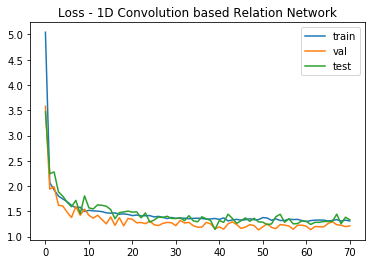

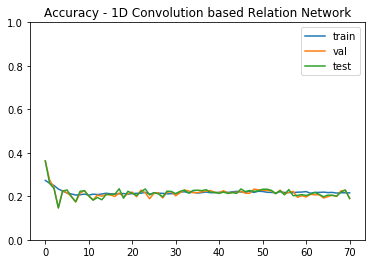

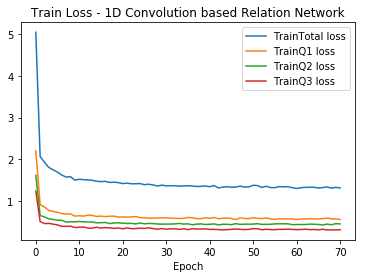

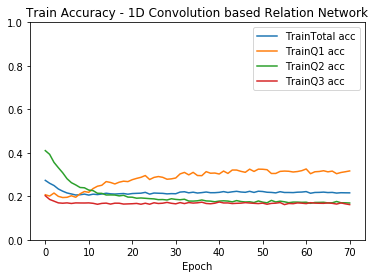

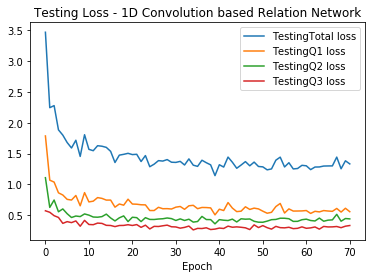

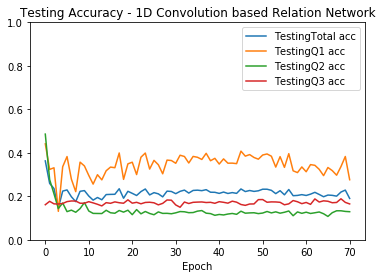

Testing [Total Accuracy] Average of 1D Convolution based Relation Network : 0.2166
Testing [Pairwise Price Change Accuracy] Average of 1D Convolution based Relation Network : 0.3434
Testing [Strength Accuracy] Average of 1D Convolution based Relation Network : 0.1351
Testing [Volatility Accuracy] Average of 1D Convolution based Relation Network : 0.1711
Testing [Total Accuracy] Max. of 1D Convolution based Relation Network : 0.3629
Testing [Pairwise Price Change Accuracy] Max. of 1D Convolution based Relation Network : 0.4412
Testing [Strength Accuracy] Max. of 1D Convolution based Relation Network : 0.4860
Testing [Volatility Accuracy] Max. of 1D Convolution based Relation Network : 0.1886
Testing [Total Accuracy] OveallMax. of 1D Convolution based Relation Network : 0.3629
Testing [Pairwise Price Change Accuracy] OveallMax. of 1D Convolution based Relation Network : 0.4412
Testing [Strength Accuracy] OveallMax. of 1D Convolution based Relation Network : 0.4860
Testing [Volatility Acc

In [20]:
"""""""""
Split data & Train
"""""""""
# 1D Convolution RN
print("[Training 1D Conv based Relation Network model......]")
n_split = 0.05
if question == "embedd":
    mxlen = 3
else:
    mxlen = int(len(temp_c)*2+len(qtype))
    
model = rn_model(lstm_unit, MLP_unit, cnn_last_unit, out_dim, question = question)
print("[Checkpoint for 1D Conv based Relation Network model build]")
    
# 用來存loss
history = {
           "loss":[], "val_loss":[], "test_loss":[], 
           "loss_q1":[], "val_loss_q1":[], "test_loss_q1":[],
           "loss_q2":[], "val_loss_q2":[], "test_loss_q2":[],
           "loss_q3":[], "val_loss_q3":[], "test_loss_q3":[],
           "acc":[], "val_acc":[], "test_acc":[], 
           "acc_q1":[], "val_acc_q1":[], "test_acc_q1":[],
           "acc_q2":[], "val_acc_q2":[], "test_acc_q2":[],
           "acc_q3":[], "val_acc_q3":[], "test_acc_q3":[]
          }

# EarlyStopping loss初始值
earlystopping = 100000
early_initial = 0
                    
for epoch in range(epochs):

    print("[Epoch : " + str((epoch) + 1) + "]")
    # sample data
    print("Balance Sampling...")
    (v, q, a), (v_val, q_val, a_val) = sampler(q_ind, all_com_pair_P, is_train = 1, balance_class = balance_class, show_shape = show_shape)
    (v_test, q_test, a_test) = sampler(q_ind, all_com_pair_P, is_train = 0, balance_class = balance_class, show_shape = show_shape)
    
    print(v.shape, q.shape, a.shape)
    # 2dConv版本處理   
    if model_byconv2d == 1:
        v = np.expand_dims(v, -1)
        v_val = np.expand_dims(v_val, -1)
        v_test = np.expand_dims(v_test, -1)
    print("[Data amount] v_train : " + str(v.shape[0]) + "  v_val : " + str(v_val.shape[0]))

    if question == "onehot":
        print(q.shape, q_val.shape, q_test.shape)
        q = question2onehot(q)
        q_val = question2onehot(q_val)
        q_test = question2onehot(q_test)

    lossNames = ["loss", "q1_out_loss", "q2_out_loss", "q3_out_loss"]
    accNames = ["q1_out_acc", "q2_out_acc", "q3_out_acc"]
    
    # Relation Network model
    if question == "onehot": # TO-DO
        h = model.fit([v, q], a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
        val_loss, val_acc = model.evaluate([v_val, q_val], a_val)
    else:
        if split_comques == 0: # TO-DO
            h = model.fit([v_train, rand_q], rand_a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
            val_loss, val_acc = model.evaluate([v_val, rand_qv], rand_av)

        else:
            if predictmode == 0:
                h = model.fit([v, q[:,:2], q[:,-1]], {"q1_out": a[:,:4], "q2_out": a[:,4:7], "q3_out": a[:,7:]}
                              , epochs = 1, batch_size = batch_size, verbose = 1)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                val_history = model.evaluate([v_val, q_val[:,:2], q_val[:,-1]], {"q1_out": a_val[:,:4], "q2_out": a_val[:,4:7], "q3_out": a_val[:,7:]})
                test_history = model.evaluate([v_test, q_test[:,:2], q_test[:,-1]], {"q1_out": a_test[:,:4], "q2_out": a_test[:,4:7], "q3_out": a_test[:,7:]})
            else:
                a1, a2, a3 = multiOutput(a)
                a1_val, a2_val, a3_val = multiOutput(a_val)
                a1_test, a2_test, a3_test = multiOutput(a_test)

                class_weight = {'q1_out': {0: 1, 1: 1, 2: 1, 3: 1, 4: 0},
                                'q2_out': {0: 1, 1: 1, 2: 1, 3: 0},
                                'q3_out': {0: 1, 1: 1, 2: 1, 3: 0}}

                h = model.fit([v, q[:,:2], q[:,-1]], {"q1_out": a1, "q2_out": a2, "q3_out": a3}
                              , epochs = 1, batch_size = batch_size, verbose = 1, class_weight = class_weight)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                val_history = model.evaluate([v_val, q_val[:,:2], q_val[:,-1]], {"q1_out": a1_val, "q2_out": a2_val, "q3_out": a3_val})
                test_history = model.evaluate([v_test, q_test[:,:2], q_test[:,-1]], {"q1_out": a1_test, "q2_out": a2_test, "q3_out": a3_test})
            
    print("Validation result...")        
    print("val_loss: %.4f" % (val_history[0]))
    print("q1_val_loss: %.4f - q1_val_acc: %.4f " % (val_history[1], val_history[4]))
    print("q2_val_loss: %.4f - q2_val_acc: %.4f " % (val_history[2], val_history[5]))
    print("q3_val_loss: %.4f - q3_val_acc: %.4f " % (val_history[3], val_history[6]))
    print("-----------------------------------------------------")
    print("Test result...")        
    print("test_loss: %.4f" % (test_history[0]))
    print("q1_test_loss: %.4f - q1_test_acc: %.4f " % (test_history[1], test_history[4]))
    print("q2_test_loss: %.4f - q2_test_acc: %.4f " % (test_history[2], test_history[5]))
    print("q3_test_loss: %.4f - q3_test_acc: %.4f " % (test_history[3], test_history[6]))
    print("-----------------------------------------------------")
    
    # save training loss and accuracy
    for i in lossNames:
        if i == "loss":
            history["loss"].append(h.history[i][0])
        else:
            history["loss_"+i.split('_')[0]].append(h.history[i][0])
    acc = 0
    for i in accNames:
        history["acc_"+i.split('_')[0]].append(h.history[i][0])
        acc += h.history[i][0]
        
    history["acc"].append(acc / len(accNames))
            
    # ['loss', 'q1_out_loss', 'q2_out_loss', 'q3_out_loss', 'q1_out_acc', 'q2_out_acc', 'q3_out_acc']
    evaluate_list = model.metrics_names
    # save validation loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            history["val_loss"].append(val_history[0])
        else:
            history["val_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(val_history[idx])
    history["val_acc"].append(np.mean(val_history[-3:]))
    # save testing loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            history["test_loss"].append(test_history[0])
        else:
            history["test_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(test_history[idx])
    history["test_acc"].append(np.mean(test_history[-3:]))
    
    val_loss = val_history[0]
    val_q1_acc = val_history[4]
    val_q2_acc = val_history[5]
    val_q3_acc = val_history[6]
    # 要加EarlyStopping判斷式需加在這裡 (用val loss判斷)
    if earlystopping > val_loss:
        earlystopping = val_loss
        highest_val_q1_acc = val_q1_acc
        highest_val_q2_acc = val_q2_acc
        highest_val_q3_acc = val_q3_acc
        early_initial = 0
    else:
        early_initial = early_initial + 1
    
    # Early Stopping
    if early_initial > patience:
        break

print("[Highest accuracy of validation : q1 - %.4f | q2 - %.4f | q3 - %.4f]" % (highest_val_q1_acc, highest_val_q2_acc, highest_val_q3_acc))

# 改成只存weights就好，因為keras的lambda layer我有透過tensor去reshape size所以如果直接用model.save會出錯
if save == 1:
    model.save_weights('model/rn_modelweights_month' + str(period[0]) + "to" + str(period[-1]) + '_epoch_' + str(epochs) + '_length_' + str(input_length) + "_" + question + "_split" + str(split_comques) + "_qtype" + str(len(qtype)) + '.h5')

    time = str(datetime.datetime.now()).split(' ')[0]
#plot_model(model, to_file = 'relation_network_for_djia30_%s.png' % time)
#model.summary()

# Validation
q1_gues_val, q2_guess_val, q3_guess_val = modelEvaluate(model, v_val, q_val, a_val, split_comques = split_comques)
# Testing
q1_guess_test, q2_guess_test, q3_guess_test = modelEvaluate(model, v_test, q_test, a_test, split_comques = split_comques, mode = "Testing")

# draw loss and accuracy
network = "1D Convolution based Relation Network"
draw_losses(history, network = network)
draw_acc(history, network = network)
draw_splitQuestion_loss(history, network = network)
draw_splitQuestion_acc(history, network = network)
draw_splitQuestion_loss(history, network = network, datasetType = "Testing")
draw_splitQuestion_acc(history, network = network, datasetType = "Testing")

# 平均accuracy for testing
test_mean = np.mean(history["test_acc"])
test_mean_q1 = np.mean(history["test_acc_q1"])
test_mean_q2 = np.mean(history["test_acc_q2"])
test_mean_q3 = np.mean(history["test_acc_q3"])

# test average
print("Testing [Total Accuracy] Average of %s : %.4f"% (network, test_mean))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[0], network, test_mean_q1))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[1], network, test_mean_q2))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[2], network, test_mean_q3))

# test max (training過程出現過最大的accuracy)
print("Testing [Total Accuracy] Max. of %s : %.4f"% (network, np.max(history["test_acc"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[0], network, np.max(history["test_acc_q1"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[1], network, np.max(history["test_acc_q2"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[2], network, np.max(history["test_acc_q3"])))

# test overallmax
idx = np.argmax(history["test_acc"])
print("Testing [Total Accuracy] OveallMax. of %s : %.4f"% (network, np.max(history["test_acc"])))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[0], network, history["test_acc_q1"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[1], network, history["test_acc_q2"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[2], network, history["test_acc_q3"][idx]))

In [21]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 29)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 240, 64)      111424      input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 240, 64)      256         conv1d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 240, 64)      0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv1d_2 (

[Validation Result......]
Shape of v :  (985, 299, 29) q :  (985, 61) predict_result :  (985, 4) (985, 3) (985, 3)
(985, 4)
Validation data's total accuracy : 0.3869 | q1_acc : 0.2972 | q2_acc : 0.3707 | q3_acc : 0.4927
Guess ratio - q1 : 0.2693498452012384 | q2 : 0.3707165109034268 | q3 : 0.4897360703812317
[Testing Result......]
Shape of v :  (3080, 299, 29) q :  (3080, 61) predict_result :  (3080, 4) (3080, 3) (3080, 3)
(3080, 4)
Testing data's total accuracy : 0.3930 | q1_acc : 0.3100 | q2_acc : 0.3706 | q3_acc : 0.4985
Guess ratio - q1 : 0.25430597771023306 | q2 : 0.37243947858473 | q3 : 0.5014720314033366


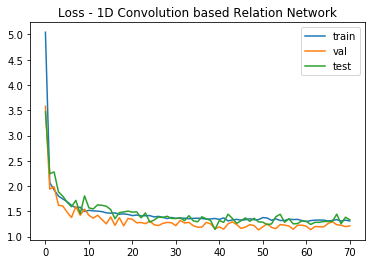

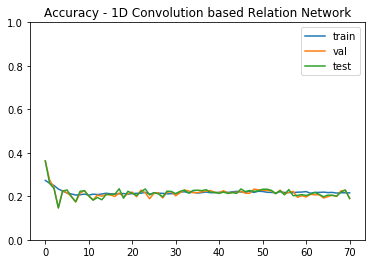

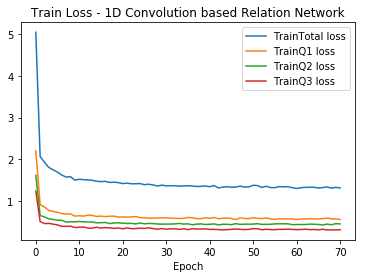

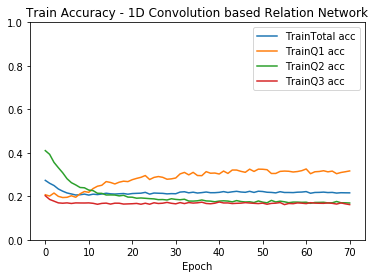

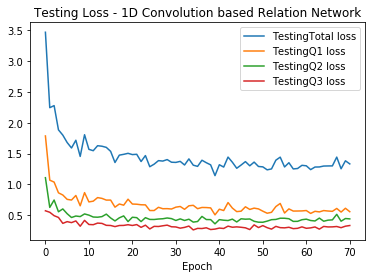

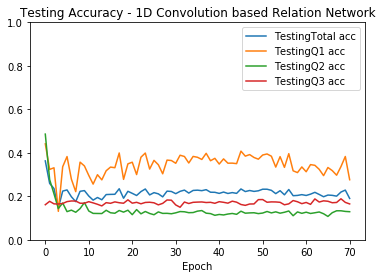

In [22]:
# Validation
q1_gues_val, q2_guess_val, q3_guess_val = modelEvaluate(model, v_val, q_val, a_val, split_comques = split_comques)
# Testing
q1_guess_test, q2_guess_test, q3_guess_test = modelEvaluate(model, v_test, q_test, a_test, split_comques = split_comques, mode = "Testing")

# draw loss and accuracy
network = "1D Convolution based Relation Network"
draw_losses(history, network = network)
draw_acc(history, network = network)
draw_splitQuestion_loss(history, network = network)
draw_splitQuestion_acc(history, network = network)
draw_splitQuestion_loss(history, network = network, datasetType = "Testing")
draw_splitQuestion_acc(history, network = network, datasetType = "Testing")

In [23]:
print(model.metrics_names)
h.history

['loss', 'q1_out_loss', 'q2_out_loss', 'q3_out_loss', 'q1_out_acc', 'q2_out_acc', 'q3_out_acc']


{'loss': [1.309533519010494],
 'q1_out_loss': [0.5521034086207657],
 'q2_out_loss': [0.4491490271850795],
 'q3_out_loss': [0.3082810794885095],
 'q1_out_acc': [0.3166720068640629],
 'q2_out_acc': [0.1692299476536143],
 'q3_out_acc': [0.16186051478749294]}

# 2D Conv based RN

[Training 2D Conv based Relation Network model......]
[Relation Network tensor shape]
feature map shape:  (?, 29, 2, 32)
feature shape :  (?, 29, 32)
feature shape after tagging:  (?, 29, 34)
feature shape :  (?, 29, 32)
feature shape after tagging:  (?, 29, 34)
Object (extracted from feature map) with coordinate shape :  (?, ?)
Each relation's shape :  (?, ?)
Relations list length :  4
Each middle relation shape :  (?, 64)
Middle relation list total length :  4
Whole relation shape :  (?, 64)
[Checkpoint for 2D Conv based Relation Network model build]
[Epoch : 1]
Balance Sampling...
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1573, 1: 1549, 2: 1573, 3: 1517, 4: 1722, 5: 2248, 6: 2259, 7: 17, 8: 3185, 9: 3083}
Q1 amount :  6212  | Q2 amount :  6229  | Q3 amount :  6285
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3342 | Q3 - 0.2577
Resampling for validation data...
Sampling class distribution of each question af

Sampling class distribution of each question after resample : {0: 96, 1: 90, 2: 75, 3: 93, 4: 105, 5: 104, 6: 115, 7: 15, 8: 132, 9: 160}
Q1 amount :  354  | Q2 amount :  324  | Q3 amount :  307
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3051 | Q3 - 0.2076
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 252, 1: 301, 2: 259, 3: 237, 4: 257, 5: 399, 6: 383, 8: 513, 9: 479}
Q1 amount :  1049  | Q2 amount :  1039  | Q3 amount :  992
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3302 | Q3 - 0.4728
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 393us/step
Validation result...
val_loss: 1.1404
q1_val_loss: 0.5002 - q1_val_acc: 0.0822 
q2_val_loss: 0.3605 - q2_val_acc: 0.1157 
q3_val_loss: 0.2797 - q3_val_acc: 0.1360 
-----------------------------------------------------
Test result...
test_loss: 1.1107
q1_test_l

Sampling class distribution of each question after resample : {0: 77, 1: 82, 2: 81, 3: 82, 4: 108, 5: 111, 6: 116, 7: 21, 8: 163, 9: 144}
Q1 amount :  322  | Q2 amount :  335  | Q3 amount :  328
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3468 | Q3 - 0.2857
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 271, 1: 245, 2: 265, 3: 235, 4: 277, 5: 420, 6: 363, 8: 518, 9: 486}
Q1 amount :  1016  | Q2 amount :  1060  | Q3 amount :  1004
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3478 | Q3 - 0.4941
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 392us/step
Validation result...
val_loss: 1.1023
q1_val_loss: 0.4527 - q1_val_acc: 0.2305 
q2_val_loss: 0.3696 - q2_val_acc: 0.0995 
q3_val_loss: 0.2801 - q3_val_acc: 0.1543 
-----------------------------------------------------
Test result...
test_loss: 1.0810
q1_test_

Sampling class distribution of each question after resample : {0: 81, 1: 76, 2: 71, 3: 85, 4: 86, 5: 115, 6: 120, 7: 18, 8: 169, 9: 164}
Q1 amount :  313  | Q2 amount :  321  | Q3 amount :  351
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3419 | Q3 - 0.2987
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 274, 1: 262, 2: 259, 3: 259, 4: 258, 5: 337, 6: 386, 8: 511, 9: 534}
Q1 amount :  1054  | Q2 amount :  981  | Q3 amount :  1045
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3102 | Q3 - 0.4957
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 392us/step
Validation result...
val_loss: 1.0742
q1_val_loss: 0.4383 - q1_val_acc: 0.2954 
q2_val_loss: 0.3486 - q2_val_acc: 0.1340 
q3_val_loss: 0.2872 - q3_val_acc: 0.1726 
-----------------------------------------------------
Test result...
test_loss: 1.0709
q1_test_lo

Sampling class distribution of each question after resample : {0: 92, 1: 84, 2: 93, 3: 74, 4: 98, 5: 108, 6: 107, 7: 16, 8: 150, 9: 163}
Q1 amount :  343  | Q2 amount :  313  | Q3 amount :  329
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3042 | Q3 - 0.2420
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 277, 1: 229, 2: 257, 3: 248, 4: 295, 5: 361, 6: 370, 8: 528, 9: 515}
Q1 amount :  1011  | Q2 amount :  1026  | Q3 amount :  1043
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3383 | Q3 - 0.5158
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 391us/step
Validation result...
val_loss: 1.0877
q1_val_loss: 0.4794 - q1_val_acc: 0.3188 
q2_val_loss: 0.3442 - q2_val_acc: 0.1157 
q3_val_loss: 0.2641 - q3_val_acc: 0.1563 
-----------------------------------------------------
Test result...
test_loss: 1.0611
q1_test_l

Sampling class distribution of each question after resample : {0: 73, 1: 79, 2: 99, 3: 74, 4: 109, 5: 120, 6: 112, 7: 20, 8: 140, 9: 159}
Q1 amount :  325  | Q2 amount :  341  | Q3 amount :  319
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3497 | Q3 - 0.2462
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 254, 1: 272, 2: 265, 3: 243, 4: 282, 5: 353, 6: 394, 8: 487, 9: 530}
Q1 amount :  1034  | Q2 amount :  1029  | Q3 amount :  1017
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3317 | Q3 - 0.4918
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 394us/step
Validation result...
val_loss: 1.0849
q1_val_loss: 0.4511 - q1_val_acc: 0.2904 
q2_val_loss: 0.3725 - q2_val_acc: 0.1147 
q3_val_loss: 0.2612 - q3_val_acc: 0.1503 
-----------------------------------------------------
Test result...
test_loss: 1.0611
q1_test_

Sampling class distribution of each question after resample : {0: 61, 1: 75, 2: 74, 3: 89, 4: 103, 5: 133, 6: 121, 7: 24, 8: 158, 9: 147}
Q1 amount :  299  | Q2 amount :  357  | Q3 amount :  329
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3980 | Q3 - 0.3043
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 229, 1: 238, 2: 252, 3: 251, 4: 290, 5: 357, 6: 402, 8: 495, 9: 566}
Q1 amount :  970  | Q2 amount :  1049  | Q3 amount :  1061
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3605 | Q3 - 0.5469
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 392us/step
Validation result...
val_loss: 1.0799
q1_val_loss: 0.4140 - q1_val_acc: 0.3015 
q2_val_loss: 0.3878 - q2_val_acc: 0.1330 
q3_val_loss: 0.2781 - q3_val_acc: 0.1675 
-----------------------------------------------------
Test result...
test_loss: 1.0457
q1_test_l

Sampling class distribution of each question after resample : {0: 82, 1: 73, 2: 82, 3: 79, 4: 101, 5: 114, 6: 130, 7: 11, 8: 151, 9: 162}
Q1 amount :  316  | Q2 amount :  345  | Q3 amount :  324
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3639 | Q3 - 0.2563
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 264, 1: 248, 2: 248, 3: 249, 4: 253, 5: 363, 6: 415, 8: 505, 9: 535}
Q1 amount :  1009  | Q2 amount :  1031  | Q3 amount :  1040
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3406 | Q3 - 0.5154
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 392us/step
Validation result...
val_loss: 1.0710
q1_val_loss: 0.4417 - q1_val_acc: 0.3391 
q2_val_loss: 0.3762 - q2_val_acc: 0.1228 
q3_val_loss: 0.2531 - q3_val_acc: 0.1523 
-----------------------------------------------------
Test result...
test_loss: 1.0497
q1_test_

Sampling class distribution of each question after resample : {0: 88, 1: 73, 2: 103, 3: 72, 4: 94, 5: 111, 6: 124, 7: 18, 8: 173, 9: 129}
Q1 amount :  336  | Q2 amount :  329  | Q3 amount :  320
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3264 | Q3 - 0.2842
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 245, 1: 264, 2: 235, 3: 233, 4: 286, 5: 408, 6: 395, 8: 522, 9: 492}
Q1 amount :  977  | Q2 amount :  1089  | Q3 amount :  1014
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3715 | Q3 - 0.5189
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 390us/step
Validation result...
val_loss: 1.0864
q1_val_loss: 0.4705 - q1_val_acc: 0.3096 
q2_val_loss: 0.3570 - q2_val_acc: 0.1249 
q3_val_loss: 0.2589 - q3_val_acc: 0.1492 
-----------------------------------------------------
Test result...
test_loss: 1.0487
q1_test_l

Sampling class distribution of each question after resample : {0: 81, 1: 90, 2: 81, 3: 80, 4: 86, 5: 123, 6: 111, 7: 16, 8: 165, 9: 152}
Q1 amount :  332  | Q2 amount :  320  | Q3 amount :  333
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3213 | Q3 - 0.2726
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 268, 1: 237, 2: 253, 3: 269, 4: 261, 5: 420, 6: 369, 8: 498, 9: 505}
Q1 amount :  1027  | Q2 amount :  1050  | Q3 amount :  1003
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3408 | Q3 - 0.4883
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 1s 394us/step
Validation result...
val_loss: 1.0706
q1_val_loss: 0.4627 - q1_val_acc: 0.3127 
q2_val_loss: 0.3441 - q2_val_acc: 0.1147 
q3_val_loss: 0.2639 - q3_val_acc: 0.1787 
-----------------------------------------------------
Test result...
test_loss: 1.0541
q1_test_l

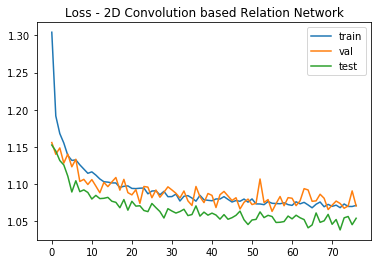

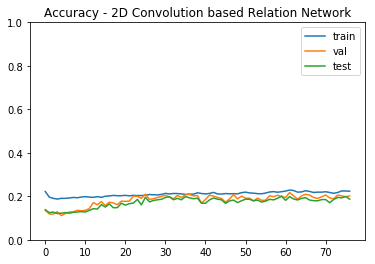

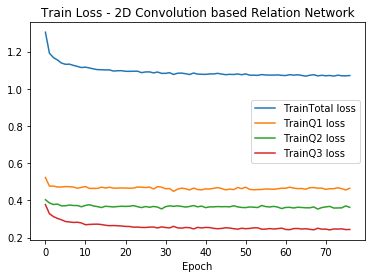

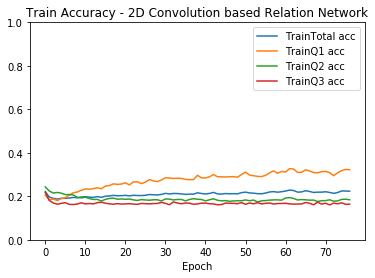

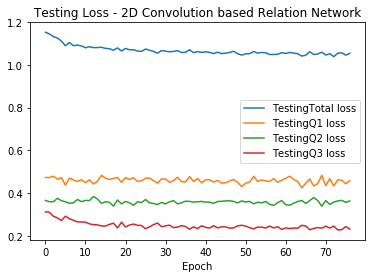

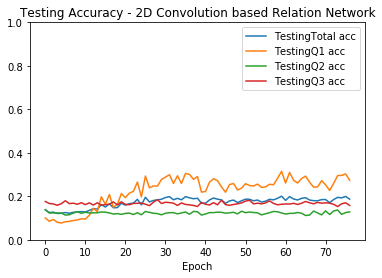

Testing [Total Accuracy] Average of 2D Convolution based Relation Network : 0.1718
Testing [Pairwise Price Change Accuracy] Average of 2D Convolution based Relation Network : 0.2253
Testing [Strength Accuracy] Average of 2D Convolution based Relation Network : 0.1233
Testing [Volatility Accuracy] Average of 2D Convolution based Relation Network : 0.1668
Testing [Total Accuracy] Max. of 2D Convolution based Relation Network : 0.2005
Testing [Pairwise Price Change Accuracy] Max. of 2D Convolution based Relation Network : 0.4412
Testing [Strength Accuracy] Max. of 2D Convolution based Relation Network : 0.4860
Testing [Volatility Accuracy] Max. of 2D Convolution based Relation Network : 0.1886
Testing [Total Accuracy] OveallMax. of 2D Convolution based Relation Network : 0.2005
Testing [Pairwise Price Change Accuracy] OveallMax. of 2D Convolution based Relation Network : 0.3146
Testing [Strength Accuracy] OveallMax. of 2D Convolution based Relation Network : 0.1234
Testing [Volatility Acc

In [24]:
#==============================================================================
# Training data preprocess
#==============================================================================
model_byconv2d = 1
"""""""""
Split data & Train
"""""""""
# 2D Convolution RN
print("[Training 2D Conv based Relation Network model......]")
n_split = 0.05
if question == "embedd":
    mxlen = 3
else:
    mxlen = int(len(temp_c)*2+len(qtype))
    
model_2d = rn_model(lstm_unit, MLP_unit, cnn_last_unit, out_dim, question = question)
print("[Checkpoint for 2D Conv based Relation Network model build]")
    
# 用來存loss
history_2d = {
           "loss":[], "val_loss":[], "test_loss":[], 
           "loss_q1":[], "val_loss_q1":[], "test_loss_q1":[],
           "loss_q2":[], "val_loss_q2":[], "test_loss_q2":[],
           "loss_q3":[], "val_loss_q3":[], "test_loss_q3":[],
           "acc":[], "val_acc":[], "test_acc":[], 
           "acc_q1":[], "val_acc_q1":[], "test_acc_q1":[],
           "acc_q2":[], "val_acc_q2":[], "test_acc_q2":[],
           "acc_q3":[], "val_acc_q3":[], "test_acc_q3":[]
          }

# EarlyStopping loss初始值
earlystopping = 100000
early_initial = 0
                    
for epoch in range(epochs):

    print("[Epoch : " + str((epoch) + 1) + "]")
    # sample data
    print("Balance Sampling...")
    (v, q, a), (v_val, q_val, a_val) = sampler(q_ind, all_com_pair_P, is_train = 1, balance_class = balance_class, show_shape = show_shape)
    (v_test, q_test, a_test) = sampler(q_ind, all_com_pair_P, is_train = 0, balance_class = balance_class, show_shape = show_shape)
    
    print(v.shape, q.shape, a.shape)
    # 2dConv版本處理   
    if model_byconv2d == 1:
        v = v.transpose(0,2,1)
        v_val = v_val.transpose(0,2,1)
        v_test = v_test.transpose(0,2,1)
        v = np.expand_dims(v, -1)
        v_val = np.expand_dims(v_val, -1)
        v_test = np.expand_dims(v_test, -1)
    print("[Data amount] v_train : " + str(v.shape[0]) + "  v_val : " + str(v_val.shape[0]))

    if question == "onehot":
        print(q.shape, q_val.shape, q_test.shape)
        q = question2onehot(q)
        q_val = question2onehot(q_val)
        q_test = question2onehot(q_test)

    lossNames = ["loss", "q1_out_loss", "q2_out_loss", "q3_out_loss"]
    accNames = ["q1_out_acc", "q2_out_acc", "q3_out_acc"]
    
    # Relation Network model
    if question == "onehot": # TO-DO
        h = model_2d.fit([v, q], a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
        val_loss, val_acc = model_2d.evaluate([v_val, q_val], a_val)
    else:
        if split_comques == 0: # TO-DO
            h = model_2d.fit([v_train, rand_q], rand_a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
            val_loss, val_acc = model_2d.evaluate([v_val, rand_qv], rand_av)

        else:
            if predictmode == 0:
                h = model_2d.fit([v, q[:,:2], q[:,-1]], {"q1_out": a[:,:4], "q2_out": a[:,4:7], "q3_out": a[:,7:]}
                              , epochs = 1, batch_size = batch_size, verbose = 1)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                val_history = model_2d.evaluate([v_val, q_val[:,:2], q_val[:,-1]], {"q1_out": a_val[:,:4], "q2_out": a_val[:,4:7], "q3_out": a_val[:,7:]})
                test_history = model_2d.evaluate([v_test, q_test[:,:2], q_test[:,-1]], {"q1_out": a_test[:,:4], "q2_out": a_test[:,4:7], "q3_out": a_test[:,7:]})
            else:
                a1, a2, a3 = multiOutput(a)
                a1_val, a2_val, a3_val = multiOutput(a_val)
                a1_test, a2_test, a3_test = multiOutput(a_test)

                class_weight = {'q1_out': {0: 1, 1: 1, 2: 1, 3: 1, 4: 0},
                                'q2_out': {0: 1, 1: 1, 2: 1, 3: 0},
                                'q3_out': {0: 1, 1: 1, 2: 1, 3: 0}}

                h = model_2d.fit([v, q[:,:2], q[:,-1]], {"q1_out": a1, "q2_out": a2, "q3_out": a3}
                              , epochs = 1, batch_size = batch_size, verbose = 1, class_weight = class_weight)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                
                val_history = model_2d.evaluate([v_val, q_val[:,:2], q_val[:,-1]], {"q1_out": a1_val, "q2_out": a2_val, "q3_out": a3_val})
                test_history = model_2d.evaluate([v_test, q_test[:,:2], q_test[:,-1]], {"q1_out": a1_test, "q2_out": a2_test, "q3_out": a3_test})
    
    print("Validation result...")        
    print("val_loss: %.4f" % (val_history[0]))
    print("q1_val_loss: %.4f - q1_val_acc: %.4f " % (val_history[1], val_history[4]))
    print("q2_val_loss: %.4f - q2_val_acc: %.4f " % (val_history[2], val_history[5]))
    print("q3_val_loss: %.4f - q3_val_acc: %.4f " % (val_history[3], val_history[6]))
    print("-----------------------------------------------------")
    print("Test result...")        
    print("test_loss: %.4f" % (test_history[0]))
    print("q1_test_loss: %.4f - q1_test_acc: %.4f " % (test_history[1], test_history[4]))
    print("q2_test_loss: %.4f - q2_test_acc: %.4f " % (test_history[2], test_history[5]))
    print("q3_test_loss: %.4f - q3_test_acc: %.4f " % (test_history[3], test_history[6]))
    print("-----------------------------------------------------")
    
    # save training loss and accuracy
    for i in lossNames:
        if i == "loss":
            history_2d["loss"].append(h.history[i][0])
        else:
            history_2d["loss_"+i.split('_')[0]].append(h.history[i][0])
    acc = 0
    for i in accNames:
        history_2d["acc_"+i.split('_')[0]].append(h.history[i][0])
        acc += h.history[i][0]
        
    history_2d["acc"].append(acc / len(accNames))
            
    # ['loss', 'q1_out_loss', 'q2_out_loss', 'q3_out_loss', 'q1_out_acc', 'q2_out_acc', 'q3_out_acc']
    evaluate_list = model_2d.metrics_names
    # save validation loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            history_2d["val_loss"].append(val_history[0])
        else:
            history_2d["val_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(val_history[idx])
    history_2d["val_acc"].append(np.mean(val_history[-3:]))
    # save testing loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            history_2d["test_loss"].append(test_history[0])
        else:
            history_2d["test_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(test_history[idx])
    history_2d["test_acc"].append(np.mean(test_history[-3:]))
    
    val_loss = val_history[0]
    val_q1_acc = val_history[4]
    val_q2_acc = val_history[5]
    val_q3_acc = val_history[6]
    # 要加EarlyStopping判斷式需加在這裡 (用val loss判斷)
    if earlystopping > val_loss:
        earlystopping = val_loss
        highest_val_q1_acc = val_q1_acc
        highest_val_q2_acc = val_q2_acc
        highest_val_q3_acc = val_q3_acc
        early_initial = 0
    else:
        early_initial = early_initial + 1
    
    # Early Stopping
    if early_initial > patience:
        break

print("[Highest accuracy of validation : q1 - %.4f | q2 - %.4f | q3 - %.4f]" % (highest_val_q1_acc, highest_val_q2_acc, highest_val_q3_acc))

# 只存weights，因為keras的lambda layer我有透過tensor去reshape size所以如果直接用model.save會出錯
if save == 1:
    model_2d.save_weights('model/rn_model_2D_weights_month' + str(period[0]) + "to" + str(period[-1]) + '_epoch_' + str(epochs) + '_length_' + str(input_length) + "_" + question + "_split" + str(split_comques) + "_qtype" + str(len(qtype)) + '.h5')

time = str(datetime.datetime.now()).split(' ')[0]
#plot_model(model_2d, to_file = 'relation_network_2D_for_djia30_%s.png' % time)
#model.summary()

# Validation
q1_gues_val, q2_guess_val, q3_guess_val = modelEvaluate(model_2d, v_val, q_val, a_val, split_comques = split_comques)
# Testing
q1_guess_test, q2_guess_test, q3_guess_test = modelEvaluate(model_2d, v_test, q_test, a_test, split_comques = split_comques, mode = "Testing")

# draw loss and accuracy
network = "2D Convolution based Relation Network"
draw_losses(history_2d, network = network)
draw_acc(history_2d, network = network)
draw_splitQuestion_loss(history_2d, network = network)
draw_splitQuestion_acc(history_2d, network = network)
draw_splitQuestion_loss(history_2d, network = network, datasetType = "Testing")
draw_splitQuestion_acc(history_2d, network = network, datasetType = "Testing")

# 平均accuracy for testing
test_mean = np.mean(history_2d["test_acc"])
test_mean_q1 = np.mean(history_2d["test_acc_q1"])
test_mean_q2 = np.mean(history_2d["test_acc_q2"])
test_mean_q3 = np.mean(history_2d["test_acc_q3"])

# test average
print("Testing [Total Accuracy] Average of %s : %.4f"% (network, test_mean))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[0], network, test_mean_q1))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[1], network, test_mean_q2))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[2], network, test_mean_q3))

# test max
print("Testing [Total Accuracy] Max. of %s : %.4f"% (network, np.max(history_2d["test_acc"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[0], network, np.max(history["test_acc_q1"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[1], network, np.max(history["test_acc_q2"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[2], network, np.max(history["test_acc_q3"])))

# test overallmax
idx = np.argmax(history_2d["test_acc"])
print("Testing [Total Accuracy] OveallMax. of %s : %.4f"% (network, np.max(history_2d["test_acc"])))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[0], network, history_2d["test_acc_q1"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[1], network, history_2d["test_acc_q2"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[2], network, history_2d["test_acc_q3"][idx]))

In [25]:
model_2d.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 29, 299, 1)   0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 29, 240, 64)  3904        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_8 (BatchNor (None, 29, 240, 64)  256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_10 (Activation)      (None, 29, 240, 64)  0           batch_normalization_8[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

# Benchmark (Deep learning baseline)

[Training benchmark model ......]
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 299, 29)      0                                            
__________________________________________________________________________________________________
flatten_7 (Flatten)             (None, 8671)         0           input_7[0][0]                    
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 61)           0                                            
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 8732)         0           flatten_7[0][0]                  
                                                                 input_8[0]

3080/3080 [==============================] - 0s 110us/step
Validation result...
val_loss: 1.1791
q1_val_loss: 0.5087 - q1_val_acc: 0.0975 
q2_val_loss: 0.3547 - q2_val_acc: 0.1168 
q3_val_loss: 0.3157 - q3_val_acc: 0.2223 
-----------------------------------------------------
Test result...
test_loss: 0.9779
q1_test_loss: 0.4704 - q1_test_acc: 0.0987 
q2_test_loss: 0.3669 - q2_test_acc: 0.1195 
q3_test_loss: 0.1407 - q3_test_acc: 0.2620 
-----------------------------------------------------
[Epoch : 4]
Balance Sampling...
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1573, 1: 1552, 2: 1595, 3: 1592, 4: 1672, 5: 2204, 6: 2246, 7: 16, 8: 3101, 9: 3175}
Q1 amount :  6312  | Q2 amount :  6122  | Q3 amount :  6292
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3233 | Q3 - 0.2469
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 75, 1: 82, 2: 77, 3: 82, 4: 103, 5: 120, 6: 

Sampling class distribution of each question after resample : {0: 75, 1: 98, 2: 78, 3: 92, 4: 85, 5: 120, 6: 107, 7: 19, 8: 155, 9: 156}
Q1 amount :  343  | Q2 amount :  312  | Q3 amount :  330
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3032 | Q3 - 0.2536
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 263, 1: 259, 2: 220, 3: 277, 4: 277, 5: 394, 6: 372, 8: 481, 9: 537}
Q1 amount :  1019  | Q2 amount :  1043  | Q3 amount :  1018
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3412 | Q3 - 0.4995
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 0s 106us/step
Validation result...
val_loss: 1.0973
q1_val_loss: 0.4834 - q1_val_acc: 0.2355 
q2_val_loss: 0.3437 - q2_val_acc: 0.1147 
q3_val_loss: 0.2703 - q3_val_acc: 0.2599 
-----------------------------------------------------
Test result...
test_loss: 0.9664
q1_test_l

Sampling class distribution of each question after resample : {0: 95, 1: 88, 2: 76, 3: 82, 4: 106, 5: 114, 6: 113, 7: 6, 8: 153, 9: 152}
Q1 amount :  341  | Q2 amount :  333  | Q3 amount :  311
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3255 | Q3 - 0.2331
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 304, 1: 261, 2: 253, 3: 230, 4: 275, 5: 389, 6: 382, 8: 479, 9: 507}
Q1 amount :  1048  | Q2 amount :  1046  | Q3 amount :  986
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3327 | Q3 - 0.4704
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 0s 109us/step
Validation result...
val_loss: 1.0309
q1_val_loss: 0.4774 - q1_val_acc: 0.3695 
q2_val_loss: 0.3709 - q2_val_acc: 0.1157 
q3_val_loss: 0.1827 - q3_val_acc: 0.2447 
-----------------------------------------------------
Test result...
test_loss: 0.9733
q1_test_lo

Sampling class distribution of each question after resample : {0: 77, 1: 74, 2: 79, 3: 78, 4: 101, 5: 105, 6: 119, 7: 19, 8: 159, 9: 174}
Q1 amount :  308  | Q2 amount :  325  | Q3 amount :  352
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3517 | Q3 - 0.2890
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 271, 1: 253, 2: 224, 3: 265, 4: 301, 5: 361, 6: 375, 8: 510, 9: 520}
Q1 amount :  1013  | Q2 amount :  1037  | Q3 amount :  1030
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3412 | Q3 - 0.5084
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 0s 110us/step
Validation result...
val_loss: 1.0881
q1_val_loss: 0.4317 - q1_val_acc: 0.3391 
q2_val_loss: 0.3597 - q2_val_acc: 0.2132 
q3_val_loss: 0.2968 - q3_val_acc: 0.2680 
-----------------------------------------------------
Test result...
test_loss: 0.9566
q1_test_

Sampling class distribution of each question after resample : {0: 64, 1: 78, 2: 88, 3: 78, 4: 131, 5: 117, 6: 123, 7: 16, 8: 136, 9: 154}
Q1 amount :  308  | Q2 amount :  371  | Q3 amount :  306
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.4015 | Q3 - 0.2468
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 242, 1: 255, 2: 246, 3: 253, 4: 251, 5: 374, 6: 399, 8: 523, 9: 537}
Q1 amount :  996  | Q2 amount :  1024  | Q3 amount :  1060
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3427 | Q3 - 0.5321
(18726, 299, 29) (18726, 61) (18726, 10)
[Data amount] v_train : 18726  v_val : 985
Epoch 1/1
3080/3080 [==============================] - 0s 117us/step
Validation result...
val_loss: 1.0739
q1_val_loss: 0.4304 - q1_val_acc: 0.3340 
q2_val_loss: 0.4102 - q2_val_acc: 0.2122 
q3_val_loss: 0.2333 - q3_val_acc: 0.2284 
-----------------------------------------------------
Test result...
test_loss: 0.9524
q1_test_l

Shape of v :  (985, 299, 29) q :  (985, 61) predict_result :  (985, 4) (985, 3) (985, 3)
(985, 4)
Validation data's total accuracy : 0.3783 | q1_acc : 0.2804 | q2_acc : 0.3502 | q3_acc : 0.5043
Guess ratio - q1 : 0.27414330218068533 | q2 : 0.35331230283911674 | q3 : 0.5072046109510087
[Testing Result......]
Shape of v :  (3080, 299, 29) q :  (3080, 61) predict_result :  (3080, 4) (3080, 3) (3080, 3)
(3080, 4)
Testing data's total accuracy : 0.3883 | q1_acc : 0.2780 | q2_acc : 0.3806 | q3_acc : 0.5063
Guess ratio - q1 : 0.27121951219512197 | q2 : 0.3806262230919765 | q3 : 0.5091965150048403


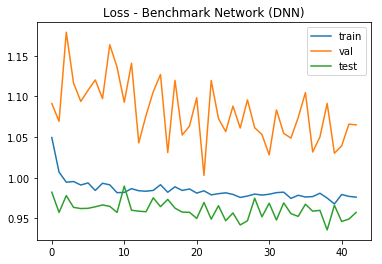

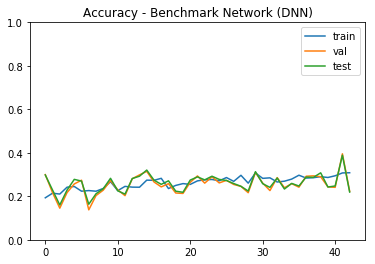

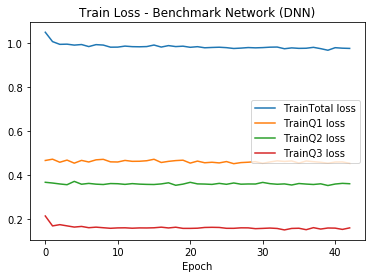

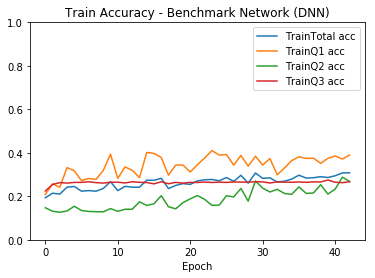

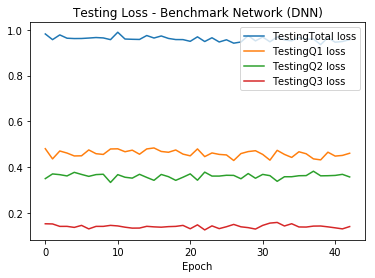

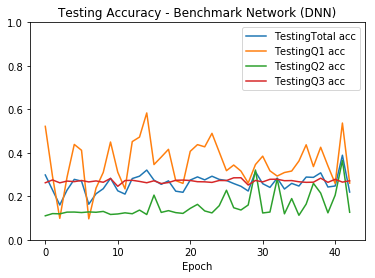

Testing [Total Accuracy] Average of Benchmark Network (DNN) : 0.2595
Testing [Pairwise Price Change Accuracy] Average of Benchmark Network (DNN) : 0.3535
Testing [Strength Accuracy] Average of Benchmark Network (DNN) : 0.1555
Testing [Volatility Accuracy] Average of Benchmark Network (DNN) : 0.2697
Testing [Total Accuracy] Max. of Benchmark Network (DNN) : 0.3890
Testing [Pairwise Price Change Accuracy] Max. of Benchmark Network (DNN) : 0.5834
Testing [Strength Accuracy] Max. of Benchmark Network (DNN) : 0.3646
Testing [Volatility Accuracy] Max. of Benchmark Network (DNN) : 0.2854
Testing [Total Accuracy] OveallMax. of Benchmark Network (DNN) : 0.3890
Testing [Pairwise Price Change Accuracy] OveallMax. of Benchmark Network (DNN) : 0.5370
Testing [Strength Accuracy] OveallMax. of Benchmark Network (DNN) : 0.3646
Testing [Volatility Accuracy] OveallMax. of Benchmark Network (DNN) : 0.2653


In [26]:
"""""""""""""""
benchmark model
"""""""""""""""
print("[Training benchmark model ......]")
bm = 1
condition = 1
# benchmark的V吃多間公司的資料
bmV_only_twocom = 0
bm_mode = "thesis"
    
bm_model = benchmarkModel(MLP_unit, cnn_last_unit, out_dim, mxlen = int(len(temp_c)*2+len(qtype)), question = question, condition = condition, mode = bm_mode)
bm_model.summary()
print("[Checkpoint for Benchmark model build]")

# 用來存loss
bm_history = {
           "loss":[], "val_loss":[], "test_loss":[], 
           "loss_q1":[], "val_loss_q1":[], "test_loss_q1":[],
           "loss_q2":[], "val_loss_q2":[], "test_loss_q2":[],
           "loss_q3":[], "val_loss_q3":[], "test_loss_q3":[],
           "acc":[], "val_acc":[], "test_acc":[], 
           "acc_q1":[], "val_acc_q1":[], "test_acc_q1":[],
           "acc_q2":[], "val_acc_q2":[], "test_acc_q2":[],
           "acc_q3":[], "val_acc_q3":[], "test_acc_q3":[]
          }

# EarlyStopping loss初始值
earlystopping = 100000
early_initial = 0
                    
for epoch in range(epochs):

    print("[Epoch : " + str((epoch) + 1) + "]")
    # sample data
    print("Balance Sampling...")
    (v, q, a), (v_val, q_val, a_val) = sampler(q_ind, all_com_pair_P, is_train = 1, balance_class = balance_class, show_shape = show_shape)
    (v_test, q_test, a_test) = sampler(q_ind, all_com_pair_P, is_train = 0, balance_class = balance_class, show_shape = show_shape)
    
    print(v.shape, q.shape, a.shape)
    if bm_mode == "base":
        # 2dConv版本處理   
        if model_byconv2d == 1:
            v = np.expand_dims(v, -1)
            v_val = np.expand_dims(v_val, -1)
            v_test = np.expand_dims(v_test, -1)
    print("[Data amount] v_train : " + str(v.shape[0]) + "  v_val : " + str(v_val.shape[0]))

    if question == "onehot":
        print(q.shape, q_val.shape, q_test.shape)
        q = question2onehot(q)
        q_val = question2onehot(q_val)
        q_test = question2onehot(q_test)

    lossNames = ["loss", "q1_out_loss", "q2_out_loss", "q3_out_loss"]
    accNames = ["q1_out_acc", "q2_out_acc", "q3_out_acc"]
    
    # Relation Network model
    if question == "onehot": # TO-DO
        h = bm_model.fit([v, q], a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
        val_loss, val_acc = bm_model.evaluate([v_val, q_val], a_val)
    else:
        if split_comques == 0: # TO-DO
            h = bm_model.fit([v_train, rand_q], rand_a, epochs = 1, batch_size = batch_size, verbose = 2)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
            val_loss, val_acc = bm_model.evaluate([v_val, rand_qv], rand_av)

        else:
            if condition == 1:
                if predictmode == 0:
                    h = bm_model.fit([v, q], {"q1_out": a[:,:4], "q2_out": a[:,4:7], "q3_out": a[:,7:]}
                                  , epochs = 1, batch_size = batch_size, verbose = 1)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                    val_history = bm_model.evaluate([v_val, q_val], {"q1_out": a_val[:,:4], "q2_out": a_val[:,4:7], "q3_out": a_val[:,7:]})
                    test_history = bm_model.evaluate([v_test, q_test], {"q1_out": a_test[:,:4], "q2_out": a_test[:,4:7], "q3_out": a_test[:,7:]})
                else:
                    a1, a2, a3 = multiOutput(a)
                    a1_val, a2_val, a3_val = multiOutput(a_val)
                    a1_test, a2_test, a3_test = multiOutput(a_test)

                    class_weight = {'q1_out': {0: 1, 1: 1, 2: 1, 3: 1, 4: 0},
                                'q2_out': {0: 1, 1: 1, 2: 1, 3: 0},
                                'q3_out': {0: 1, 1: 1, 2: 1, 3: 0}}

                    h = bm_model.fit([v, q], {"q1_out": a1, "q2_out": a2, "q3_out": a3}
                                  , epochs = 1, batch_size = batch_size, verbose = 1, class_weight = class_weight)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                    
                    val_history = bm_model.evaluate([v_val, q_val], {"q1_out": a1_val, "q2_out": a2_val, "q3_out": a3_val})
                    test_history = bm_model.evaluate([v_test, q_test], {"q1_out": a1_test, "q2_out": a2_test, "q3_out": a3_test})
            else:
                h = bm_model.fit(v, {"q1_out": a[:,:4], "q2_out": a[:,4:7], "q3_out": a[:,7:]}
                              , epochs = 1, batch_size = batch_size, verbose = 1)#, callbacks = [EarlyStopping(monitor='val_loss', patience = 20, verbose=0)])
                val_history = bm_model.evaluate(v_val, {"q1_out": a_val[:,:4], "q2_out": a_val[:,4:7], "q3_out": a_val[:,7:]})
                test_history = bm_model.evaluate(v_test, {"q1_out": a_test[:,:4], "q2_out": a_test[:,4:7], "q3_out": a_test[:,7:]})
    
    print("Validation result...")        
    print("val_loss: %.4f" % (val_history[0]))
    print("q1_val_loss: %.4f - q1_val_acc: %.4f " % (val_history[1], val_history[4]))
    print("q2_val_loss: %.4f - q2_val_acc: %.4f " % (val_history[2], val_history[5]))
    print("q3_val_loss: %.4f - q3_val_acc: %.4f " % (val_history[3], val_history[6]))
    print("-----------------------------------------------------")
    print("Test result...")        
    print("test_loss: %.4f" % (test_history[0]))
    print("q1_test_loss: %.4f - q1_test_acc: %.4f " % (test_history[1], test_history[4]))
    print("q2_test_loss: %.4f - q2_test_acc: %.4f " % (test_history[2], test_history[5]))
    print("q3_test_loss: %.4f - q3_test_acc: %.4f " % (test_history[3], test_history[6]))
    print("-----------------------------------------------------")
    
    # save training loss and accuracy
    for i in lossNames:
        if i == "loss":
            bm_history["loss"].append(h.history[i][0])
        else:
            bm_history["loss_"+i.split('_')[0]].append(h.history[i][0])
    acc = 0
    for i in accNames:
        bm_history["acc_"+i.split('_')[0]].append(h.history[i][0])
        acc += h.history[i][0]
        
    bm_history["acc"].append(acc / len(accNames))

            
    # ['loss', 'q1_out_loss', 'q2_out_loss', 'q3_out_loss', 'q1_out_acc', 'q2_out_acc', 'q3_out_acc']
    evaluate_list = bm_model.metrics_names
    # save validation loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            bm_history["val_loss"].append(val_history[0])
        else:
            bm_history["val_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(val_history[idx])
    bm_history["val_acc"].append(np.mean(val_history[-3:]))
    # save testing loss and accuracy
    for idx,i in enumerate(evaluate_list):
        if i == "loss":
            bm_history["test_loss"].append(test_history[0])
        else:
            bm_history["test_%s_%s" % (i.split('_')[-1], i.split('_')[0])].append(test_history[idx])
    bm_history["test_acc"].append(np.mean(test_history[-3:]))
    
    val_loss = val_history[0]
    val_q1_acc = val_history[4]
    val_q2_acc = val_history[5]
    val_q3_acc = val_history[6]
    # 要加EarlyStopping判斷式需加在這裡 (用val loss判斷)
    if earlystopping > val_loss:
        earlystopping = val_loss
        highest_val_q1_acc = val_q1_acc
        highest_val_q2_acc = val_q2_acc
        highest_val_q3_acc = val_q3_acc
        early_initial = 0
    else:
        early_initial = early_initial + 1
    
    # Early Stopping
    if early_initial > patience:
        break

print("[Highest accuracy of validation : q1 - %.4f | q2 - %.4f | q3 - %.4f]" % (highest_val_q1_acc, highest_val_q2_acc, highest_val_q3_acc))

if save == 1:
    bm_model.save('model/benchmark_model_month' + str(period[0]) + "to" + str(period[-1]) + '_epoch_' + str(epochs) + '_length_' + str(input_length) + "_" + question + "_split" + str(split_comques) + "_qtype" + str(len(qtype)) + '.h5')

time = str(datetime.datetime.now()).split(' ')[0]
#plot_model(bm_model, to_file = 'benchmark_network_%s_for_djia30_%s.png' % (bm_mode, time))
bm_model.summary()

# Validation
q1_gues_val, q2_guess_val, q3_guess_val = modelEvaluate(bm_model, v_val, q_val, a_val, split_comques = split_comques, bm = 1, condition = condition)
# Testing
q1_guess_test, q2_guess_test, q3_guess_test = modelEvaluate(bm_model, v_test, q_test, a_test, split_comques = split_comques, bm = 1, condition = condition, mode = "Testing")

# draw loss and accuracy
network = "Benchmark Network (DNN)"
draw_losses(bm_history, network = network)
draw_acc(bm_history, network = network)
draw_splitQuestion_loss(bm_history, network = network)
draw_splitQuestion_acc(bm_history, network = network)
draw_splitQuestion_loss(bm_history, network = network, datasetType = "Testing")
draw_splitQuestion_acc(bm_history, network = network, datasetType = "Testing")

# 平均accuracy for testing
test_mean = np.mean(bm_history["test_acc"])
test_mean_q1 = np.mean(bm_history["test_acc_q1"])
test_mean_q2 = np.mean(bm_history["test_acc_q2"])
test_mean_q3 = np.mean(bm_history["test_acc_q3"])

# test average
print("Testing [Total Accuracy] Average of %s : %.4f"% (network, test_mean))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[0], network, test_mean_q1))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[1], network, test_mean_q2))
print("Testing [%s Accuracy] Average of %s : %.4f"% (question_type[2], network, test_mean_q3))

# test max
print("Testing [Total Accuracy] Max. of %s : %.4f"% (network, np.max(bm_history["test_acc"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[0], network, np.max(bm_history["test_acc_q1"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[1], network, np.max(bm_history["test_acc_q2"])))
print("Testing [%s Accuracy] Max. of %s : %.4f"% (question_type[2], network, np.max(bm_history["test_acc_q3"])))

# test overallmax
idx = np.argmax(bm_history["test_acc"])
print("Testing [Total Accuracy] OveallMax. of %s : %.4f"% (network, np.max(bm_history["test_acc"])))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[0], network, bm_history["test_acc_q1"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[1], network, bm_history["test_acc_q2"][idx]))
print("Testing [%s Accuracy] OveallMax. of %s : %.4f"% (question_type[2], network, bm_history["test_acc_q3"][idx]))

# Pairs Trading Experiment
## 設計pairs trading實驗
### 算pairs-trading return的方法
* https://quant.stackexchange.com/questions/7488/what-is-the-proper-way-to-calculate-returns-for-pair-trading
* 在我的例子就是把兩個初始價格相加，計算兩支股票各自的價差(清算價格 - 初始價格)，然後(價差 / 初始價格相加) * 100
* long, short兩支股票的購買金額應該一樣 (A == B * ratio(B/A))，如果A是100塊，那B也要是100塊

'''
美股交易稅：稅金很低，僅0.0000231 (2017)
新制參考：https://etfs.tw/sec-fee/　（我的資料還不用用到這個，用0.0013%就好）
'''

In [27]:
def rolling(data, price_and_return, window, shift, day, mode = 'return', show_shape = 0):    # 後面的數字是資料的第幾天
    """
    # rolling data，產生V和A的frame
    ---
    Inputs : 
    data - 價格 (只是要他的當日交易秒數也就是23400當作shape)
    price_and_return - 所有公司所有交易日的price、return data還有漲跌幅
    window : 要看過去多少時間的歷史資料 (我的case = 300)
    shift : 每一個frame overlap的時間長度 (我的case = 150)
    day : 哪一個交易日
    mode : 決定rolling的資料型態(price, return, change)
    Outputs:
    v_data : 過去一段時間的公司資訊 (shape = 公司數 x 時間長度, ex : 29 * 299)
    v_answer_data : 未來一段時間的公司資訊 (shape = 公司數 x 時間長度, ex : 29 * 59)
    position : 紀錄交易日、起始、終止時間
    """
    rolling_data = {}
    position = []
    input_length = window + shift
    shift_length = shift
    if show_shape == 1:
        print("------Rolling for %s ------" % mode)
        print("window size : %s" % window)
        print("shift length : %s" % shift)
    
    # 有overlap
    if mode == 'return' or mode == 'change':
        c = int((data.shape[1] - input_length)/ shift_length) + 1
        tmp = np.zeros((c,company_num,input_length-1))
    else:
        c = int((data.shape[1] - input_length)/ shift_length) + 1
        tmp = np.zeros((c,company_num,input_length))

    for j in range(c):
        count = 0
        for company in temp_c:
            if mode == 'return': # return
                # 有overlap
                tmp[j][count] = price_and_return[company][1][day,j*shift_length:(input_length+(j*shift_length))-1]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, (input_length+(j*shift_length))-1])
            elif mode == 'change': # return
                # 有overlap
                tmp[j][count] = price_and_return[company][2][day,j*shift_length:(input_length+(j*shift_length))-1]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, (input_length+(j*shift_length))-1])
            else:    # price
                # 有overlap
                tmp[j][count] = price_and_return[company][0][day,j*shift_length:(input_length+(j*shift_length))]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, window+j*shift_length, (input_length+(j*shift_length))])
            count += 1

        rolling_data[day] = tmp
    #print("[Split data finish !]")

    # 把所有切好的data stack成testing dataset
    roll_data = np.vstack(rolling_data.values())    #(?,29,299)
    if mode == 'return' or mode == 'change':
        v_data, v_answer_data = roll_data[:,:,:window-1], roll_data[:,:,window:]
    else:
        v_data, v_answer_data = roll_data[:,:,:window], roll_data[:,:,window:]
    #print("[Rolling data finish !]")
    
    return v_data, v_answer_data, position

def ratio_pair(pairs, price_data, price_and_return, window, shift, day, mode = 'price'):
    """
    # 產生兩間特定公司的ratio pair，為了接下來pairs trading所用
    ---
    Inputs : 
    pairs - 兩間目標公司 (ex. AAPL, MSFT)
    Outputs:
    roll_pair_ratio : 這兩間公司每一個frame的price ratio
    position : 紀錄交易日、起始、終止時間
    """
    c1 = sorted(temp_c).index(pairs[0])
    c2 = sorted(temp_c).index(pairs[1])
    
    roll_pair = rolling(price_data, price_and_return, window, shift, day, mode = mode)[0][:,[c1,c2],:]
    position = rolling(price_data, price_and_return, window, shift, day, mode = mode)[2]
    roll_pair_ratio = roll_pair[:,0,:] / roll_pair[:,1,:]
    
    return roll_pair_ratio, position

In [28]:
def zscore(series):
    """
    # 對Moving average的Normalization (mean-std)
    """
    if isinstance(series, pd.Series):
        return (series - series.mean()) / (series).std()
    else:
        return (series - np.mean(series)) / np.std(series, dtype=np.float64)

In [29]:
# =============================================================================
# 參數設定
# =============================================================================
trading_time = 23400    # 一天
window_l = 300 # 算長線的window
window_s = 60 # 算短線的window
profit_Mode = 1 # 0 : 實際獲利金額 1 : 收益率
p = ['AAPL', 'MSFT'] # 做pairs trading的兩間公司

import seaborn as sns

## Draw Trading buy and sell condition

In [30]:
def drawTradingCondition(c1, c2, price_and_return, day, window_l, window_s, trading_time, buy = 0, sell = 0, b_s = 0, s_s = 0, mode = 'rule'):
    """
    # 作圖的function
    ---
    Inputs : 
    c1, c2 : 兩間公司
    price_and_return - 所有公司所有交易日的price、return data還有漲跌幅
    day : 哪一個交易日
    window_l : 長線的window size (算long-term moving average用)
    window_s : 短線的window size (算short-term moving average用)
    trading_time : 交易時間長短 (直接設定日內)
    buy, sell, b_s, s_s : 交易時間戳記 (用來畫trading signal)
    mode : rule-based或者Neural Network-based的model作圖
    """
    # =============================================================================
    #  plot price ratio
    # =============================================================================
    c1_price = price_and_return[c1][0]
    c2_price = price_and_return[c2][0]
    S1 = c1_price[day,:trading_time]
    S2 = c2_price[day,:trading_time]
    
    print("Plot Price of %s and %s" % (c1, c2))
    plt.figure(figsize=(15,7))
    plt.plot(S1 - (np.mean(S1) - np.mean(S2)))
    plt.plot(S2)
    plt.title("Adjusted Price of %s and %s" % (c1, c2))
    plt.legend([c1,c2])
    plt.show()
    
    if mode == "rule":
        ratios = S1 / S2
        print("Plot Price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(ratios)
        plt.axhline(ratios.mean(), color = 'r')
        plt.title("Price ratio of %s and %s" % (c1, c2))
        plt.legend(['Price Ratio'])
        plt.show()

        # =============================================================================
        #  plot z score of price ratio
        # =============================================================================
        z_ratio = (ratios - np.mean(ratios)) / np.std(ratios, dtype=np.float64)
        print("Plot z-score of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio)
        plt.axhline(np.mean(z_ratio), color='black')
        plt.axhline(1.0, color='red', linestyle='--')
        plt.axhline(-1.0, color='green', linestyle='--')
        plt.title("Z-score of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio z-score', 'Mean', '+1', '-1'])
        plt.show()

        # =============================================================================
        #  Pair-Trading : plot ratio and moving average (60 sec and 300 sec)
        # =============================================================================

        z_ratio = pd.DataFrame({'ratios':ratios})

        ratios_mavg_s = z_ratio.rolling(window = window_s, center = False).mean()

        ratios_mavg_l = z_ratio.rolling(window = window_l, center = False).mean()

        std_l = z_ratio.rolling(window = window_l, center = False).std()

        zscore_l_s = (ratios_mavg_s - ratios_mavg_l) / std_l

        print("Plot price ratio and its moving average of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio.index, z_ratio.values)
        plt.plot(ratios_mavg_s.index, ratios_mavg_s.values)
        plt.plot(ratios_mavg_l.index, ratios_mavg_l.values)
        plt.title("Price ratio and its moving average of %s and %s" % (c1, c2))
        plt.legend(['Ratio','%ss Ratio MA' % window_s, '%ss Ratio MA' % window_l])
        plt.ylabel('Ratio')
        plt.show()

        print("Plot z-score of long and short rolling price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(zscore_l_s)
        plt.axhline(0, color='black')
        plt.axhline(1.0, color='red', linestyle='--')
        plt.axhline(-1.0, color='green', linestyle='--')
        plt.title("Z-score of long and short rolling price ratio of %s and %s" % (c1, c2))
        plt.legend(['Rolling Ratio z-Score', 'Mean', '+1', '-1'])
        plt.show()

        # =============================================================================
        # Plot the ratios and buy and sell signals from z score
        # =============================================================================
        print("Plot z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio[window_l:])
        buy = z_ratio.copy()
        sell = z_ratio.copy()
        if isinstance(b_s, list):
            plt.plot(b_s, buy.iloc[b_s], color='g', linestyle='None', marker='^')
            plt.plot(s_s, sell.iloc[s_s], color='r', linestyle='None', marker='^')
        else:
            buy[zscore_l_s > -1] = 0
            sell[zscore_l_s < 1] = 0
            plt.plot(buy[window_l:],color='g', linestyle='None', marker='^')
            plt.plot(sell[window_l:],color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,ratios.min(),ratios.max()))
        plt.title("Z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
        plt.show()

        # =============================================================================
        # Plot the prices and buy and sell signals from z score
        # =============================================================================
        print("Trading signal of %s and %s" % (c1, c2))
        plt.figure(figsize=(18,9))
        S1 = pd.DataFrame({c1: (S1 - (S1.mean()-S2.mean()))}) # 後面-55故意寫上去比較好看曲線
        S2 = pd.DataFrame({c2: S2}) 
        plt.plot(S1[window_l:],color='b')
        plt.plot(S2[window_l:],color='c')
        buyR = 0 * S1.copy()
        sellR = 0 * S1.copy()

        if isinstance(b_s, list):
            # When buying the ratio, buy S1 and sell S2
            buyR.iloc[b_s] = S1.iloc[b_s]
            sellR.iloc[b_s] = S2.iloc[b_s]
            # When selling the ratio, sell S1 and buy S2
            buyR.iloc[s_s] = S2.iloc[s_s]
            sellR.iloc[s_s] = S1.iloc[s_s]
            
        else:
            # When buying the ratio, buy S1 and sell S2
            flag_buy = np.where(np.array(buy).ravel() != 0)[0]
            buyR.iloc[flag_buy] = S1.iloc[flag_buy]
            sellR.iloc[flag_buy] = S2.iloc[flag_buy]
            # When selling the ratio, sell S1 and buy S2
            flag_sell = np.where(np.array(sell).ravel() != 0)[0]
            buyR.iloc[flag_sell] = S2.iloc[flag_sell]
            sellR.iloc[flag_sell] = S1.iloc[flag_sell]

        plt.plot(buyR[window_l:],color='g', linestyle='None', marker='^')
        plt.plot(sellR[window_l:],color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,min(S1.min()[0],S2.min()[0]),max(S1.max()[0],S2.max()[0])))
        plt.title("Adjusted Trading signal of %s and %s" % (c1, c2))
        plt.legend([c1, c2, 'Buy Signal', 'Sell Signal'])
        plt.show()
        
    # NN版本的pairs trading作圖
    else:
        ratios = S1 / S2
        z_ratio = pd.DataFrame({'ratios':ratios})
        # =============================================================================
        # Plot the ratios and buy and sell signals from z score
        # =============================================================================
        print("Plot z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio)
        buyR = z_ratio.copy()
        sellR = z_ratio.copy()
        
        plt.plot(buy, buyR.iloc[buy], color='g', linestyle='None', marker='^')
        plt.plot(sell, sellR.iloc[sell], color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,ratios.min(),ratios.max()))
        plt.title("Z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
        plt.show()
        
        print("Trading signal of %s and %s for learning-based pair trading" % (c1, c2))
        plt.figure(figsize=(18,9))
        S1 = pd.DataFrame({c1: (S1 - (S1.mean() -  S2.mean()))})
        S2 = pd.DataFrame({c2: S2})
        plt.plot(S1,color='b')
        plt.plot(S2,color='c')
        buyR = 0 * S1.copy()
        sellR = 0 * S1.copy()
        
        # When buying the ratio, buy S1 and sell S2
        buyR.iloc[buy] = S1.iloc[buy]
        sellR.iloc[buy] = S2.iloc[buy]
        # When selling the ratio, sell S1 and buy S2
        buyR.iloc[sell] = S2.iloc[sell]
        sellR.iloc[sell] = S1.iloc[sell]

        plt.plot(buyR,color='g', linestyle='None', marker='^')
        plt.plot(sellR,color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,min(S1.min()[0],S2.min()[0]),max(S1.max()[0],S2.max()[0])))
        plt.title("Adjusted Trading signal of %s and %s for learning-based pair trading" % (c1, c2))
        plt.legend([c1, c2, 'Buy Signal', 'Sell Signal'])
        plt.show()

## Draw Accumulated Profit and Profit for each day

In [31]:
def draw_profit(profit_day, date_test_noyear, period, mode = "Rule-based", profit_Mode = 0):
    """
    # 畫累積收益圖以及當日收益圖
    ---
    Accumulated Profit
    Daily Profit
    """
    # 累積收益
    fig = plt.gcf()
    plt.figure(figsize=(15,7))
    if profit_Mode == 0:
        plt.plot(np.cumsum(profit_day))
    else:
        plt.plot(np.cumprod(profit_day))
    plt.xticks(range(day_test), date_test_noyear)
    plt.title('Accumulated Profit between %s and %s in Month %s by %s pair trading' % (p[0], p[1], period[0], mode))
    plt.style.use("bmh")
    plt.xlim(0,19)
    plt.xlabel('Day')
    plt.ylabel('Profit')
    plt.show()
    
    # 分開畫
    fig = plt.gcf()
    plt.figure(figsize=(15,7))
    plt.plot(profit_day)
    plt.xticks(range(day_test), date_test_noyear)
    plt.title('Profit between %s and %s for each trading day in Month %s by %s pair trading' % (p[0], p[1], period[0], mode))
    plt.style.use("bmh")
    plt.xlim(0,19)
    plt.xlabel('Day')
    plt.ylabel('Profit')
    plt.show()

## Baseline : Rule-based Pairs Trading

In [32]:
def zscore_trade(S1, S2, c1, c2, window1, window2, show_print = 0, fee = 0, rollingMode = 'pd', profit_Mode = 0):
    '''
    這個已經沒有功能了，請見Rule-based_PairsTrading.ipynb
    '''
    
    # If window length is 0, algorithm doesn't make sense, so exit
    if (window1 == 0) or (window2 == 0):
        return 0
    
    # Compute rolling mean and rolling standard deviation
    ratios = pd.DataFrame({"ratios" : (S1.values/S2.values).ravel()})
    
    if rollingMode == 'pd':
        ma1 = ratios.rolling(window=window1,
                                   center=False).mean()
        ma2 = ratios.rolling(window=window2,
                                   center=False).mean()
        std = ratios.rolling(window=window2,
                                   center=False).std()
        zscore = (ma1 - ma2)/std
    
    else:
        # 這裡就有先決定要挑哪兩間公司
        mavg_slow = np.mean(ratio_pair(pairs[0], window1, shift_length)[0], 1)
        mavg_fast = np.mean(ratio_pair(pairs[0], window2, shift_length)[0], 1)
        std_slow = np.std(ratio_pair(pairs[0], window2, shift_length)[0], 1)
        
        zscore = (mavg_fast - mavg_slow[int((window1-window2)/shift_length):]) / std_slow[int((window1-window2)/shift_length):]       
        zscore = pd.Series(zscore, name = "zscore")
    
    # Simulate trading
    # Start with no money and no positions
    b_s, s_s = [], []
    if profit_Mode == 0:
        money = 0
    else:
        money = 1
        temp_S1, temp_S2 = 0, 0 # 用來記錄
        
    countS1 = 0
    countS2 = 0
    # 每n秒強制交割一次
    time_count = 0
    # 若每n秒內已經買賣過股票就不再入場
    flag = 0
    for i in range(len(ratios)):
        time_count += 1
        # 前300秒不交易
        if i + 1 > v_length:
            #time_count += 1
            if show_print == 1:
                print("---------[Time = %s]---------" % i)
                print("Current profit and postion : ", " profit - ", money, " | S1 pos - ", countS1, " | S2 pos - ", countS2)
            # Sell short if the z-score is > 1
            if zscore.iloc[i][0] > 1 and abs(countS1) <= 0 and flag == 0:    # 限制一次只能買賣一股
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1.iloc[i][0] - S2.iloc[i][0] * ratio - 0.0000231 * S1.iloc[i][0] - 0.005 * S1.iloc[i][0] - 0.005 * S2.iloc[i][0] * ratio
                    else:
                        money += S1.iloc[i][0] - S2.iloc[i][0] * ratio
                countS1 -= 1
                countS2 += ratio
                temp_S1, temp_S2 = S1.iloc[i][0], S2.iloc[i][0]
                s_s.append(i)
                flag = 1
                if show_print == 1:
                    print('[Selling Ratio] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, countS1, countS2))
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1.iloc[i][0], S1.iloc[i][0], c2, S2.iloc[i][0], S2.iloc[i][0] * ratio))
            
            # Buy long if the z-score is < -1
            elif zscore.iloc[i][0] < -1 and abs(countS1) <= 0 and flag == 0:    # 限制一次只能買賣一股
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1.iloc[i][0] - S2.iloc[i][0] * ratio - 0.0000231 * S2.iloc[i][0] * ratio - 0.005 * S1.iloc[i][0] - 0.005 * S2.iloc[i][0] * ratio
                    else:
                        money -= S1.iloc[i][0] - S2.iloc[i][0] * ratio
                countS1 += 1
                countS2 -= ratio
                temp_S1, temp_S2 = S1.iloc[i][0], S2.iloc[i][0]
                b_s.append(i)
                flag = 1
                if show_print == 1:
                    print('[Buying Ratio] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, countS1, countS2))
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1.iloc[i][0], S1.iloc[i][0], c2, S2.iloc[i][0], S2.iloc[i][0] * ratio))
            
            # Clear positions if the z-score between -.5 and .5 
            # 手上持有一股或者決策時間到的時候需要清算時執行
            elif ((abs(zscore.iloc[i][0]) < 0.5 and abs(countS1) == 1) or (time_count == shift_length and abs(countS1) == 1)):
            #elif abs(zscore.iloc[i][0]) < 0.5:
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money += countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2 - 0.0000231 * (countS1 * S1.iloc[i][0] + countS2 * S2.iloc[i][0]) - 0.005 * (S1.iloc[i][0] * countS1 + S2.iloc[i][0] * countS2)
                    else:
                        money += countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2
                else:    #profit rate
                    if fee == 1:
                        money *= 1 + (countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2 - 0.0000231 * (countS1 * S1.iloc[i][0] + countS2 * S2.iloc[i][0]) - 0.005 * (S1.iloc[i][0] * countS1 + S2.iloc[i][0] * countS2)) / (temp_S1 + temp_S2)
                    else:
                        money *= 1 + (countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2) / (temp_S1 + temp_S2)
                
                if show_print == 1:
                    print('[Exit position] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, -countS1, -countS2))
                    print('%s price - %s, earn : %s | %s price - %s, earn : %s |' % (c1, S1.iloc[i][0], countS1 * S1.iloc[i][0], c2, S2.iloc[i][0], countS2 * S2.iloc[i][0]))
        
                countS1, countS2 = 0, 0
        
        if time_count == shift_length:
            time_count = 0
            flag = 0
            
    return money, b_s, s_s

### Trading

* 直接load Rule-based_PairsTrading.ipynb的結果來用

<Figure size 432x288 with 0 Axes>

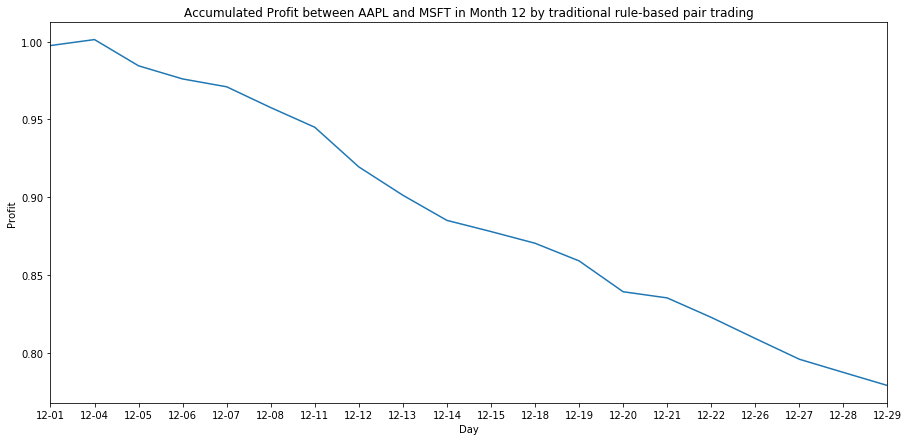

In [33]:
# 這邊是用price ratio來做策略
p = ['AAPL', 'MSFT']
# 直接load Rule-based_PairsTrading.ipynb
load_data = 1
# load back
if load_data == 0:
    profit_day = []
    for i in range(day_test):
        print("[Day %s]" % str(i+1))
        S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
        S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
        profit, b_s, s_s = zscore_trade(S1, S2, p[0], p[1], window_s, window_l, show_print = 0, profit_Mode = profit_Mode)
        profit_day.append(profit)
        drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, b_s = b_s, s_s = s_s)
else:
    profit_day = np.load("predictresult/profit_Rule-basedPairTrading_%s_%d_shiftlength%d.npy" % ("2019-07-24", period_test[0], shift_length))
        
# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day))
else:
    plt.plot(np.cumprod(profit_day))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by traditional rule-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

In [34]:
profit_day

array([0.99744938, 1.00385247, 0.98316087, 0.99143656, 0.99482784,
       0.98624141, 0.98680581, 0.97303581, 0.98019962, 0.98207062,
       0.99188745, 0.99144754, 0.98696803, 0.97693519, 0.99527843,
       0.98502215, 0.98351363, 0.98352059, 0.98934927, 0.98933147])

<Figure size 432x288 with 0 Axes>

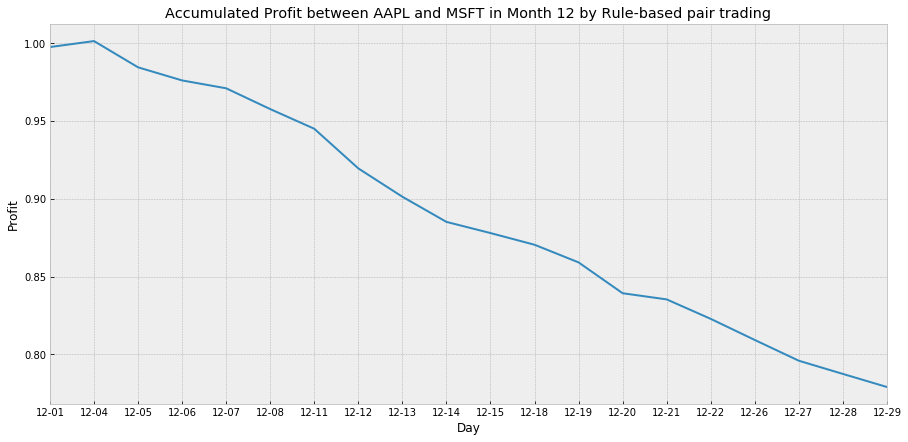

<Figure size 432x288 with 0 Axes>

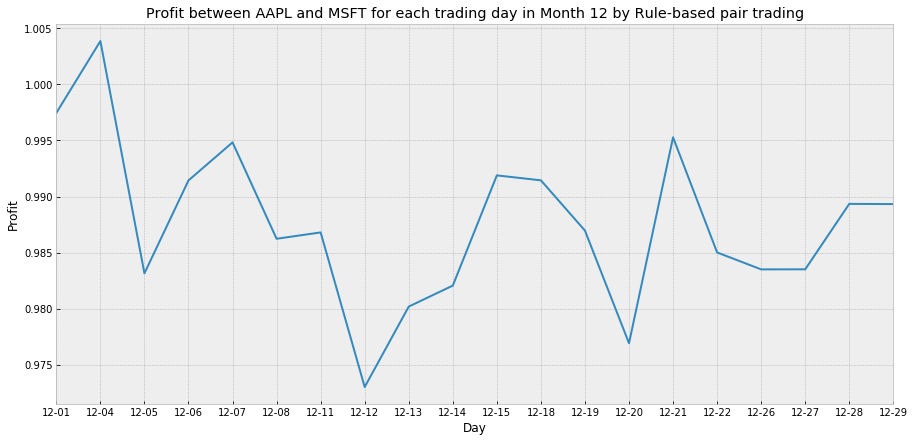

In [35]:
draw_profit(profit_day, date_test_noyear, period_test, profit_Mode = profit_Mode)

## NN-based Pairs Trading

In [36]:
def predict(model, v, q, bm = 0):
    """
    # 透過model預測answer
    """
    print("Predict...")
    # testing
    if bm == 0:    # RN
        if question == "onehot":
            predict = model.predict([v, q])
        else:
            if split_comques == 0:
                (pred_a1, pred_a2, pred_a3) = model.predict([v, q])
            else:
                (pred_a1, pred_a2, pred_a3) = model.predict([v, q[:,:2], q[:,-1]])
    else:    # benchmark
        if condition == 1:
            if question == "onehot":
                (pred_a1, pred_a2, pred_a3) = model.predict([v, q])
            else:
                q_onehot = question2onehot(q)
                (pred_a1, pred_a2, pred_a3) = model.predict([v, q_onehot])
        else:
            (pred_a1, pred_a2, pred_a3) = model.predict(v)
            
    print("Shape of v : ", v.shape, "q : ", q.shape, "predict_result : ", pred_a1.shape, pred_a2.shape, pred_a3.shape)
    pred_a1 = np.argmax(pred_a1, 1)
    pred_a2 = np.argmax(pred_a2, 1)
    pred_a3 = np.argmax(pred_a3, 1)
    
    print("Prediction Finished !")
    
    #return predict result
    return (pred_a1, pred_a2, pred_a3)

In [37]:
def predictDataloader(price_data, price_and_return, all_com_pair_P, c1, c2, day, qtype, show_shape = 0, model_byconv2d = 0, bm = 0):
    '''
    pair trading的dataloader function
    ---
    生成帶有v, q, adj的dataloader
    v : test data
    q : 某個問題
    c1, c2 : 目標的兩間公司
    '''
    v_inference = rolling(price_data, price_and_return, v_length, shift_length, day, mode = 'return')[0]
    
    if bm == 1:
        model_byconv2d = 0
    
    if model_byconv2d == 1:
        v_inference = np.expand_dims(v_inference, -1)
    else:
        v_inference = v_inference.transpose(0,2,1)
    print("v_inference shape for day %s :" % str(day+1), v_inference.shape)
    
    # 生成問題
    q_eye = np.eye(3)
    if qtype == 'Pairwise Price Change':
        q_inference = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[0]])
    elif qtype == 'Strength':
        q_inference = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[1]])
    else:
        q_inference = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[2]])
    q_inference = np.tile(q_inference, (v_inference.shape[0],1))
    #print(q_test.shape)
    
    if show_shape == 1:
        print("v_inference.shape = ", v_inference.shape)
        print("q_inference.shape = ", q_inference.shape)
    
    return (v_inference, q_inference)

In [38]:
def NN_trade(S1, S2, c1, c2, price_data, price_and_return, net, day, show_print = 0, fee = 0, profit_Mode = 0, model_byconv2d = 0, bm = 0):
    '''
    # 針對Neural Network model的Pairs Trading function
    ---
    三個問題都會被考慮進去
    用model產生每一個V三種問題所對應的答案，
    也就是說預測未來結果後進行下面步驟
    buys 1 ratio (buy 1 AAPL stock and sell ratio x MSFT stock) when ratio is low, 
    sell 1 ratio (sell 1 AAPL stock and buy ratio x MSFT stock) when it's high, 
    and calculate PnL (profit and loss，損益) of these trades.
    '''

    # Compute rolling mean and rolling standard deviation
    ratios = pd.DataFrame({"ratios" : (S1.values/S2.values).ravel()})
    
    c1_idx = sorted(temp_c).index(c1)
    c2_idx = sorted(temp_c).index(c2)
    
    roll_pair = rolling(price_data, price_and_return, v_length, shift_length, day, mode = 'price')
    roll_v, roll_v_answer, position = roll_pair[0][:,[c1_idx,c2_idx],:], roll_pair[1][:,[c1_idx,c2_idx],:], roll_pair[2]
    position = sorted([list(x) for x in set(tuple(x) for x in position)])
    
    # 兩間公司三種問題的dataloader
    v_inference, q1 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[0], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)
    v_inference, q2 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[1], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)
    v_inference, q3 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[2], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)

    # 用NN預測問題
    q1a = predict(net, v_inference, q1, bm = bm)
    q2a = predict(net, v_inference, q2, bm = bm)
    q3a = predict(net, v_inference, q3, bm = bm)

    q1a1, q1a2, q1a3 = q1a[0], q1a[1], q1a[2]
    q2a1, q2a2, q2a3 = q2a[0], q2a[1], q2a[2]
    q3a1, q3a2, q3a3 = q3a[0], q3a[1], q3a[2]
    
    print(q1a1)
    print(q2a2)
    print(q3a3)
    
    # Learning-based trading
    # Start with no money and no positions
    if profit_Mode == 0:
        money = 0
    else:
        money = 1
    countS1 = 0
    countS2 = 0
    buy = []
    sell = []

    # 總共有v_test.shape[0]個決策點，一天的前300秒不做決策，每60秒做一次決策，一次買賣一口
    for i in range(roll_v.shape[0]):
        if show_print == 1:
            print("---------[Time = %s to %s]---------" % (position[i][2], position[i][3]))
            print("Current profit : ", " profit - ", money)
        # t0入場，t300出場
        S1_t0, S1_t60 = roll_v_answer[i][0][0], roll_v_answer[i][0][-1]
        S2_t0, S2_t60 = roll_v_answer[i][1][0], roll_v_answer[i][1][-1]
        entry_time = position[i][2]-1
        exit_time = position[i][3]-1
        
        # NN系列預測的策略
        
        # if Pairwise Price Change BothRise
        if (q1a1[i] == 1):
            """
            同漲同跌，看漲跌幅決定做多做空的股票
            (注解的部分則是看波動率)
            """
            # Sell short if Strength1 < Strength2
            # Sell short if Volatility1 < Volatility2
            if q2a2[i] == 2:
            #if q3a3[i] == 2:  
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money += S1_t0 - S2_t0 * ratio

                countS1 -= 1
                countS2 += ratio
                
                sell.append(entry_time)
                
                if show_print == 1:
                    print("[Pairwise Price Change BothRise and Volatility1 < Volatility2]")
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
            # Buy long if Strength1 > Strength2
            # Buy long if Volatility1 > Volatility2
            elif q2a2[i] == 1:
            #elif q3a3[i] == 1:    
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money -= S1_t0 - S2_t0 * ratio

                countS1 += 1
                countS2 -= ratio
                
                buy.append(entry_time)

                if show_print == 1:
                    print("[Pairwise Price Change BothRise and Volatility1 > Volatility2]")
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
        # if Pairwise Price Change BothFall
        elif (q1a1[i] == 2):
            # Sell short if Strength1 < Strength2
            # Sell short if Volatility1 > Volatility2
            if q2a2[i] == 2:
            #if q3a3[i] == 1:
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money += S1_t0 - S2_t0 * ratio

                countS1 -= 1
                countS2 += ratio
                
                sell.append(entry_time)
                
                if show_print == 1:
                    print("[Pairwise Price Change BothFall and Volatility1 > Volatility2]")
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
            # Buy long if Strength1 > Strength2
            # Buy long if Volatility1 < Volatility2
            elif q2a2[i] == 1:
            #elif q3a3[i] == 2: 
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money -= S1_t0 - S2_t0 * ratio

                countS1 += 1
                countS2 -= ratio
                
                buy.append(entry_time)

                if show_print == 1:
                    print("[Pairwise Price Change BothFall and Volatility1 < Volatility2]")
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
        
        # Sell short if Pairwise Price Change Reverse and Strength1 < Strength2
        elif (q1a1[i] == 3 and q2a2[i] == 2):
            # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
            ratio = S1_t0 / S2_t0
            #print(entry_time, ratios.iloc[entry_time][0])
            if profit_Mode == 0:
                if fee == 1:
                    money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                else:
                    money += S1_t0 - S2_t0 * ratio
                
            countS1 -= 1
            countS2 += ratio
            
            sell.append(entry_time)
            
            if show_print == 1:
                print("[Pairwise Price Change Reverse and Strength1 < Strength2]")
                print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
        
        # Buy long if Pairwise Price Change Reverse and Strength1 > Strength2
        elif (q1a1[i] == 3 and q2a2[i] == 1):
            # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
            ratio = S1_t0 / S2_t0
            #print(entry_time, ratios.iloc[entry_time][0])
            if profit_Mode == 0:
                if fee == 1:
                    money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                else:
                    money -= S1_t0 - S2_t0 * ratio
                
            countS1 += 1
            countS2 -= ratio
            
            buy.append(entry_time)
            
            if show_print == 1:
                print("[Pairwise Price Change Reverse and Strength1 > Strength2]")
                print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))

        # Clear positions for each decision point  
        # 交易成本部分： 0.00231%的交易稅 、各0.5%的手續費
        ratio = S1_t0 / S2_t0
        #print(exit_time, ratios.iloc[exit_time][0])
        if profit_Mode == 0:
            if fee == 1:
                money += countS1 * S1_t60 + S2_t60 * countS2 - 0.0000231 * (countS1 * S1_t60 + countS2 * S2_t60) - 0.005 * (S1_t60 * countS1 + S2_t60 * countS2)
            else:
                money += countS1 * S1_t60 + S2_t60 * countS2
        else:    # profit rate
            if fee == 1:
                money *= 1 + (-countS1 * S1_t60 + S2_t60 * -countS2 - 0.0000231 * (abs(countS1) * S1_t60 + abs(countS2) * S2_t60) - 0.005 * (S1_t60 * abs(countS1) + S2_t60 * abs(countS2))) / (S1_t0 + S2_t0)
            else:
                money *= 1 + (-countS1 * S1_t60 + S2_t60 * -countS2) / (S1_t0 + S2_t0)

        if show_print == 1:
            print('[Exit position] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (money, ratio, -countS1, -countS2))
            print('%s price - %s, earn : %s | %s price - %s, earn : %s |' % (c1, S1_t60, -countS1 * S1_t60, c2, S2_t60, -countS2 * S2_t60))
        
        # clear position
        countS1, countS2 = 0, 0
        
    return money, buy, sell, (q1a1, q2a2, q3a3)

## Test 一整個月每個交易日三種問題的真實命中率

In [39]:
def cal_predict_true_acc(all_com_pair_P, qtype, day):
    """
    # 計算V_test三種問題"每一個交易日"的真實準確率
    """
    real_acc = {}
    for d in range(day):
        print("Day %s" % str(d+1))
        day_start = d * int(v_test.shape[0] / day) * len(all_com_pair_P) * len(qtype)
        print("Index of day start : ", day_start)
        qa_test_for_pairtrading = []
        for i in range(int(v_test.shape[0] / day)):
            qa_test_for_pairtrading.append(qa_whole_test[day_start + i*len(all_com_pair_P)*len(qtype):day_start + (i+1)*len(all_com_pair_P)*len(qtype),:])
        qa_test_for_pairtrading = np.vstack(qa_test_for_pairtrading)
        xxx = qa_test_for_pairtrading[:,:-10]
        q1_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q1[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q2_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q2[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q3_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q3[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        
        # 真實的label
        a1_true = qa_test_for_pairtrading[q1_idx][:,-10:-6]
        a2_true = qa_test_for_pairtrading[q2_idx][:,-6:-3]
        a3_true = qa_test_for_pairtrading[q3_idx][:,-3:]
        
        # 真實命中率
        q1_acc = np.sum((np.argmax(a1_true, 1) == predict_result[d+1][0]).astype(int)) / a1_true.shape[0]
        q2_acc = np.sum((np.argmax(a2_true, 1) == predict_result[d+1][1]).astype(int)) / a2_true.shape[0]
        q3_acc = np.sum((np.argmax(a3_true, 1) == predict_result[d+1][2]).astype(int)) / a3_true.shape[0]
        
        print("Q1 real accuracy : ", q1_acc)
        print("Q2 real accuracy : ", q2_acc)
        print("Q3 real accuracy : ", q3_acc)
        
        real_acc[d+1] = [q1_acc, q2_acc, q3_acc]
        
    return real_acc

In [40]:
# 這裡的q1, q2, q3有用到所以沒刪掉
v_inference, q1 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[0], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)
v_inference, q2 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[1], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)
v_inference, q3 = predictDataloader(price_data, price_and_return, all_com_pair_P, p[0], p[1], 0, qtype[2], show_shape = 0, model_byconv2d = model_byconv2d, bm = bm)

v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)


## Benchmark : 3-layer DNN
* 參照這篇設定 https://www.sciencedirect.com/science/article/pii/S0377221716308657

In [41]:
network = "Benchmark Network (DNN)"

[Day 1]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

Current profit :   profit -  0.9984916113592355
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9984916113592355 | price ratios 2.0296956198960654 | C1 1 pos | C2 -2.0296956198960654 pos
AAPL price - 170.875 payment - 170.875 | MSFT price - 84.1875 revenue - 170.875 |
[Exit position] profit 0.9979950090436074 | price ratios 2.0296956198960654 | C1 -1 pos | C2 2.0296956198960654 pos
AAPL price - 170.875, earn : -170.875 | MSFT price - 84.125, earn : 170.7481440237565 |
---------[Time = 22050 to 22200]---------
Current profit :   profit -  0.9979950090436074
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9979950090436074 | price ratios 2.0312035661218424 | C1 1 pos | C2 -2.0312035661218424 pos
AAPL price - 170.875 payment - 170.875 | MSFT price - 84.125 revenue - 170.875 |
[Exit position] profit 0.9984918548821714 | price ratios 2.0312035661218424 | C1 -1 pos | C2 2.0312035661218424 pos
AAP

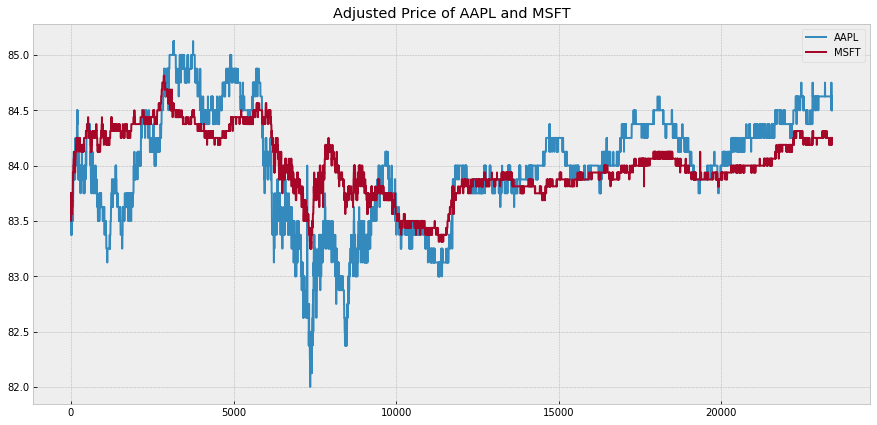

Plot z-score and trading signal of price ratio of AAPL and MSFT


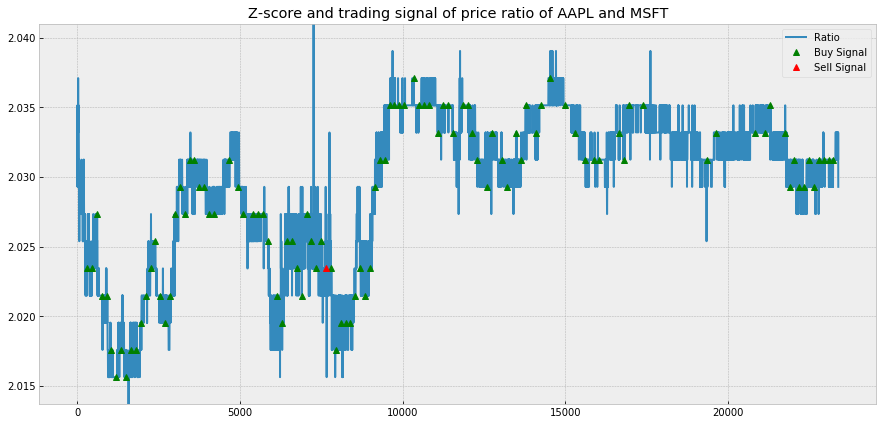

Trading signal of AAPL and MSFT for learning-based pair trading


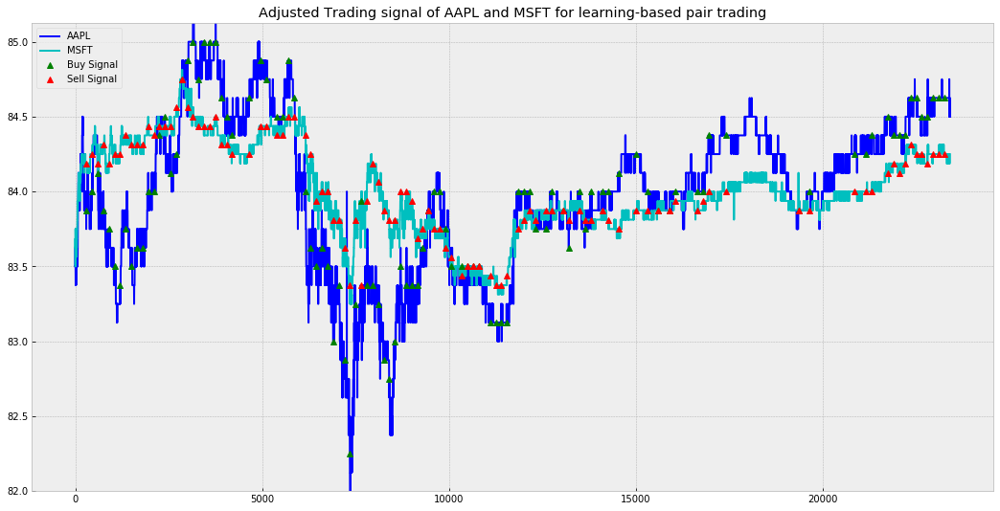

[Day 2]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

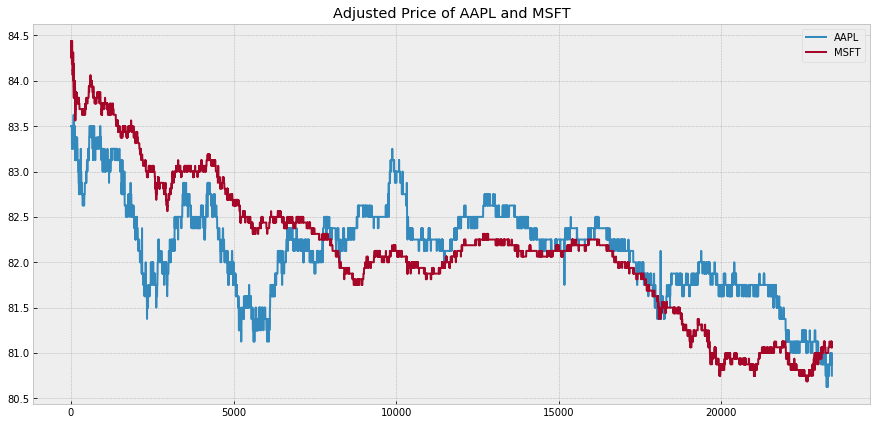

Plot z-score and trading signal of price ratio of AAPL and MSFT


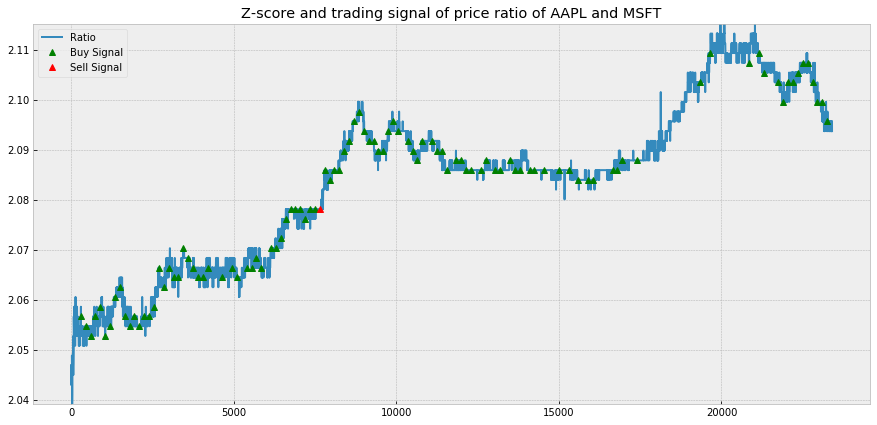

Trading signal of AAPL and MSFT for learning-based pair trading


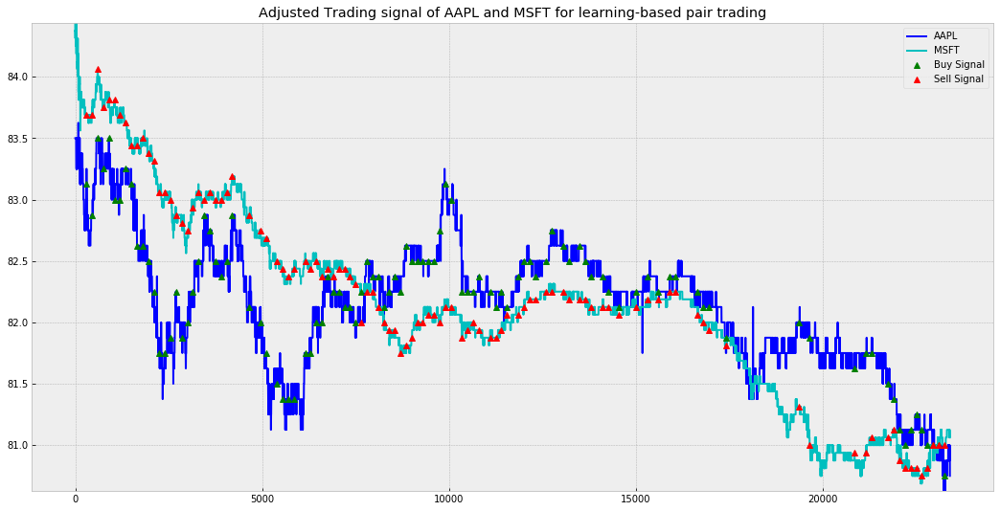

[Day 3]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

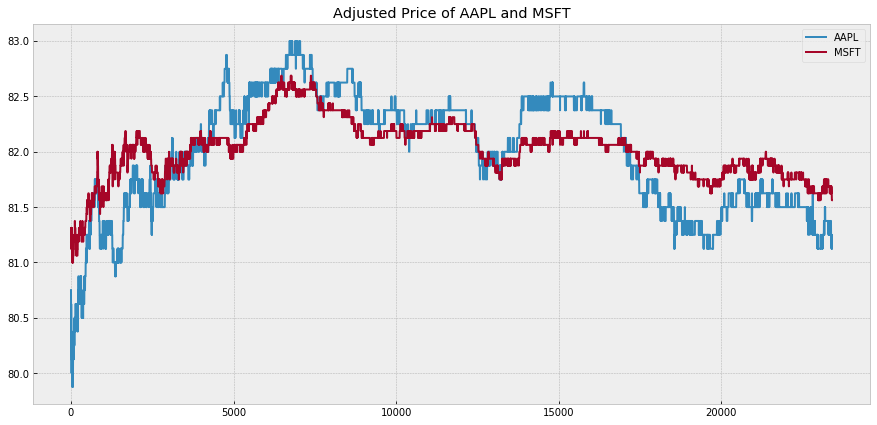

Plot z-score and trading signal of price ratio of AAPL and MSFT


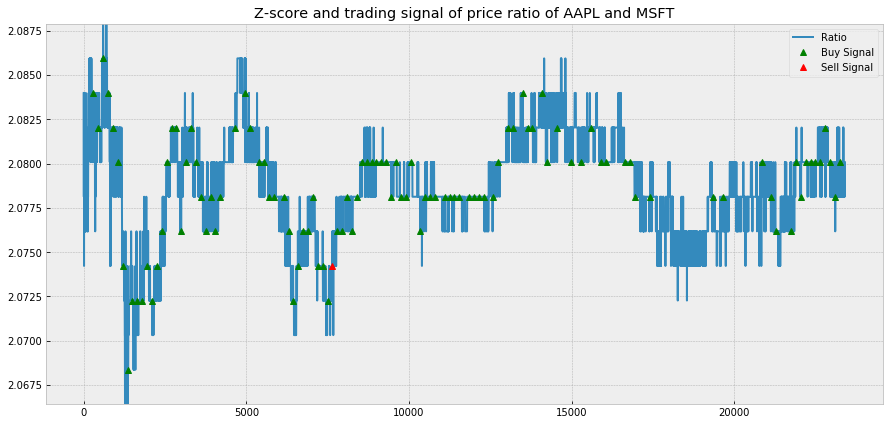

Trading signal of AAPL and MSFT for learning-based pair trading


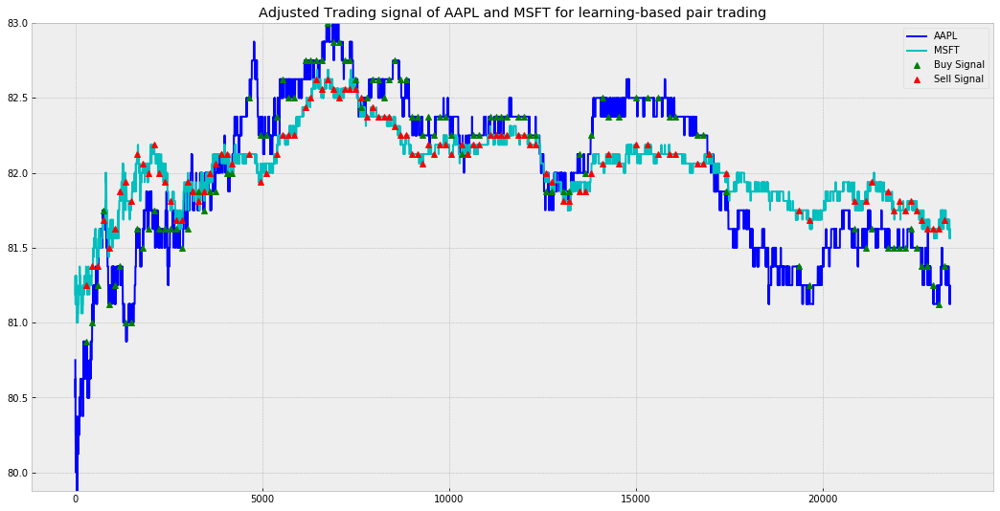

[Day 4]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

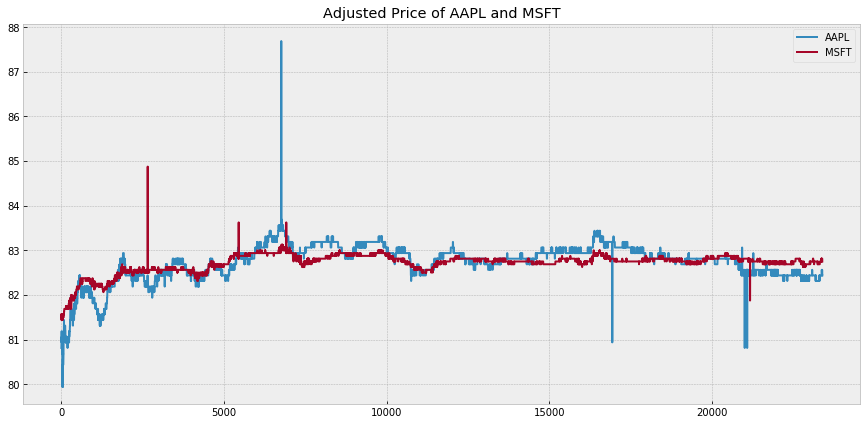

Plot z-score and trading signal of price ratio of AAPL and MSFT


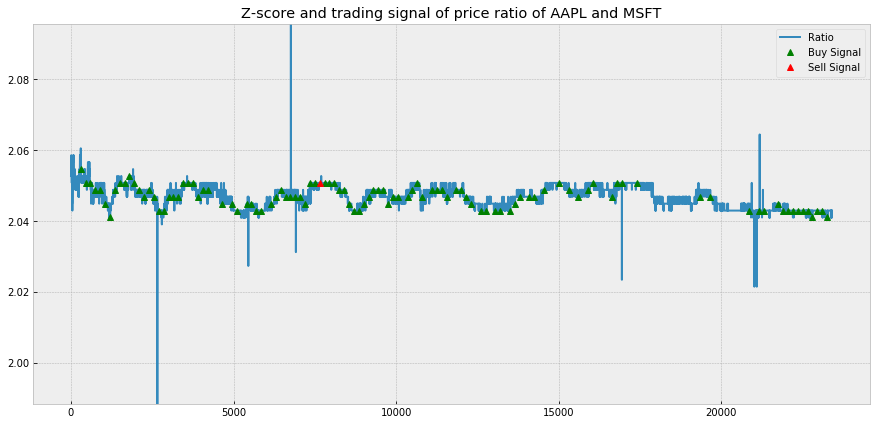

Trading signal of AAPL and MSFT for learning-based pair trading


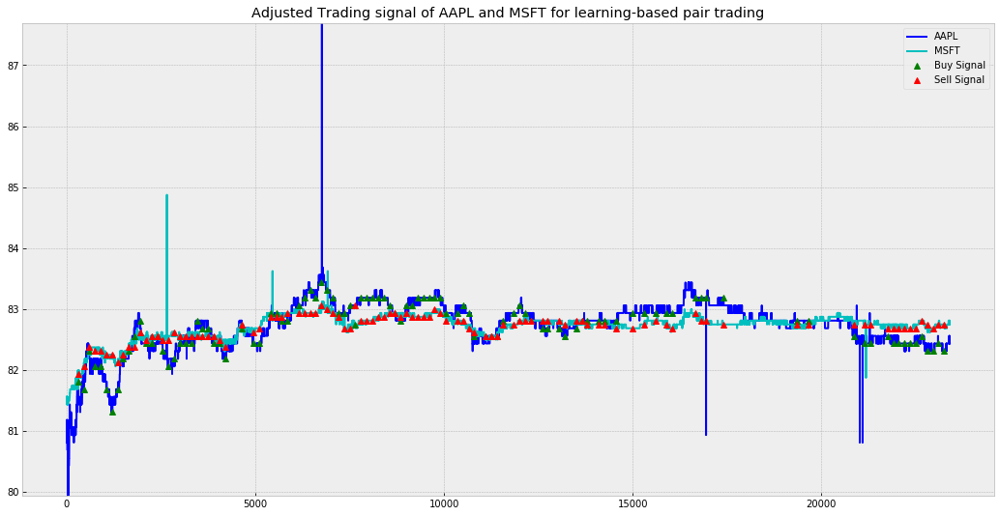

[Day 5]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

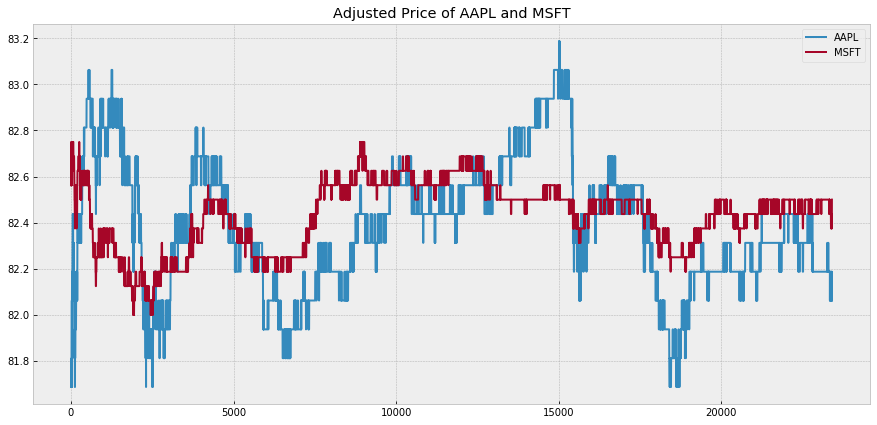

Plot z-score and trading signal of price ratio of AAPL and MSFT


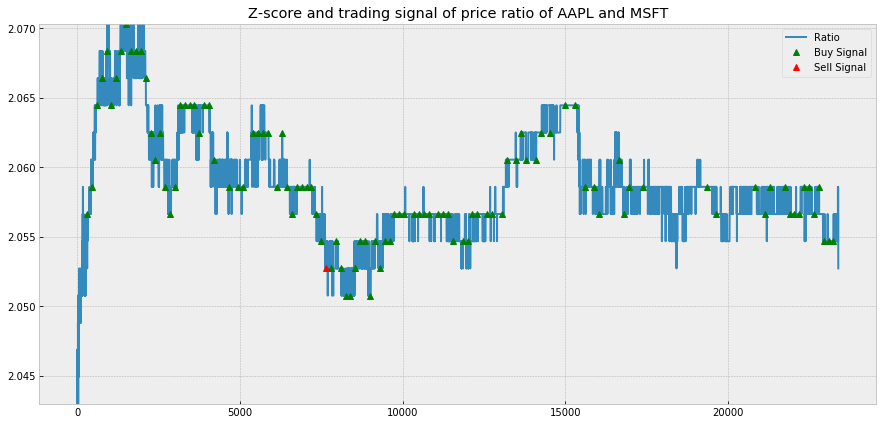

Trading signal of AAPL and MSFT for learning-based pair trading


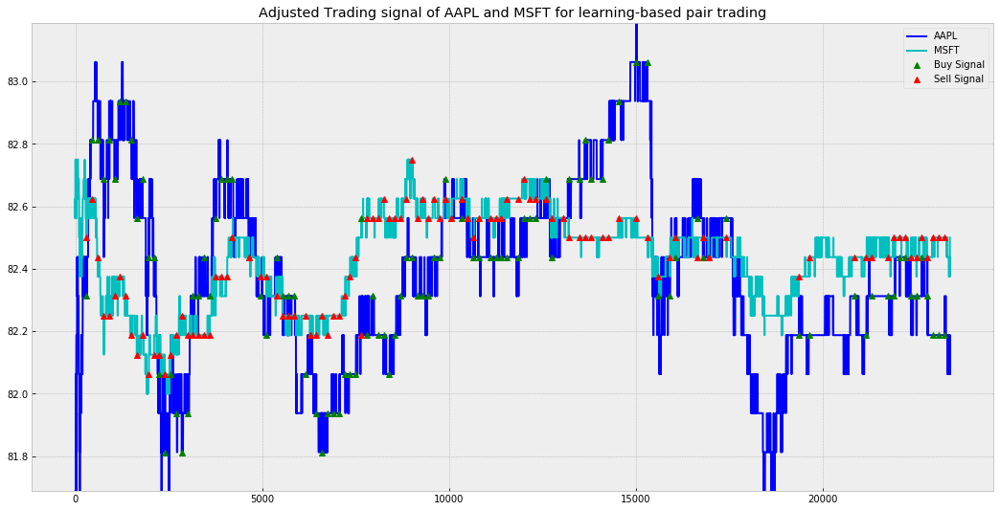

[Day 6]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

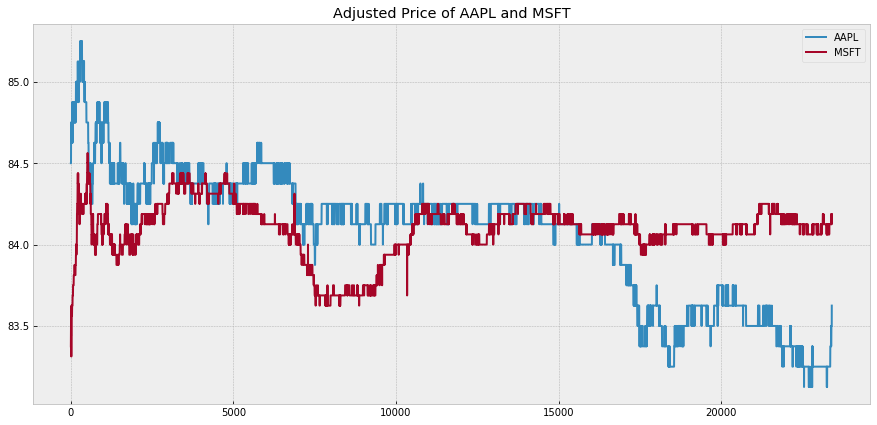

Plot z-score and trading signal of price ratio of AAPL and MSFT


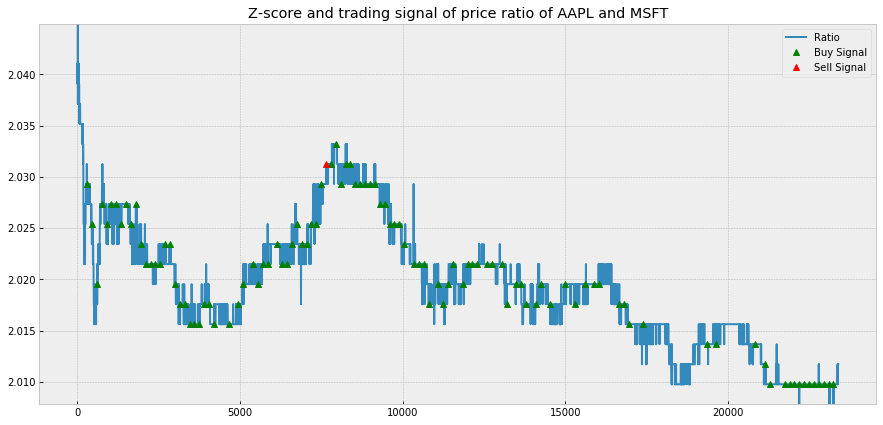

Trading signal of AAPL and MSFT for learning-based pair trading


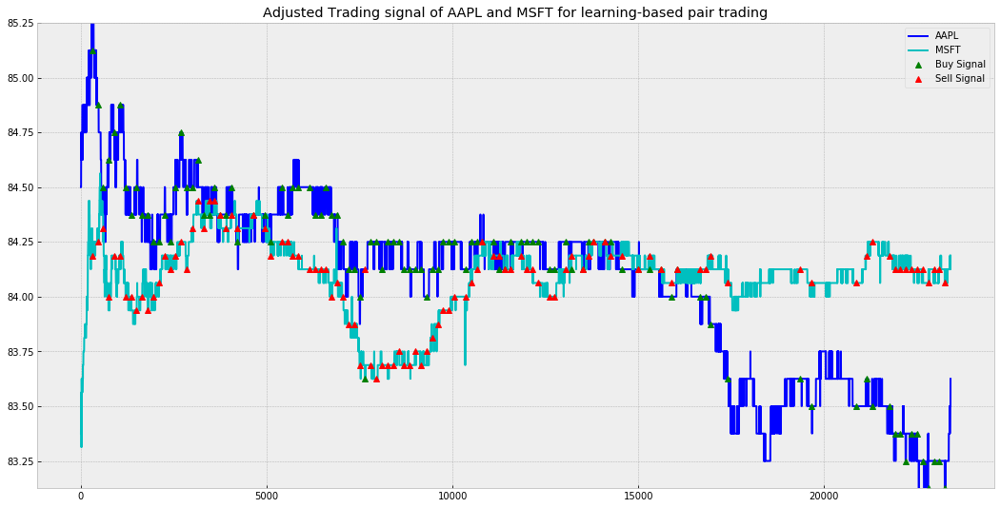

[Day 7]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

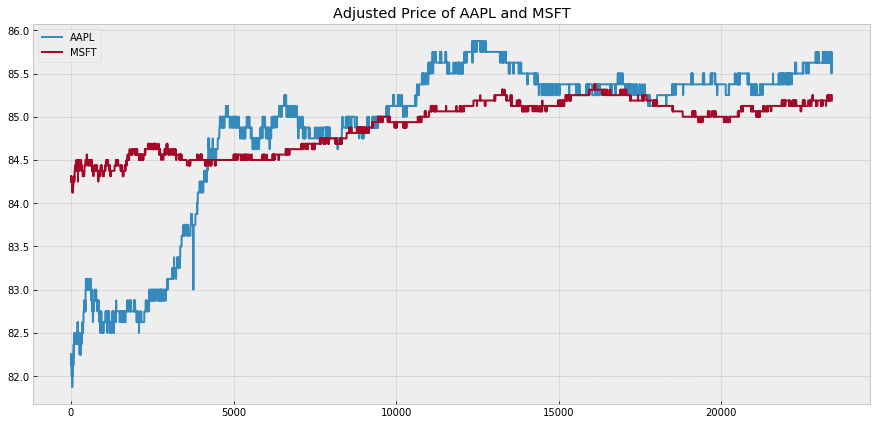

Plot z-score and trading signal of price ratio of AAPL and MSFT


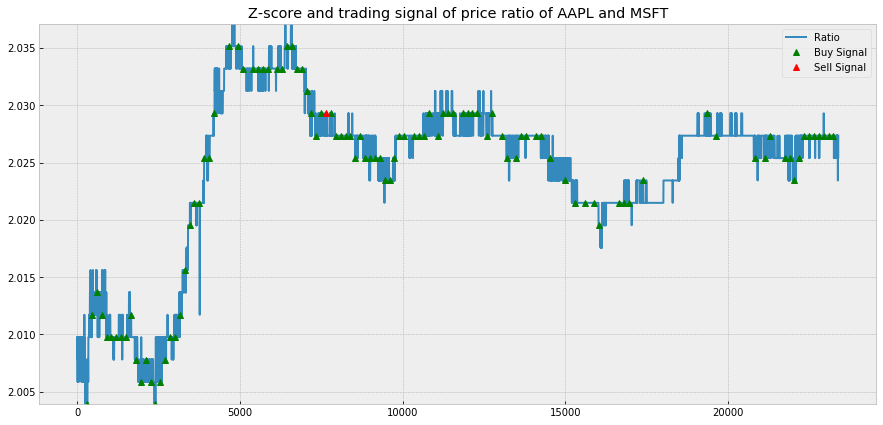

Trading signal of AAPL and MSFT for learning-based pair trading


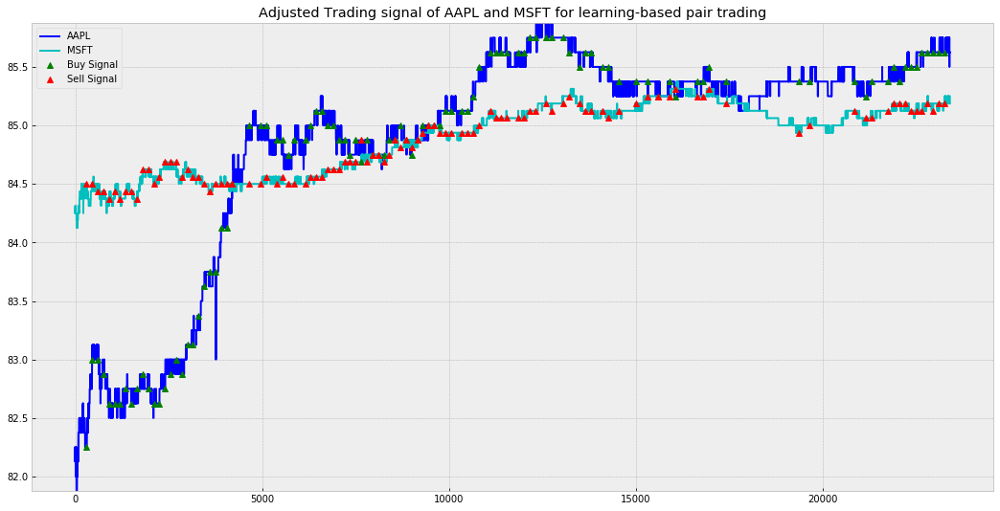

[Day 8]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

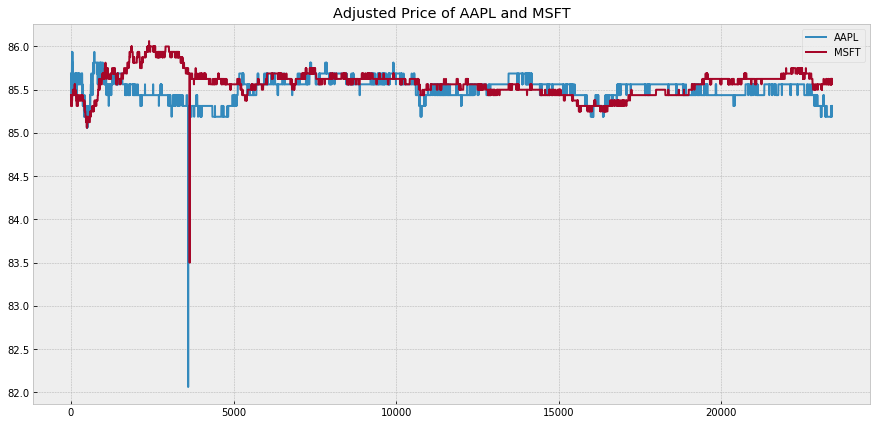

Plot z-score and trading signal of price ratio of AAPL and MSFT


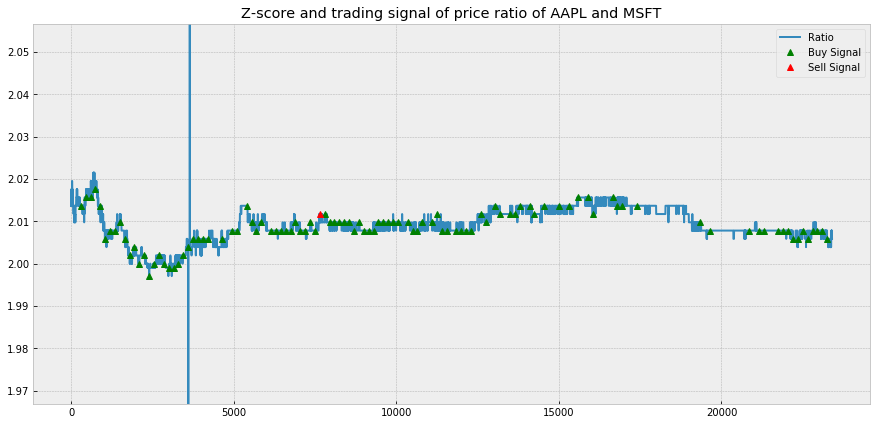

Trading signal of AAPL and MSFT for learning-based pair trading


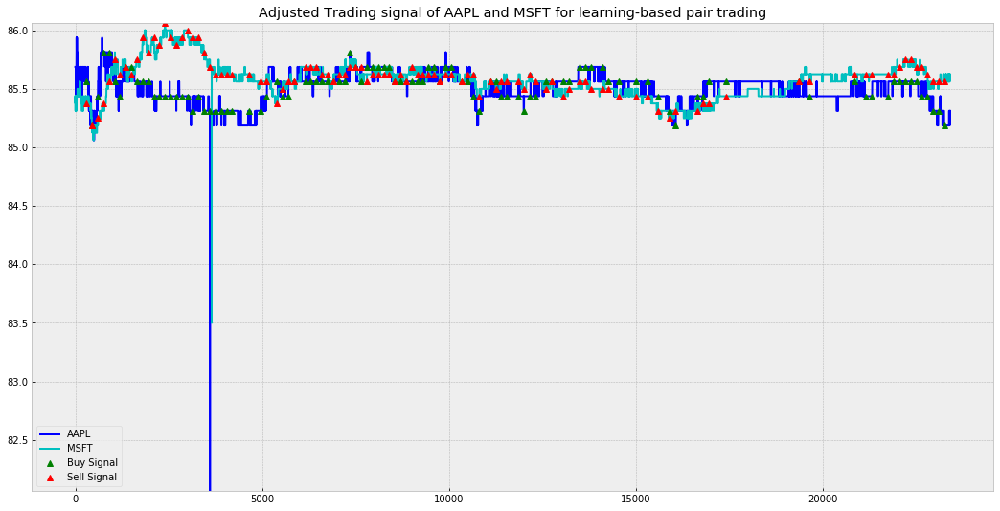

[Day 9]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 

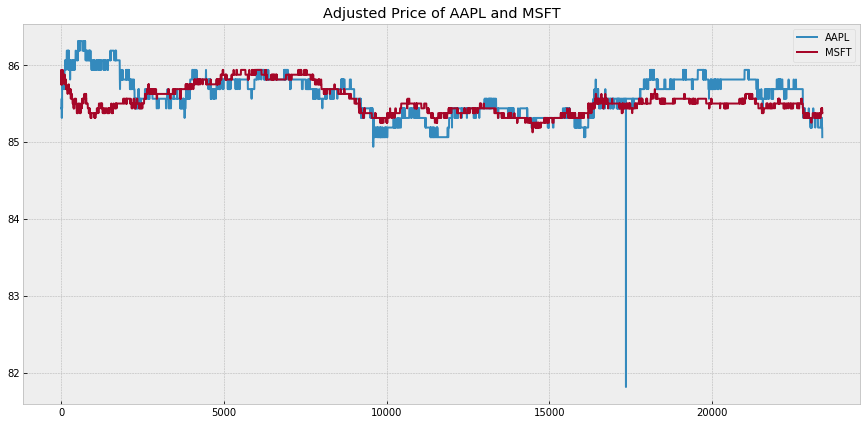

Plot z-score and trading signal of price ratio of AAPL and MSFT


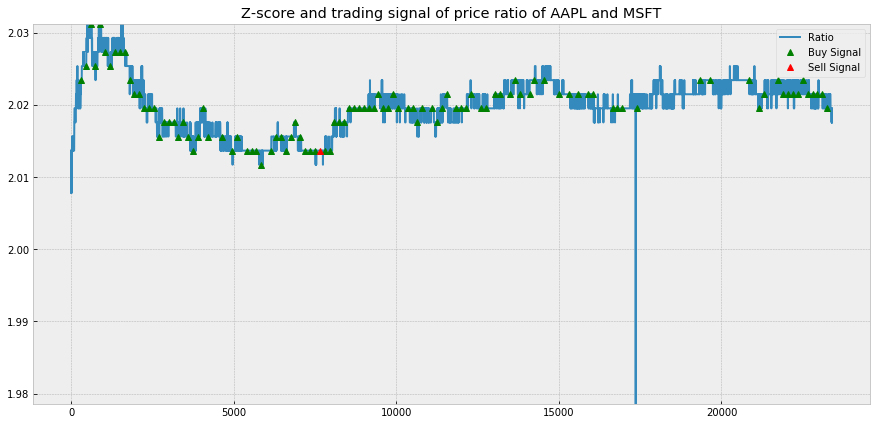

Trading signal of AAPL and MSFT for learning-based pair trading


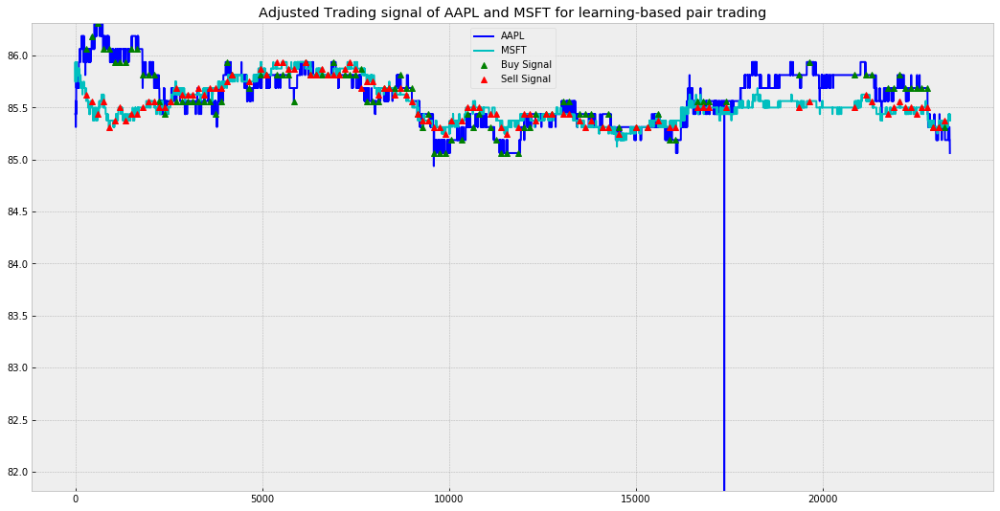

[Day 10]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

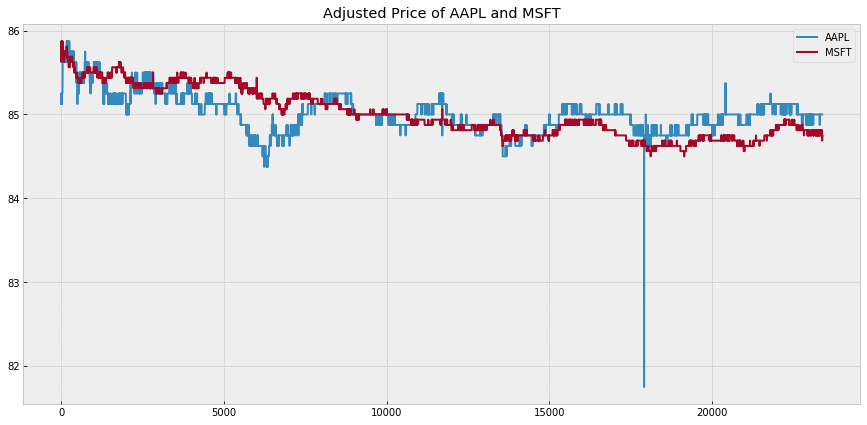

Plot z-score and trading signal of price ratio of AAPL and MSFT


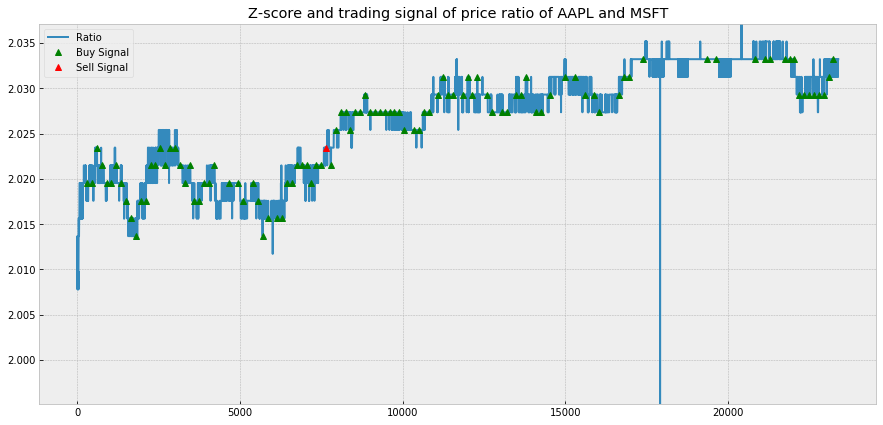

Trading signal of AAPL and MSFT for learning-based pair trading


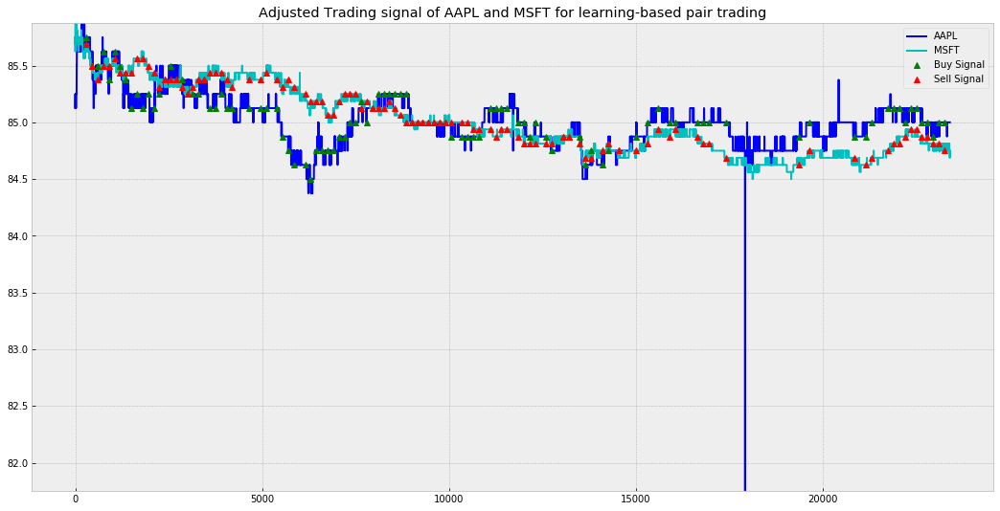

[Day 11]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

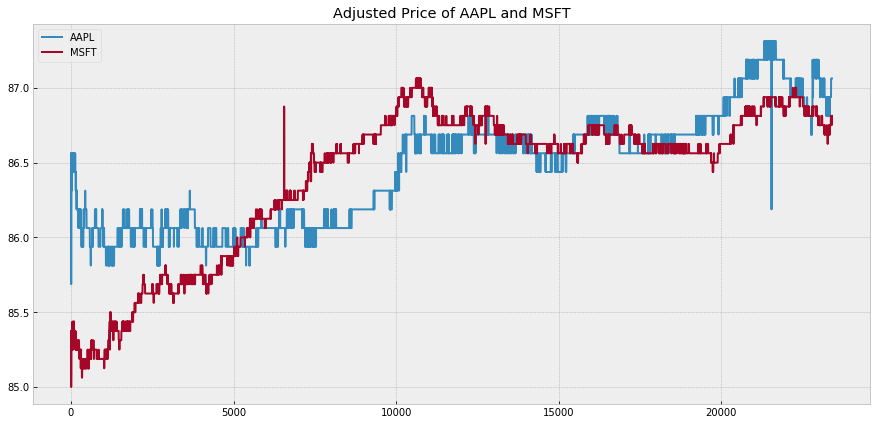

Plot z-score and trading signal of price ratio of AAPL and MSFT


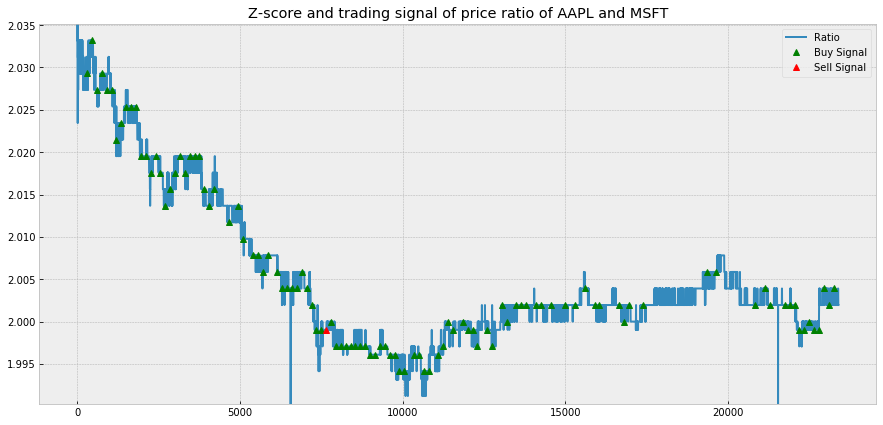

Trading signal of AAPL and MSFT for learning-based pair trading


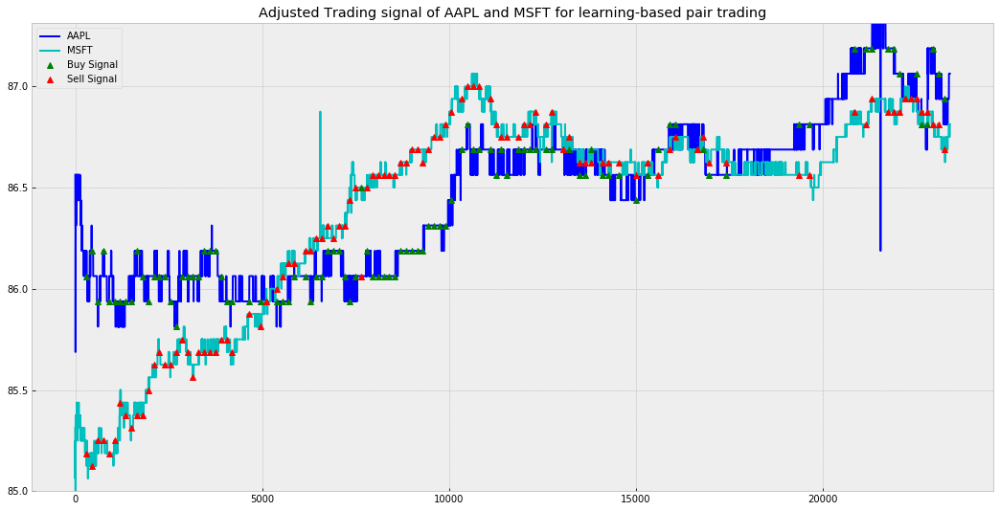

[Day 12]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

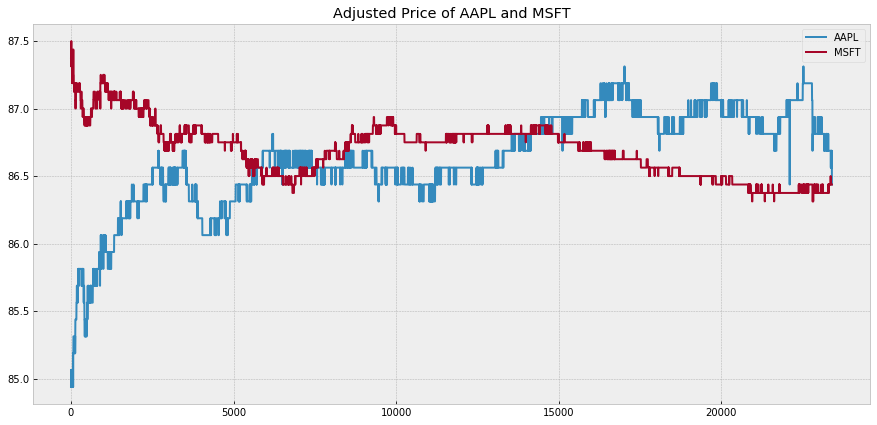

Plot z-score and trading signal of price ratio of AAPL and MSFT


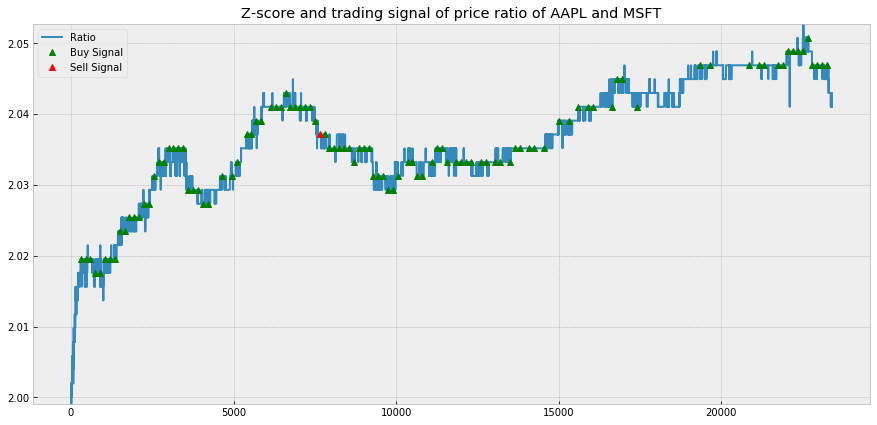

Trading signal of AAPL and MSFT for learning-based pair trading


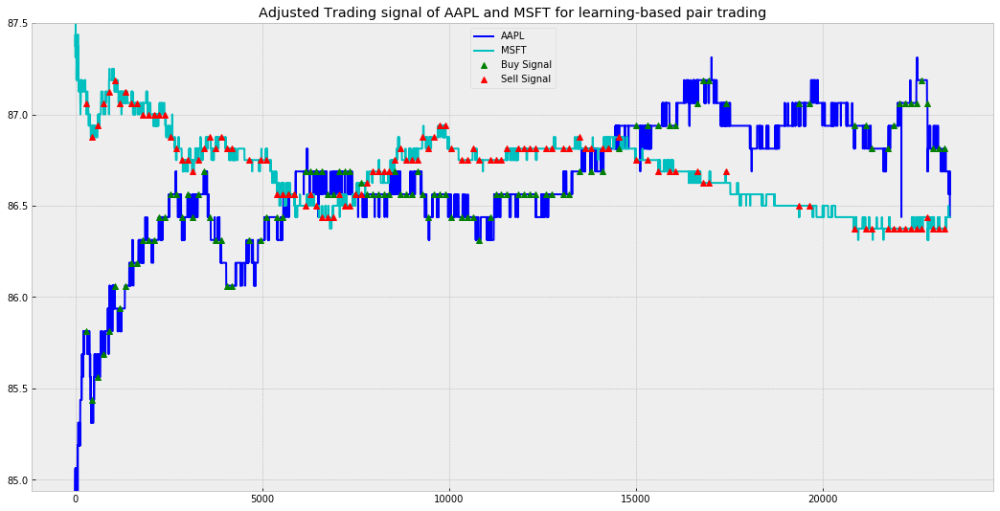

[Day 13]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

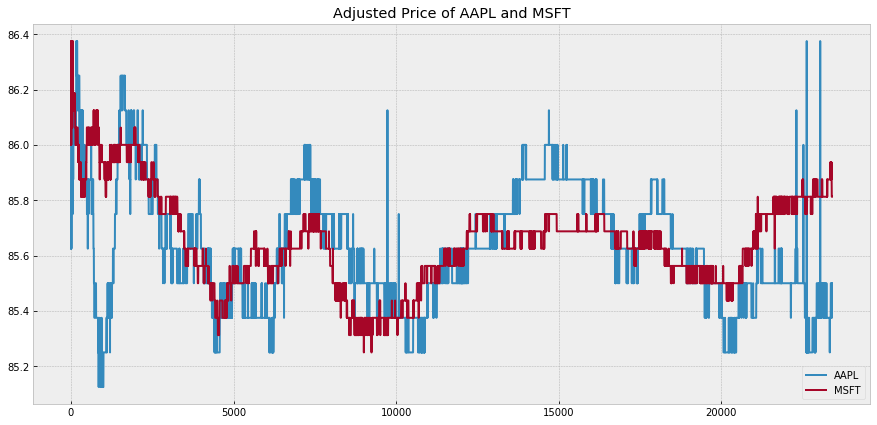

Plot z-score and trading signal of price ratio of AAPL and MSFT


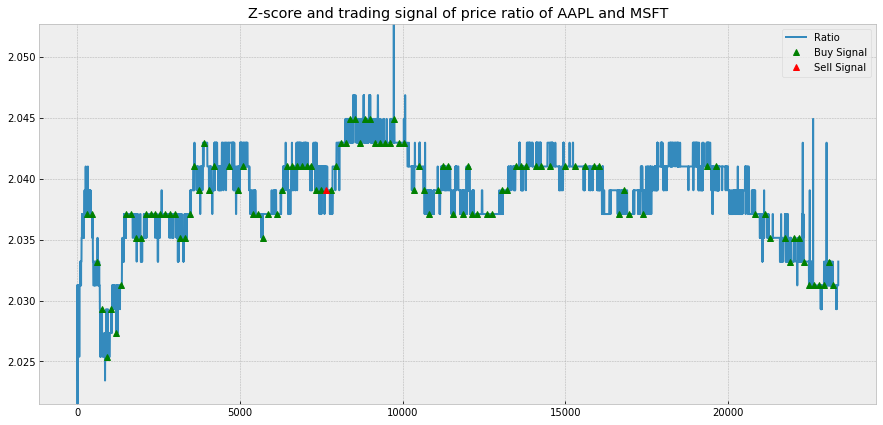

Trading signal of AAPL and MSFT for learning-based pair trading


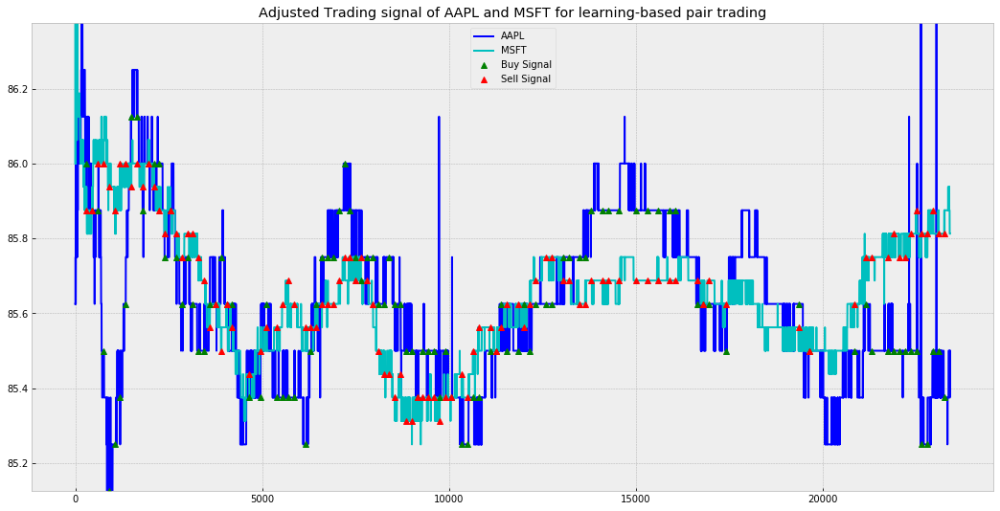

[Day 14]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

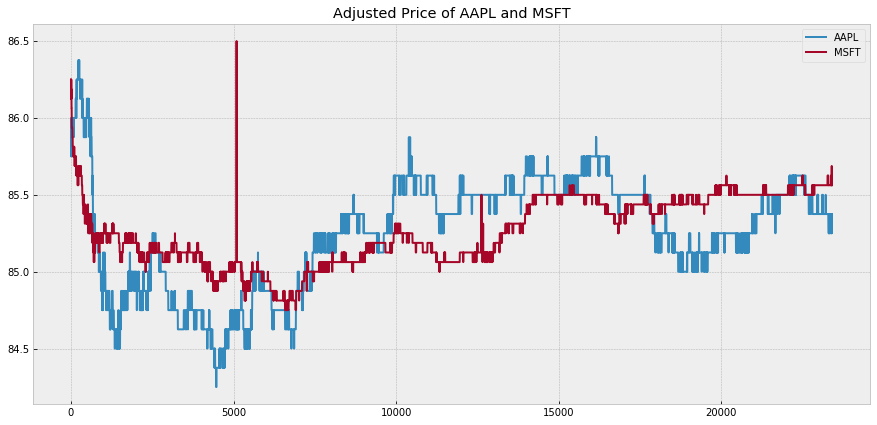

Plot z-score and trading signal of price ratio of AAPL and MSFT


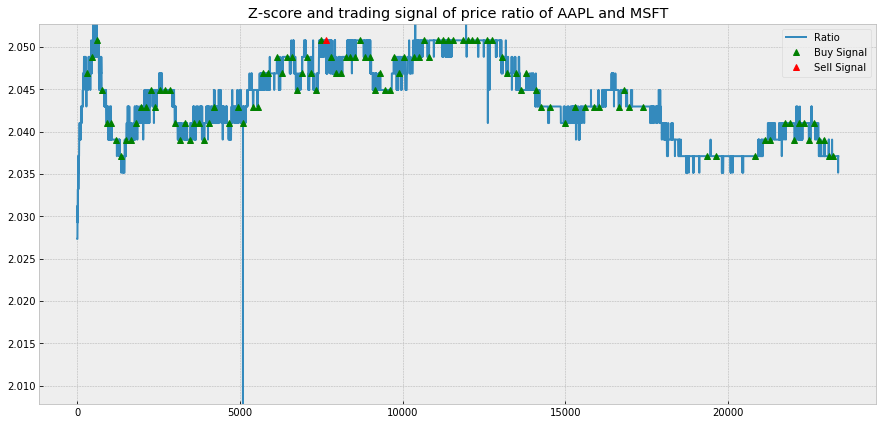

Trading signal of AAPL and MSFT for learning-based pair trading


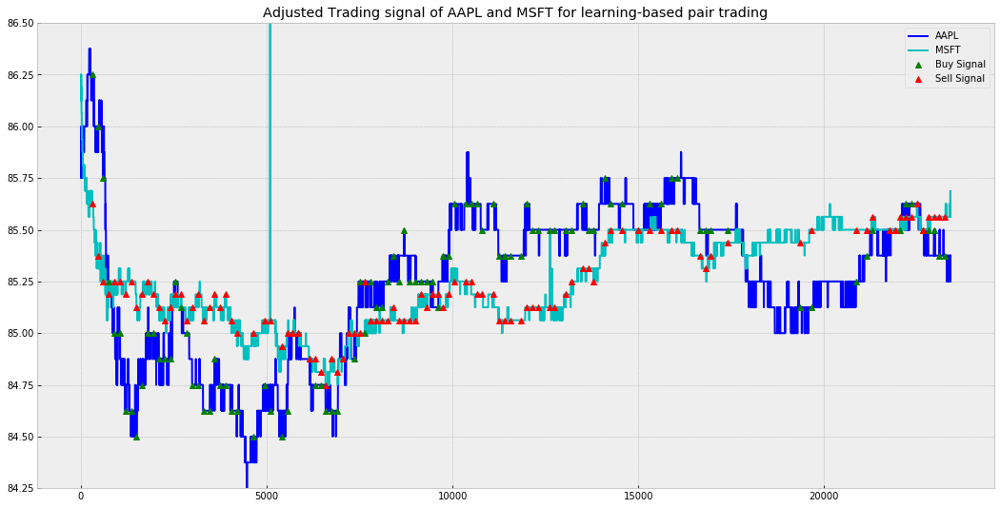

[Day 15]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

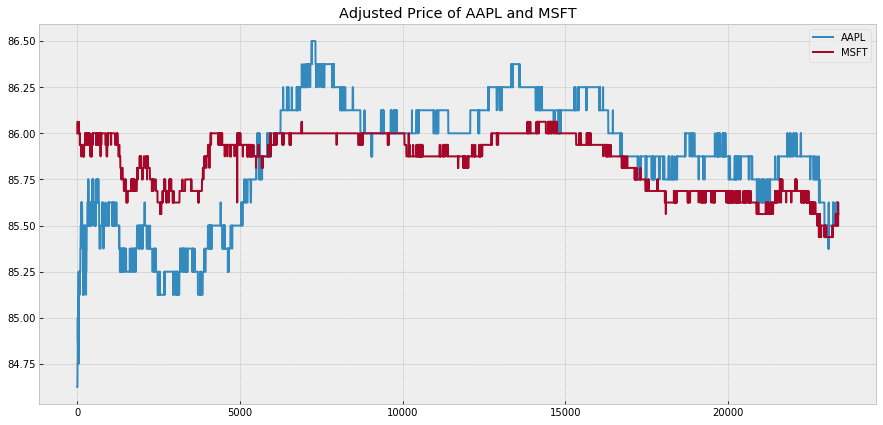

Plot z-score and trading signal of price ratio of AAPL and MSFT


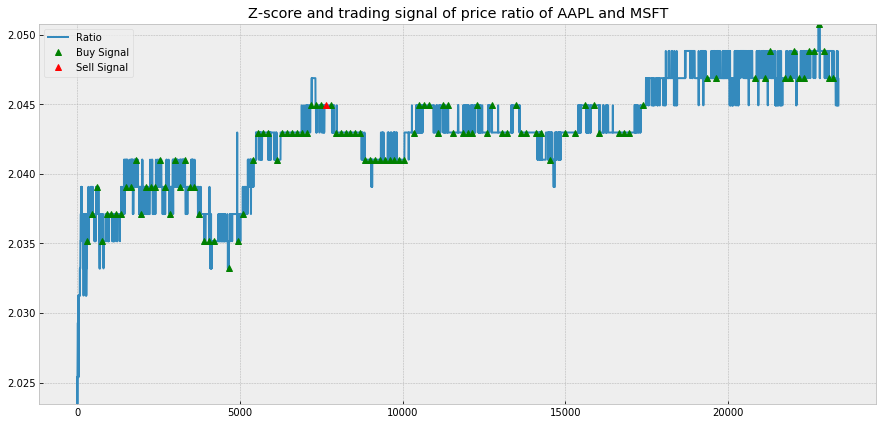

Trading signal of AAPL and MSFT for learning-based pair trading


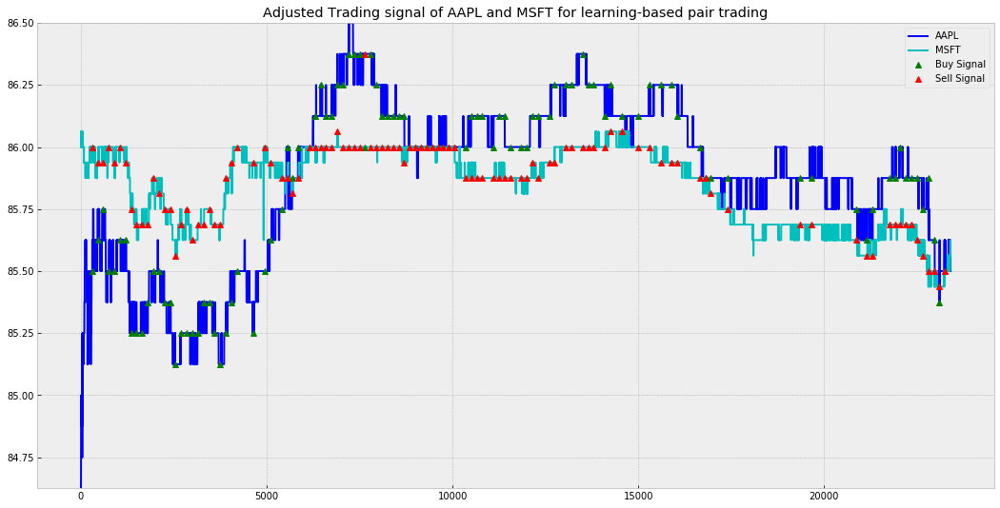

[Day 16]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9995248934335779 | price ratios 2.0437956204379564 | C1 1 pos | C2 -2.0437956204379564 pos
AAPL price - 175.0 payment - 175.0 | MSFT price - 85.625 revenue - 175.00000000000003 |
[Exit position] profit 0.9995248934335779 | price ratios 2.0437956204379564 | C1 -1 pos | C2 2.0437956204379564 pos
AAPL price - 175.0, earn : -175.0 | MSFT price - 85.625, earn : 175.00000000000003 |
---------[Time = 21900 to 22050]---------
Current profit :   profit -  0.9995248934335779
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9995248934335779 | price ratios 2.0437956204379564 | C1 1 pos | C2 -2.0437956204379564 pos
AAPL price - 175.0 payment - 175.0 | MSFT price - 85.625 revenue - 175.00000000000003 |
[Exit position] profit 0.9990350074384416 | price ratios 2.0437956204379564 | C1 -1 pos | C2 2.0437956204379564 pos
AAPL price - 175.0, earn : -175.0 | MSFT 

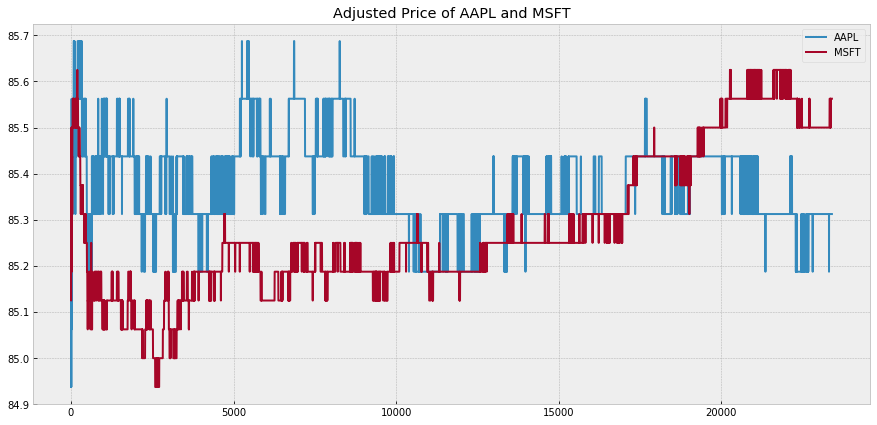

Plot z-score and trading signal of price ratio of AAPL and MSFT


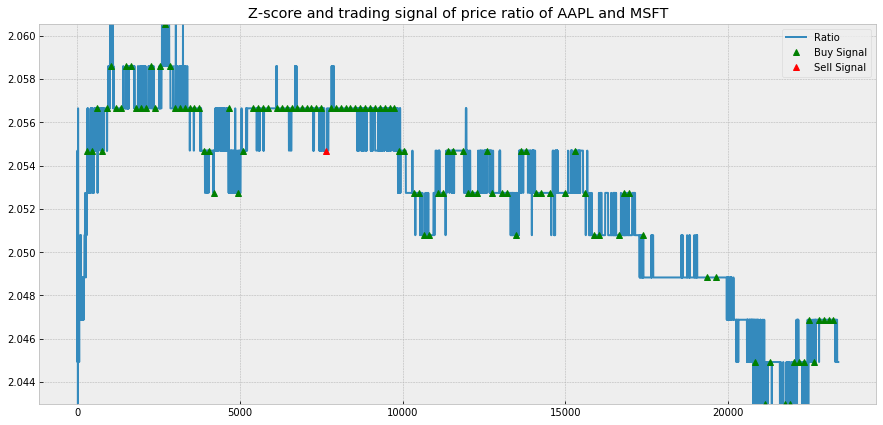

Trading signal of AAPL and MSFT for learning-based pair trading


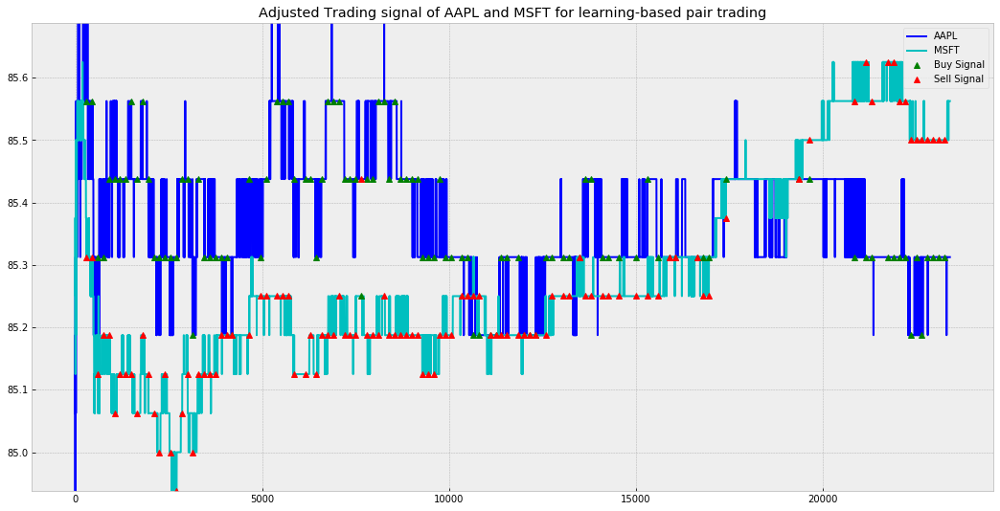

[Day 17]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

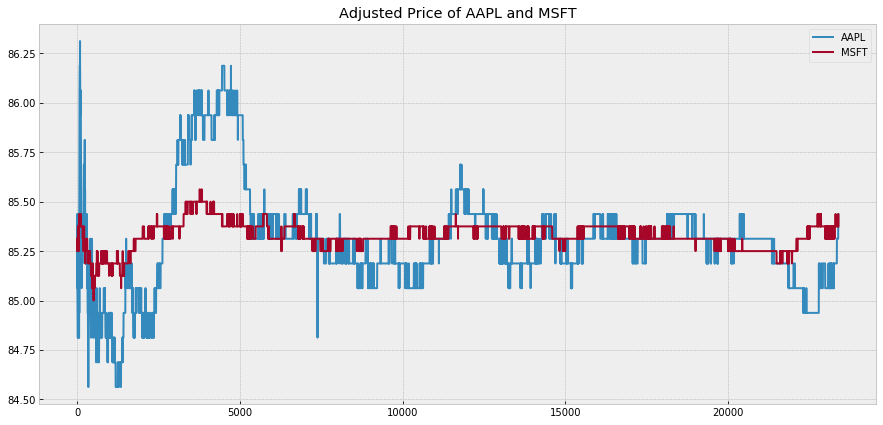

Plot z-score and trading signal of price ratio of AAPL and MSFT


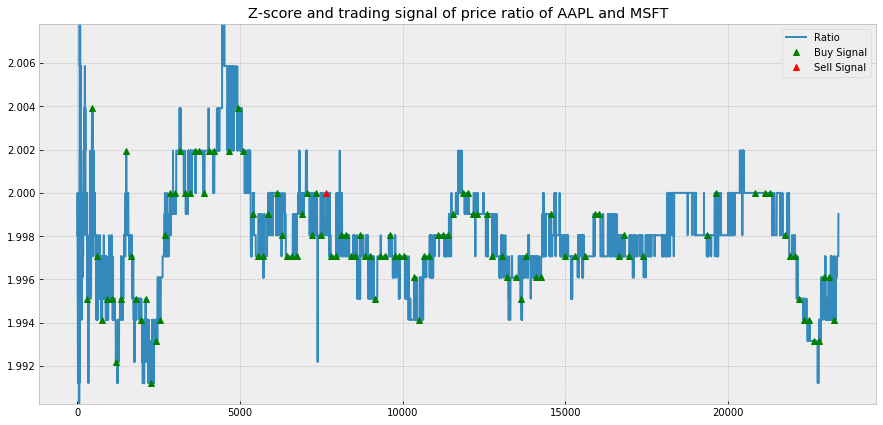

Trading signal of AAPL and MSFT for learning-based pair trading


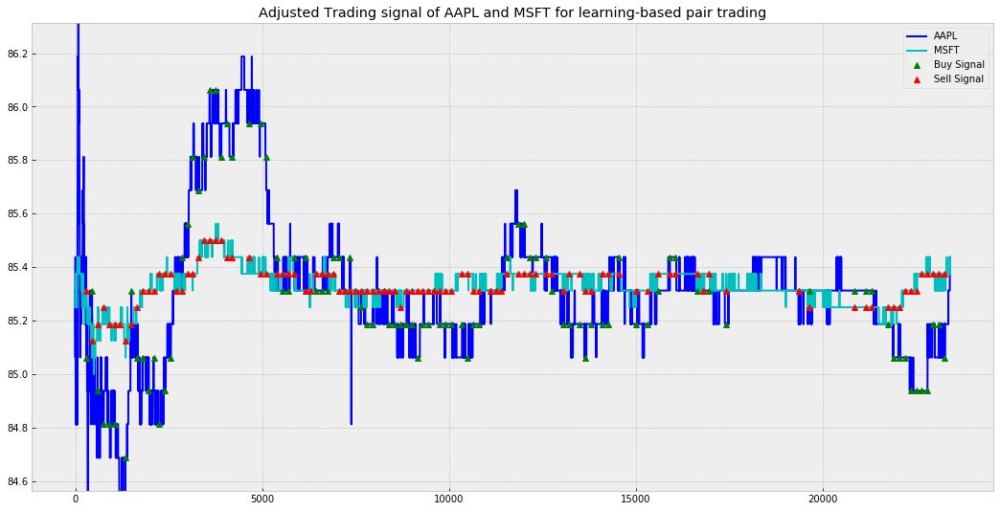

[Day 18]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

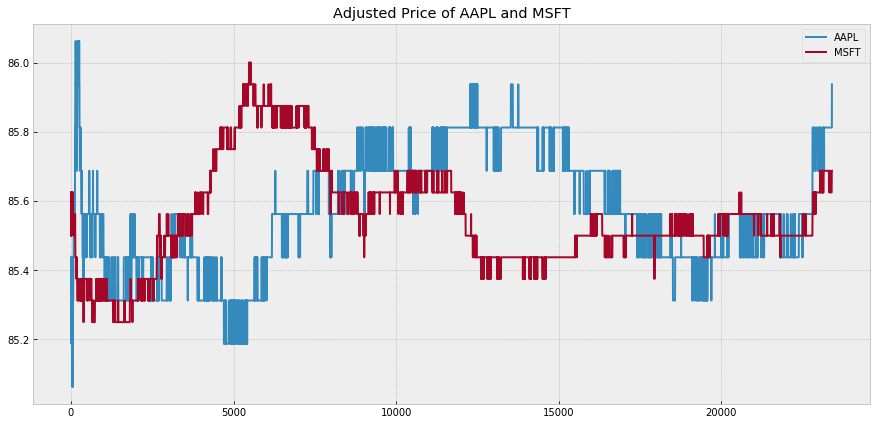

Plot z-score and trading signal of price ratio of AAPL and MSFT


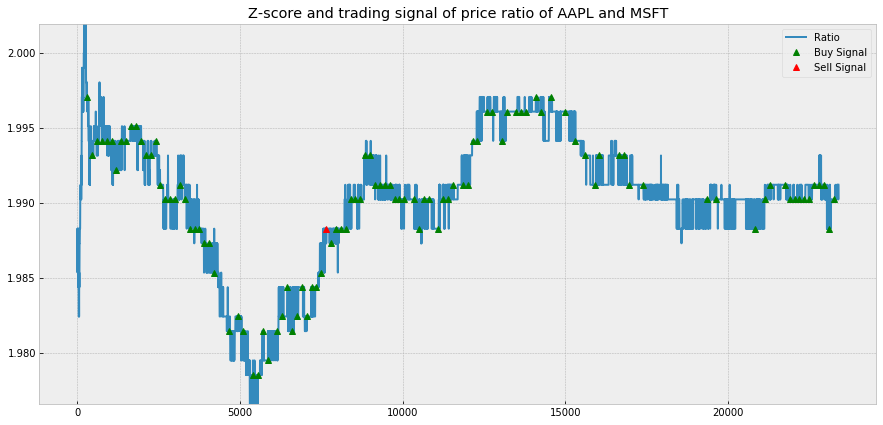

Trading signal of AAPL and MSFT for learning-based pair trading


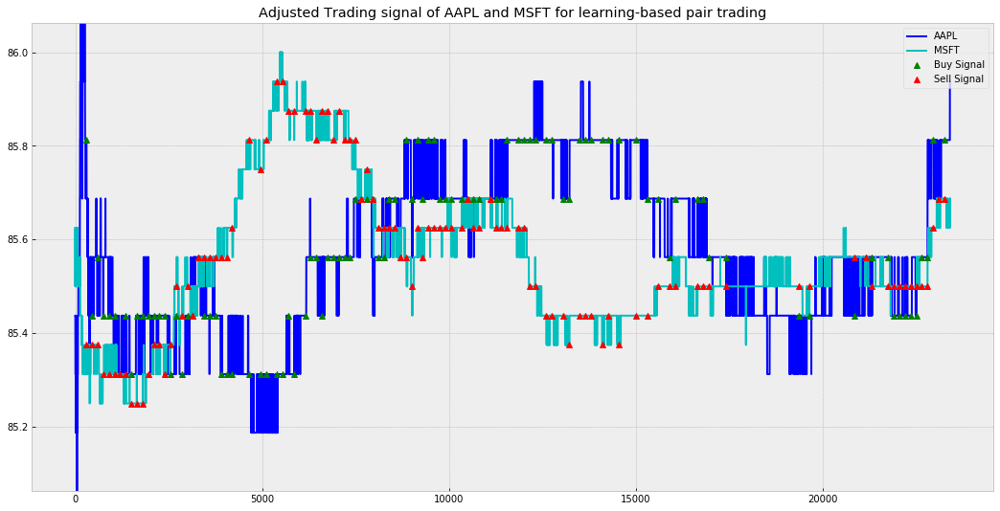

[Day 19]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

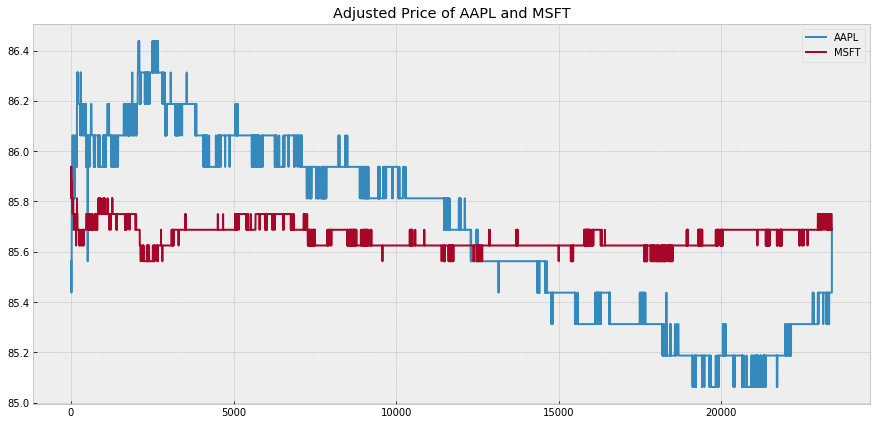

Plot z-score and trading signal of price ratio of AAPL and MSFT


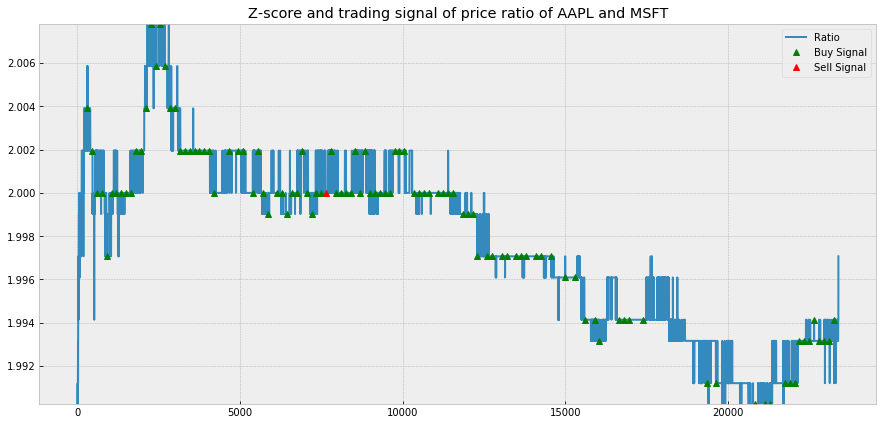

Trading signal of AAPL and MSFT for learning-based pair trading


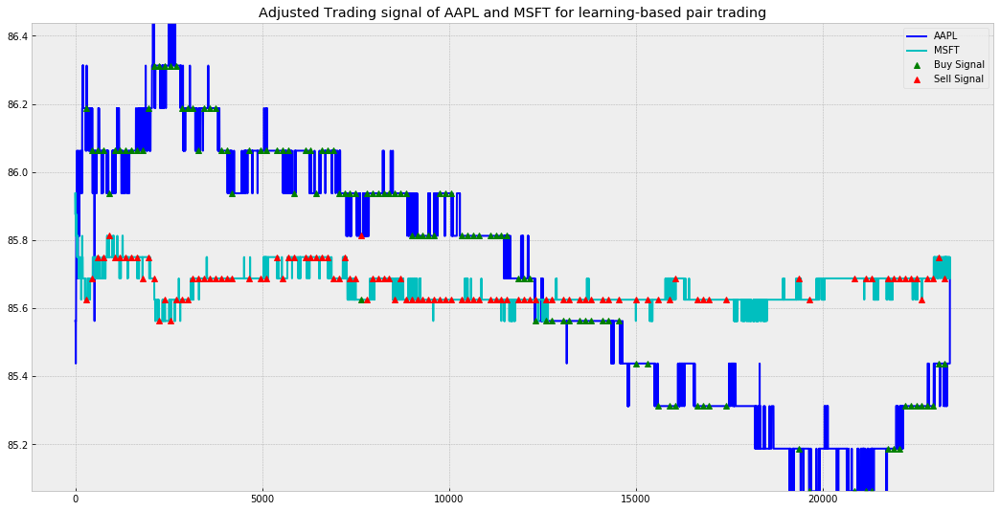

[Day 20]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 3 1 0 1 1 3
 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1 0 1 3 1 1 0 1 1 0 1 3 0 3 1 1 0 1 1 0 1 0 0 1 0 3 0 1 0 3 1 0 0 0 1 1
 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 3 1
 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1

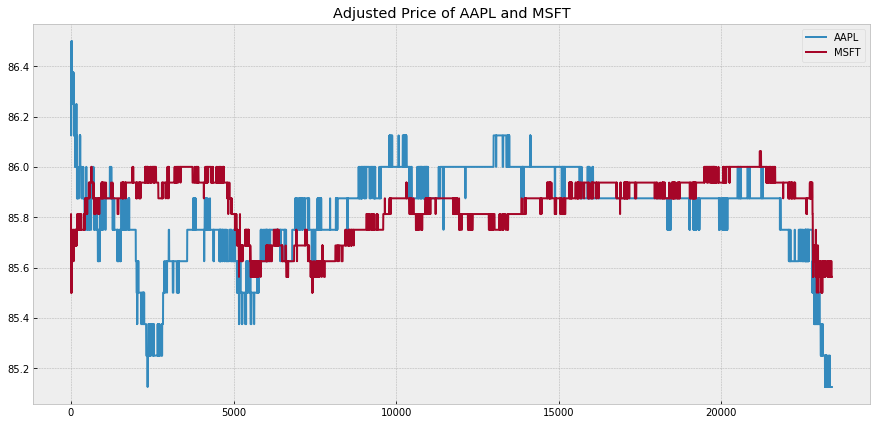

Plot z-score and trading signal of price ratio of AAPL and MSFT


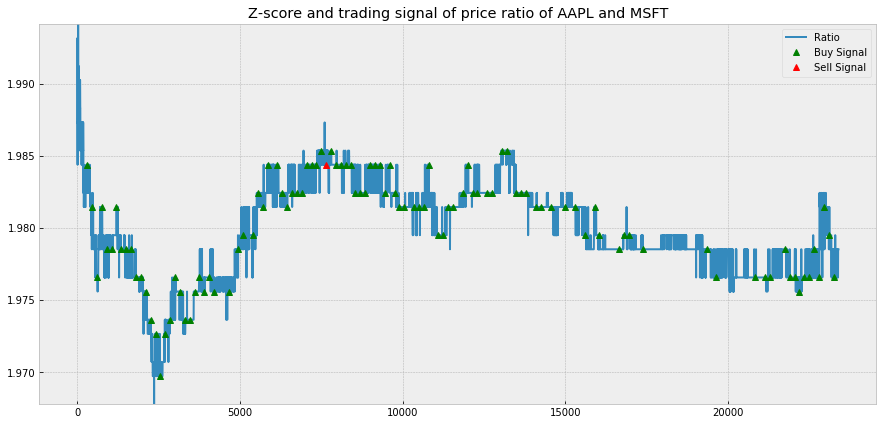

Trading signal of AAPL and MSFT for learning-based pair trading


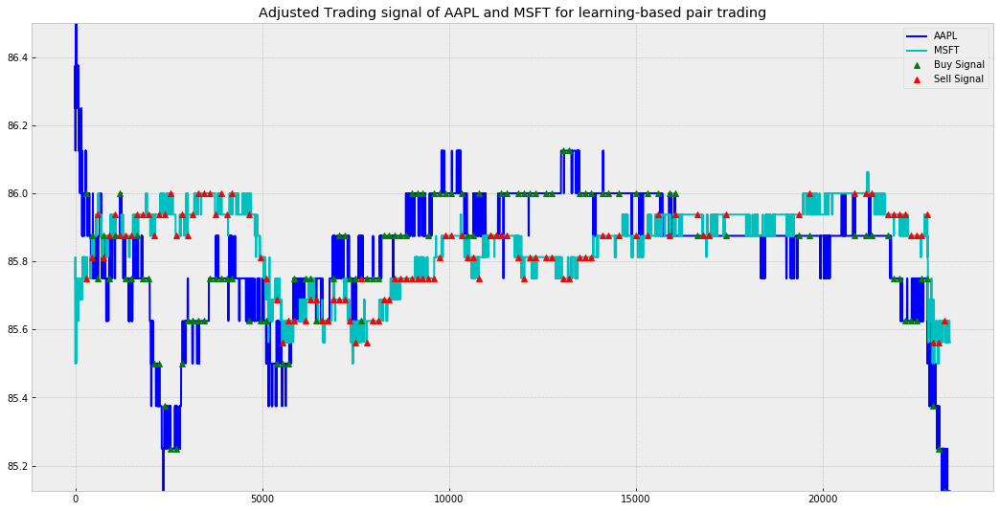

<Figure size 432x288 with 0 Axes>

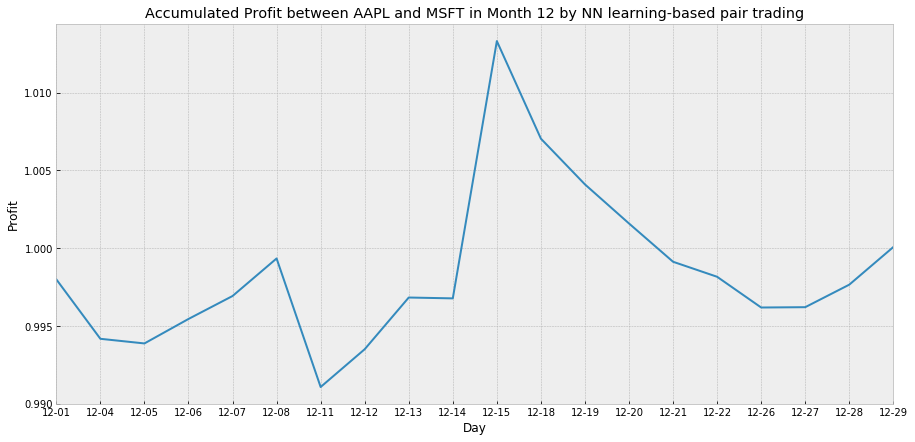

In [42]:
profit_day_DNN = []
signal = []
price_day_avg = []
predict_result_bm = {}
profit_Mode = 1
for i in range(day_test):
    print("[Day %s]" % str(i+1))
    S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
    S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
    price_day_avg.append(np.mean(S1.values) + np.mean(S2.values))
    result = NN_trade(S1, S2, p[0], p[1], price_data_for_test, price_and_return_for_test, bm_model, i, show_print = 1, fee = 0, profit_Mode = profit_Mode, bm = 1)
    profit_day_DNN.append(result[0])
    signal.append([result[1], result[2]])
    predict_result_bm[i+1] = result[3]
    drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, result[1], result[2], mode = 'NN')
predict_result = predict_result_bm
    
# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day_DNN))
else:
    plt.plot(np.cumprod(profit_day_DNN))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by NN learning-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

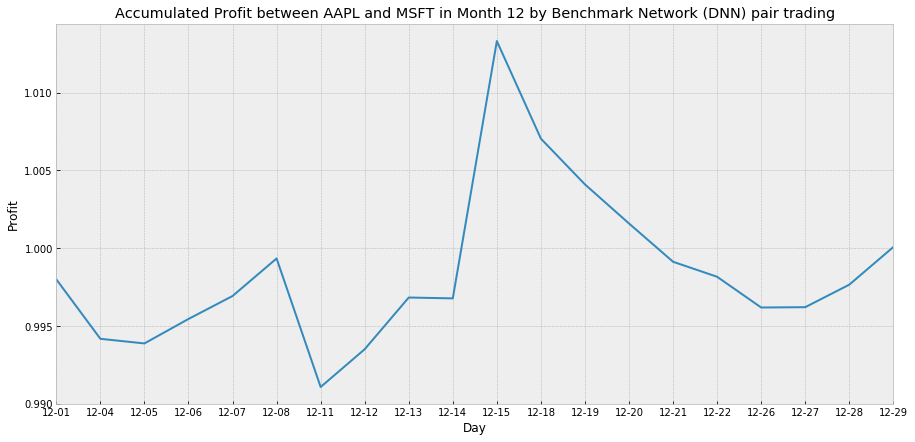

<Figure size 432x288 with 0 Axes>

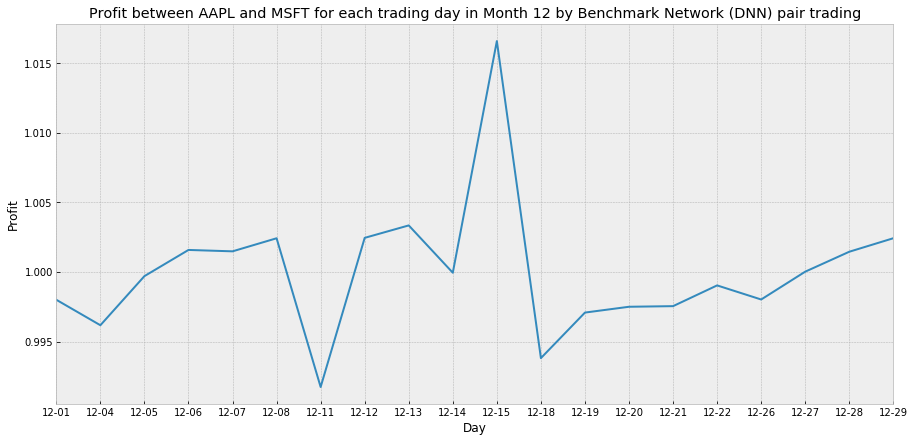

In [43]:
draw_profit(profit_day_DNN, date_test_noyear, period_test, mode = network, profit_Mode = profit_Mode)

In [44]:
profit_day_DNN

[0.9980023008574549,
 0.9961734258672675,
 0.9997007986371962,
 1.0015812741907633,
 1.0014813677978132,
 1.0024198321651197,
 0.9917368994774617,
 1.0024490927324288,
 1.003343016052414,
 0.9999452469729769,
 1.0165833423214543,
 0.9938121292340888,
 0.997082670801002,
 0.9975001976512077,
 0.9975443789529046,
 0.999034442340324,
 0.9980220584846728,
 1.0000207072945977,
 1.0014520256545831,
 1.0024223709315063]

In [45]:
predict_result_bm

{1: (array([1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 0, 0, 1, 0, 3, 1, 0, 1, 1, 3, 1, 0, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 3, 1, 1, 0, 1, 1, 0, 1, 3, 0,
         3, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 3, 0, 1, 0, 3, 1, 0, 0, 0, 1,
         1, 1, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1]),
  array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1,

1.0000779832126665


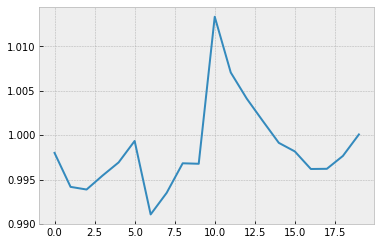

In [46]:
# profit rate
print(np.cumprod(profit_day_DNN)[-1])
plt.plot(np.cumprod(profit_day_DNN))

In [47]:
test_realacc_DNN = cal_predict_true_acc(all_com_pair_P, qtype, day_test)
test_realacc_DNN

Day 1
Index of day start :  0
Q1 real accuracy :  0.3116883116883117
Q2 real accuracy :  0.4090909090909091
Q3 real accuracy :  0.2792207792207792
Day 2
Index of day start :  375144
Q1 real accuracy :  0.2532467532467532
Q2 real accuracy :  0.4675324675324675
Q3 real accuracy :  0.2857142857142857
Day 3
Index of day start :  750288
Q1 real accuracy :  0.33116883116883117
Q2 real accuracy :  0.42207792207792205
Q3 real accuracy :  0.3246753246753247
Day 4
Index of day start :  1125432
Q1 real accuracy :  0.3246753246753247
Q2 real accuracy :  0.3961038961038961
Q3 real accuracy :  0.38961038961038963
Day 5
Index of day start :  1500576
Q1 real accuracy :  0.2987012987012987
Q2 real accuracy :  0.38961038961038963
Q3 real accuracy :  0.3051948051948052
Day 6
Index of day start :  1875720
Q1 real accuracy :  0.3116883116883117
Q2 real accuracy :  0.3961038961038961
Q3 real accuracy :  0.3116883116883117
Day 7
Index of day start :  2250864
Q1 real accuracy :  0.36363636363636365
Q2 real ac

{1: [0.3116883116883117, 0.4090909090909091, 0.2792207792207792],
 2: [0.2532467532467532, 0.4675324675324675, 0.2857142857142857],
 3: [0.33116883116883117, 0.42207792207792205, 0.3246753246753247],
 4: [0.3246753246753247, 0.3961038961038961, 0.38961038961038963],
 5: [0.2987012987012987, 0.38961038961038963, 0.3051948051948052],
 6: [0.3116883116883117, 0.3961038961038961, 0.3116883116883117],
 7: [0.36363636363636365, 0.36363636363636365, 0.2532467532467532],
 8: [0.2857142857142857, 0.36363636363636365, 0.2792207792207792],
 9: [0.3051948051948052, 0.37662337662337664, 0.2792207792207792],
 10: [0.2792207792207792, 0.4025974025974026, 0.2922077922077922],
 11: [0.3246753246753247, 0.37012987012987014, 0.3246753246753247],
 12: [0.3181818181818182, 0.38961038961038963, 0.2987012987012987],
 13: [0.3181818181818182, 0.36363636363636365, 0.3051948051948052],
 14: [0.3116883116883117, 0.37662337662337664, 0.3051948051948052],
 15: [0.3181818181818182, 0.3246753246753247, 0.31818181818

## 1DCNN-based Pairs Trading

[Day 1]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

Current profit :   profit -  0.9980205607489743
[Exit position] profit 0.9980205607489743 | price ratios 2.029828486204325 | C1 0 pos | C2 0 pos
AAPL price - 170.25, earn : 0.0 | MSFT price - 83.875, earn : 0.0 |
---------[Time = 13350 to 13500]---------
Current profit :   profit -  0.9980205607489743
[Exit position] profit 0.9980205607489743 | price ratios 2.029806259314456 | C1 0 pos | C2 0 pos
AAPL price - 170.5, earn : 0.0 | MSFT price - 83.875, earn : 0.0 |
---------[Time = 13500 to 13650]---------
Current profit :   profit -  0.9980205607489743
[Exit position] profit 0.9980205607489743 | price ratios 2.0327868852459017 | C1 0 pos | C2 0 pos
AAPL price - 170.25, earn : 0.0 | MSFT price - 83.8125, earn : 0.0 |
---------[Time = 13650 to 13800]---------
Current profit :   profit -  0.9980205607489743
[Exit position] profit 0.9980205607489743 | price ratios 2.0313199105145414 | C1 0 pos | C2 0 pos
AAPL price - 170.5, earn : 0.0 | MSFT price - 83.8125, earn : 0.0 |
---------[Time = 138

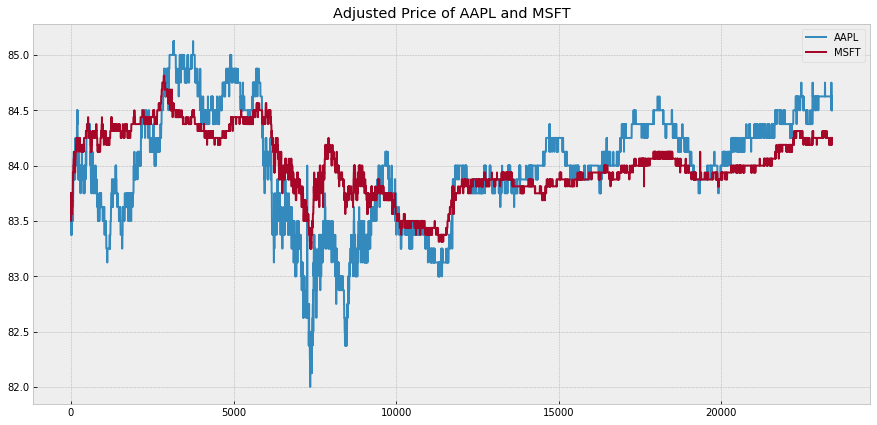

Plot z-score and trading signal of price ratio of AAPL and MSFT


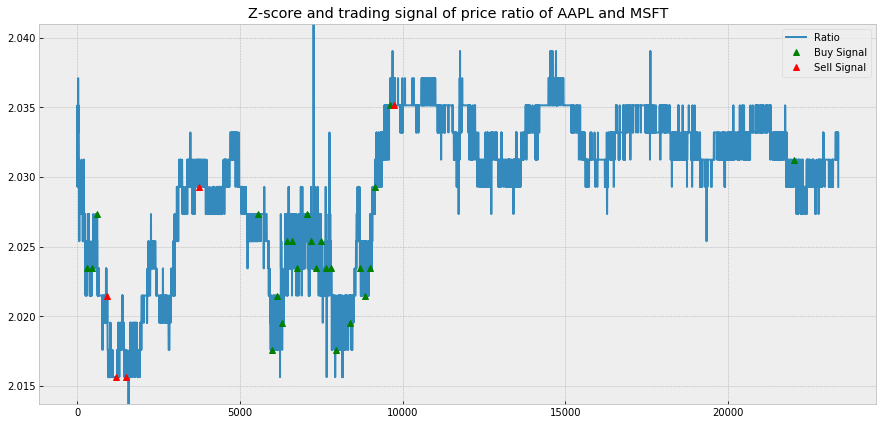

Trading signal of AAPL and MSFT for learning-based pair trading


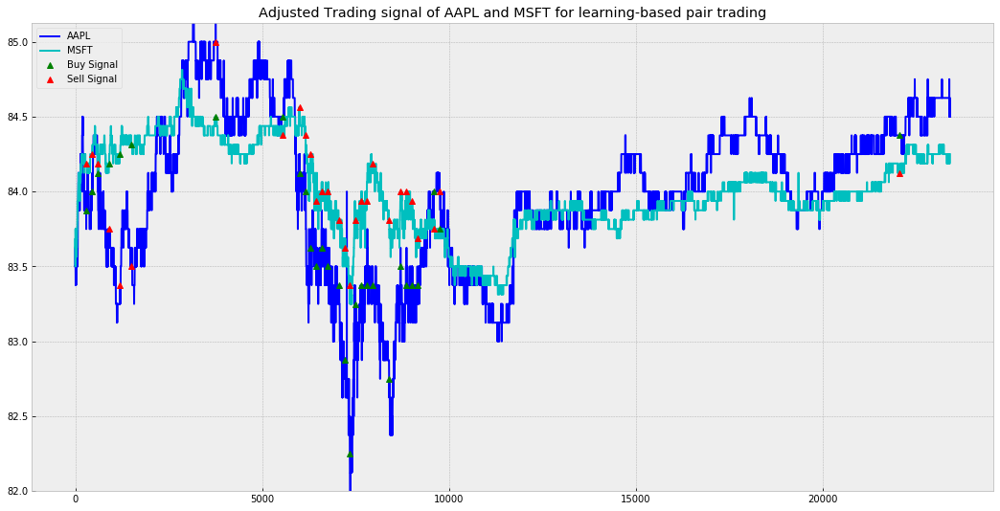

[Day 2]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

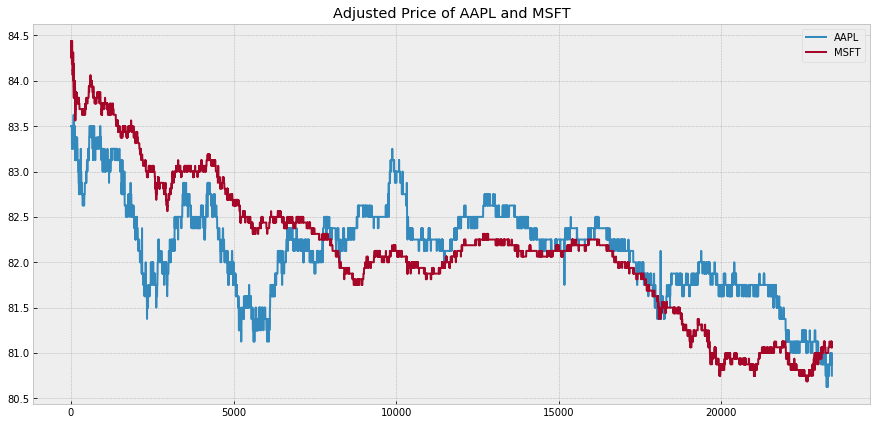

Plot z-score and trading signal of price ratio of AAPL and MSFT


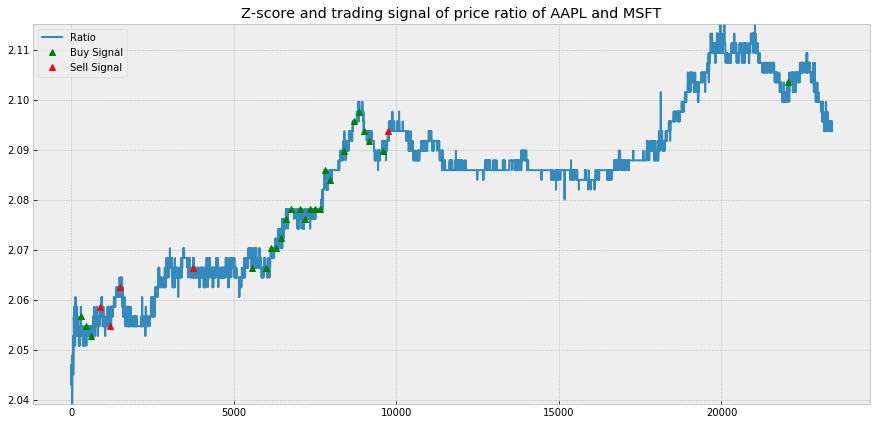

Trading signal of AAPL and MSFT for learning-based pair trading


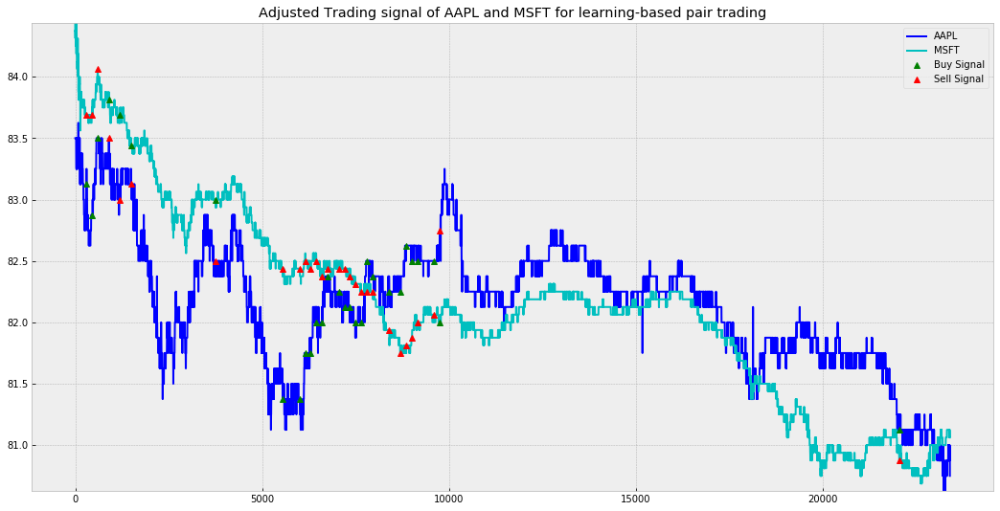

[Day 3]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

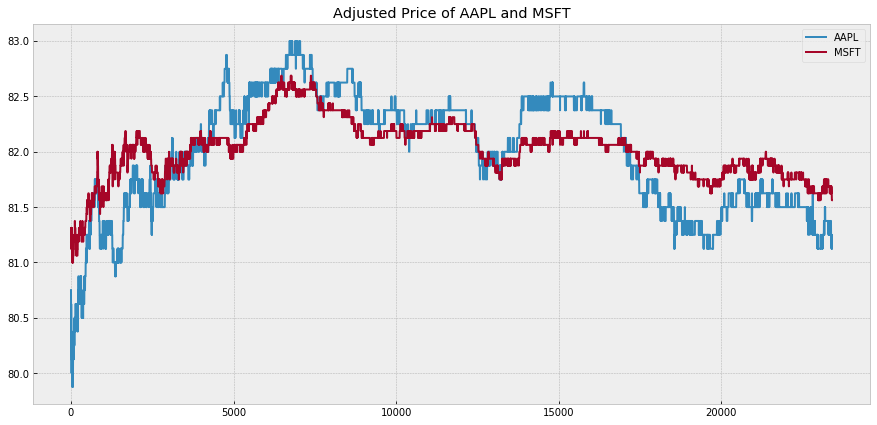

Plot z-score and trading signal of price ratio of AAPL and MSFT


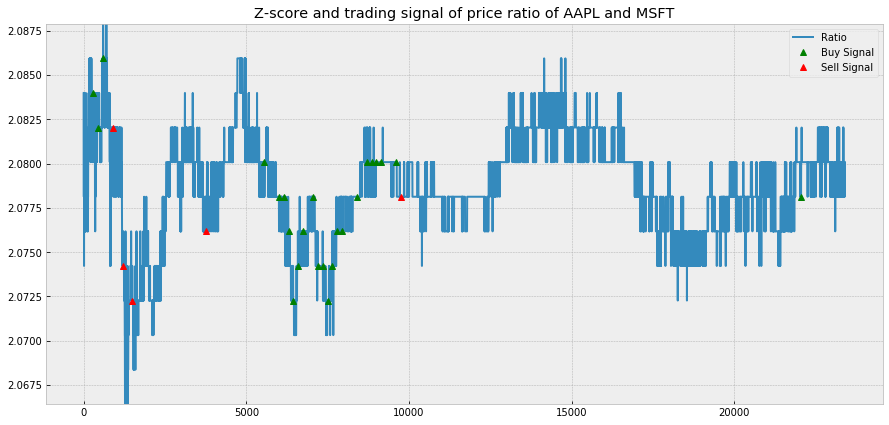

Trading signal of AAPL and MSFT for learning-based pair trading


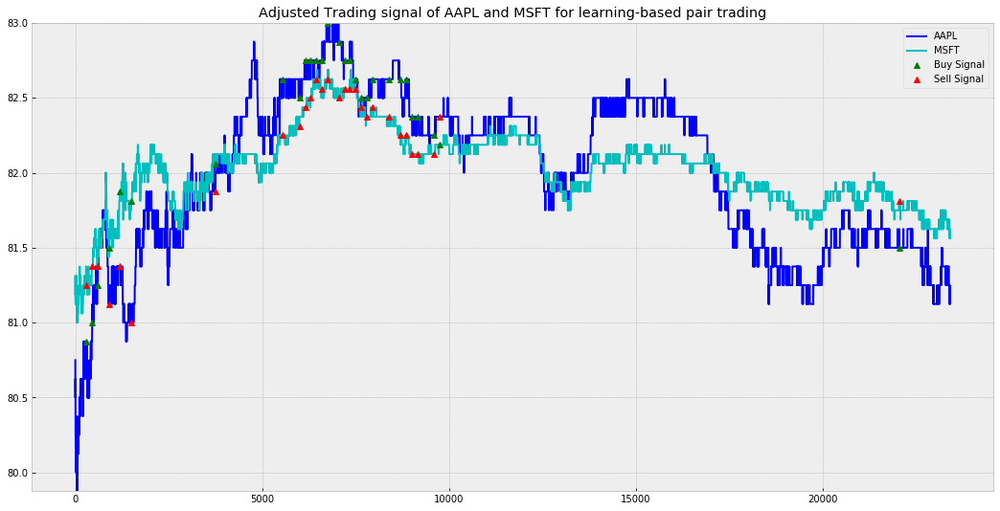

[Day 4]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

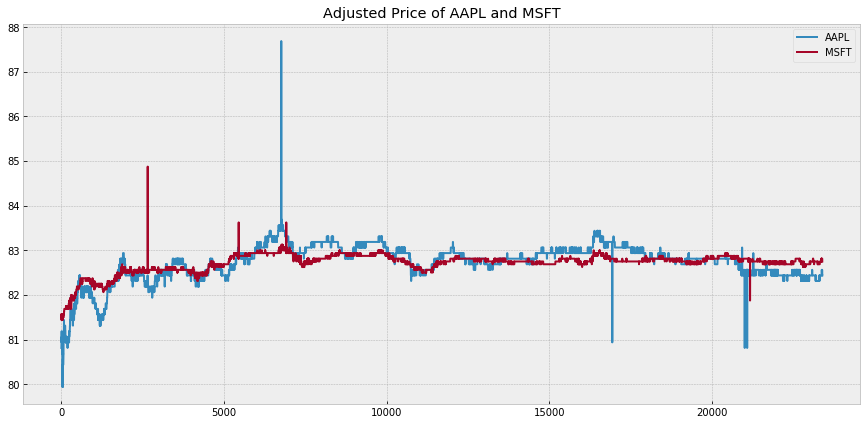

Plot z-score and trading signal of price ratio of AAPL and MSFT


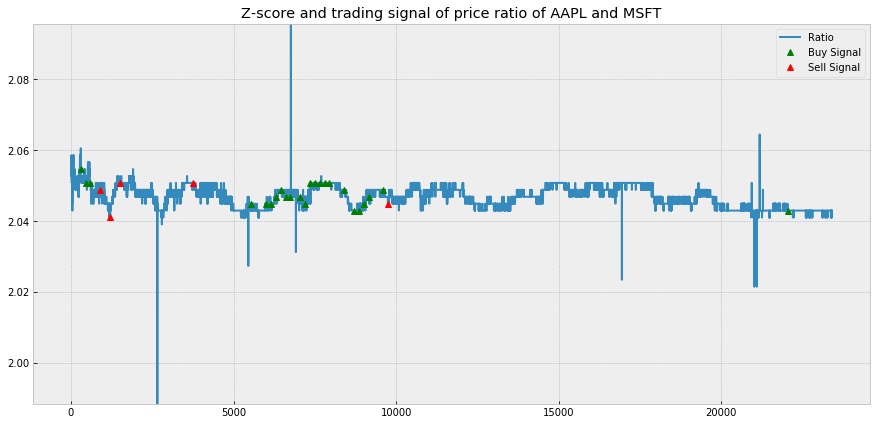

Trading signal of AAPL and MSFT for learning-based pair trading


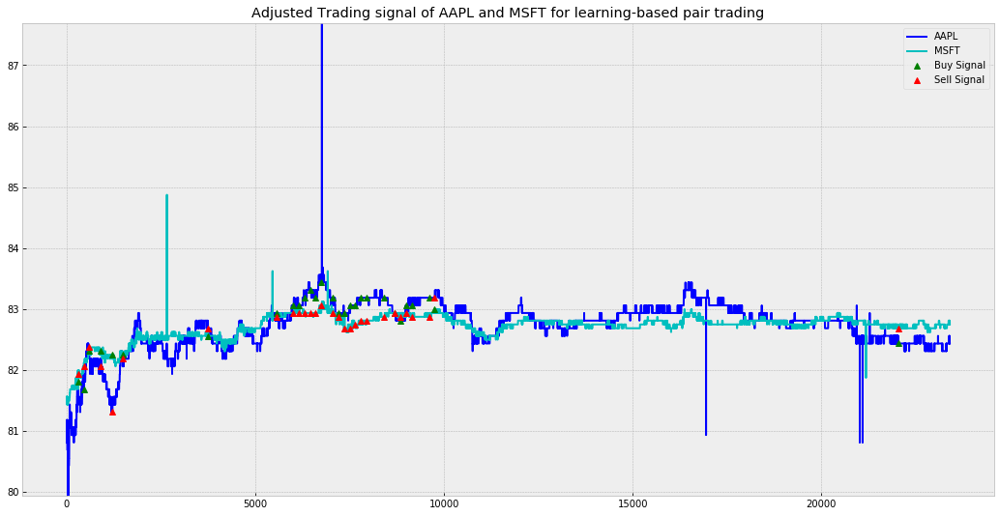

[Day 5]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

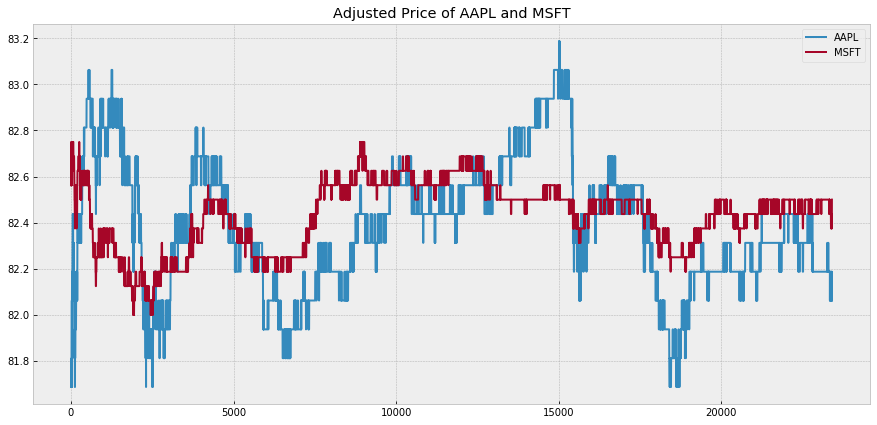

Plot z-score and trading signal of price ratio of AAPL and MSFT


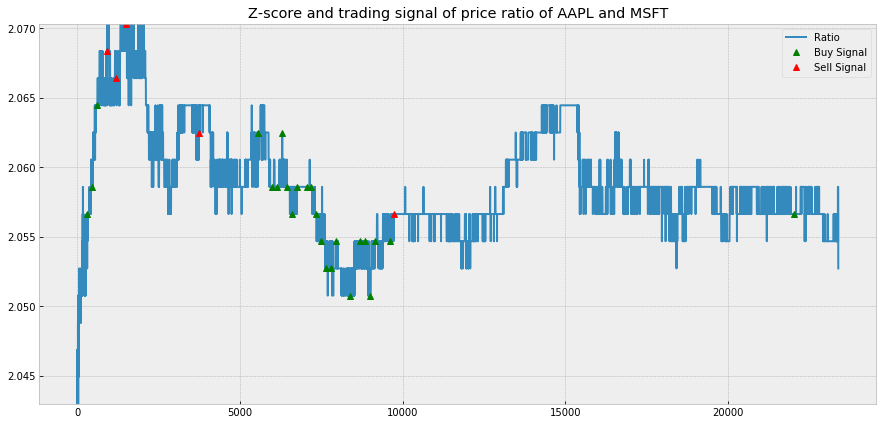

Trading signal of AAPL and MSFT for learning-based pair trading


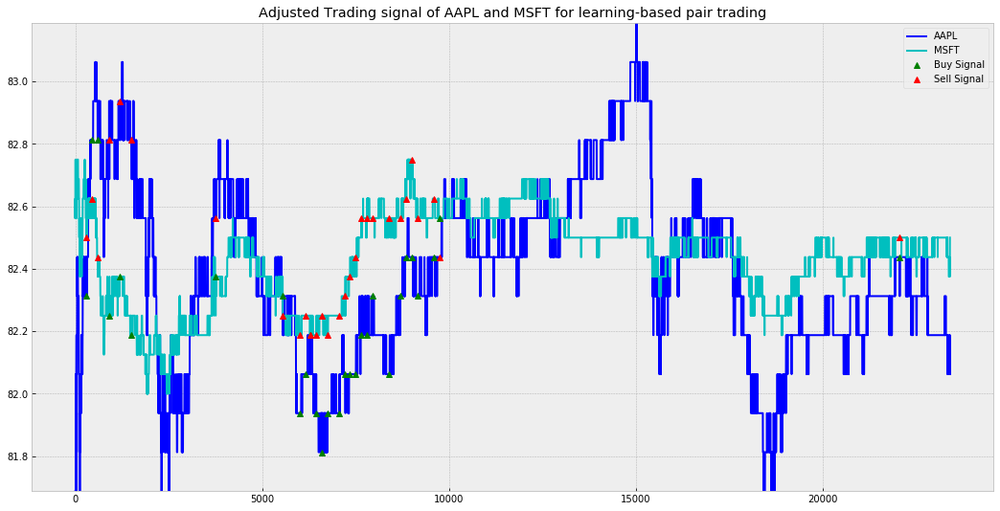

[Day 6]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

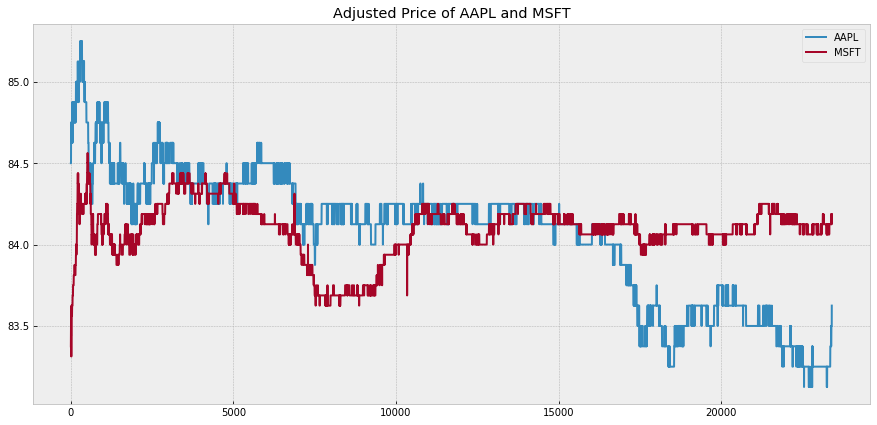

Plot z-score and trading signal of price ratio of AAPL and MSFT


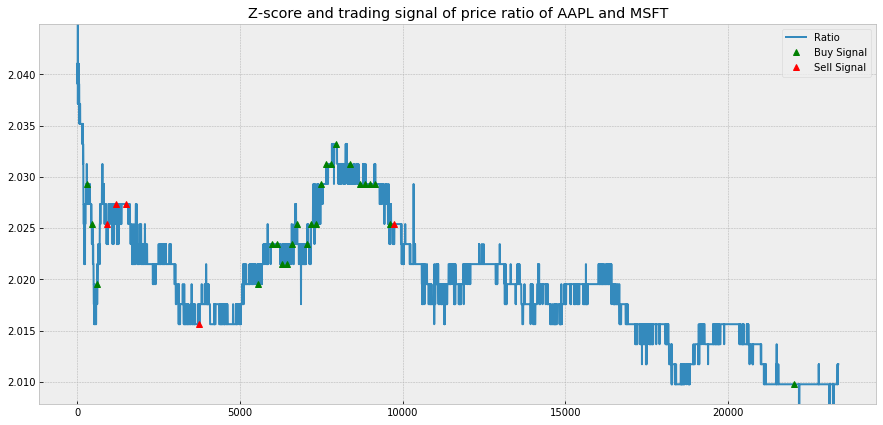

Trading signal of AAPL and MSFT for learning-based pair trading


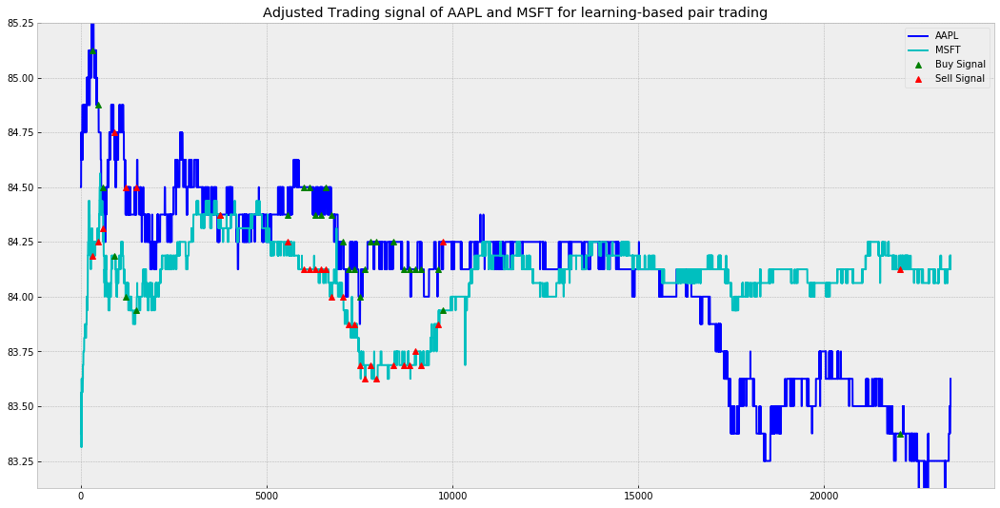

[Day 7]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

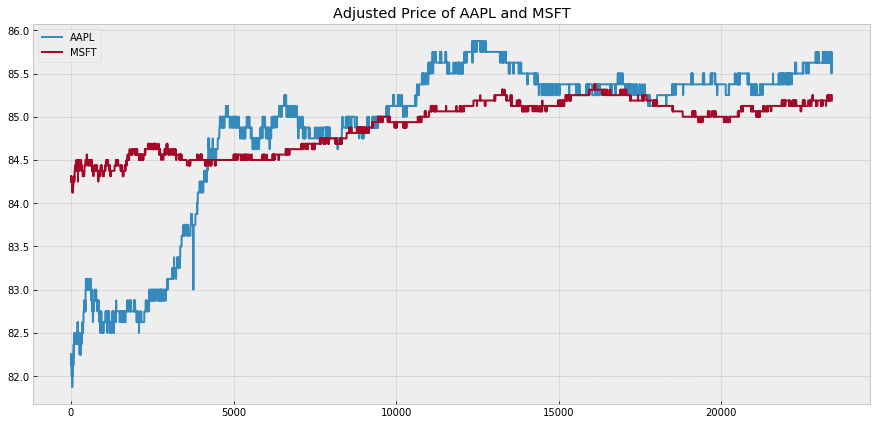

Plot z-score and trading signal of price ratio of AAPL and MSFT


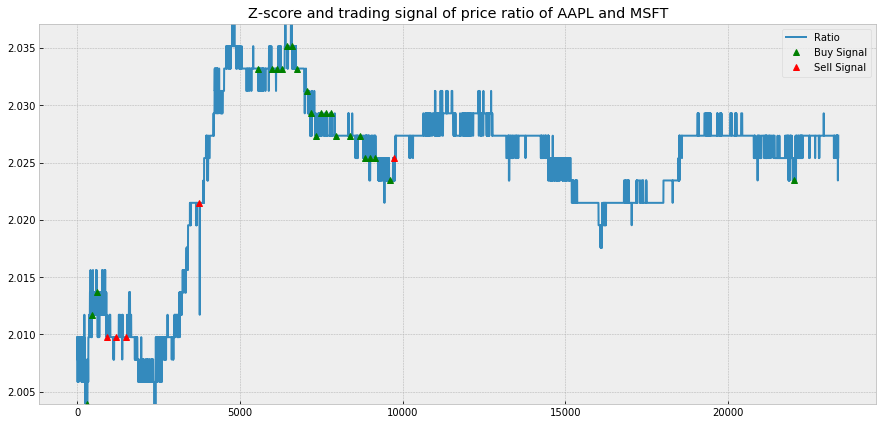

Trading signal of AAPL and MSFT for learning-based pair trading


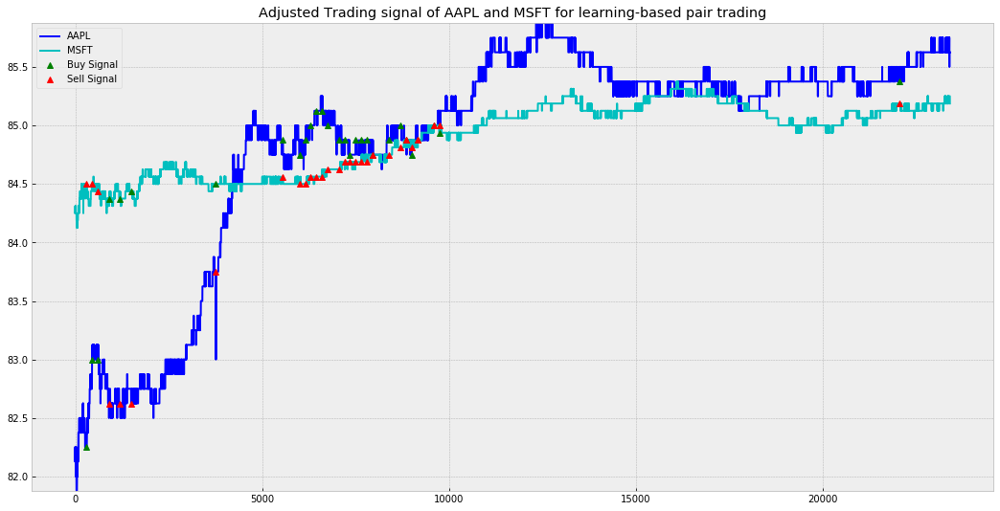

[Day 8]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

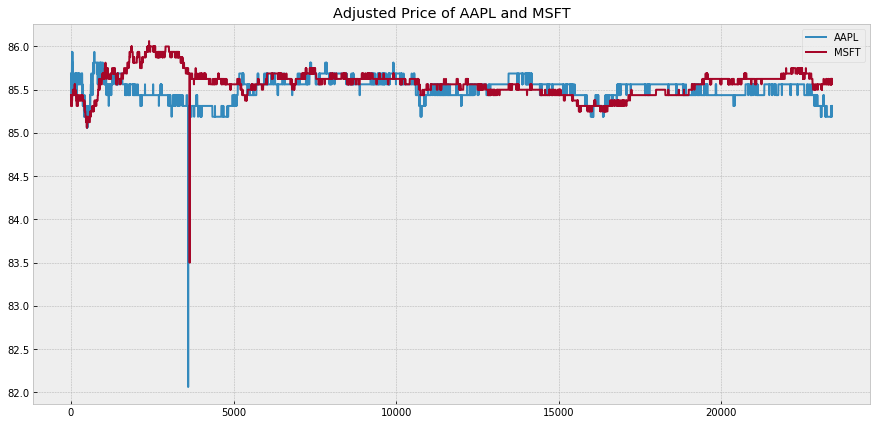

Plot z-score and trading signal of price ratio of AAPL and MSFT


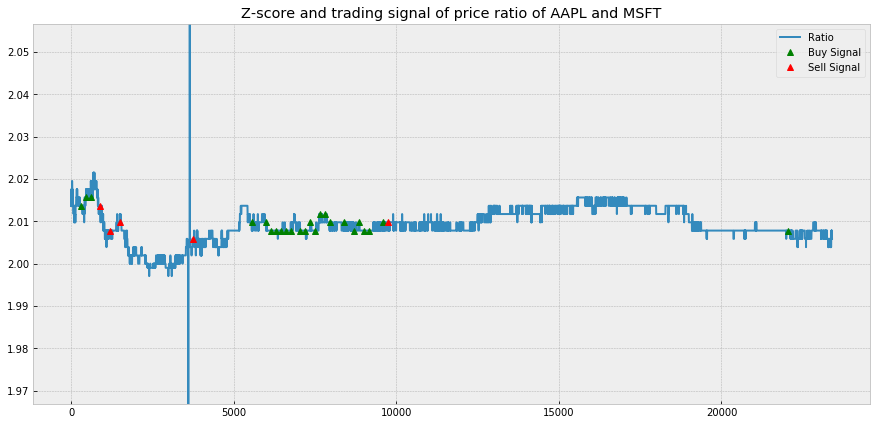

Trading signal of AAPL and MSFT for learning-based pair trading


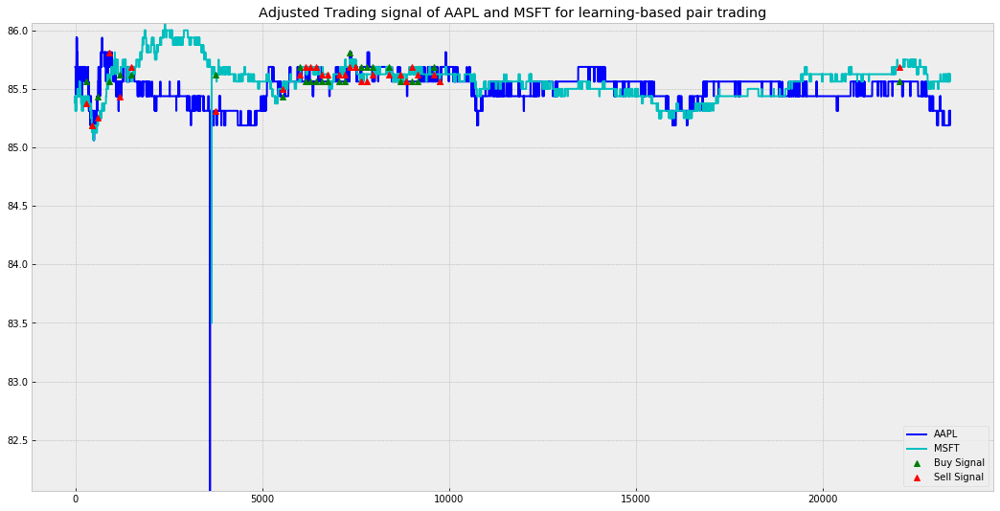

[Day 9]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 

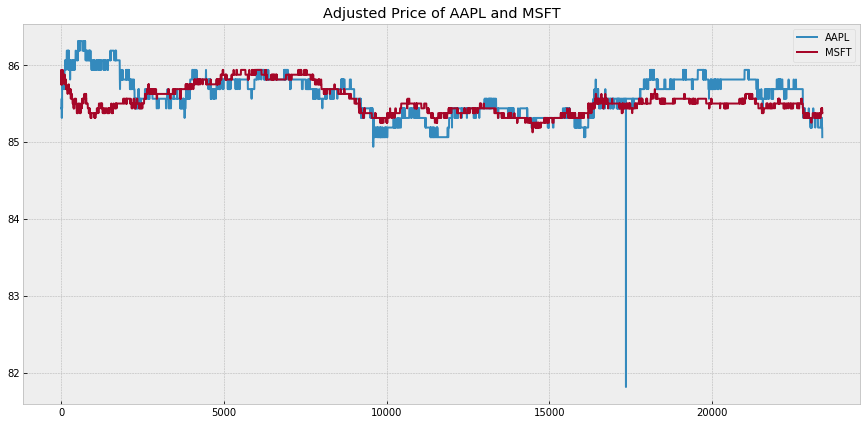

Plot z-score and trading signal of price ratio of AAPL and MSFT


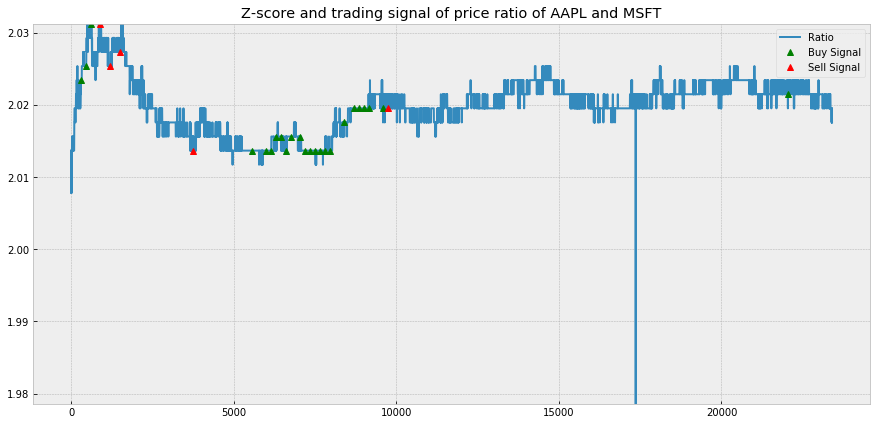

Trading signal of AAPL and MSFT for learning-based pair trading


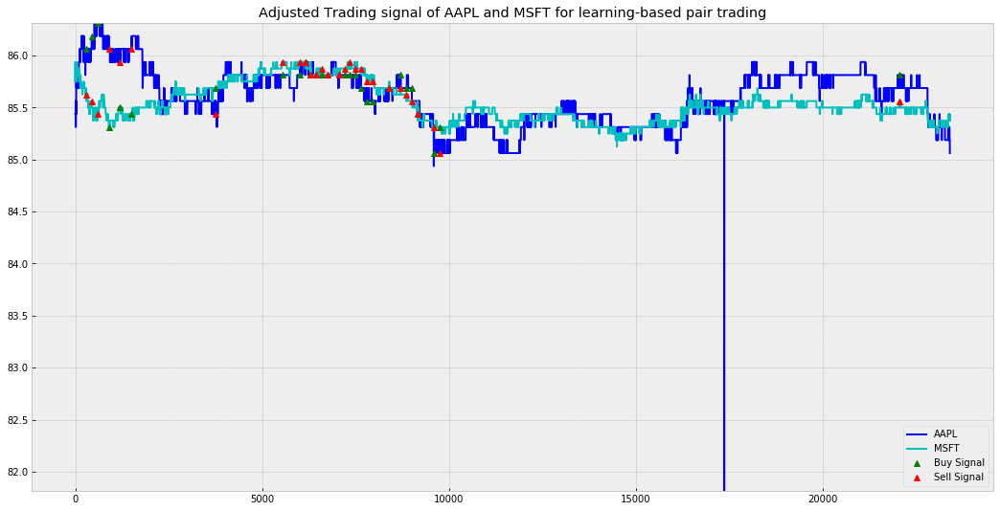

[Day 10]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

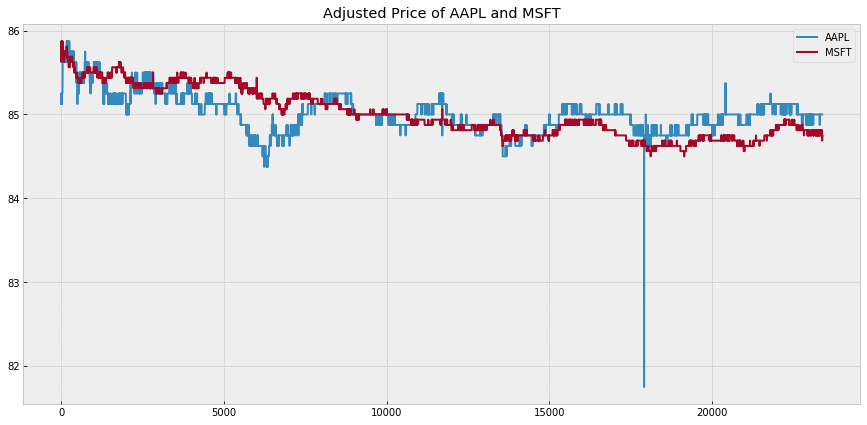

Plot z-score and trading signal of price ratio of AAPL and MSFT


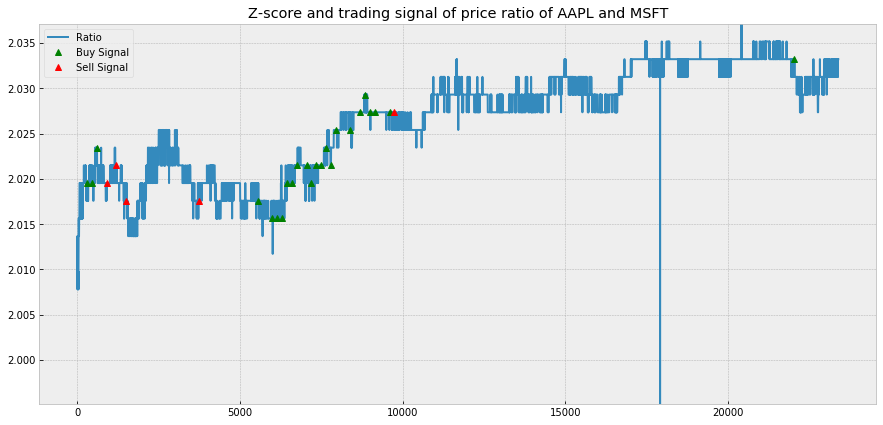

Trading signal of AAPL and MSFT for learning-based pair trading


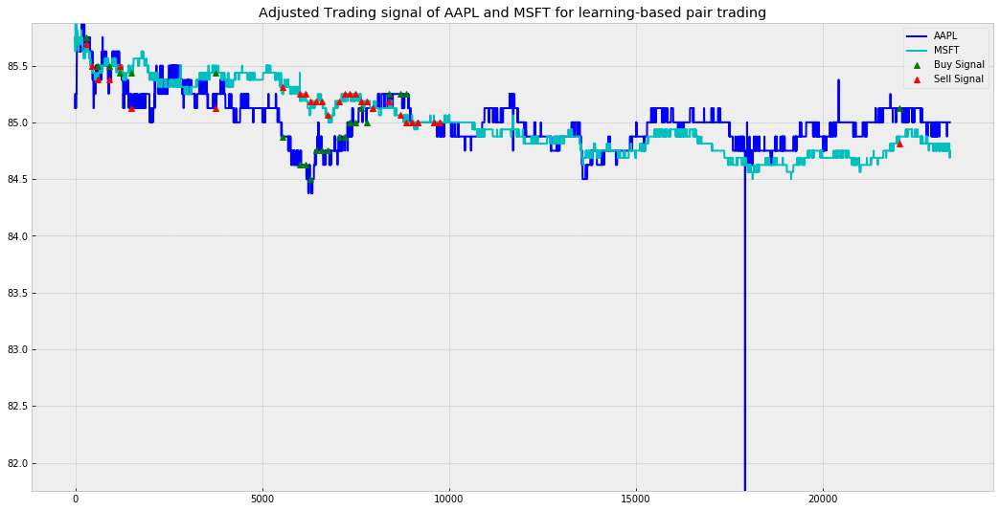

[Day 11]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

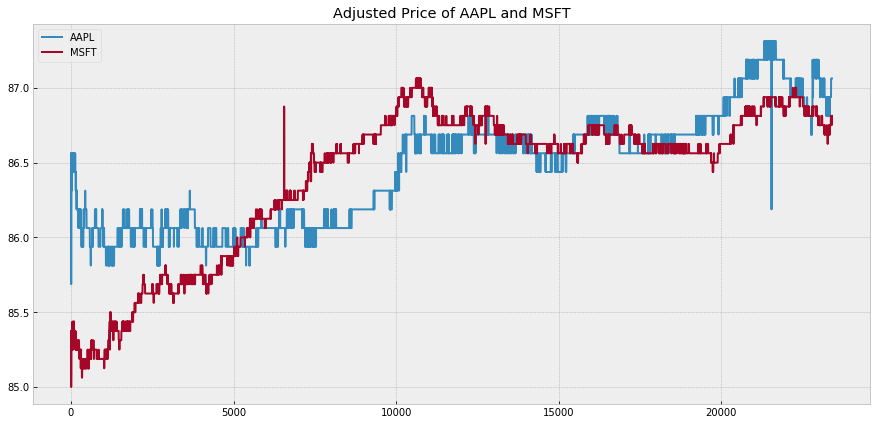

Plot z-score and trading signal of price ratio of AAPL and MSFT


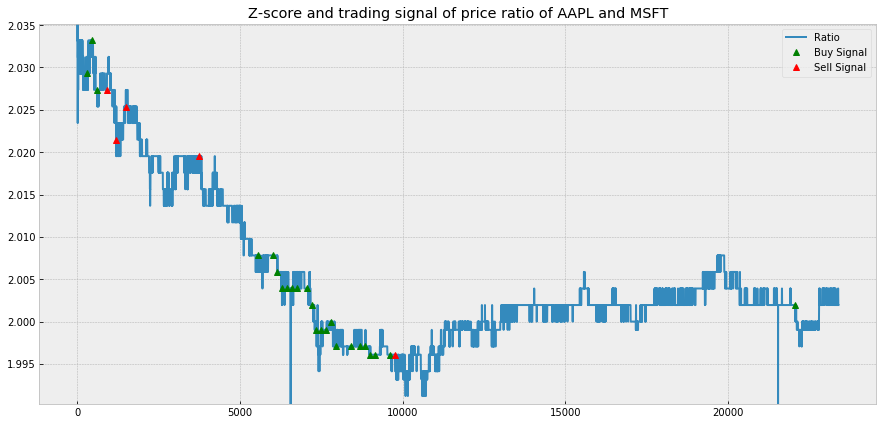

Trading signal of AAPL and MSFT for learning-based pair trading


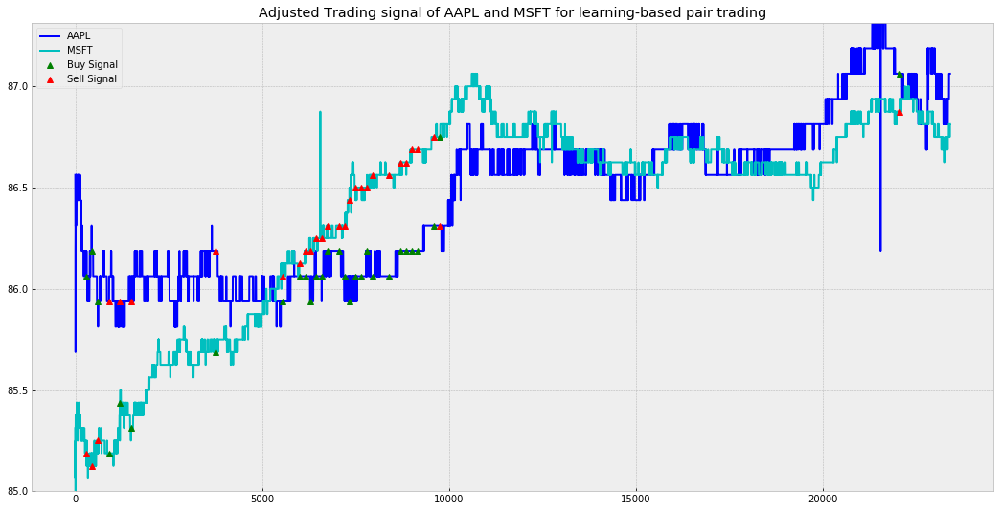

[Day 12]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

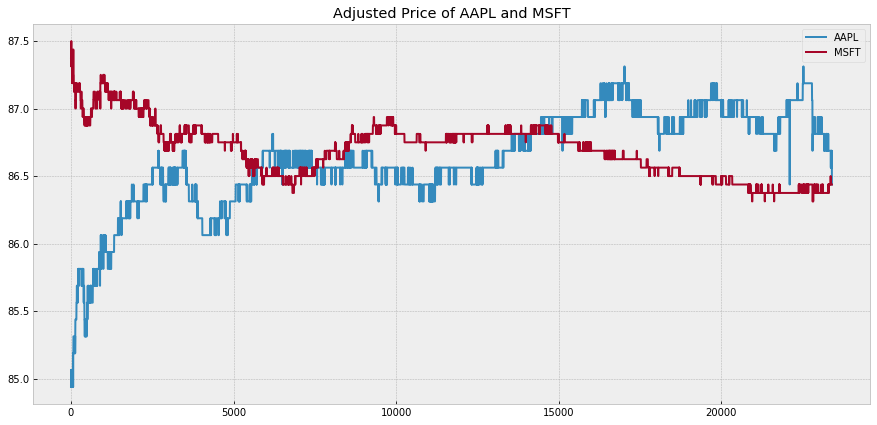

Plot z-score and trading signal of price ratio of AAPL and MSFT


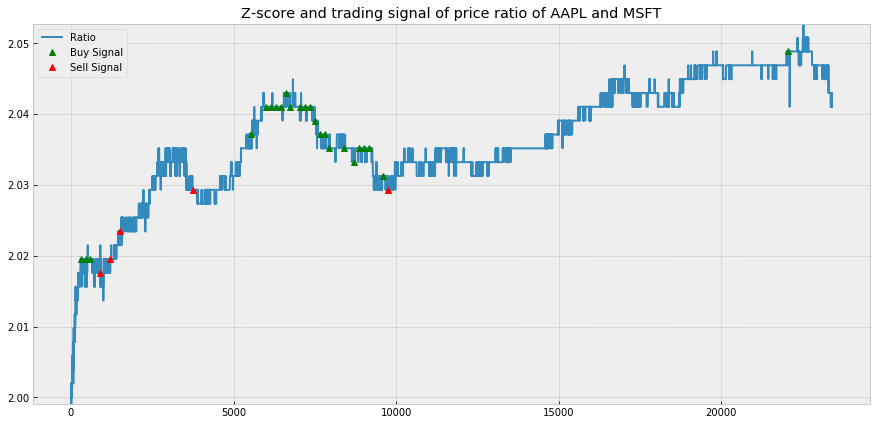

Trading signal of AAPL and MSFT for learning-based pair trading


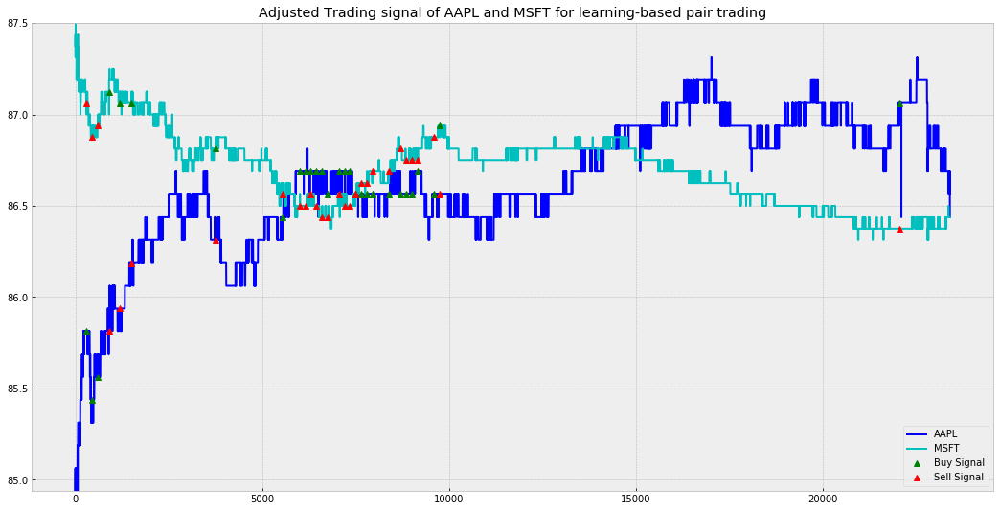

[Day 13]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

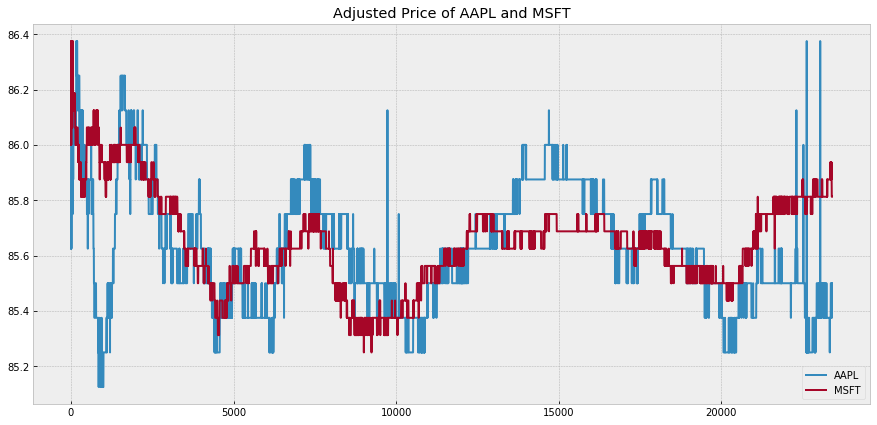

Plot z-score and trading signal of price ratio of AAPL and MSFT


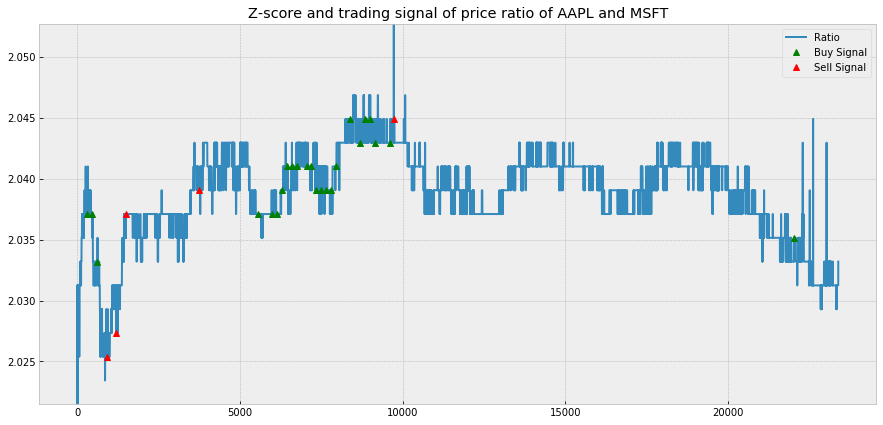

Trading signal of AAPL and MSFT for learning-based pair trading


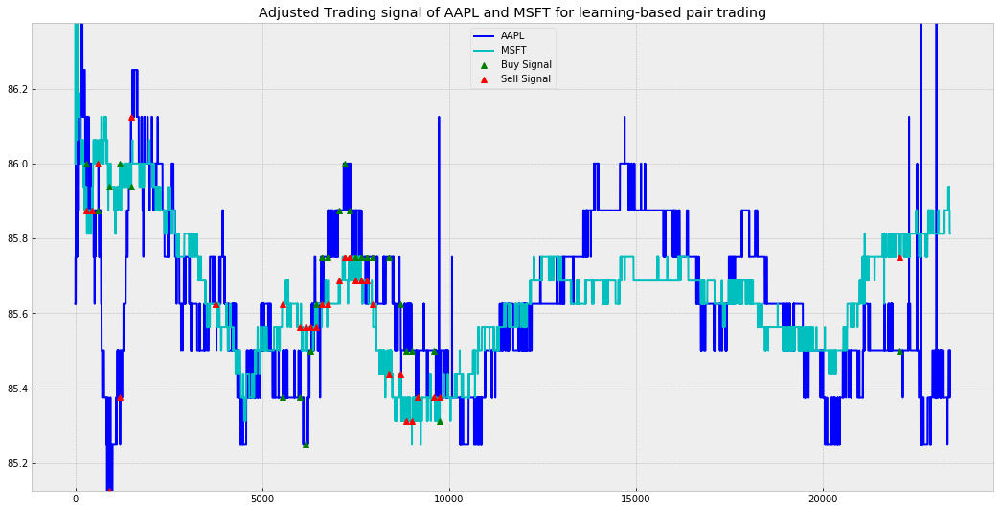

[Day 14]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

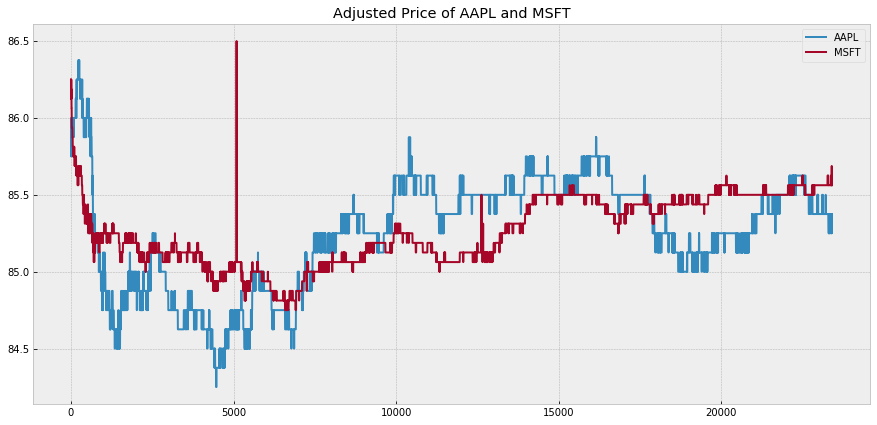

Plot z-score and trading signal of price ratio of AAPL and MSFT


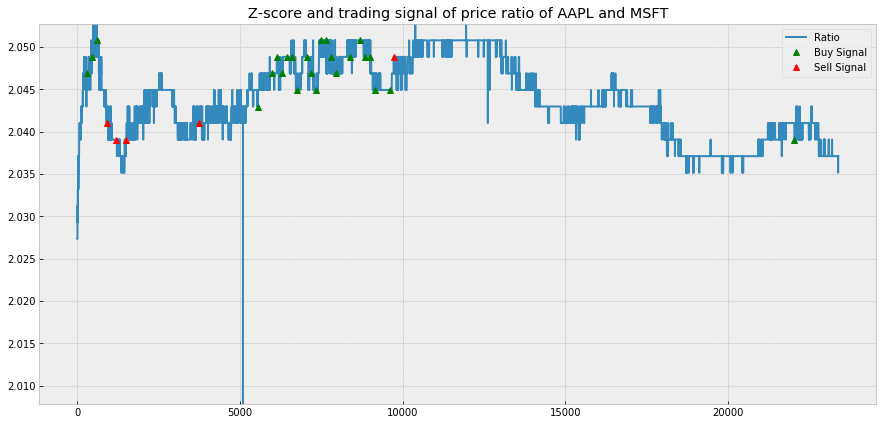

Trading signal of AAPL and MSFT for learning-based pair trading


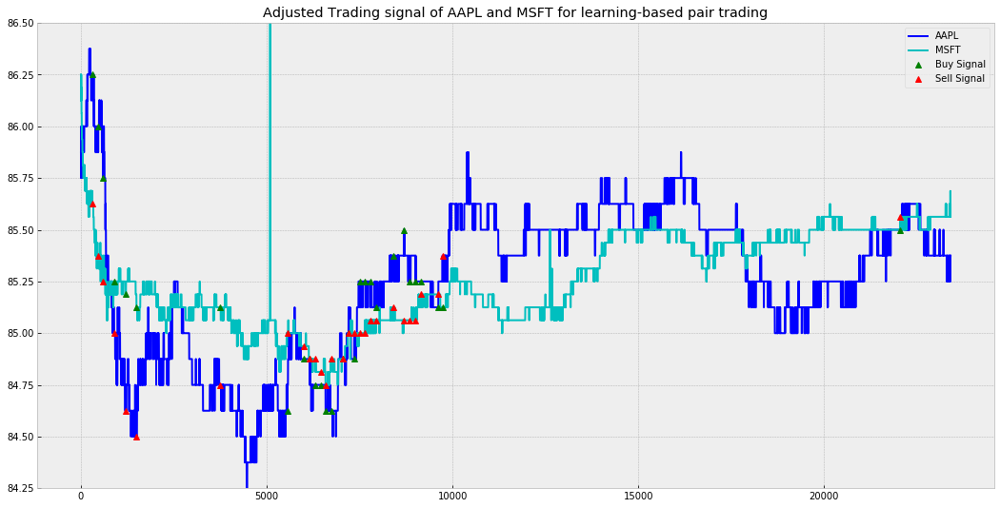

[Day 15]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

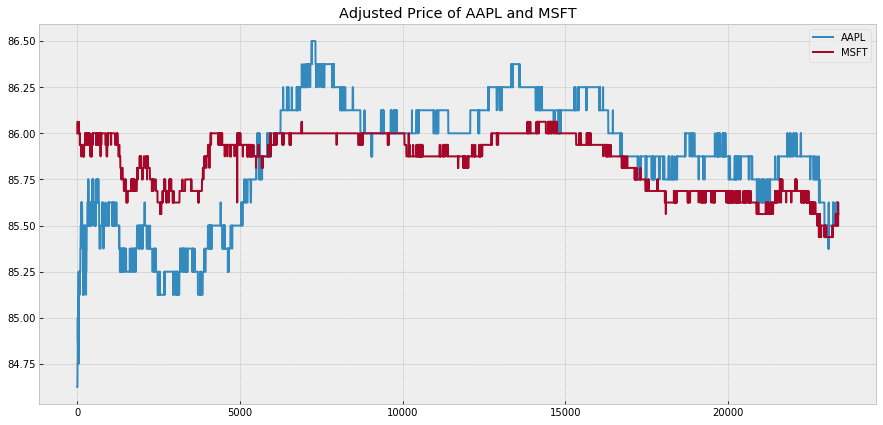

Plot z-score and trading signal of price ratio of AAPL and MSFT


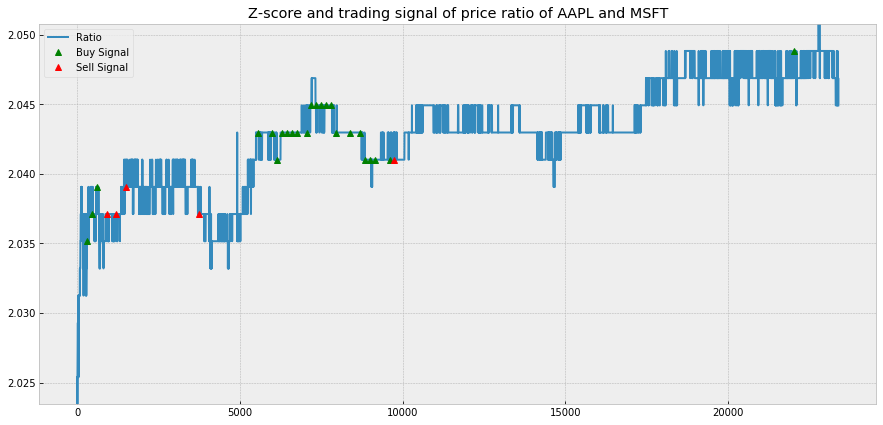

Trading signal of AAPL and MSFT for learning-based pair trading


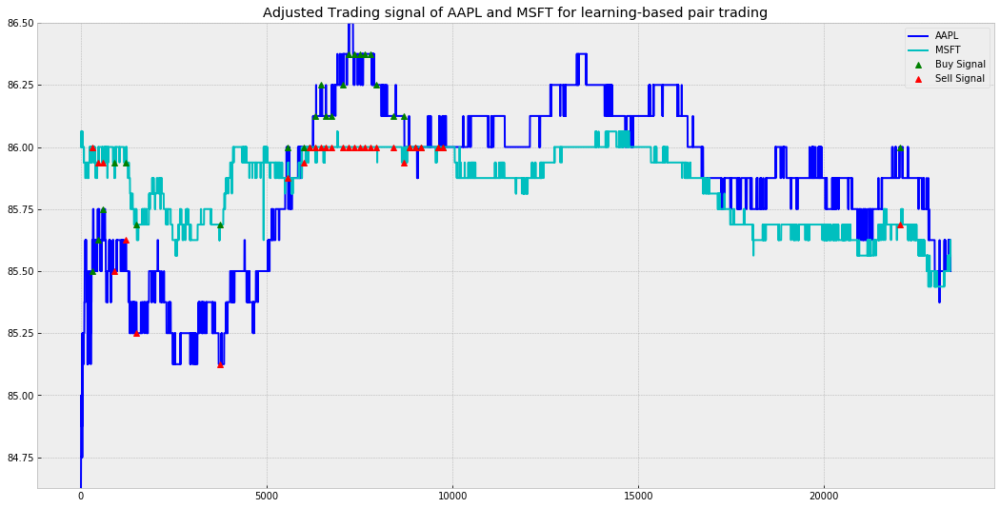

[Day 16]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

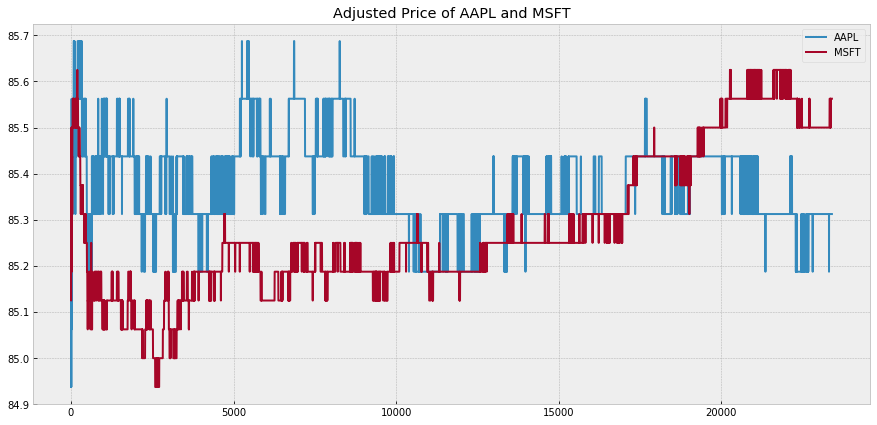

Plot z-score and trading signal of price ratio of AAPL and MSFT


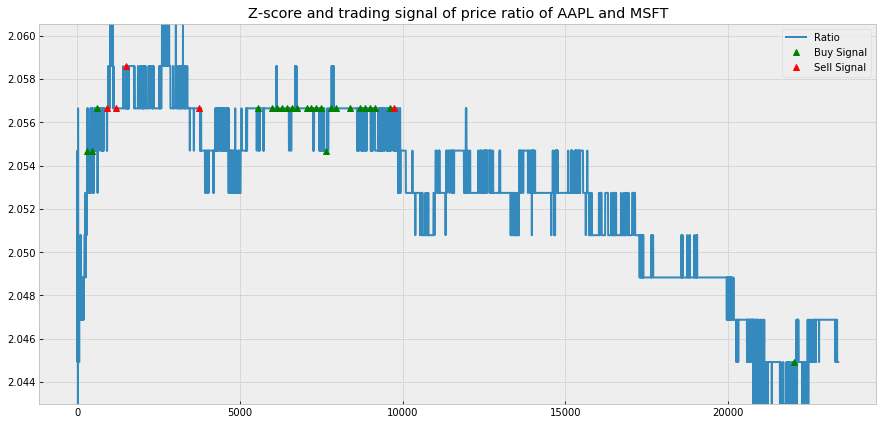

Trading signal of AAPL and MSFT for learning-based pair trading


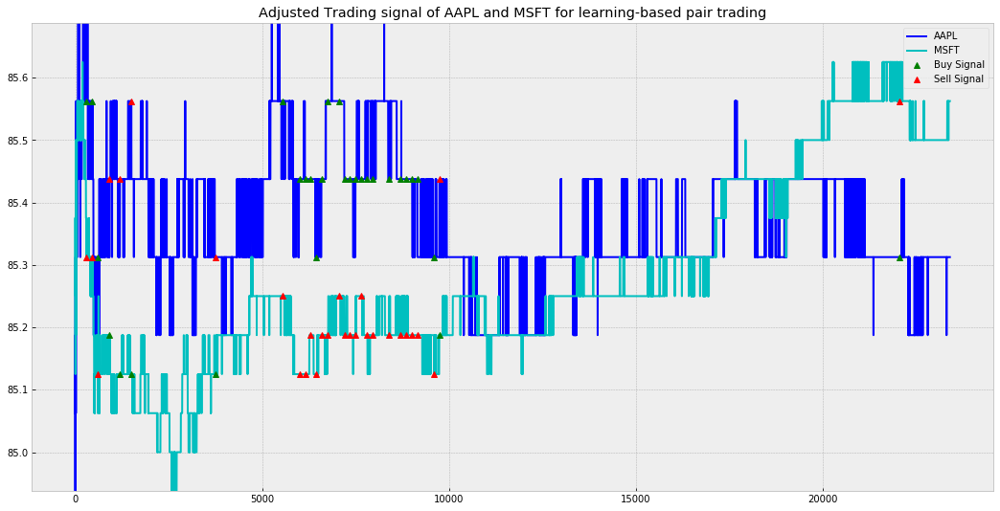

[Day 17]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

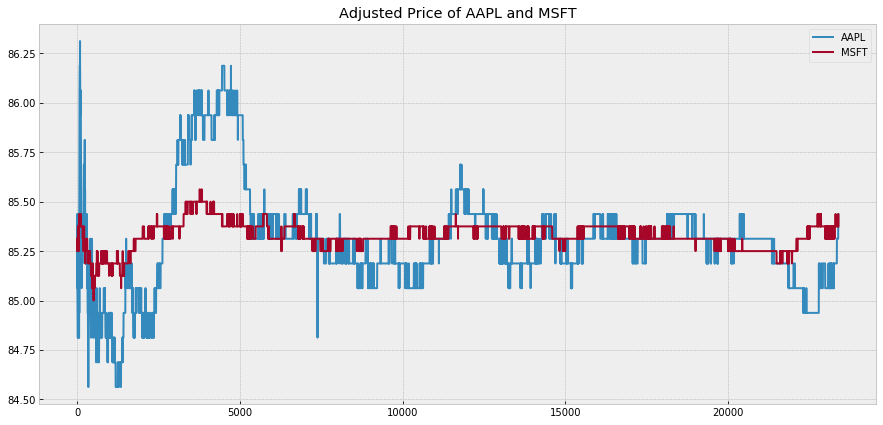

Plot z-score and trading signal of price ratio of AAPL and MSFT


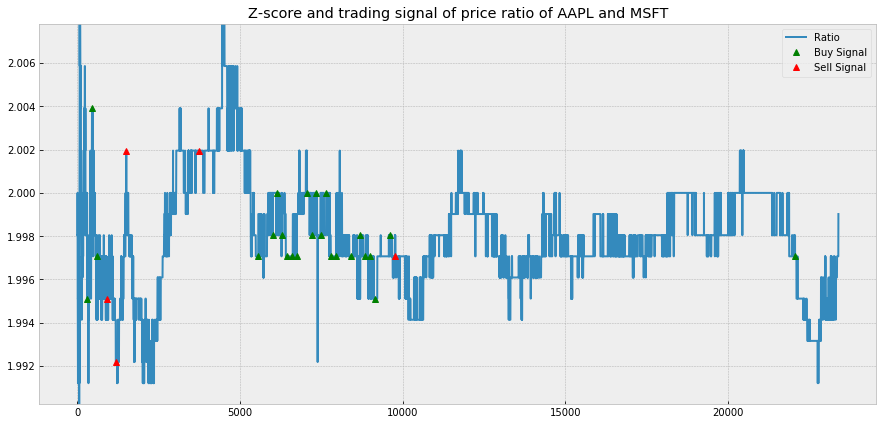

Trading signal of AAPL and MSFT for learning-based pair trading


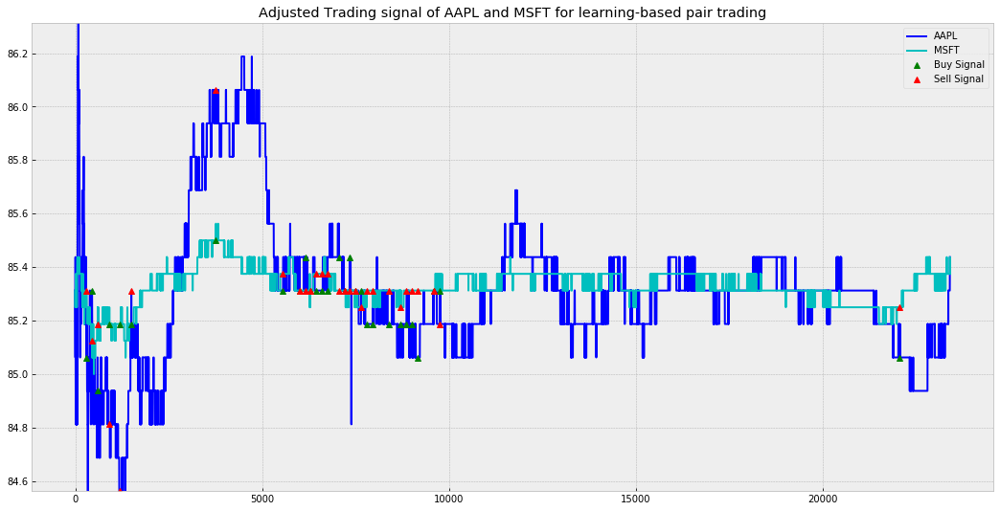

[Day 18]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

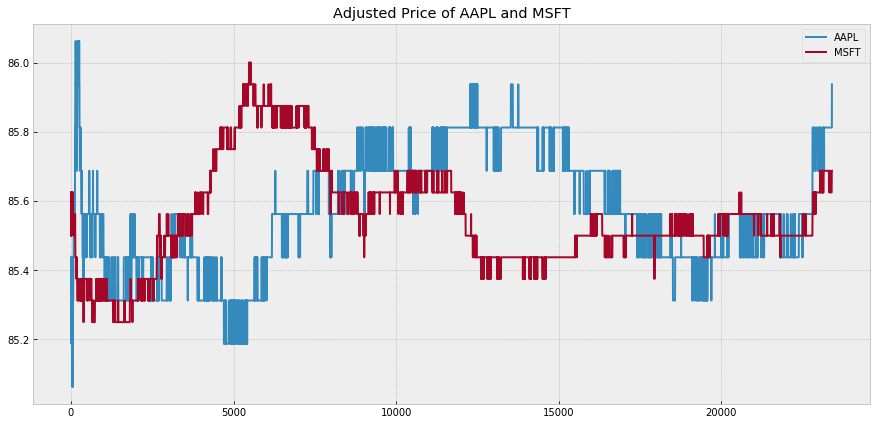

Plot z-score and trading signal of price ratio of AAPL and MSFT


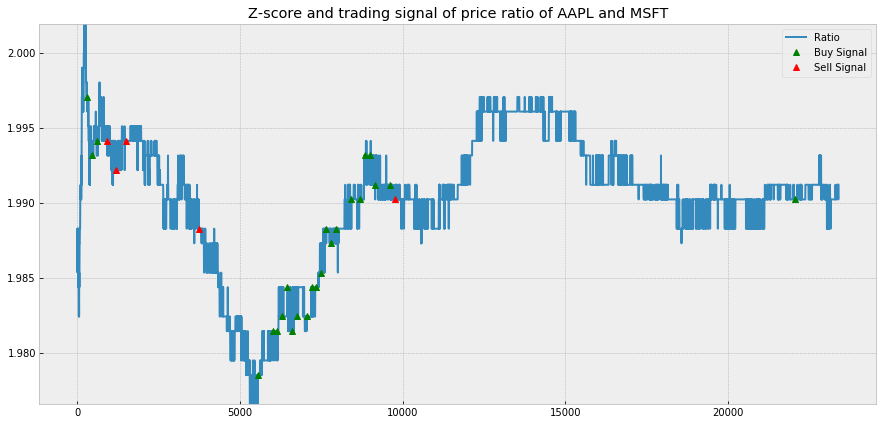

Trading signal of AAPL and MSFT for learning-based pair trading


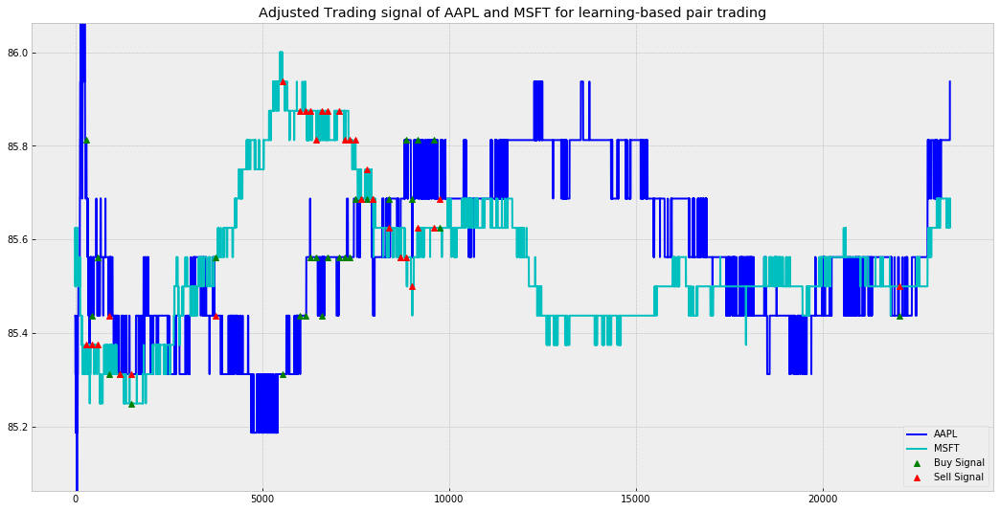

[Day 19]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

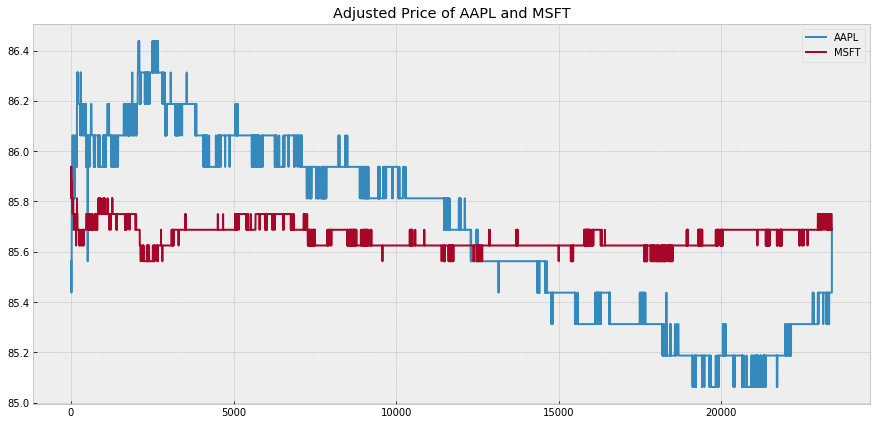

Plot z-score and trading signal of price ratio of AAPL and MSFT


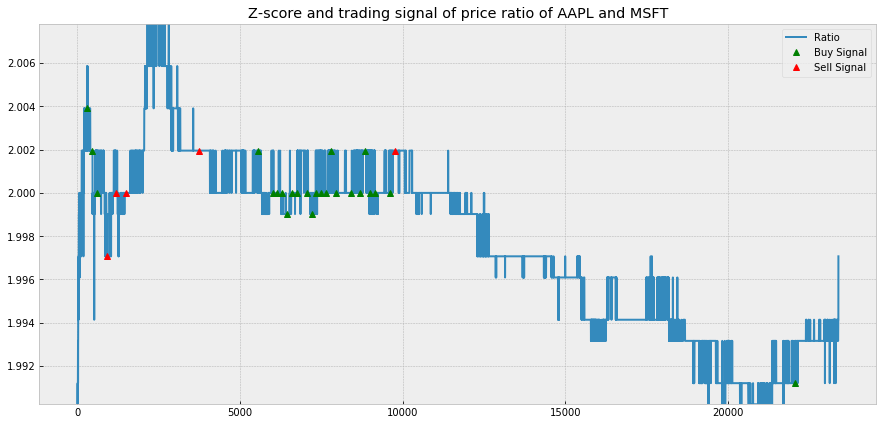

Trading signal of AAPL and MSFT for learning-based pair trading


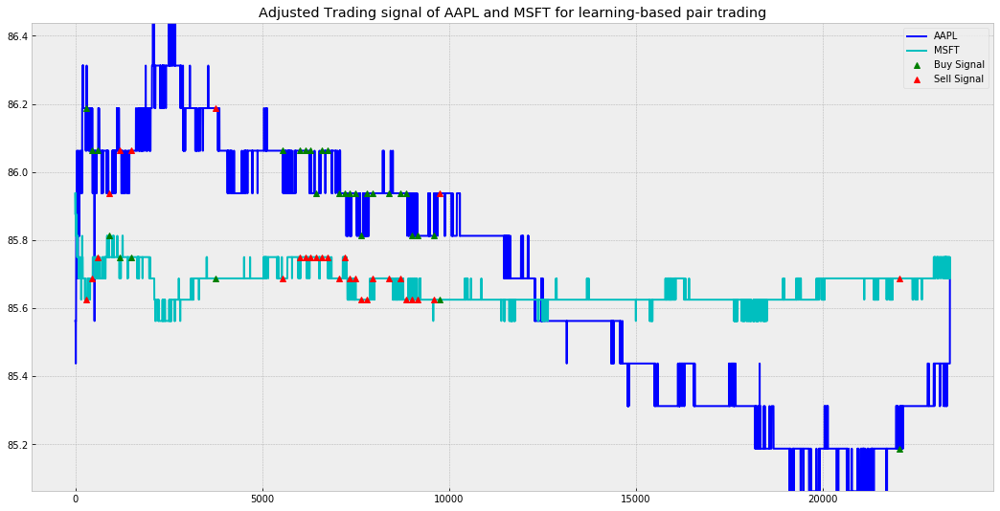

[Day 20]
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
v_inference shape for day 1 : (154, 299, 29)
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 299, 29) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 0 1 0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0
 0 3 3 3 3 3 1 0 3 3 3 3 3 3 3 0 0 2 0 3 3 3 3 0 0 1 3 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0
 0 0 0 0 0 0]
[1 1 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 2 1 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1

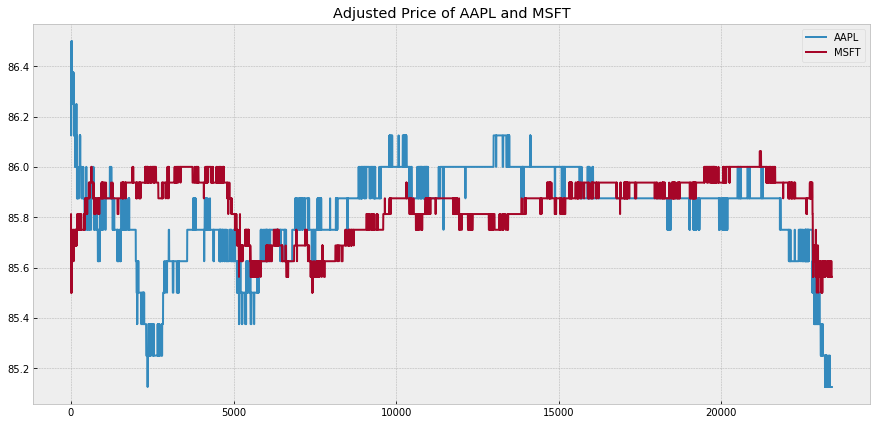

Plot z-score and trading signal of price ratio of AAPL and MSFT


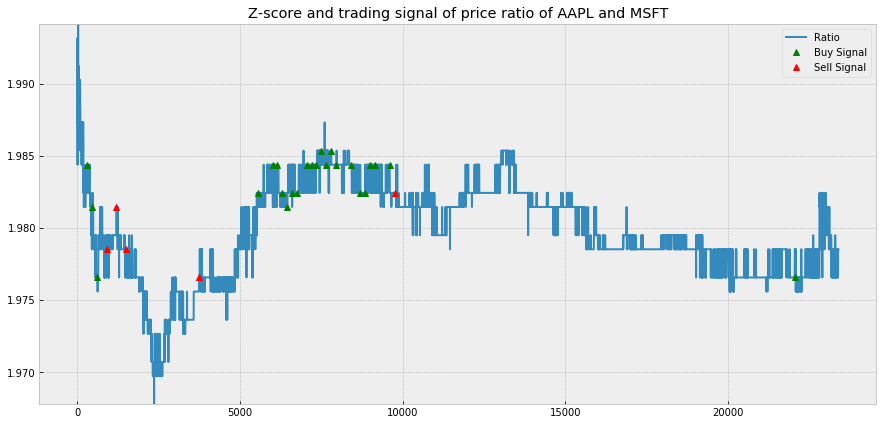

Trading signal of AAPL and MSFT for learning-based pair trading


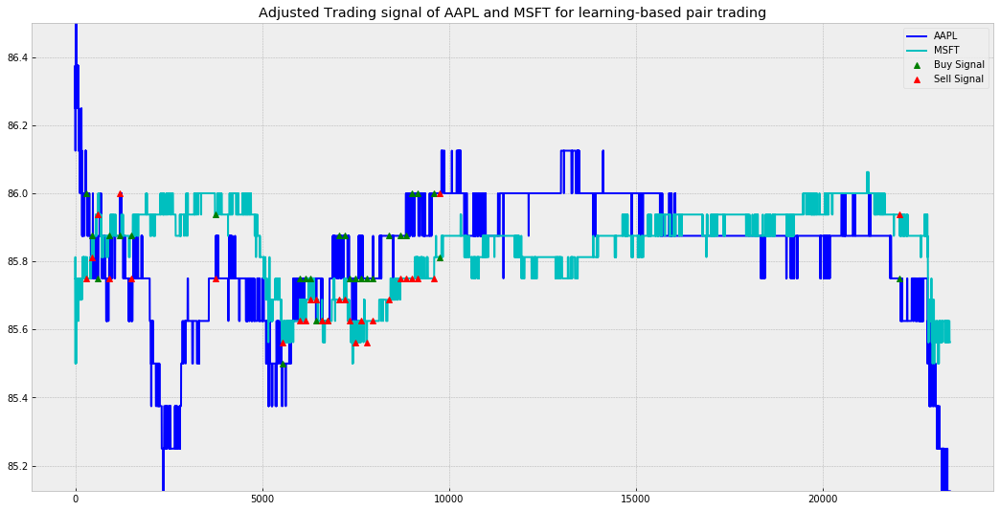

<Figure size 432x288 with 0 Axes>

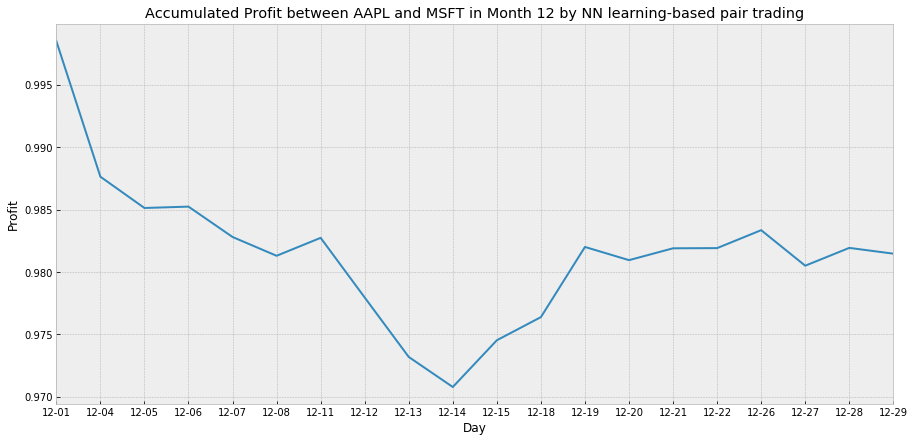

In [48]:
network = "1D Convolution based Relation Network"
profit_day_1DRN = []
signal = []
price_day_avg = []
predict_result_1DRN = {}
profit_Mode = 1
for i in range(day_test):
    print("[Day %s]" % str(i+1))
    S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
    S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
    price_day_avg.append(np.mean(S1.values) + np.mean(S2.values))
    result = NN_trade(S1, S2, p[0], p[1], price_data_for_test, price_and_return_for_test, model, i, show_print = 1, fee = 0, profit_Mode = profit_Mode, model_byconv2d = 0)
    profit_day_1DRN.append(result[0])
    signal.append([result[1], result[2]])
    predict_result_1DRN[i+1] = result[3]
    drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, result[1], result[2], mode = 'NN')
predict_result = predict_result_1DRN

# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day_1DRN))
else:
    plt.plot(np.cumprod(profit_day_1DRN))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by NN learning-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

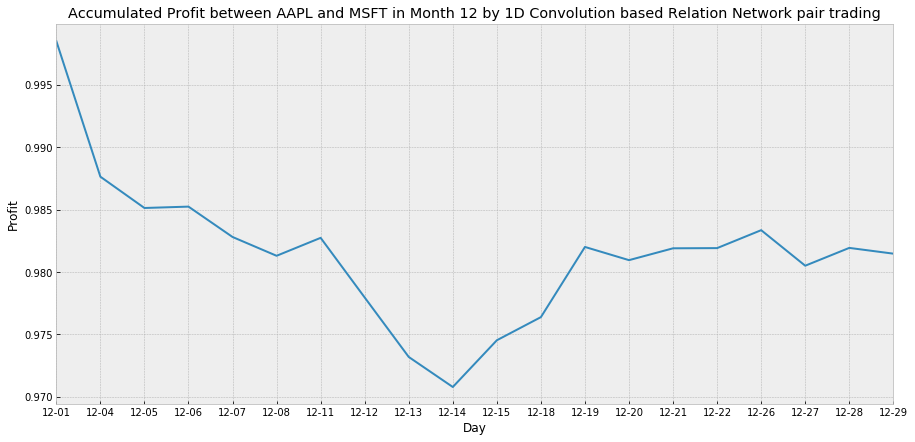

<Figure size 432x288 with 0 Axes>

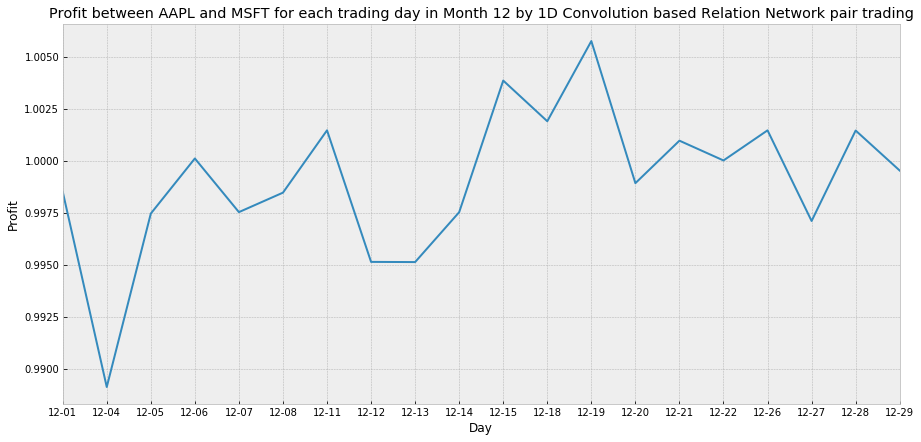

In [49]:
draw_profit(profit_day_1DRN, date_test_noyear, period_test, mode = network, profit_Mode = profit_Mode)

In [50]:
profit_day_1DRN

[0.9985174193083017,
 0.9891137585881566,
 0.9974592593749262,
 1.0001113235968357,
 0.9975293864582618,
 0.9984664677847086,
 1.001465988902177,
 0.9951342700688581,
 0.9951255361307553,
 0.9975259397755994,
 1.0038598985416862,
 1.0019032166263495,
 1.0057607273303206,
 0.9989227120934737,
 1.0009678766685897,
 1.0000156485840834,
 1.0014644712571634,
 0.997102947842845,
 1.001456300172892,
 0.9995300678685118]

In [51]:
predict_result_1DRN

{1: (array([3, 3, 3, 0, 1, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 3, 3, 3, 3, 1,
         0, 3, 3, 3, 3, 3, 3, 3, 0, 0, 2, 0, 3, 3, 3, 3, 0, 0, 1, 3, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0]),
  array([1, 1, 1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1,
         2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
         1, 1, 1, 2,

0.9814774478719773


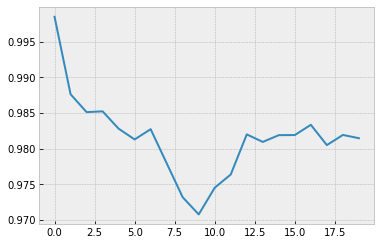

In [52]:
# profit rate
print(np.cumprod(profit_day_1DRN)[-1])
plt.plot(np.cumprod(profit_day_1DRN))

In [53]:
test_realacc_1DRN = cal_predict_true_acc(all_com_pair_P, qtype, day_test)
test_realacc_1DRN

Day 1
Index of day start :  0
Q1 real accuracy :  0.5
Q2 real accuracy :  0.37012987012987014
Q3 real accuracy :  0.8766233766233766
Day 2
Index of day start :  375144
Q1 real accuracy :  0.43506493506493504
Q2 real accuracy :  0.5194805194805194
Q3 real accuracy :  0.8701298701298701
Day 3
Index of day start :  750288
Q1 real accuracy :  0.5194805194805194
Q2 real accuracy :  0.4155844155844156
Q3 real accuracy :  0.8051948051948052
Day 4
Index of day start :  1125432
Q1 real accuracy :  0.5454545454545454
Q2 real accuracy :  0.42857142857142855
Q3 real accuracy :  0.7012987012987013
Day 5
Index of day start :  1500576
Q1 real accuracy :  0.564935064935065
Q2 real accuracy :  0.36363636363636365
Q3 real accuracy :  0.8376623376623377
Day 6
Index of day start :  1875720
Q1 real accuracy :  0.5584415584415584
Q2 real accuracy :  0.4155844155844156
Q3 real accuracy :  0.7922077922077922
Day 7
Index of day start :  2250864
Q1 real accuracy :  0.6558441558441559
Q2 real accuracy :  0.27272

{1: [0.5, 0.37012987012987014, 0.8766233766233766],
 2: [0.43506493506493504, 0.5194805194805194, 0.8701298701298701],
 3: [0.5194805194805194, 0.4155844155844156, 0.8051948051948052],
 4: [0.5454545454545454, 0.42857142857142855, 0.7012987012987013],
 5: [0.564935064935065, 0.36363636363636365, 0.8376623376623377],
 6: [0.5584415584415584, 0.4155844155844156, 0.7922077922077922],
 7: [0.6558441558441559, 0.2727272727272727, 0.8766233766233766],
 8: [0.6493506493506493, 0.37662337662337664, 0.8636363636363636],
 9: [0.6168831168831169, 0.4090909090909091, 0.8506493506493507],
 10: [0.6233766233766234, 0.34415584415584416, 0.8376623376623377],
 11: [0.6558441558441559, 0.42857142857142855, 0.8311688311688312],
 12: [0.6363636363636364, 0.3246753246753247, 0.8831168831168831],
 13: [0.551948051948052, 0.4155844155844156, 0.7727272727272727],
 14: [0.5909090909090909, 0.35714285714285715, 0.8506493506493507],
 15: [0.6753246753246753, 0.3246753246753247, 0.8116883116883117],
 16: [0.74025

## 2DCNN-based Pairs Trading

[Day 1]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

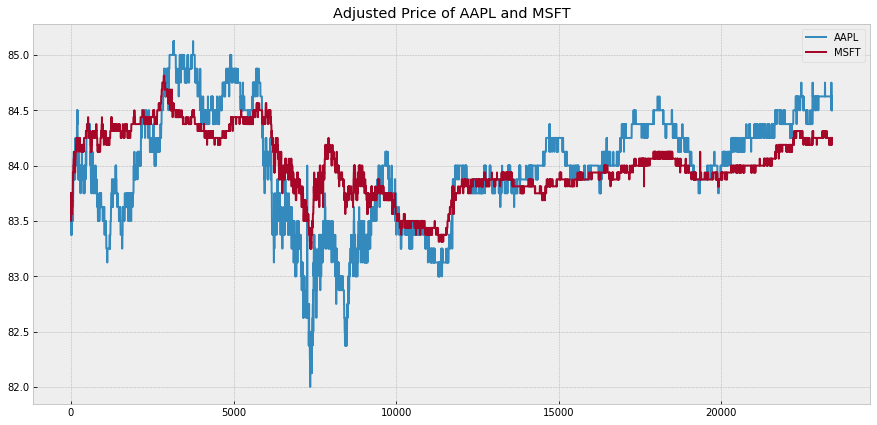

Plot z-score and trading signal of price ratio of AAPL and MSFT


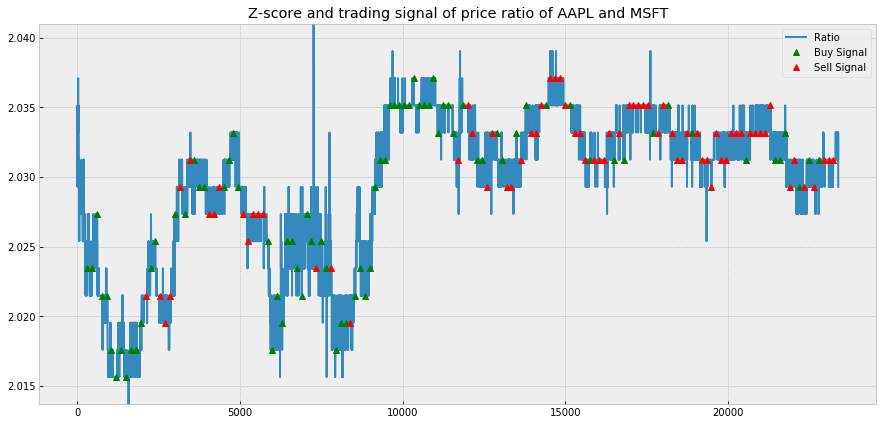

Trading signal of AAPL and MSFT for learning-based pair trading


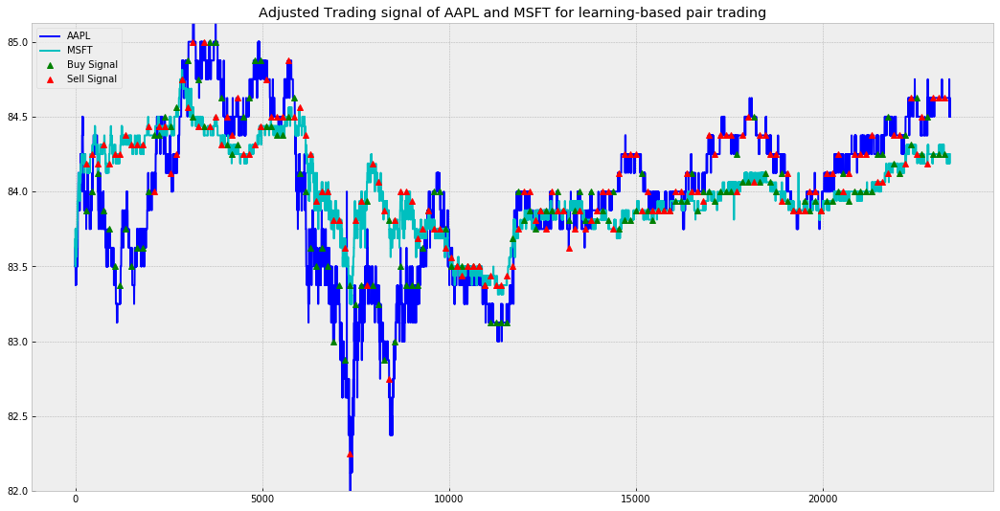

[Day 2]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

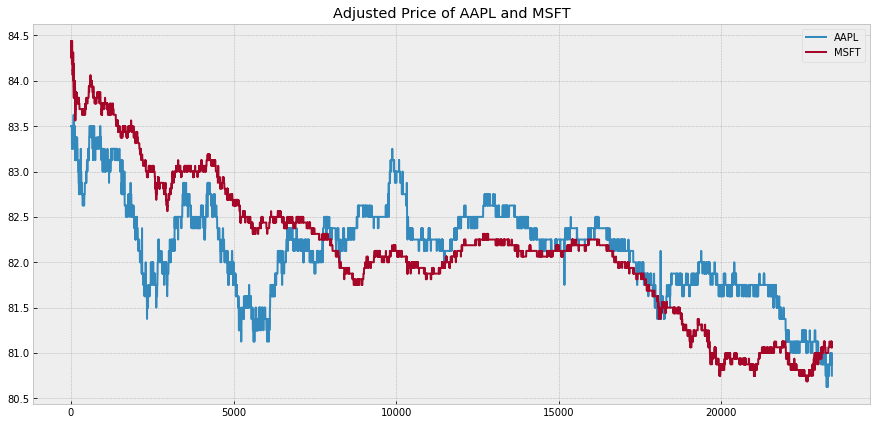

Plot z-score and trading signal of price ratio of AAPL and MSFT


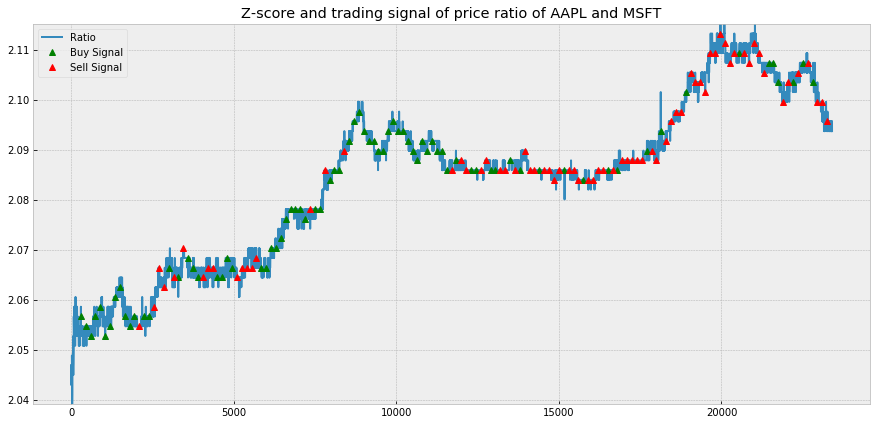

Trading signal of AAPL and MSFT for learning-based pair trading


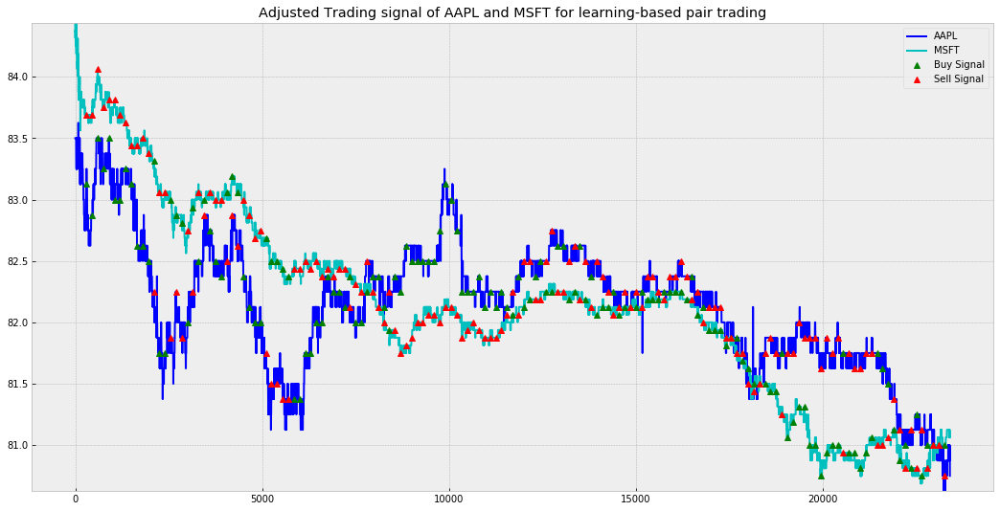

[Day 3]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

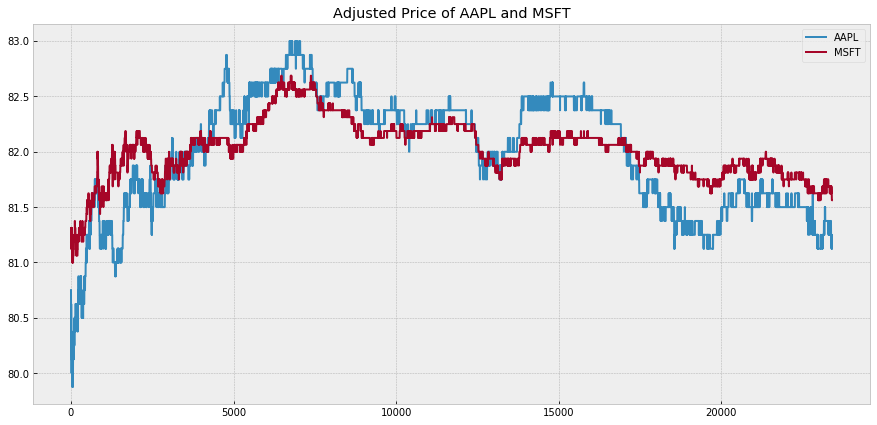

Plot z-score and trading signal of price ratio of AAPL and MSFT


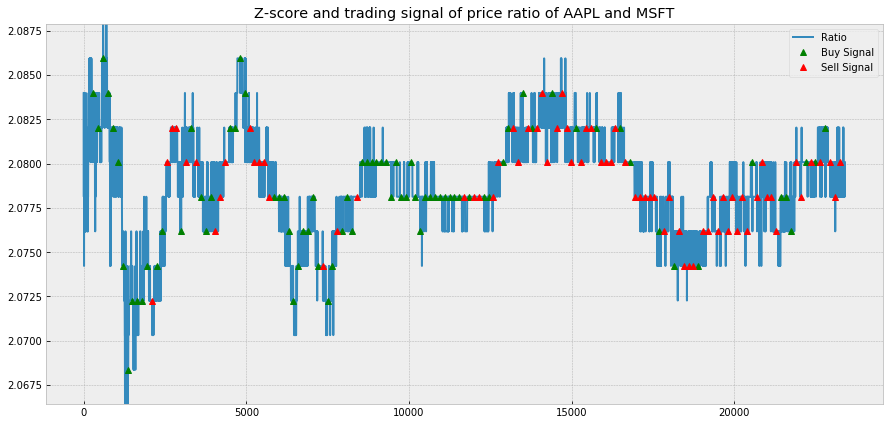

Trading signal of AAPL and MSFT for learning-based pair trading


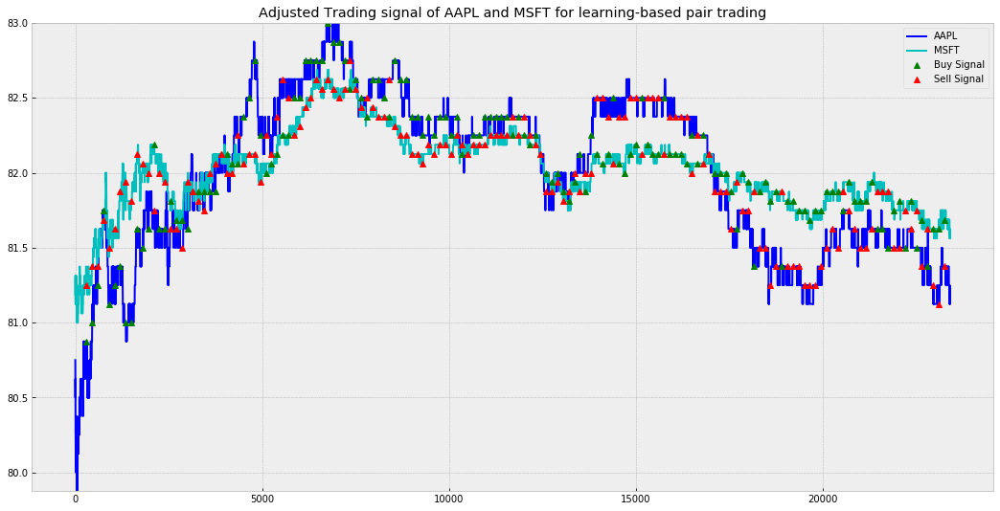

[Day 4]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

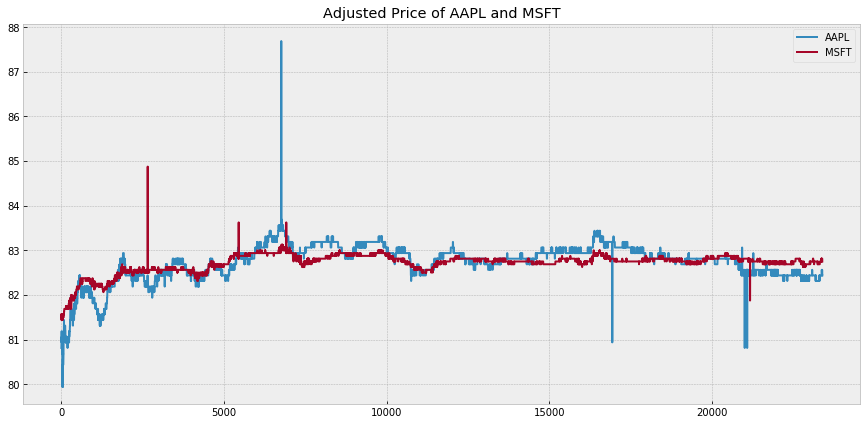

Plot z-score and trading signal of price ratio of AAPL and MSFT


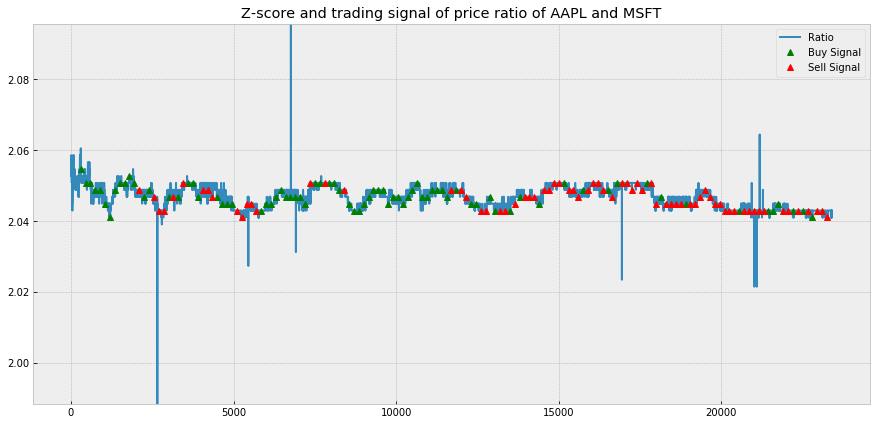

Trading signal of AAPL and MSFT for learning-based pair trading


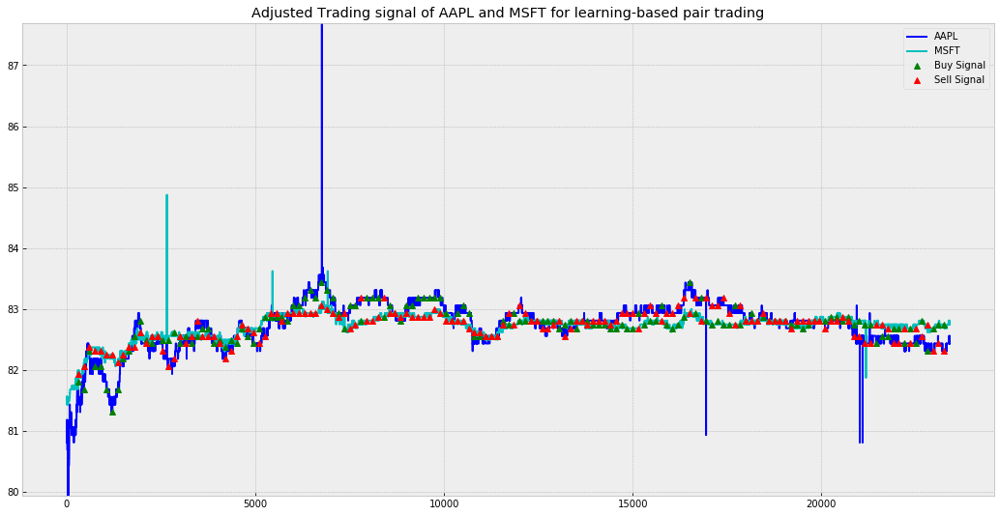

[Day 5]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

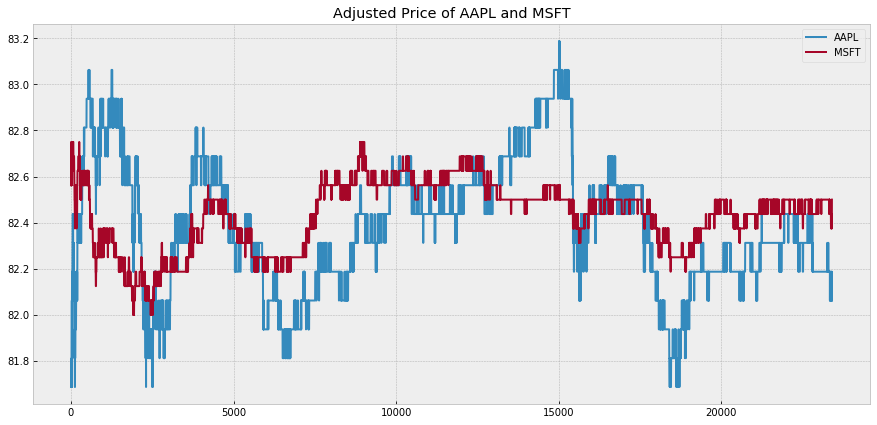

Plot z-score and trading signal of price ratio of AAPL and MSFT


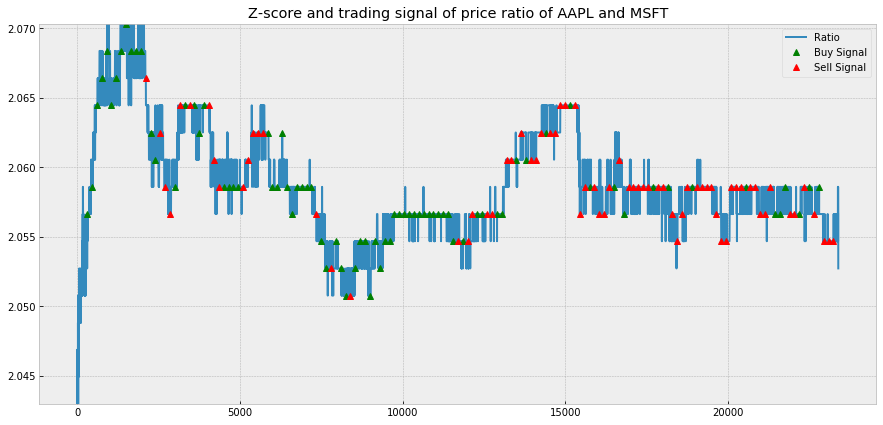

Trading signal of AAPL and MSFT for learning-based pair trading


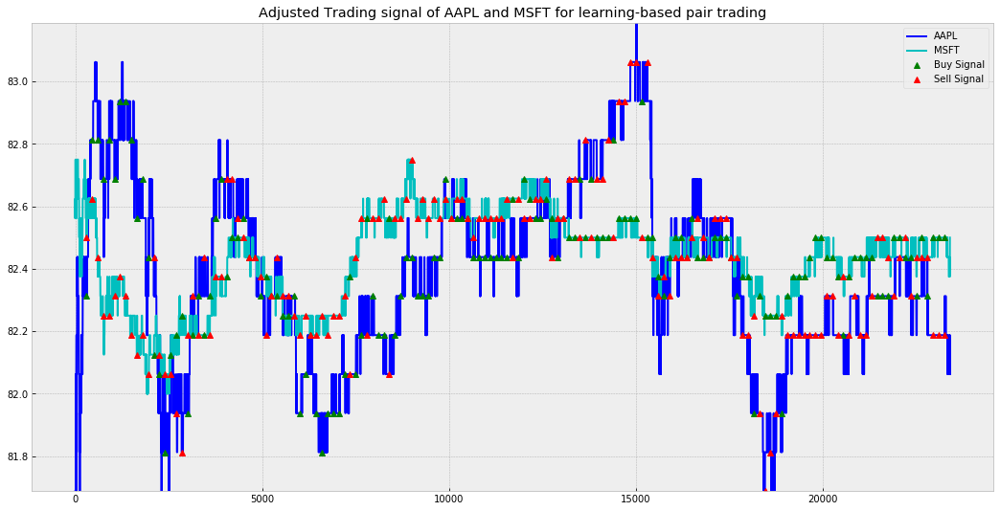

[Day 6]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

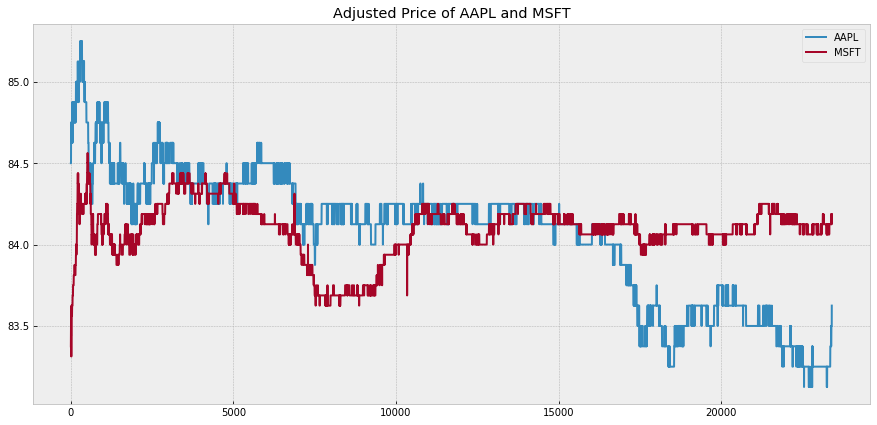

Plot z-score and trading signal of price ratio of AAPL and MSFT


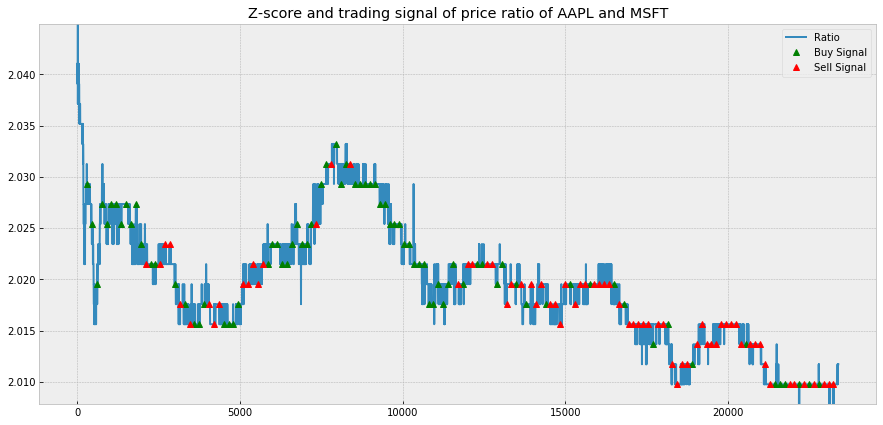

Trading signal of AAPL and MSFT for learning-based pair trading


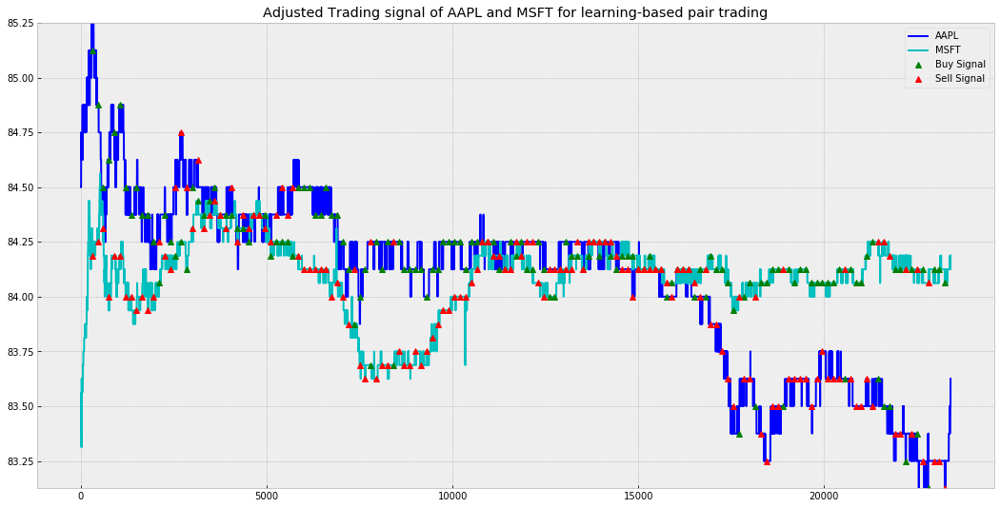

[Day 7]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

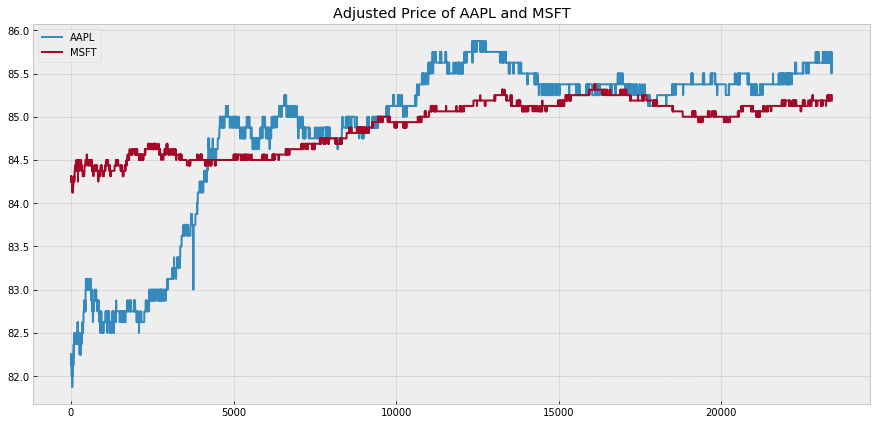

Plot z-score and trading signal of price ratio of AAPL and MSFT


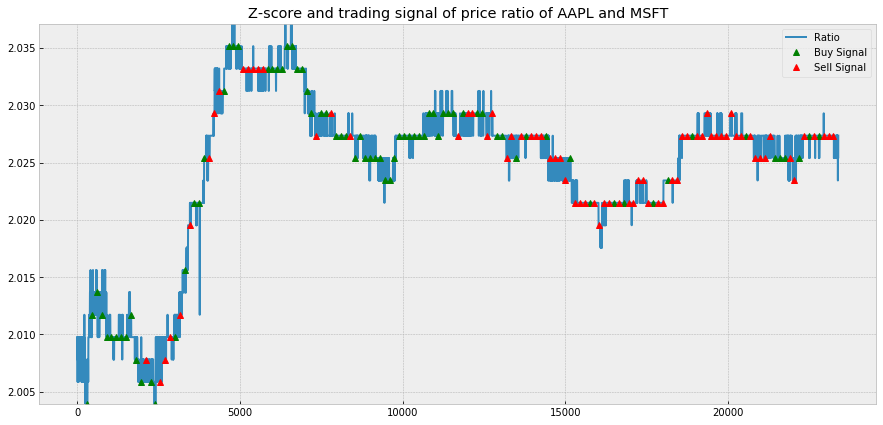

Trading signal of AAPL and MSFT for learning-based pair trading


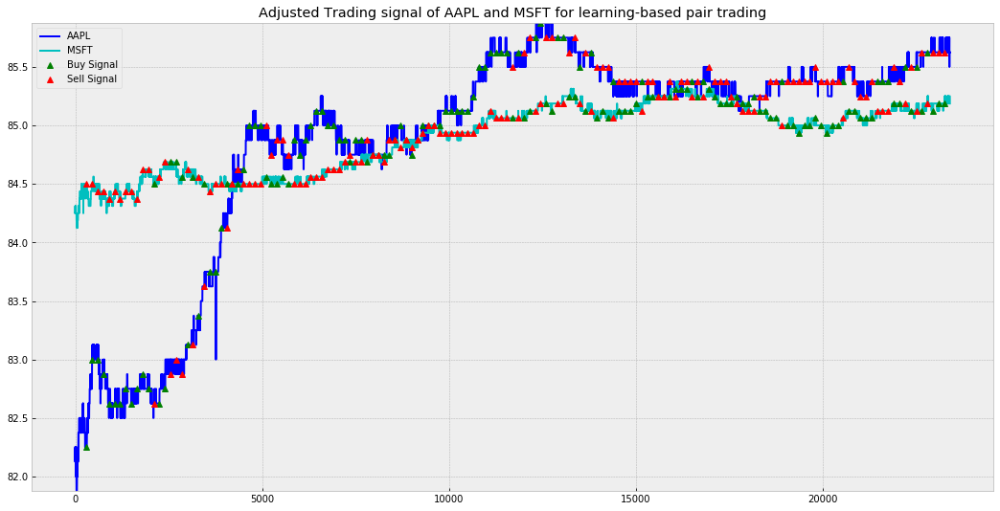

[Day 8]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

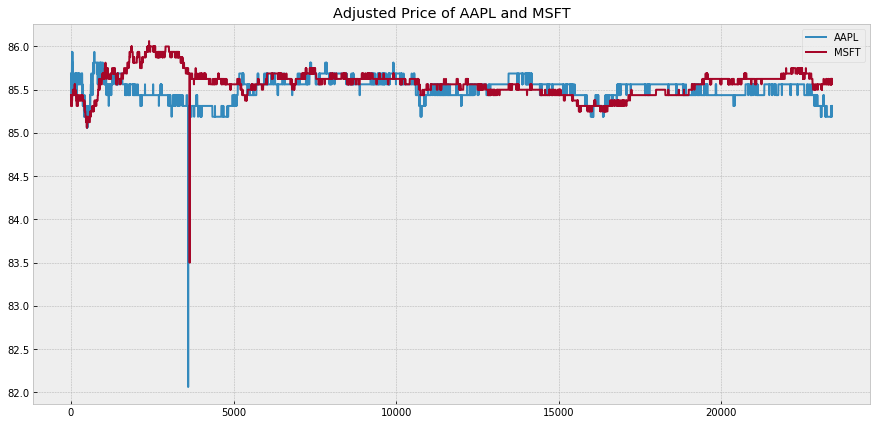

Plot z-score and trading signal of price ratio of AAPL and MSFT


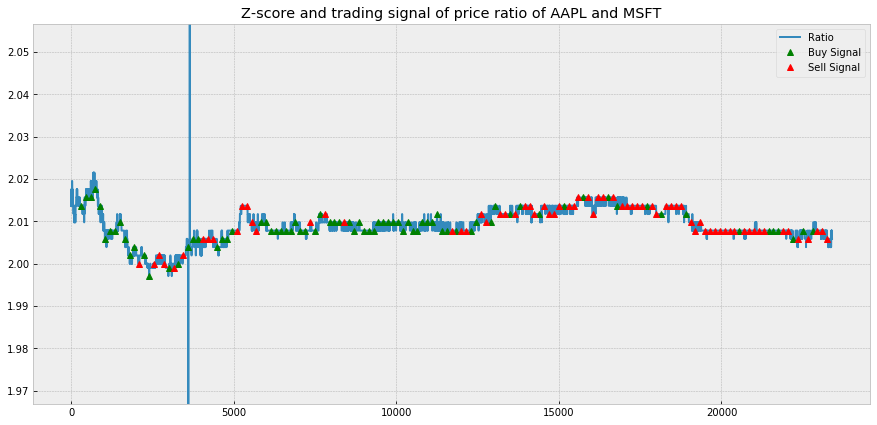

Trading signal of AAPL and MSFT for learning-based pair trading


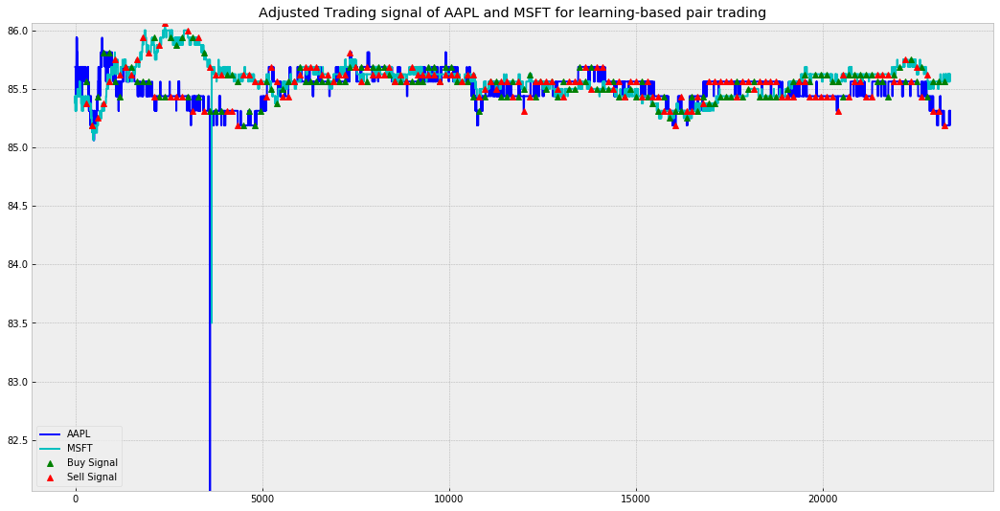

[Day 9]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1 

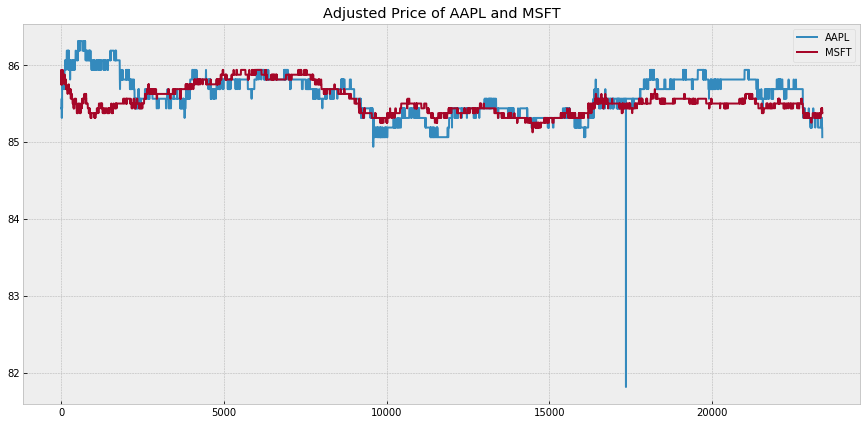

Plot z-score and trading signal of price ratio of AAPL and MSFT


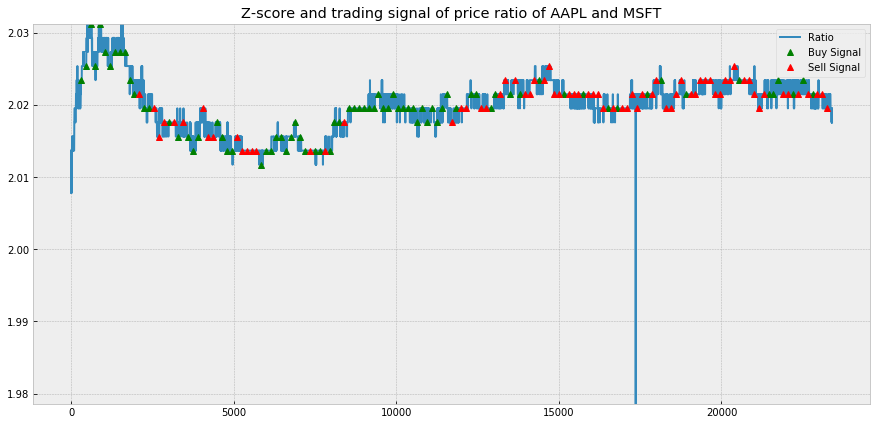

Trading signal of AAPL and MSFT for learning-based pair trading


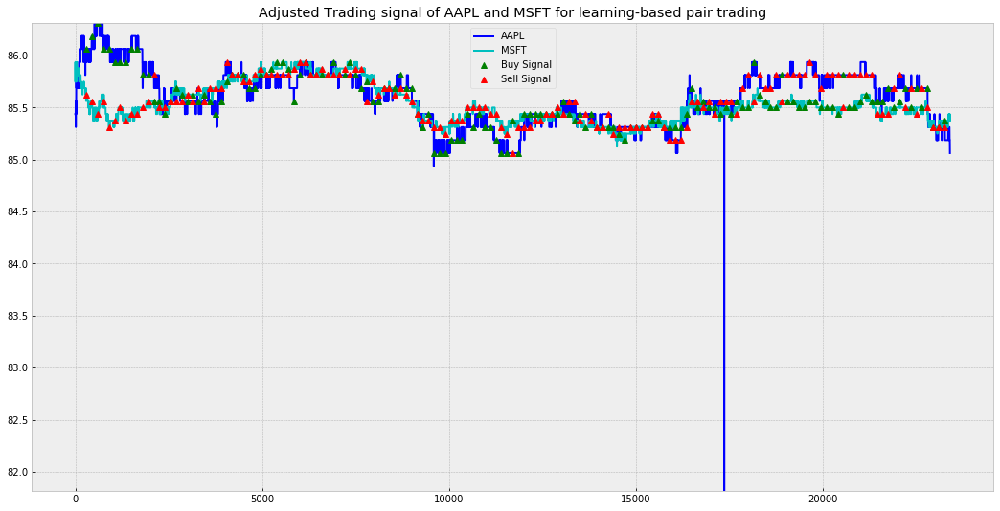

[Day 10]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

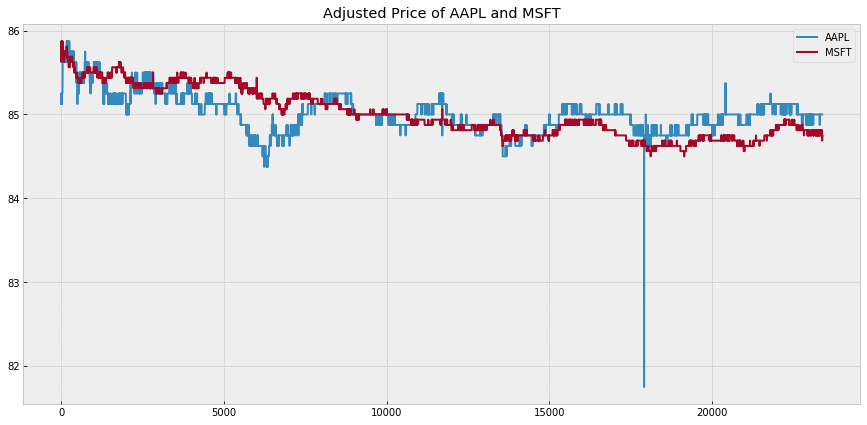

Plot z-score and trading signal of price ratio of AAPL and MSFT


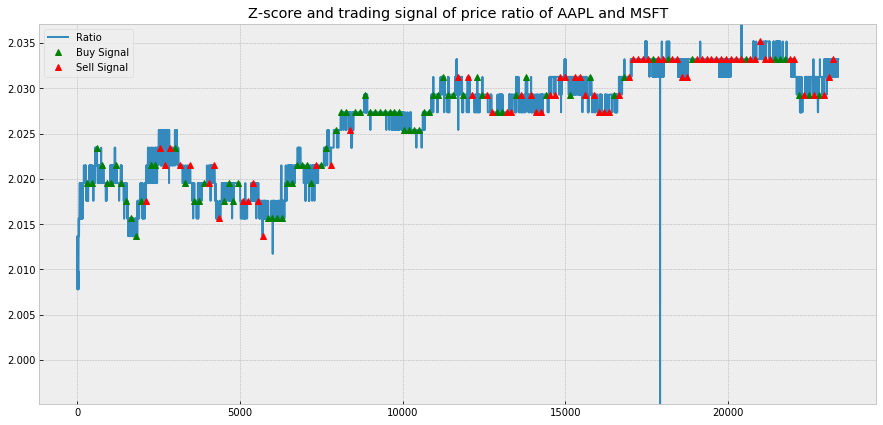

Trading signal of AAPL and MSFT for learning-based pair trading


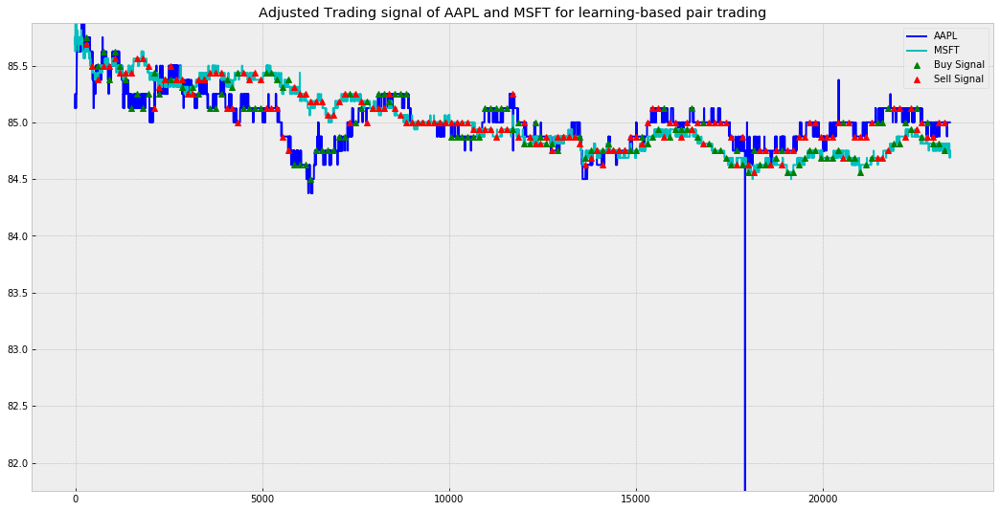

[Day 11]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

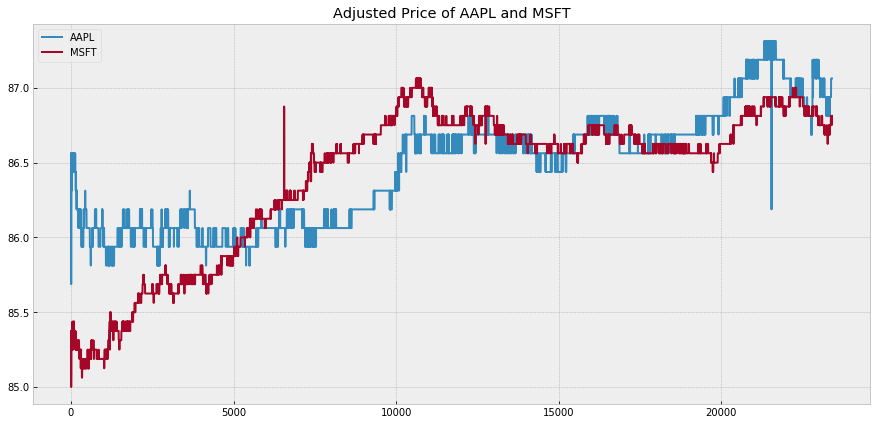

Plot z-score and trading signal of price ratio of AAPL and MSFT


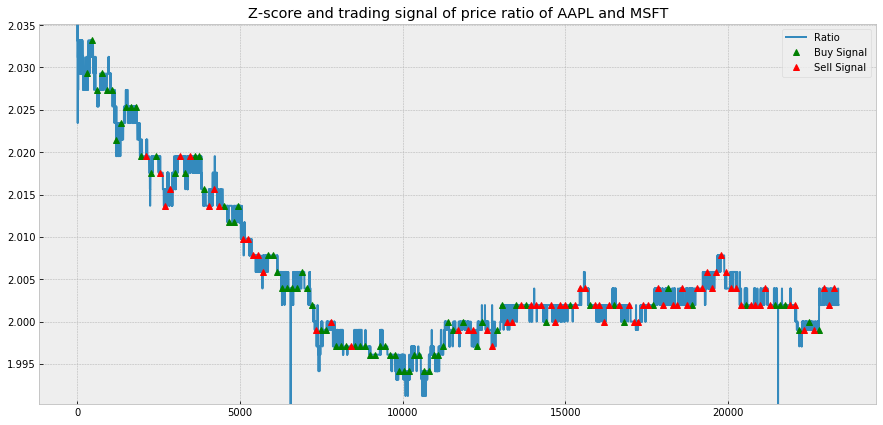

Trading signal of AAPL and MSFT for learning-based pair trading


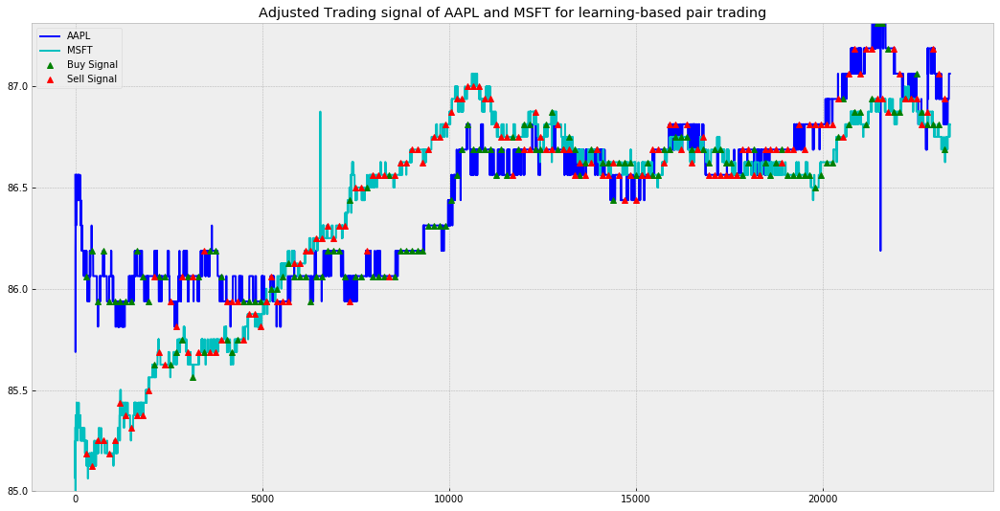

[Day 12]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

AAPL price - 176.5, earn : 176.5 | MSFT price - 86.8125, earn : -176.37302158273383 |
---------[Time = 2700 to 2850]---------
Current profit :   profit -  0.9966574750682325
[Pairwise Price Change BothRise and Volatility1 < Volatility2]
[Sell AAPL and Buy MSFT] profit 0.9966574750682325 | price ratios 2.033117350611951 | C1 -1 pos | C2 2.033117350611951 pos
AAPL price - 176.5 revenue - 176.5 | MSFT price - 86.8125 payment - 176.49999999999997 |
[Exit position] profit 0.9966653095460493 | price ratios 2.033117350611951 | C1 1 pos | C2 -2.033117350611951 pos
AAPL price - 176.375, earn : 176.375 | MSFT price - 86.75, earn : -176.37293016558675 |
---------[Time = 2850 to 3000]---------
Current profit :   profit -  0.9966653095460493
[Pairwise Price Change BothRise and Volatility1 < Volatility2]
[Sell AAPL and Buy MSFT] profit 0.9966653095460493 | price ratios 2.031700288184438 | C1 -1 pos | C2 2.031700288184438 pos
AAPL price - 176.25 revenue - 176.25 | MSFT price - 86.75 payment - 176.25 

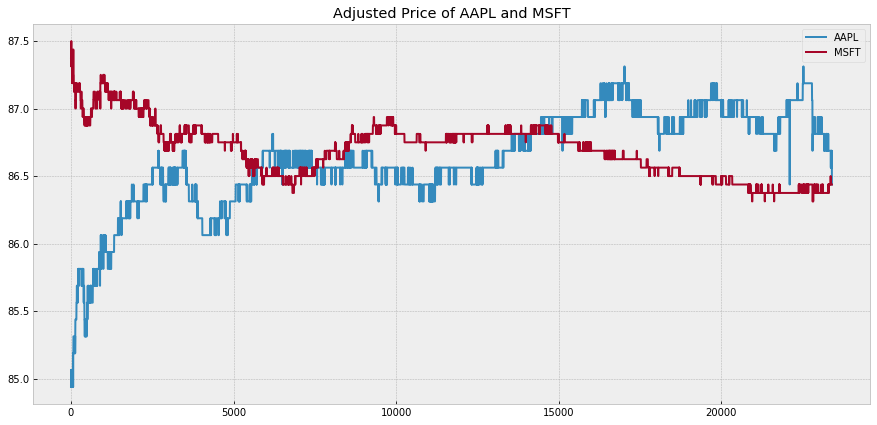

Plot z-score and trading signal of price ratio of AAPL and MSFT


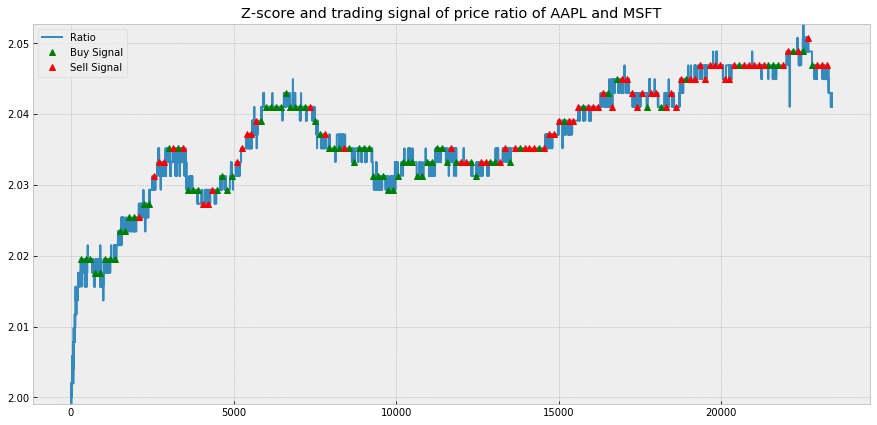

Trading signal of AAPL and MSFT for learning-based pair trading


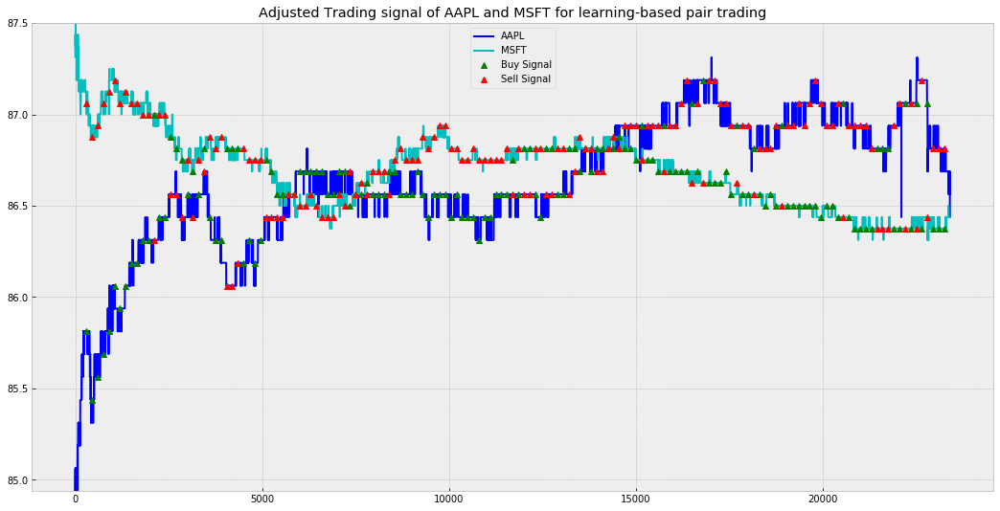

[Day 13]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

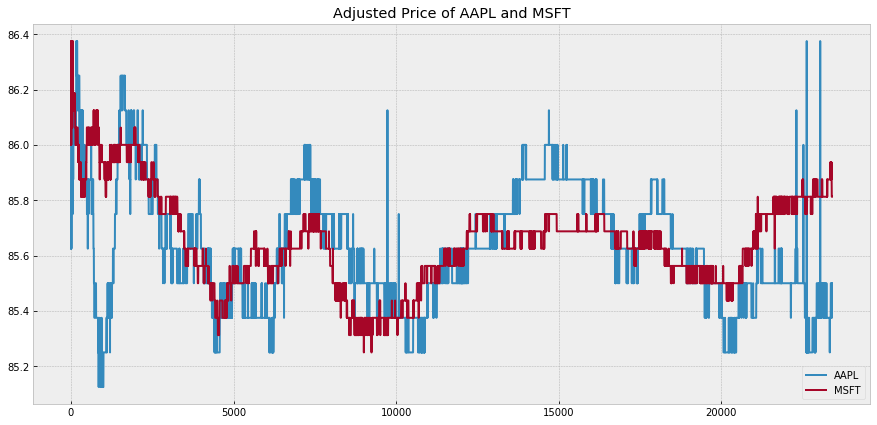

Plot z-score and trading signal of price ratio of AAPL and MSFT


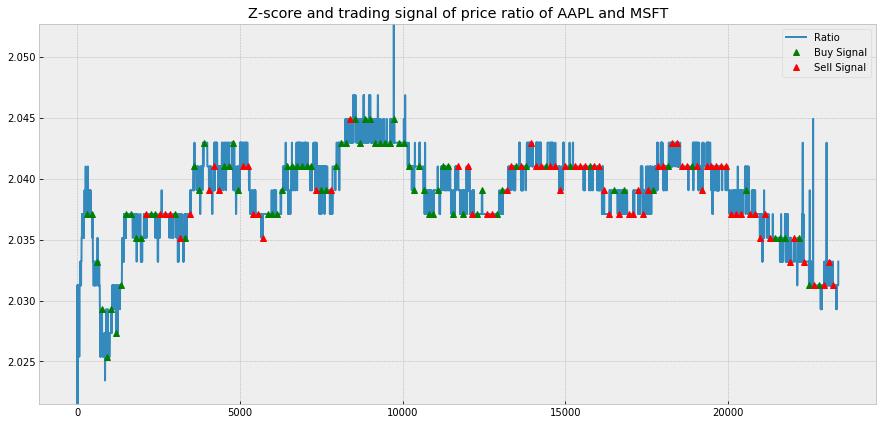

Trading signal of AAPL and MSFT for learning-based pair trading


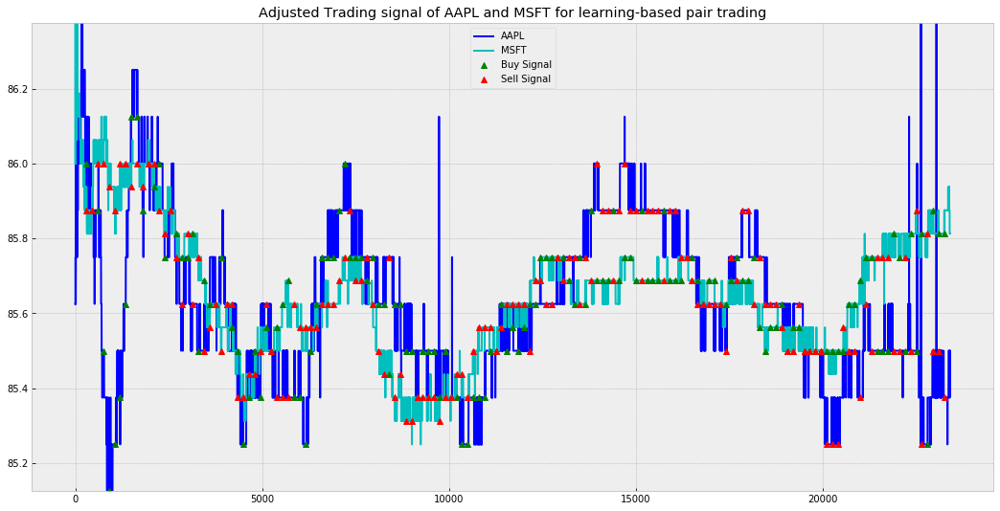

[Day 14]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

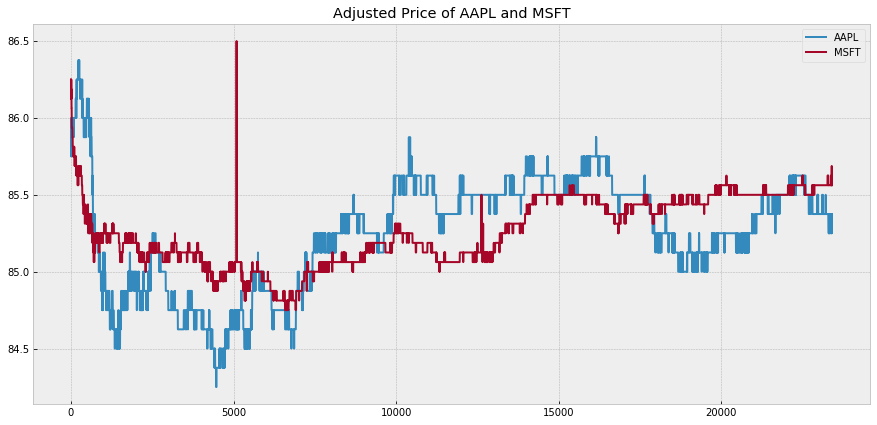

Plot z-score and trading signal of price ratio of AAPL and MSFT


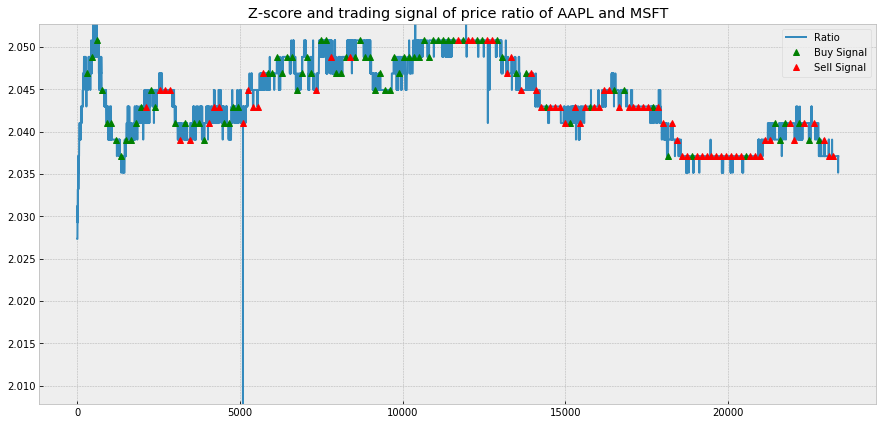

Trading signal of AAPL and MSFT for learning-based pair trading


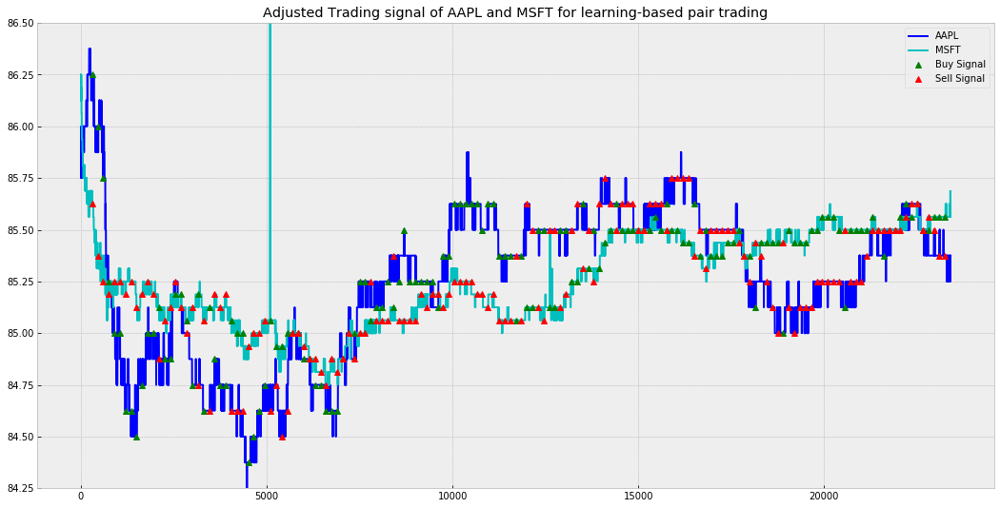

[Day 15]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

[Exit position] profit 0.9994879509096465 | price ratios 2.0393873085339167 | C1 1 pos | C2 -2.0393873085339167 pos
AAPL price - 174.875, earn : 174.875 | MSFT price - 85.6875, earn : -174.75 |
---------[Time = 3300 to 3450]---------
Current profit :   profit -  0.9994879509096465
[Pairwise Price Change Reverse and Strength1 > Strength2]
[Buy AAPL and Sell MSFT] profit 0.9994879509096465 | price ratios 2.0408460977388767 | C1 1 pos | C2 -2.0408460977388767 pos
AAPL price - 174.875 payment - 174.875 | MSFT price - 85.6875 revenue - 174.875 |
[Exit position] profit 0.9999772291740625 | price ratios 2.0408460977388767 | C1 -1 pos | C2 2.0408460977388767 pos
AAPL price - 174.875, earn : -174.875 | MSFT price - 85.75, earn : 175.00255288110867 |
---------[Time = 3450 to 3600]---------
Current profit :   profit -  0.9999772291740625
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9999772291740625 | price ratios 2.0393586005830904 | C1 -1 pos | C2 2

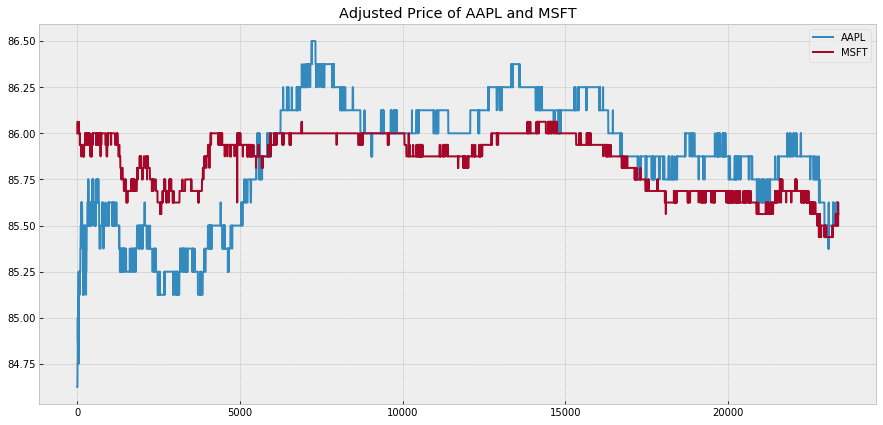

Plot z-score and trading signal of price ratio of AAPL and MSFT


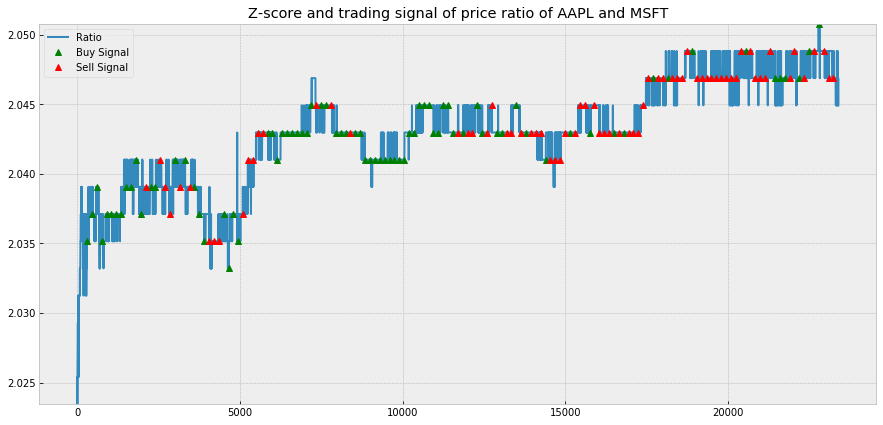

Trading signal of AAPL and MSFT for learning-based pair trading


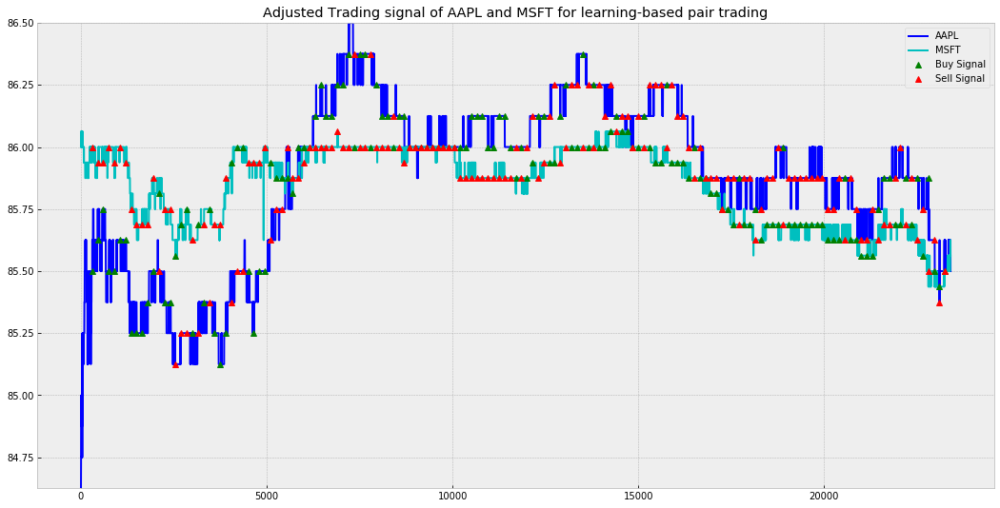

[Day 16]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

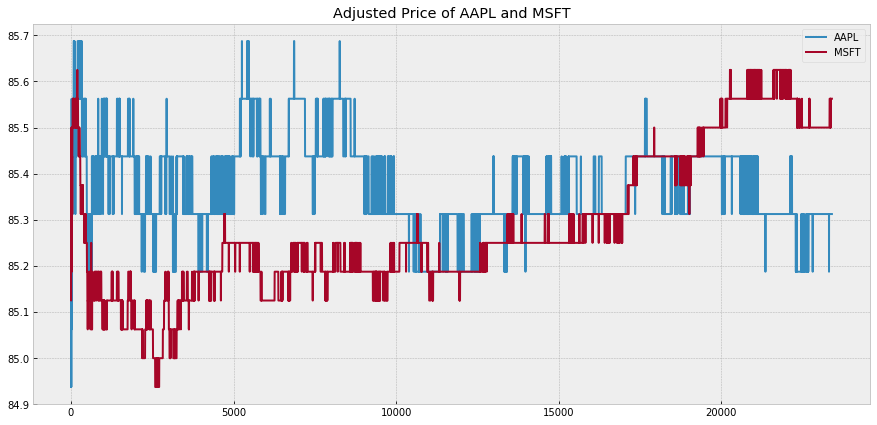

Plot z-score and trading signal of price ratio of AAPL and MSFT


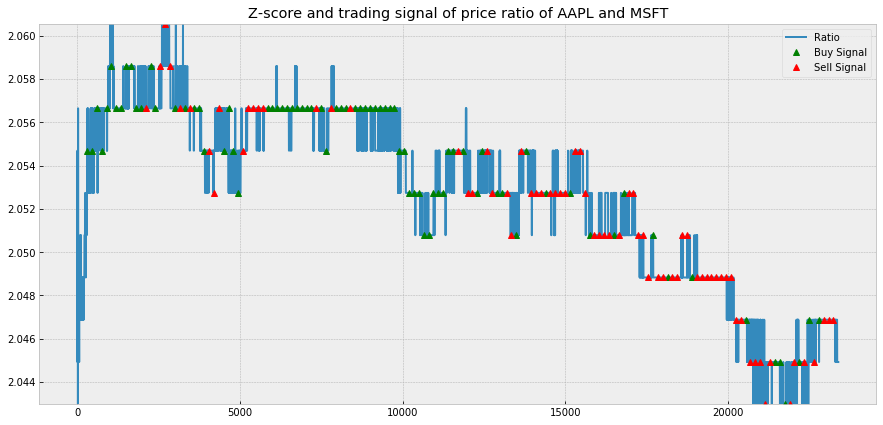

Trading signal of AAPL and MSFT for learning-based pair trading


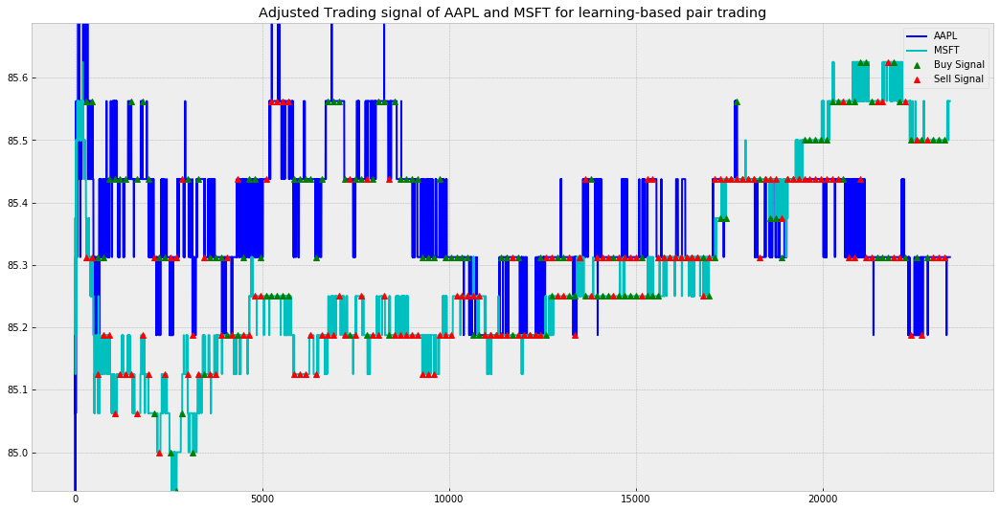

[Day 17]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

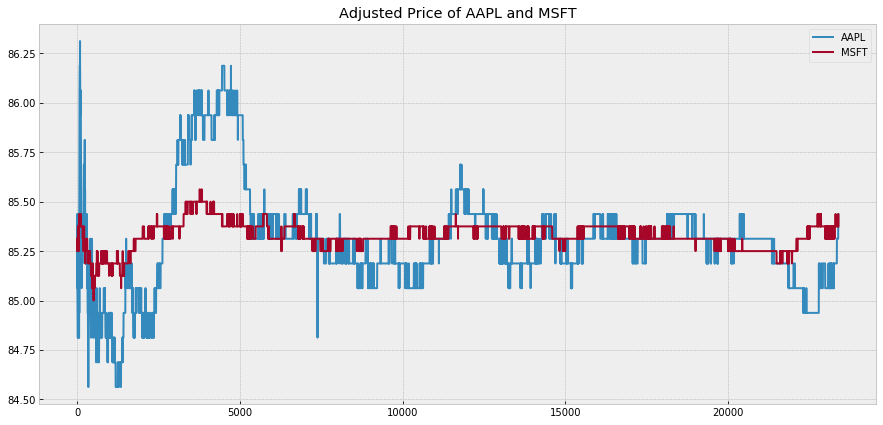

Plot z-score and trading signal of price ratio of AAPL and MSFT


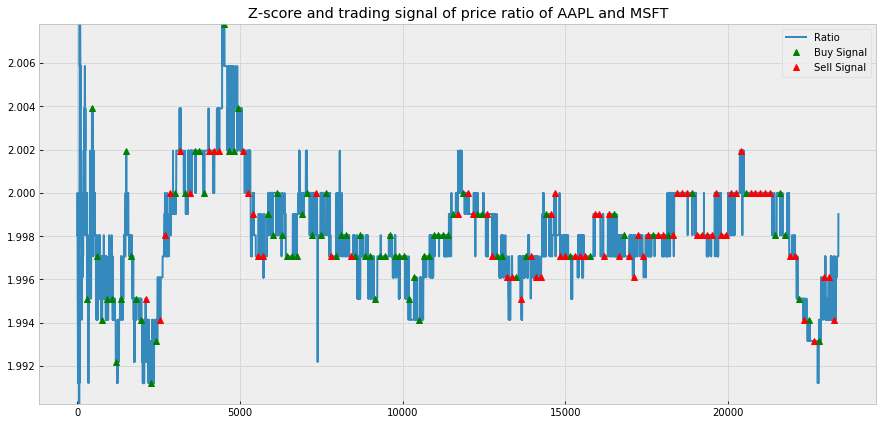

Trading signal of AAPL and MSFT for learning-based pair trading


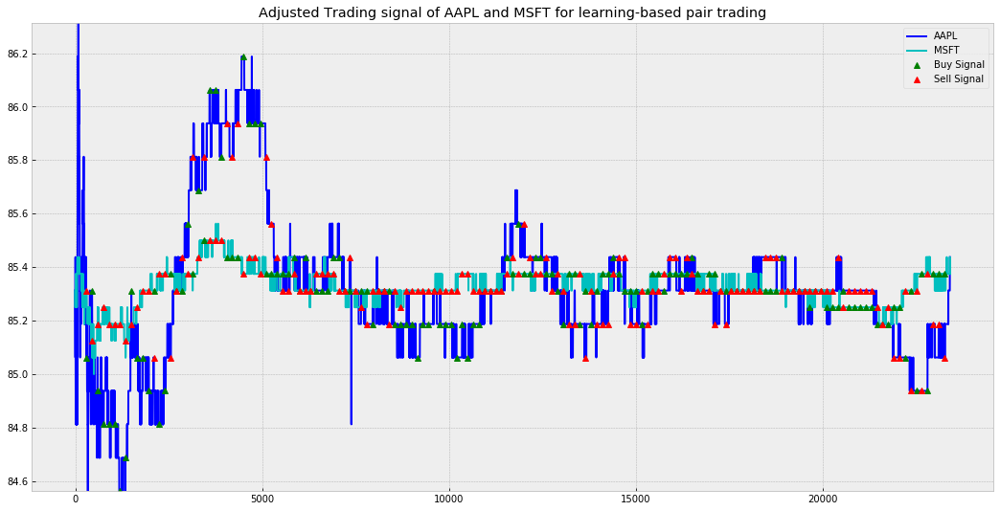

[Day 18]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

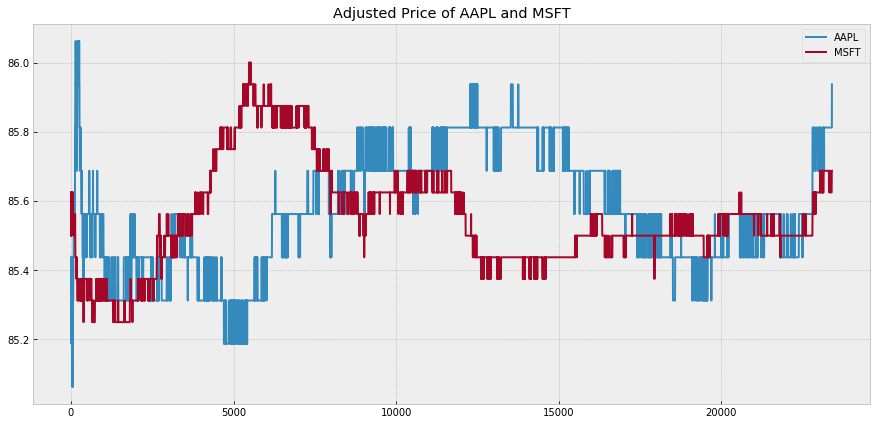

Plot z-score and trading signal of price ratio of AAPL and MSFT


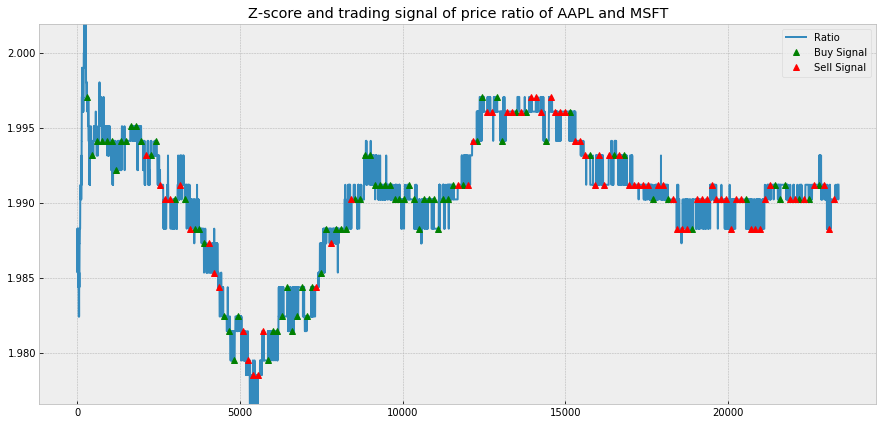

Trading signal of AAPL and MSFT for learning-based pair trading


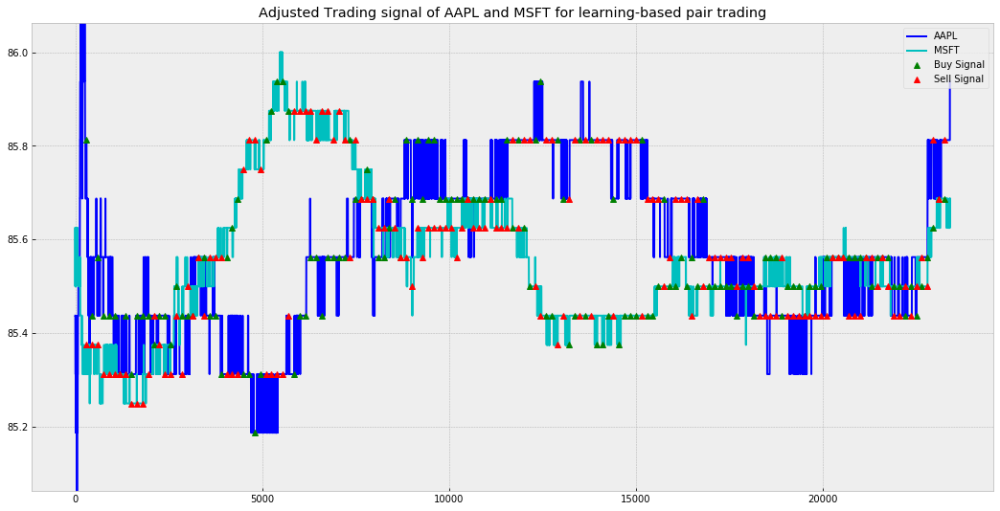

[Day 19]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

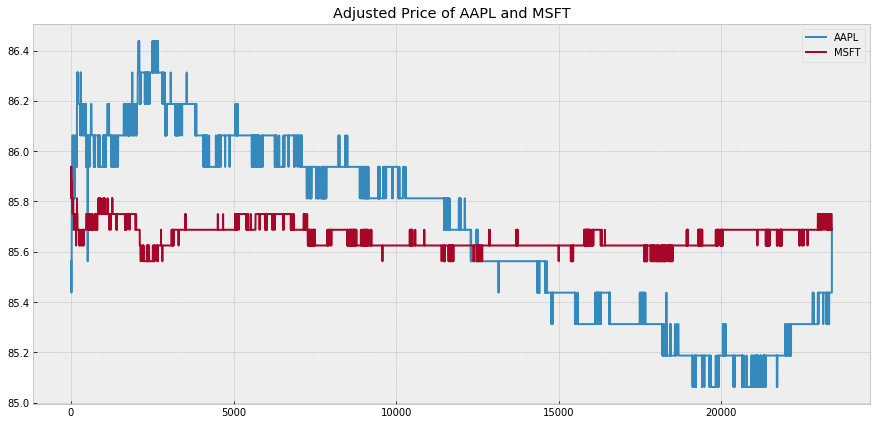

Plot z-score and trading signal of price ratio of AAPL and MSFT


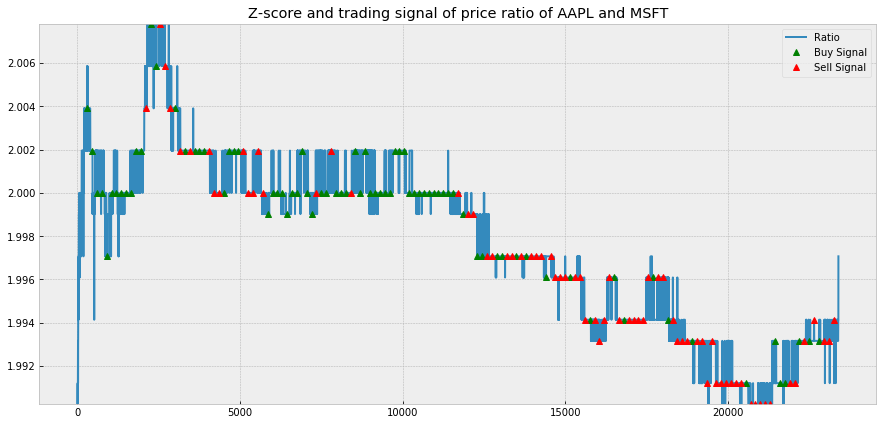

Trading signal of AAPL and MSFT for learning-based pair trading


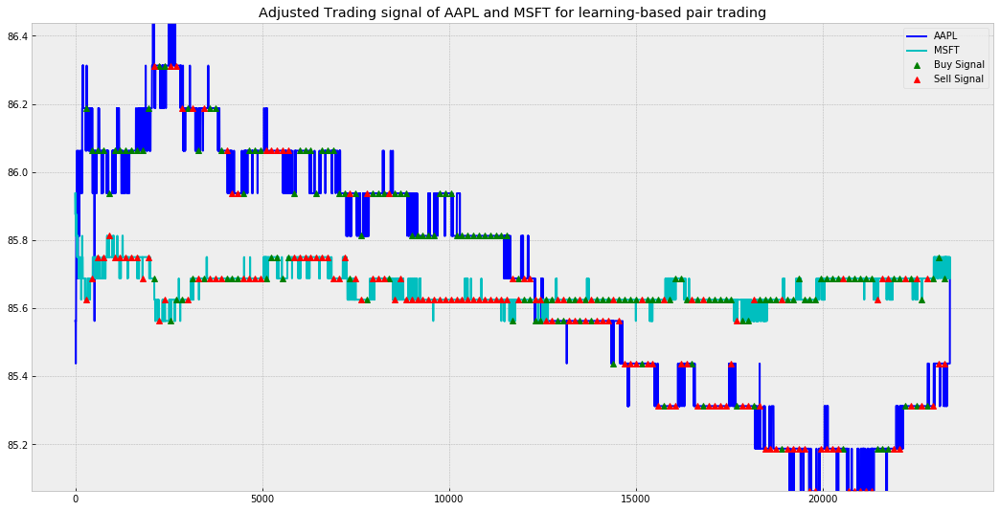

[Day 20]
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
v_inference shape for day 1 : (154, 29, 299, 1)
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
Predict...
Shape of v :  (154, 29, 299, 1) q :  (154, 61) predict_result :  (154, 4) (154, 3) (154, 3)
Prediction Finished !
[3 3 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 1 3 3 3 3 3 1 1 1 1 1 3 3 3 1 1 3 3 1
 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 3 3 2 3 3 3 1 3 3 1 1 3 1 1 1 1 1 1 1 1 3 1 2 1 3 2 2 1 1 3 3 1 1 1 3 1 3
 3 1 2 2 2 3 2 2 2 2 2 2 2 3 1 3 1 1 3 1 1 3 1 1 3 2 2 3 3 3 2 2 3 2 3 2 1
 1 3 3 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 1

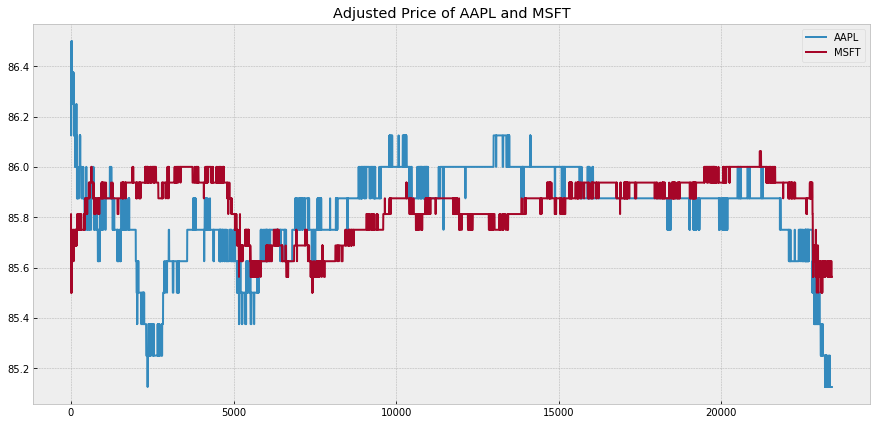

Plot z-score and trading signal of price ratio of AAPL and MSFT


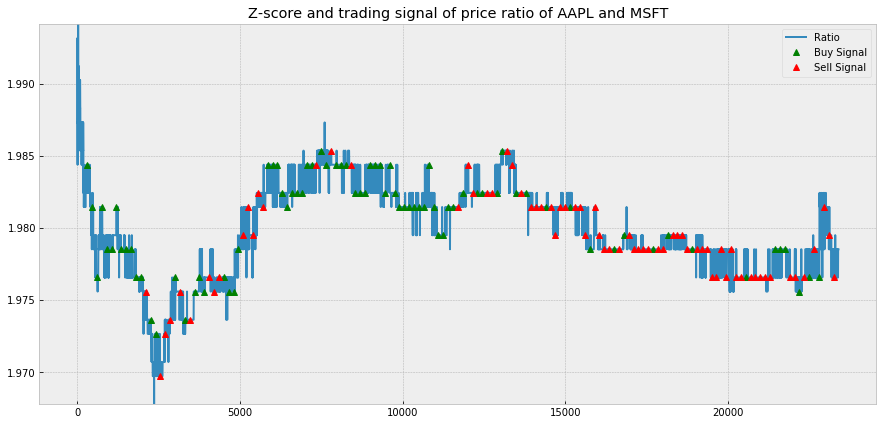

Trading signal of AAPL and MSFT for learning-based pair trading


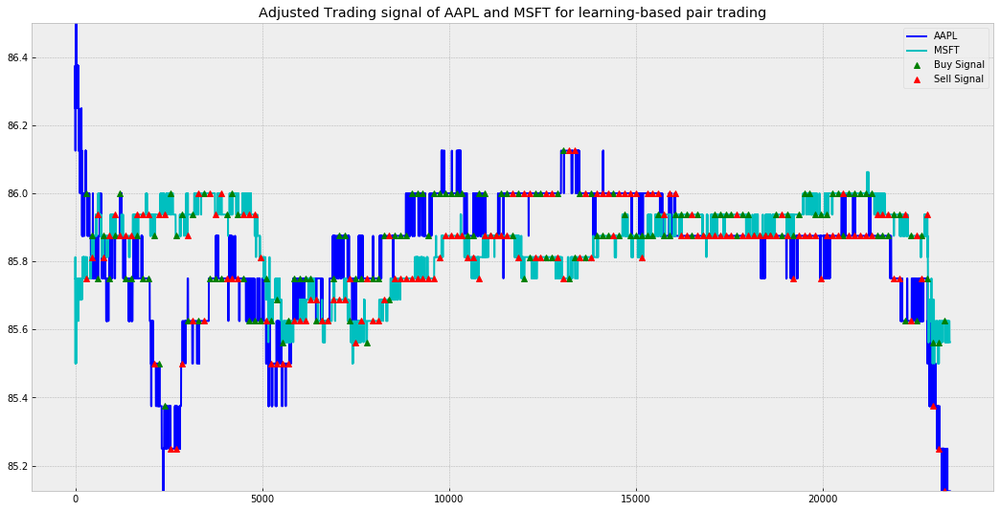

<Figure size 432x288 with 0 Axes>

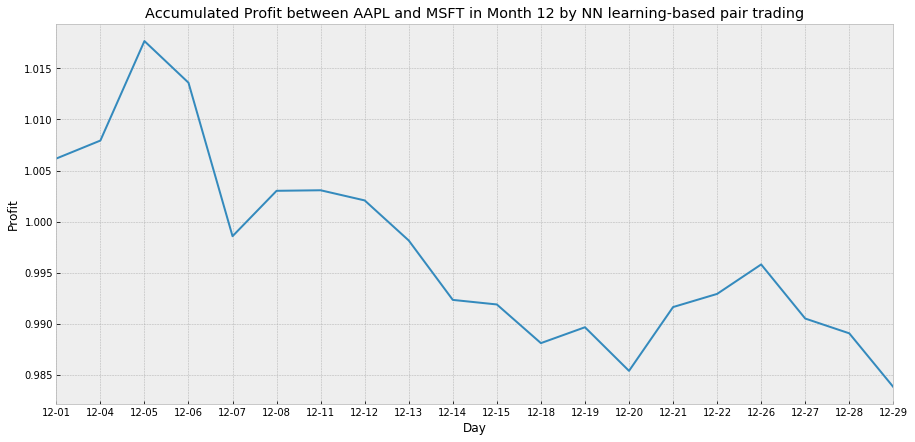

In [54]:
network = "2D Convolution based Relation Network"
profit_day_2DRN = []
signal = []
price_day_avg = []
predict_result_2DRN = {}
profit_Mode = 1
for i in range(day_test):
    print("[Day %s]" % str(i+1))
    S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
    S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
    price_day_avg.append(np.mean(S1.values) + np.mean(S2.values))
    result = NN_trade(S1, S2, p[0], p[1], price_data_for_test, price_and_return_for_test, model_2d, i, show_print = 1, fee = 0, profit_Mode = profit_Mode, model_byconv2d = 1)
    profit_day_2DRN.append(result[0])
    signal.append([result[1], result[2]])
    predict_result_2DRN[i+1] = result[3]
    drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, result[1], result[2], mode = 'NN')
predict_result = predict_result_2DRN
    
# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day_2DRN))
else:
    plt.plot(np.cumprod(profit_day_2DRN))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by NN learning-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

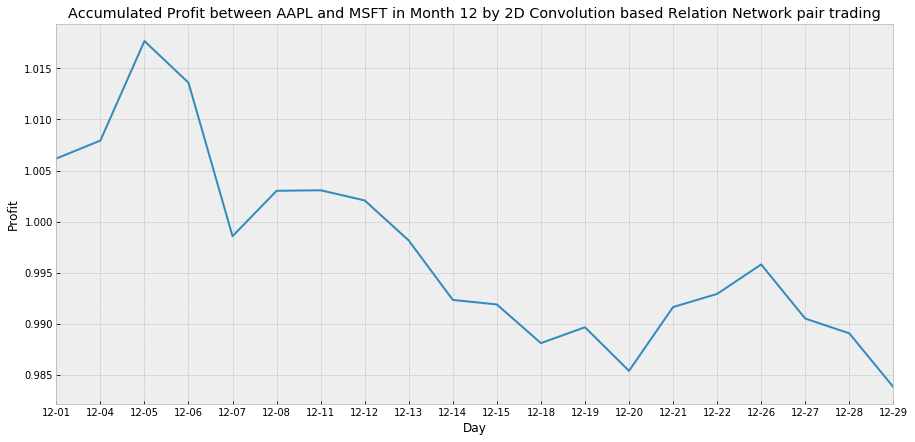

<Figure size 432x288 with 0 Axes>

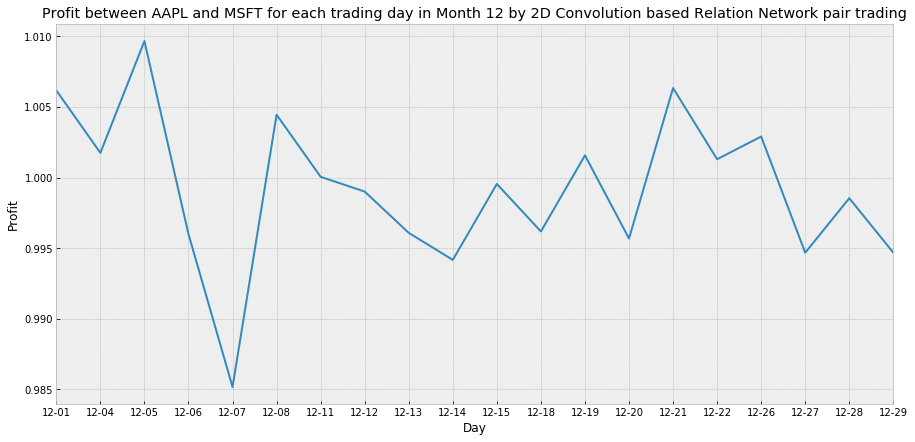

In [55]:
draw_profit(profit_day_2DRN, date_test_noyear, period_test, mode = network, profit_Mode = profit_Mode)

In [56]:
profit_day_2DRN

[1.006174446963842,
 1.0017497842718768,
 1.0096698386453027,
 0.9959925866626662,
 0.9851638375590841,
 1.0044531431367054,
 1.0000525215454017,
 0.9990080487239067,
 0.9960822809567846,
 0.9941688216039546,
 0.9995498895334202,
 0.9961804899157304,
 1.0015743949338969,
 0.9956834326069607,
 1.0063419349441123,
 1.0013001729681676,
 1.0029063216405885,
 0.994677701724665,
 0.9985379092528801,
 0.9946831188820993]

In [57]:
predict_result_2DRN

{1: (array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 1, 3, 1, 1, 1, 3, 3, 3,
         3, 3, 1, 1, 1, 1, 1, 3, 3, 3, 1, 1, 3, 3, 1, 1, 1, 3, 3, 3, 3, 3,
         3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
         3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 2, 3, 3, 3, 1, 3, 3, 1, 1, 3, 1, 1,
         1, 1, 1, 1, 1, 1, 3, 1, 2, 1, 3, 2, 2, 1, 1, 3, 3, 1, 1, 1, 3, 1,
         3, 3, 1, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 1, 3, 1, 1, 3, 1, 1,
         3, 1, 1, 3, 2, 2, 3, 3, 3, 2, 2, 3, 2, 3, 2, 1, 1, 3, 3, 1, 1, 1]),
  array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 2,
         1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2,
         1, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2,
         1, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 1,

0.9837896363011913


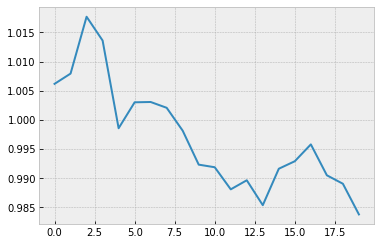

In [58]:
# profit rate
print(np.cumprod(profit_day_2DRN)[-1])
plt.plot(np.cumprod(profit_day_2DRN))

In [59]:
test_realacc_2DRN = cal_predict_true_acc(all_com_pair_P, qtype, day_test)
test_realacc_2DRN

Day 1
Index of day start :  0
Q1 real accuracy :  0.11038961038961038
Q2 real accuracy :  0.3961038961038961
Q3 real accuracy :  0.9415584415584416
Day 2
Index of day start :  375144
Q1 real accuracy :  0.15584415584415584
Q2 real accuracy :  0.44805194805194803
Q3 real accuracy :  0.935064935064935
Day 3
Index of day start :  750288
Q1 real accuracy :  0.11688311688311688
Q2 real accuracy :  0.38311688311688313
Q3 real accuracy :  0.8181818181818182
Day 4
Index of day start :  1125432
Q1 real accuracy :  0.12337662337662338
Q2 real accuracy :  0.43506493506493504
Q3 real accuracy :  0.7272727272727273
Day 5
Index of day start :  1500576
Q1 real accuracy :  0.08441558441558442
Q2 real accuracy :  0.4025974025974026
Q3 real accuracy :  0.9155844155844156
Day 6
Index of day start :  1875720
Q1 real accuracy :  0.15584415584415584
Q2 real accuracy :  0.34415584415584416
Q3 real accuracy :  0.8571428571428571
Day 7
Index of day start :  2250864
Q1 real accuracy :  0.07142857142857142
Q2 re

{1: [0.11038961038961038, 0.3961038961038961, 0.9415584415584416],
 2: [0.15584415584415584, 0.44805194805194803, 0.935064935064935],
 3: [0.11688311688311688, 0.38311688311688313, 0.8181818181818182],
 4: [0.12337662337662338, 0.43506493506493504, 0.7272727272727273],
 5: [0.08441558441558442, 0.4025974025974026, 0.9155844155844156],
 6: [0.15584415584415584, 0.34415584415584416, 0.8571428571428571],
 7: [0.07142857142857142, 0.3181818181818182, 0.9415584415584416],
 8: [0.08441558441558442, 0.38311688311688313, 0.9155844155844156],
 9: [0.09090909090909091, 0.37662337662337664, 0.9025974025974026],
 10: [0.08441558441558442, 0.4090909090909091, 0.9025974025974026],
 11: [0.09740259740259741, 0.43506493506493504, 0.8961038961038961],
 12: [0.045454545454545456, 0.33116883116883117, 0.935064935064935],
 13: [0.11688311688311688, 0.3051948051948052, 0.8636363636363636],
 14: [0.05194805194805195, 0.3961038961038961, 0.9025974025974026],
 15: [0.09090909090909091, 0.2662337662337662, 0.8

## Pair Trading累積收益圖

<Figure size 432x288 with 0 Axes>

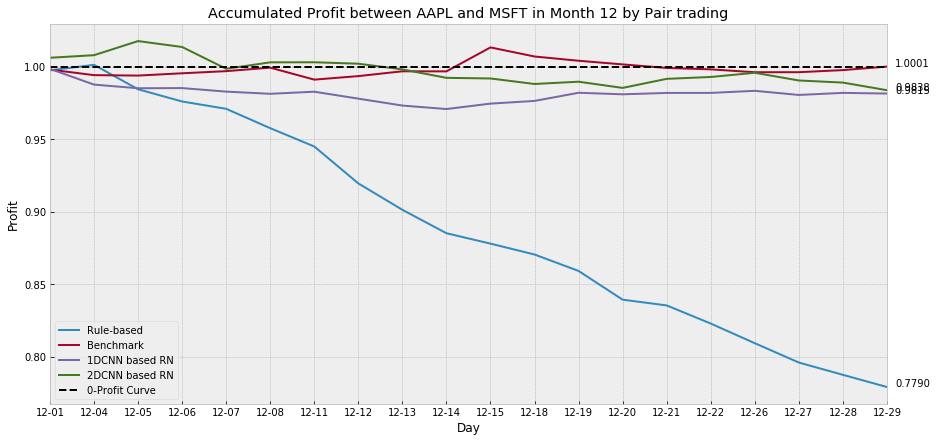

In [60]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
baseline = np.cumprod(profit_day)
plt.plot(baseline, label = 'Rule-based')
plt.plot(np.cumprod(profit_day_DNN), label = 'Benchmark')
plt.plot(np.cumprod(profit_day_1DRN), label = '1DCNN based RN')
plt.plot(np.cumprod(profit_day_2DRN), label = '2DCNN based RN')
plt.xticks(range(day_test), date_test_noyear)
profit_list = ['baseline', 'np.cumprod(profit_day_DNN)','np.cumprod(profit_day_1DRN)','np.cumprod(profit_day_2DRN)']
for i in range(len(profit_list)):
    var = eval(profit_list[i])
    plt.annotate('%.4f' % var[-1], xy=(1, var[-1]), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')
plt.axhline(1.0, color='black', linestyle='--', label = "0-Profit Curve")
plt.title('Accumulated Profit between %s and %s in Month %s by Pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,baseline.shape[0]-1)
plt.legend()
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

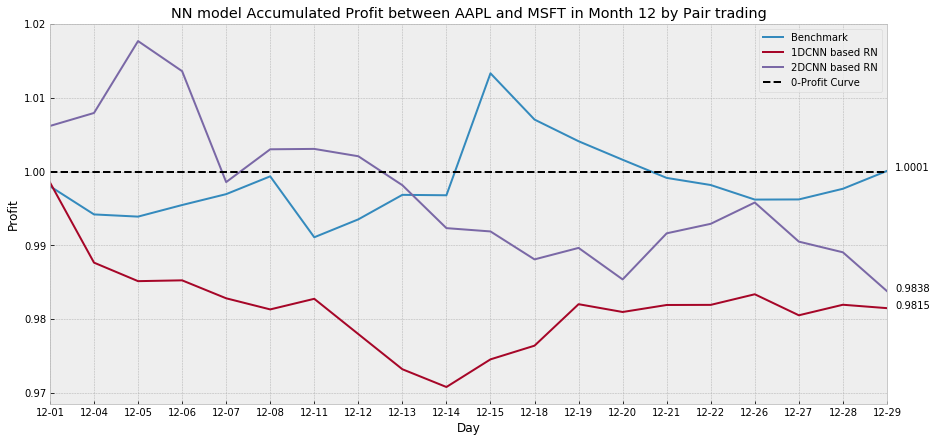

In [61]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
baseline = np.cumprod(profit_day)
#plt.plot(baseline, label = 'Rule-based')
plt.plot(np.cumprod(profit_day_DNN), label = 'Benchmark')
plt.plot(np.cumprod(profit_day_1DRN), label = '1DCNN based RN')
plt.plot(np.cumprod(profit_day_2DRN), label = '2DCNN based RN')
plt.xticks(range(day_test), date_test_noyear)
profit_list = ['baseline', 'np.cumprod(profit_day_DNN)','np.cumprod(profit_day_1DRN)','np.cumprod(profit_day_2DRN)']
for i in range(1,len(profit_list)):
    var = eval(profit_list[i])
    plt.annotate('%.4f' % var[-1], xy=(1, var[-1]), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')
plt.axhline(1.0, color='black', linestyle='--', label = "0-Profit Curve")
plt.title('NN model Accumulated Profit between %s and %s in Month %s by Pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,baseline.shape[0]-1)
plt.legend()
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

## Pair Trading各交易日收益圖

<Figure size 432x288 with 0 Axes>

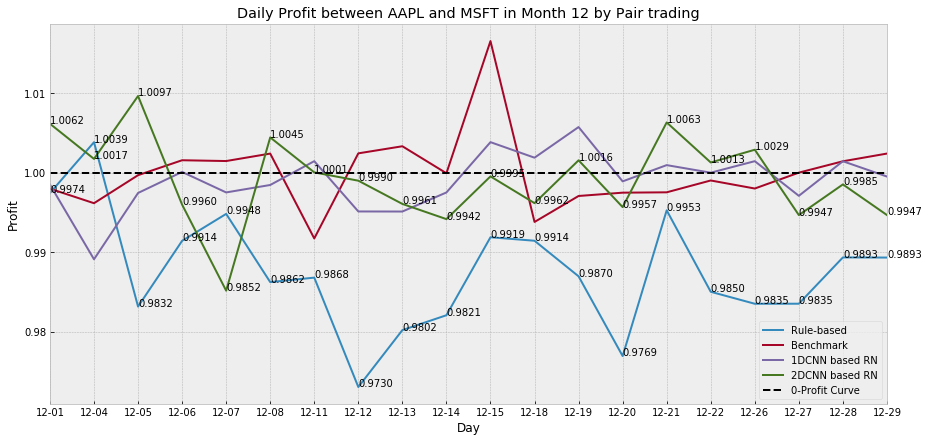

In [62]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
baseline = profit_day
plt.plot(baseline, label = 'Rule-based')
plt.plot(profit_day_DNN, label = 'Benchmark')
plt.plot(profit_day_1DRN, label = '1DCNN based RN')
plt.plot(profit_day_2DRN, label = '2DCNN based RN')
plt.xticks(range(day_test), date_test_noyear)
plt.axhline(1.0, color='black', linestyle='--', label = "0-Profit Curve")
plt.title('Daily Profit between %s and %s in Month %s by Pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
profit_list = ['baseline', 'profit_day_DNN','profit_day_1DRN','profit_day_2DRN']
for k in range(len(profit_list)):
    for i,j in zip(np.arange(day_test) , eval(profit_list[k])):
        if profit_list[k] == 'profit_day_2DRN' or profit_list[k] == 'baseline':
            plt.annotate(str('%.4f'% j), xy=(i,j))
plt.xlim(0,baseline.shape[0]-1)
plt.legend(loc = 4)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

In [63]:
profit_list = ['profit_day_DNN','profit_day_1DRN','profit_day_2DRN']
for i in range(len(profit_list)):
    print(np.where(np.array(eval(profit_list[i])) > 1)[0])

[ 3  4  5  7  8 10 17 18 19]
[ 3  6 10 11 12 14 15 16 18]
[ 0  1  2  5  6 12 14 15 16]


## Save all predicted result

In [64]:
'''
Save NN predict result
'''
import pickle

time = str(datetime.datetime.now()).split(' ')[0]
print(time)
NN_list = ['DNN','1DRN','2DRN']

fname = 'predictresult/history_%s_%s_period%dto%d_shiftlength%d.pickle' % (NN_list[0], time, period[0], period[-1], shift_length)  
with open(fname, 'wb') as handle:
    pickle.dump(bm_history, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('Save "%s" successful !' % fname)
fname = 'predictresult/history_%s_%s_period%dto%d_shiftlength%d.pickle' % (NN_list[1], time, period[0], period[-1], shift_length)  
with open(fname, 'wb') as handle:
    pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('Save "%s" successful !' % fname)
fname = 'predictresult/history_%s_%s_period%dto%d_shiftlength%d.pickle' % (NN_list[2], time, period[0], period[-1], shift_length)  
with open(fname, 'wb') as handle:
    pickle.dump(history_2d, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('Save "%s" successful !' % fname)

np.save("predictresult/profit_Rule-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day)
np.save("predictresult/profit_DNN-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day_DNN)
np.save("predictresult/profit_1DRN-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day_1DRN)
np.save("predictresult/profit_2DRN-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day_2DRN)
# save
print("[profit_Rule-basedPairTrading save completed ! ]")
print("[profit_DNN-basedPairTrading save completed ! ]")
print("[profit_1DRN-basedPairTrading save completed ! ]")
print("[profit_2DRN-basedPairTrading save completed ! ]")

load_data = 0
# load back
if load_data == 1:
    with open(fname, 'rb') as handle:
        history_b = pickle.load(handle)
    print('Open "%s" successful !' % fname)

2019-08-25
Save "predictresult/history_DNN_2019-08-25_period6to11_shiftlength150.pickle" successful !
Save "predictresult/history_1DRN_2019-08-25_period6to11_shiftlength150.pickle" successful !
Save "predictresult/history_2DRN_2019-08-25_period6to11_shiftlength150.pickle" successful !
[profit_Rule-basedPairTrading save completed ! ]
[profit_DNN-basedPairTrading save completed ! ]
[profit_1DRN-basedPairTrading save completed ! ]
[profit_2DRN-basedPairTrading save completed ! ]


# Classification Report
## F1 Score, Precision, Recall

In [65]:
from sklearn.metrics import classification_report

def classification_report_andf1test(all_com_pair_P, qtype, day, predict_result):
    """
    # 計算每種問題的F1 Score, Precision, Recall
    """
    q1_true, q2_true, q3_true = [], [], []
    q1_pred, q2_pred, q3_pred = [], [], []
    
    for d in range(day):
        print("Day %s" % str(d+1) + " processing...")
        day_start = d * int(v_test.shape[0] / day) * len(all_com_pair_P) * len(qtype)
        #print("Index of day start : ", day_start)
        qa_test_for_pairtrading = []
        for i in range(int(v_test.shape[0] / day)):
            qa_test_for_pairtrading.append(qa_whole_test[day_start + i*len(all_com_pair_P)*len(qtype):day_start + (i+1)*len(all_com_pair_P)*len(qtype),:])
        qa_test_for_pairtrading = np.vstack(qa_test_for_pairtrading)
        xxx = qa_test_for_pairtrading[:,:-10]
        q1_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q1[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q2_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q2[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q3_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(q3[0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        
        # 真實的label
        a1_true = qa_test_for_pairtrading[q1_idx][:,-10:-6]
        a2_true = qa_test_for_pairtrading[q2_idx][:,-6:-3]
        a3_true = qa_test_for_pairtrading[q3_idx][:,-3:]
        
        # 真實命中率
        q1_acc = np.sum((np.argmax(a1_true, 1) == predict_result[d+1][0]).astype(int)) / a1_true.shape[0]
        q2_acc = np.sum((np.argmax(a2_true, 1) == predict_result[d+1][1]).astype(int)) / a2_true.shape[0]
        q3_acc = np.sum((np.argmax(a3_true, 1) == predict_result[d+1][2]).astype(int)) / a3_true.shape[0]
        
        q1_true.append(np.argmax(a1_true, 1))
        q2_true.append(np.argmax(a2_true, 1))
        q3_true.append(np.argmax(a3_true, 1))
        q1_pred.append(predict_result[d+1][0])
        q2_pred.append(predict_result[d+1][1])
        q3_pred.append(predict_result[d+1][2])
    
    q1_true = np.stack(q1_true).flatten()
    q2_true = np.stack(q2_true).flatten()
    q3_true = np.stack(q3_true).flatten()
    q1_pred = np.stack(q1_pred).flatten()
    q2_pred = np.stack(q2_pred).flatten()
    q3_pred = np.stack(q3_pred).flatten()
        
    print("-----------The classification report-----------")
    target_names = ['NoChange','BothRise','BothFall','Reverse','Same','Strong','Weak','Same','Big','Small']
    print("[Q1]")
    print(classification_report(q1_true, q1_pred, target_names=target_names[:4]))
    print("[Q2]")
    print(classification_report(q2_true, q2_pred, target_names=target_names[4:7]))
    print("[Q3]")
    target_names_q3 = list(np.array(target_names)[np.add(np.unique(np.argmax(a3_true, 1)),7)])
    print(classification_report(q3_true, q3_pred, target_names=target_names_q3, labels = np.unique(np.argmax(a3_true, 1))))
    

In [66]:
print("[DNN benchmark]")
classification_report_andf1test(all_com_pair_P, qtype, day_test, predict_result_bm)
print("[1DRN]")
classification_report_andf1test(all_com_pair_P, qtype, day_test, predict_result_1DRN)
print("[2DRN]")
classification_report_andf1test(all_com_pair_P, qtype, day_test, predict_result_2DRN)

[DNN benchmark]
Day 1 processing...
Day 2 processing...
Day 3 processing...
Day 4 processing...
Day 5 processing...
Day 6 processing...
Day 7 processing...
Day 8 processing...
Day 9 processing...
Day 10 processing...
Day 11 processing...
Day 12 processing...
Day 13 processing...
Day 14 processing...
Day 15 processing...
Day 16 processing...
Day 17 processing...
Day 18 processing...
Day 19 processing...
Day 20 processing...
-----------The classification report-----------
[Q1]
              precision    recall  f1-score   support

    NoChange       0.79      0.33      0.46      2231
    BothRise       0.11      0.68      0.19       311
    BothFall       0.00      0.00      0.00       326
     Reverse       0.06      0.06      0.06       212

    accuracy                           0.31      3080
   macro avg       0.24      0.27      0.18      3080
weighted avg       0.59      0.31      0.36      3080

[Q2]
              precision    recall  f1-score   support

        Same       0.00  

/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Day 2 processing...
Day 3 processing...
Day 4 processing...
Day 5 processing...
Day 6 processing...
Day 7 processing...
Day 8 processing...
Day 9 processing...
Day 10 processing...
Day 11 processing...
Day 12 processing...
Day 13 processing...
Day 14 processing...
Day 15 processing...
Day 16 processing...
Day 17 processing...
Day 18 processing...
Day 19 processing...
Day 20 processing...
-----------The classification report-----------
[Q1]
              precision    recall  f1-score   support

    NoChange       0.74      0.83      0.78      2231
    BothRise       0.17      0.03      0.05       311
    BothFall       0.07      0.01      0.02       326
     Reverse       0.11      0.25      0.15       212

    accuracy                           0.62      3080
   macro avg       0.27      0.28      0.25      3080
weighted avg       0.57      0.62      0.58      3080

[Q2]
              precision    recall  f1-score   support

        Same       0.00      0.00      0.00       904
      S

/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Day 2 processing...
Day 3 processing...
Day 4 processing...
Day 5 processing...
Day 6 processing...
Day 7 processing...
Day 8 processing...
Day 9 processing...
Day 10 processing...
Day 11 processing...
Day 12 processing...
Day 13 processing...
Day 14 processing...
Day 15 processing...
Day 16 processing...
Day 17 processing...
Day 18 processing...
Day 19 processing...
Day 20 processing...
-----------The classification report-----------
[Q1]
              precision    recall  f1-score   support

    NoChange       0.00      0.00      0.00      2231
    BothRise       0.10      0.32      0.16       311
    BothFall       0.09      0.11      0.10       326
     Reverse       0.08      0.63      0.14       212

    accuracy                           0.09      3080
   macro avg       0.07      0.27      0.10      3080
weighted avg       0.03      0.09      0.04      3080

[Q2]
              precision    recall  f1-score   support

        Same       0.00      0.00      0.00       904
      S

/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# MDD

In [67]:
import ffn
print(ffn.calc_max_drawdown(pd.Series(np.cumprod(profit_day_DNN))))
print(ffn.calc_max_drawdown(pd.Series(np.cumprod(profit_day_1DRN))))
print(ffn.calc_max_drawdown(pd.Series(np.cumprod(profit_day_2DRN))))

-0.016891890089079986
-0.02777028064541398
-0.03330311552781884
